In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Finance Data

In [1]:
!pip install pandas_ta

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.1/115.1 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pandas_ta: filename=pandas_ta-0.3.14b0-py3-none-any.whl size=218907 sha256=93f69a8f6f030a39e7796de49a26f1052aff32fc26e5791885aaa2a184f7ef93
  Stored in directory: /root/.cache/pip/wheels/69/00/ac/f7fa862c34b0e2ef320175100c233377b4c558944f12474cf0
Successfully built pandas_ta


In [2]:
import pandas as pd
import pandas_ta as ta

# Create a DataFrame so 'ta' can be used.
df = pd.DataFrame()

# Help about this, 'ta', extension
#help(df.ta)

# List of all indicators
df.ta.indicators()

# Help about an indicator such as bbands
help(ta.bbands)
#help(ta.sma)

Pandas TA - Technical Analysis Indicators - v0.3.14b0
Total Indicators & Utilities: 205
Abbreviations:
    aberration, above, above_value, accbands, ad, adosc, adx, alma, amat, ao, aobv, apo, aroon, atr, bbands, below, below_value, bias, bop, brar, cci, cdl_pattern, cdl_z, cfo, cg, chop, cksp, cmf, cmo, coppock, cross, cross_value, cti, decay, decreasing, dema, dm, donchian, dpo, ebsw, efi, ema, entropy, eom, er, eri, fisher, fwma, ha, hilo, hl2, hlc3, hma, hwc, hwma, ichimoku, increasing, inertia, jma, kama, kc, kdj, kst, kurtosis, kvo, linreg, log_return, long_run, macd, mad, massi, mcgd, median, mfi, midpoint, midprice, mom, natr, nvi, obv, ohlc4, pdist, percent_return, pgo, ppo, psar, psl, pvi, pvo, pvol, pvr, pvt, pwma, qqe, qstick, quantile, rma, roc, rsi, rsx, rvgi, rvi, short_run, sinwma, skew, slope, sma, smi, squeeze, squeeze_pro, ssf, stc, stdev, stoch, stochrsi, supertrend, swma, t3, td_seq, tema, thermo, tos_stdevall, trima, trix, true_range, tsi, tsignals, ttm_trend, ui, 

In [3]:
import yfinance as yf

spx = yf.Ticker("^SPX")
history = spx.history(period="max")
history.ta.bbands(close="Close", append=True)
history.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,BBL_5_2.0,BBM_5_2.0,BBU_5_2.0,BBB_5_2.0,BBP_5_2.0
Date,,,,,,,,,,,,
2024-06-24 00:00:00-04:00,5459.580078,5490.660156,5447.589844,5447.870117,3696750000,0.0,0.0,5443.480441,5469.183984,5494.887528,0.939941,0.085390
2024-06-25 00:00:00-04:00,5460.729980,5472.879883,5446.560059,5469.299805,3591960000,0.0,0.0,5442.998827,5468.397949,5493.797072,0.928942,0.517754
2024-06-26 00:00:00-04:00,5460.709961,5483.140137,5451.870117,5477.899902,3563920000,0.0,0.0,5445.925130,5466.571973,5487.218815,0.755385,0.774326
2024-06-27 00:00:00-04:00,5473.589844,5490.810059,5467.540039,5482.870117,3589530000,0.0,0.0,5444.244454,5468.512012,5492.779570,0.887538,0.795829
2024-06-28 00:00:00-04:00,5488.479980,5523.640137,5451.120117,5460.479980,7199220000,0.0,0.0,5442.670684,5467.683984,5492.697285,0.914950,0.355997


In [4]:
import pandas as pd

# Assuming df is your DataFrame and it has a DateTime index
# Ensure the index is of datetime type
history.index = pd.to_datetime(history.index)

# Create a dictionary to hold DataFrames by year
dfs_by_year = {year: history.loc[history.index.year == year] for year in history.index.year.unique()}

# Example: Accessing the DataFrame for a specific year, say 2020
df_2020 = dfs_by_year[2020]
print(len(df_2020))

# Printing the DataFrame for a specific year, for example, 2020
dfs_by_year[2020]


253


,Open,High,Low,Close,Volume,Dividends,Stock Splits,BBL_5_2.0,BBM_5_2.0,BBU_5_2.0,BBB_5_2.0,BBP_5_2.0
Date,,,,,,,,,,,,
2020-01-02 00:00:00-05:00,3244.669922,3258.139893,3235.530029,3257.850098,3459930000,0.0,0.0,3213.752656,3237.970020,3262.187384,1.495836,0.910451
2020-01-03 00:00:00-05:00,3226.360107,3246.149902,3222.340088,3234.850098,3484700000,0.0,0.0,3212.726651,3236.958057,3261.189462,1.497171,0.456504
2020-01-06 00:00:00-05:00,3217.550049,3246.840088,3214.639893,3246.280029,3702460000,0.0,0.0,3212.854392,3238.210059,3263.565725,1.566030,0.659135
2020-01-07 00:00:00-05:00,3241.860107,3244.909912,3232.429932,3237.179932,3435910000,0.0,0.0,3222.040403,3241.388037,3260.735671,1.193787,0.391250
2020-01-08 00:00:00-05:00,3238.590088,3267.070068,3236.669922,3253.050049,3726840000,0.0,0.0,3228.128869,3245.842041,3263.555213,1.091438,0.703465
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-24 00:00:00-05:00,3694.030029,3703.820068,3689.320068,3703.060059,1883780000,0.0,0.0,3680.469633,3696.931982,3713.394332,0.890595,0.686124
2020-12-28 00:00:00-05:00,3723.030029,3740.510010,3723.030029,3735.360107,3535460000,0.0,0.0,3667.192370,3702.122021,3737.051673,1.887007,0.975786
2020-12-29 00:00:00-05:00,3750.010010,3756.120117,3723.310059,3727.040039,3393290000,0.0,0.0,3669.684262,3708.546045,3747.407828,2.095796,0.737946


In [5]:
import pandas as pd

def make_frame_bound(df, year):
    # Ensure the index is of datetime type
    df.index = pd.to_datetime(df.index)

    # Get all indices for the given year
    year_indices = df.loc[df.index.year == year].index

    if year == 1928:
        # Get the integer location of the 10th index of the entire dataset
        start_idx = max(df.index.get_loc(year_indices[0]), 9)
    else:
        start_idx = df.index.get_loc(year_indices[0])
    end_idx = df.index.get_loc(year_indices[-1])

    return (start_idx, end_idx)

# Example usage
# df is your main DataFrame with date index
# Assuming df is already defined and loaded with the stock price data
start_idx, end_idx = make_frame_bound(history, 1928)
print(f"Start index for 1928: {start_idx}, End index for 1928: {end_idx}")

# You can call this function for any year
start_idx, end_idx = make_frame_bound(history, 2020)
print(f"Start index for 2020: {start_idx}, End index for 2020: {end_idx}")


Start index for 1928: 9, End index for 1928: 250
Start index for 2020: 23109, End index for 2020: 23361


In [6]:
len(history)

24239

In [7]:
close = history["Close"]
history = close.round(2)
dates = history.index.strftime('%Y-%m-%d')
price = history.to_numpy()
d = [[price, dates] for price, dates in zip(price, dates)]
sd = d[10:10010]
sd[-1][0] - sd[0][0]

78.18

In [8]:
def extract_data(ticker):
    data = yf.Ticker(ticker).history(period="max")
    data.ta.bbands(close="Close", append=True)
    return data

data = extract_data("^SPX")
data.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits',
       'BBL_5_2.0', 'BBM_5_2.0', 'BBU_5_2.0', 'BBB_5_2.0', 'BBP_5_2.0'],
      dtype='object')

# Env
* Env modified from anytrading-env ([github](https://github.com/AminHP/gym-anytrading))
* Action space is discrete (Sell, No-Op, Buy), with no upper bound on "Buy",
meaning agent can unlimited amount of shares

## Env

In [9]:
!pip install gymnasium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 12.2 MB/s eta 0:00:00


In [10]:
import gymnasium as gym
import random
import numpy as np
from enum import Enum
from time import time
import matplotlib.pyplot as plt

In [11]:
class Actions(Enum):
    Sell = 0
    NO_OP = 1
    Buy = 2


class Positions(Enum):
    NO_POS = 0
    Long = 1

    def opposite(self):
        return Positions.NO_POS if self == Positions.Long else Positions.Long

In [12]:
class TradingEnv(gym.Env):

    metadata = {'render_modes': ['human'], 'render_fps': 3}

    def __init__(self, df, window_size, render_mode=None):
        assert df.ndim == 2
        assert render_mode is None or render_mode in self.metadata['render_modes']

        self.render_mode = render_mode

        self.df = df
        self.window_size = window_size
        self.prices, self.signal_features = self._process_data()
        """self.shape = (window_size, self.signal_features.shape[1])

        # spaces
        self.action_space = gym.spaces.Discrete(len(Actions))
        INF = 1e10
        self.observation_space = gym.spaces.Box(
            low=-INF, high=INF, shape=self.shape, dtype=np.float32,
        )"""

        # episode
        self._start_tick = self.window_size
        self._end_tick = len(self.prices) - 1
        self._truncated = None
        self._current_tick = None
        self._last_trade_tick = None
        self._position = None
        self._position_history = None
        self._total_reward = None
        self._total_profit = None
        self._first_rendering = None
        self._buy_price_history = np.array([])
        self.history = None

    def reset(self, seed=None, options=None):
        super().reset(seed=seed, options=options)
        self.action_space.seed(int((self.np_random.uniform(0, seed if seed is not None else 1))))

        self.year = self.random_year()
        self._truncated = False
        self._current_tick = self._start_tick
        self._last_trade_tick = self._current_tick - 1
        self._position = Positions.NO_POS
        self._position_history = (self.window_size * [None]) + [self._position]
        self._total_reward = 0.
        self._total_profit = 1.  # unit
        self._first_rendering = True
        self._buy_price_history = np.array([])
        self.history = {}

        observation = self._get_observation()
        info = self._get_info()

        if self.render_mode == 'human':
            self._render_frame()

        return observation, info

    def step(self, action):
        self._truncated = False
        self._current_tick += 1

        if self._current_tick == self._end_tick:
            self._truncated = True

        if action == Actions.Buy.value:
            self._buy_price_history = np.append(self._buy_price_history, self.prices[self._current_tick])

        step_reward = self._calculate_reward(action)
        self._total_reward += step_reward

        self._update_profit(action)

        trade = False
        if (
            self._truncated or
            action == Actions.Buy.value or
            (action == Actions.Sell.value and self._position == Positions.Long)
        ):
            trade = True


        if trade:
            if action == Actions.Buy.value and self._position == Positions.Long:
              self._position = Positions.Long
            else:
              self._position = self._position.opposite()

            self._last_trade_tick = self._current_tick

        self._position_history.append(self._position)
        observation = self._get_observation()
        info = self._get_info()
        self._update_history(info)

        if self.render_mode == 'human':
            self._render_frame()

        return observation, step_reward, False, self._truncated, info

    def _update_history(self, info):
        if not self.history:
            self.history = {key: [] for key in info.keys()}

        for key, value in info.items():
            self.history[key].append(value)

    def _render_frame(self):
        self.render()

    def render(self, mode='human'):

        def _plot_position(position, tick):
            color = None
            if position == Positions.NO_POS:
                color = 'red'
            elif position == Positions.Long:
                color = 'green'
            if color:
                plt.scatter(tick, self.prices[tick], color=color)

        start_time = time()

        if self._first_rendering:
            self._first_rendering = False
            plt.cla()
            plt.plot(self.prices)
            start_position = self._position_history[self._start_tick]
            _plot_position(start_position, self._start_tick)

        _plot_position(self._position, self._current_tick)

        plt.suptitle(
            "Total Reward: %.6f" % self._total_reward + ' ~ ' +
            "Total Profit: %.6f" % self._total_profit
        )

        end_time = time()
        process_time = end_time - start_time

        pause_time = (1 / self.metadata['render_fps']) - process_time
        assert pause_time > 0., "High FPS! Try to reduce the 'render_fps' value."

        plt.pause(pause_time)

    def render_all(self, title=None):
        plt.figure(figsize=(12, 6))
        window_ticks = np.arange(len(self._position_history))
        plt.clf()
        plt.plot(self.prices)

        short_ticks = []
        long_ticks = []
        for i, tick in enumerate(window_ticks):
            if self._position_history[i] == Positions.NO_POS and self._position_history[i-1] == Positions.Long:
                short_ticks.append(tick)
            elif self._position_history[i] == Positions.Long:
                long_ticks.append(tick)

        plt.plot(short_ticks, self.prices[short_ticks], 'ro')
        plt.plot(long_ticks, self.prices[long_ticks], 'go')

        if title:
            plt.title(title)

        plt.suptitle(
            "Total Reward: %.6f" % self._total_reward + ' ~ ' +
            "Buy Hold Profit: %.6f" % self.buy_hold_profit()
        )

    def close(self):
        plt.close()

    def save_rendering(self, filepath):
        plt.savefig(filepath)

    def pause_rendering(self):
        plt.show()

    def random_year():
        raise NotImplementedError

    def _get_observation(self):
        raise NotImplementedError

    def _get_info(self):
        raise NotImplementedError

    def _process_data(self):
        raise NotImplementedError

    def _calculate_reward(self, action):
        raise NotImplementedError

    def _update_profit(self, action):
        raise NotImplementedError

    def buy_hold_profit(self):
        raise NotImplementedError

    def max_possible_profit(self):  # trade fees are ignored
        raise NotImplementedError

In [ ]:
class StocksEnv(TradingEnv):
    def __init__(self, df, window_size, frame_bound, min_year, max_year, max_shares, render_mode=None):
        assert len(frame_bound) == 2

        self.frame_bound = frame_bound
        self.min_year = min_year
        self.max_year = max_year
        self.year = self.random_year()
        self.shape = (window_size, 1)
        self.max_shares = max_shares
        super().__init__(df, window_size, render_mode)
        self.shape = (window_size, 1)
        INF = 1e10
        self.observation_space = gym.spaces.Box(
            low=-INF, high=INF, shape=self.shape, dtype=np.float32,
        )

        self.trade_fee_bid_percent = 0.01  # unit
        self.trade_fee_ask_percent = 0.01  # unit

    def _process_data(self):
        prices = self.df.loc[:, 'Close'].to_numpy()
        self.frame_bound = self.make_frame_bound(self.year)

        prices[self.frame_bound[0] - self.window_size]  # validate index (TODO: Improve validation)
        prices = prices[self.frame_bound[0]-self.window_size:self.frame_bound[1]]

        diff = np.insert(np.diff(prices), 0, 0)
        signal_features = np.column_stack((prices))
        print(f"signal_features: {signal_features.shape}")
        return prices.astype(np.float32), signal_features.astype(np.float32)

    def _get_observation(self):
        return self.signal_features[(self._current_tick-self.window_size+1):self._current_tick+1]

    def random_year(self):
      return random.randint(self.min_year, self.max_year)

    def make_frame_bound(self, year):
      # Ensure the index is of datetime type
      self.df.index = pd.to_datetime(self.df.index)
      #print(f"Data from Year: {year}")

      # Get all indices for the given year
      year_indices = self.df.loc[self.df.index.year == year].index
      #print(f"Selected Year: {year}")
      #print(year_indices)

      start_idx = self.df.index.get_loc(year_indices[0])
      end_idx = self.df.index.get_loc(year_indices[-1])

      #print(f"start_idx: {start_idx}")
      #print(f"end_idx: {end_idx}")
      return (start_idx, end_idx)

    def _calculate_reward(self, action):
        step_reward = 0

        trade = False
        if (
            self._truncated or
            (action == Actions.Sell.value and self._position == Positions.Long)
        ):
              trade = True

        if trade:
            current_price = self.prices[self._current_tick]
            last_trade_price = self._buy_price_history.mean()
            price_diff = current_price - last_trade_price
            step_reward += price_diff

        return step_reward

    def _update_profit(self, action):
        trade = False
        if (
            (action == Actions.Sell.value and self._position == Positions.Long)
        ):
            trade = True

        if trade or self._truncated:
            current_price = self.prices[self._current_tick]
            last_trade_price = self._buy_price_history.mean()
            self._buy_price_history = np.array([])
            shares = (self._total_profit * (1 - self.trade_fee_ask_percent)) / last_trade_price
            self._total_profit = (shares * (1 - self.trade_fee_bid_percent)) * current_price

    def buy_hold_profit(self):
        """
        Percentage gain from buy and hold strategy
        """
        start_price = self.prices[self._start_tick]
        end_price = self.prices[self._end_tick]
        buy_hold_profit = (end_price * (1 - self.trade_fee_bid_percent) - start_price * (1 + self.trade_fee_ask_percent))
        max_share_profit = buy_hold_profit * self.max_shares
        return buy_hold_profit

    def max_possible_profit(self):
        current_tick = self._start_tick
        last_trade_tick = current_tick - 1
        profit = 1.

        while current_tick <= self._end_tick:
            position = None
            if self.prices[current_tick] < self.prices[current_tick - 1]:
                while (current_tick <= self._end_tick and
                       self.prices[current_tick] < self.prices[current_tick - 1]):
                    current_tick += 1
                position = Positions.NO_POS
            else:
                while (current_tick <= self._end_tick and
                       self.prices[current_tick] >= self.prices[current_tick - 1]):
                    current_tick += 1
                position = Positions.Long

            if position == Positions.Long:
                current_price = self.prices[current_tick - 1]
                last_trade_price = self.prices[last_trade_tick]
                shares = profit / last_trade_price
                profit = shares * current_price
            last_trade_tick = current_tick - 1

        return profit

In [ ]:
data= extract_data("^SPX")
env = StocksEnv(
    df=data,
    window_size=10,
    frame_bound=(10, 24232),
    min_year=1929,
    max_year=2023,
    max_shares=10
)

signal_features: (1, 261)


In [ ]:
print("env information:")
print("> shape:", env.unwrapped.shape)
print("> df.shape:", env.unwrapped.df.shape)
print("> prices.shape:", env.unwrapped.prices.shape)
print("> signal_features.shape:", env.unwrapped.signal_features.shape)
print("> buy_hold_profit:", env.unwrapped.buy_hold_profit())
print("> max_possible_profit:", env.unwrapped.max_possible_profit())

env information:
> shape: (10, 1)
> df.shape: (24239, 12)
> prices.shape: (261,)
> signal_features.shape: (1, 261)
> buy_hold_profit: 209.44429565429687
> max_possible_profit: 3.407888872367565


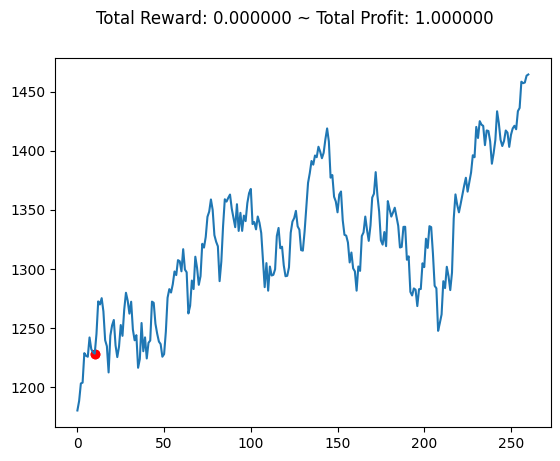

In [ ]:
env.reset()
env.render()

Action: No-Op | Current Price: 1277.300048828125 | Avg Entry Price: None | Position: Positions.NO_POS | Step Reward: 0 
Action: Buy | Current Price: 1281.06005859375 | Avg Entry Price: 1281.06005859375 | Position: Positions.Long | Step Reward: 0 
Action: Sell | Current Price: 1277.81005859375 | Avg Entry Price: None | Position: Positions.NO_POS | Step Reward: -3.25 
Action: Sell | Current Price: 1280.699951171875 | Avg Entry Price: None | Position: Positions.NO_POS | Step Reward: 0 
Action: Sell | Current Price: 1292.0799560546875 | Avg Entry Price: None | Position: Positions.NO_POS | Step Reward: 0 
Action: Sell | Current Price: 1292.47998046875 | Avg Entry Price: None | Position: Positions.NO_POS | Step Reward: 0 
Action: No-Op | Current Price: 1295.5 | Avg Entry Price: None | Position: Positions.NO_POS | Step Reward: 0 
Action: Buy | Current Price: 1289.0899658203125 | Avg Entry Price: 1289.0899658203125 | Position: Positions.Long | Step Reward: 0 
Action: Sell | Current Price: 1293

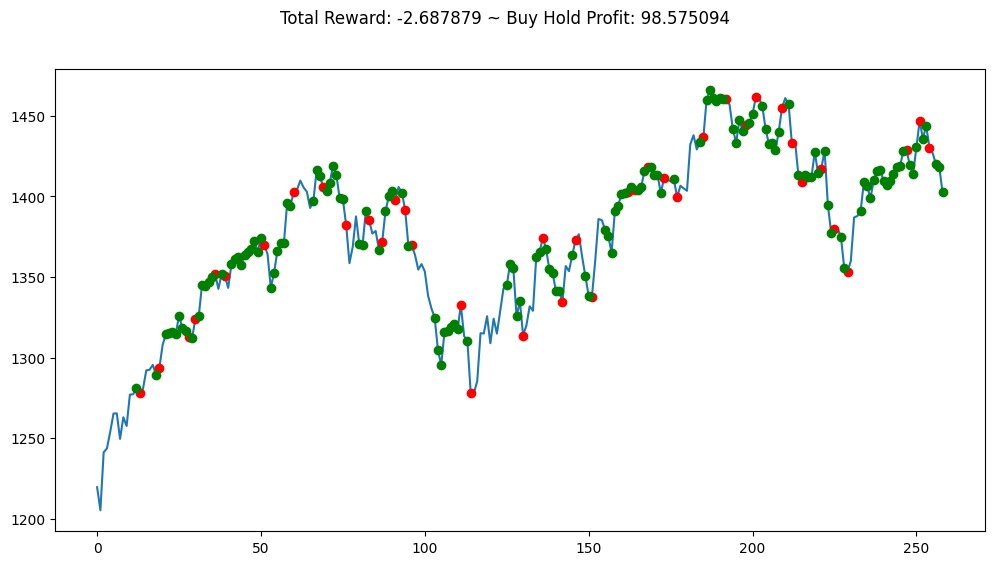

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import gymnasium as gym


observation = env.reset(seed=2023)
steps = 0
actions = 11 * [None]
prices = 11 * [None]
positions = 11 * [None]
action_binding = {
    0: 'Sell',
    1: 'No-Op',
    2: 'Buy'
}
while True:
    action = env.action_space.sample()
    observation, reward, terminated, truncated, info = env.step(action)

    actions.append(action)
    prices.append(env.prices[env._current_tick])
    avg_entry = env._buy_price_history.mean() if len(env._buy_price_history) > 0 else None
    print(f"Action: {action_binding[action]} | Current Price: {env.prices[env._current_tick]} | Avg Entry Price: {avg_entry} | Position: {env._position} | Step Reward: {reward} ")

    done = terminated or truncated
    steps += 1

    # env.render()
    if done:
        print("info:", info)
        break

env.unwrapped.render_all()

# One Hot Encoding (Price Only)

In [ ]:
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import math, copy, time
from torch.autograd import Variable
import matplotlib.pyplot as plt
import seaborn
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import Dataset
import tqdm
import yfinance as yf
from torch.utils.data import DataLoader
from torch.distributions import Categorical

#### Encoder Code

In [ ]:
def subsequent_mask(size):
  "Mask out subsequent positions."
  attn_shape = (1, size, size)
  subsequent_mask = np.triu(np.ones(attn_shape), k=1).astype('uint8')
  return torch.from_numpy(subsequent_mask) == 0

In [ ]:
def generate_square_subsequent_mask(sz):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    mask = (torch.triu(torch.ones((sz, sz), device=device)) == 1).transpose(0, 1)
    mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
    return mask

In [ ]:
class PositionalEncoding(nn.Module):
    "Implement the PE function."
    def __init__(self, d_model, dropout, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        # Compute the positional encodings once in log space.
        pe = torch.zeros(max_len, d_model)
        #print(f"pe shape: {pe.shape}")
        position = torch.arange(0, max_len).unsqueeze(1)
        #print(f"position shape: {position.shape}")
        div_term = torch.exp(torch.arange(0, d_model, 2) *
                             -(math.log(10000.0) / d_model))
        #print(f"div_term shape: {div_term.shape}")
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        #print(f"pe shape: {pe.shape}")
        self.register_buffer('pe', pe)
        self.device = "cuda" if torch.cuda.is_available() else "cpu"

    def forward(self, x):
        pos = Variable(self.pe[:, :x.size(-2)], requires_grad=False).to(self.device)
        #print(f"pos shape: {pos.shape}")
        x = x + pos
        return self.dropout(x)

In [ ]:
class StockTrainerTransformerModel(nn.Module):
  def __init__(self, d_model, device):
    super(StockTrainerTransformerModel, self).__init__()
    self.d_model = d_model
    self.device = device
    self.positional_encoding = PositionalEncoding(d_model, 0.1)
    self.transformer = nn.Transformer(d_model=d_model, nhead=8, num_encoder_layers=6, batch_first=True)

  def forward(self, data):
    if torch.is_tensor(data) is not True:
      data = torch.Tensor(data).to(self.device)
    #print(f"data shape: {data.shape}")
    pos_data = self.positional_encoding(data)
    #print(f"pos_data shape: {pos_data.shape}")
    encoder_out = self.transformer.encoder(pos_data)
    return encoder_out

In [ ]:
### Load Encoder Model
device = "cuda" if torch.cuda.is_available() else "cpu"
model = StockTrainerTransformerModel(512, device)
path = "/content/drive/MyDrive/code/fintransformer/models/encoder_45days_sp500_eval.pt"
#path = "/content/drive/MyDrive/encoder_45days_sp500_eval.pt"
def load_model(self, path):
    checkpoint = torch.load(path, map_location=torch.device(device))
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Model loaded from {path}")
    print(f"Model Accuracy: {checkpoint['acc']}")
    return model

encoder = load_model(model, path)
#encoder = model

RuntimeError: Error(s) in loading state_dict for StockTrainerTransformerModel:
	Unexpected key(s) in state_dict: "classification_network.0.weight", "classification_network.0.bias", "classification_network.2.weight", "classification_network.2.bias", "generator.0.weight", "generator.0.bias", "generator.2.weight", "generator.2.bias". 

#### Env

In [ ]:
class OneHotPriceStocksEnv(TradingEnv):
    def __init__(self, df, window_size, frame_bound, min_year, max_year, max_shares, render_mode=None):
        assert len(frame_bound) == 2

        self.frame_bound = frame_bound
        self.min_year = min_year
        self.max_year = max_year
        self.year = self.random_year()
        self.max_shares = max_shares
        self.bin_size = 20
        self.shape = (window_size, self.bin_size)
        INF = 1e10
        self.action_space = gym.spaces.Discrete(len(Actions))
        self.observation_space = gym.spaces.Box(
            low=-INF, high=INF, shape=self.shape, dtype=np.float32,
        )

        super().__init__(df, window_size, render_mode)


        self.trade_fee_bid_percent = 0.01  # unit
        self.trade_fee_ask_percent = 0.01  # unit

    def normalize(self, price):
        mean = np.mean(price)
        std = np.std(price)
        max = np.max(price)
        min = np.min(price)
        price = (price - min) / (max - min)
        return price

    def one_hot_encodings(self, data):
        bins = np.linspace(data.min(), data.max(), self.bin_size)
        idx = [(np.abs(bins - item)).argmin() for item in data]
        idx = np.array(idx)

        one_hot = np.zeros((len(idx), self.bin_size))
        one_hot[np.arange(idx.size), idx] = 1
        return one_hot

    def _process_data(self):
        prices = self.df.loc[:, 'Close'].to_numpy()
        self.frame_bound = self.make_frame_bound(self.year)

        prices[self.frame_bound[0] - self.window_size]  # validate index (TODO: Improve validation)
        raw_prices = prices.copy()
        raw_prices = raw_prices[self.frame_bound[0]-self.window_size:self.frame_bound[1]+1]

        prices = prices[self.frame_bound[0]-self.window_size:self.frame_bound[1]]
        year_prices = self.normalize(prices)
        one_hot_year_prices = self.one_hot_encodings(year_prices)
        return prices.astype(np.float32), one_hot_year_prices.astype(np.float32)

    def _get_observation(self):
        return self.signal_features[(self._current_tick-self.window_size+1):self._current_tick+1]

    def _get_info(self):
        return dict(
                total_reward=self._total_reward,
                total_profit=self._total_profit,
                position=self._position,
                buy_hold_profit=self.buy_hold_profit(),
                year=self.year
            )

    def random_year(self):
      return random.randint(self.min_year, self.max_year)

    def make_frame_bound(self, year):
      # Ensure the index is of datetime type
      self.df.index = pd.to_datetime(self.df.index)
      #print(f"Data from Year: {year}")

      # Get all indices for the given year
      year_indices = self.df.loc[self.df.index.year == year].index
      #print(f"Selected Year: {year}")
      #print(year_indices)

      start_idx = self.df.index.get_loc(year_indices[0])
      end_idx = self.df.index.get_loc(year_indices[-1])

      #print(f"start_idx: {start_idx}")
      #print(f"end_idx: {end_idx}")
      return (start_idx, end_idx)

    def _calculate_reward(self, action):
        step_reward = 0

        trade = False
        if (
            self._truncated or
            (action == Actions.Sell.value and self._position == Positions.Long)
        ):
              trade = True

        if trade and self._buy_price_history.size != 0:
            current_price = self.prices[self._current_tick]
            last_trade_price = self._buy_price_history.mean()
            price_diff = current_price - last_trade_price
            step_reward += price_diff

        return step_reward

    def _update_profit(self, action):
        trade = False
        if (
            self._truncated or
            (action == Actions.Sell.value and self._position == Positions.Long)
        ):
            trade = True

        if trade and self._buy_price_history.size != 0:

            current_price = self.prices[self._current_tick]
            last_trade_price = self._buy_price_history.mean()
            self._buy_price_history = np.array([])
            shares = (self._total_profit * (1 - self.trade_fee_ask_percent)) / last_trade_price
            self._total_profit = (shares * (1 - self.trade_fee_bid_percent)) * current_price

    def buy_hold_profit(self):
        """
        Percentage gain from buy and hold strategy
        """
        start_price = self.prices[self._start_tick]
        end_price = self.prices[self._end_tick]
        buy_hold_profit = (end_price * (1 - self.trade_fee_bid_percent) - start_price * (1 + self.trade_fee_ask_percent))
        max_share_profit = buy_hold_profit * self.max_shares
        return buy_hold_profit

    def max_possible_profit(self):
        current_tick = self._start_tick
        last_trade_tick = current_tick - 1
        profit = 1.

        while current_tick <= self._end_tick:
            position = None
            if self.prices[current_tick] < self.prices[current_tick - 1]:
                while (current_tick <= self._end_tick and
                       self.prices[current_tick] < self.prices[current_tick - 1]):
                    current_tick += 1
                position = Positions.NO_POS
            else:
                while (current_tick <= self._end_tick and
                       self.prices[current_tick] >= self.prices[current_tick - 1]):
                    current_tick += 1
                position = Positions.Long

            if position == Positions.Long:
                current_price = self.prices[current_tick - 1]
                last_trade_price = self.prices[last_trade_tick]
                shares = profit / last_trade_price
                profit = shares * current_price
            last_trade_tick = current_tick - 1

        return profit

#### Examples

In [ ]:
data= extract_data("^SPX")
env = OneHotPriceStocksEnv(
    df=data,
    window_size=10,
    frame_bound=(10, 24232),
    min_year=1929,
    max_year=2023,
    max_shares=10
)
prices, _ = env.reset()
prices.shape

(10, 20)

In [ ]:
print("env information:")
print("> shape:", env.unwrapped.shape)
print("> df.shape:", env.unwrapped.df.shape)
print("> prices.shape:", env.unwrapped.prices.shape)
print("> signal_features.shape:", env.unwrapped.signal_features.shape)
print("> max_possible_profit:", env.unwrapped.max_possible_profit())

env information:
> shape: (10, 20)
> df.shape: (24239, 12)
> prices.shape: (260,)
> signal_features.shape: (260, 20)
> max_possible_profit: 1.8328725096060605


info: {'total_reward': -2.687879435221248, 'total_profit': 0.43656903420811005, 'position': <Positions.Long: 1>, 'buy_hold_profit': 98.57509399414062, 'year': 1977}


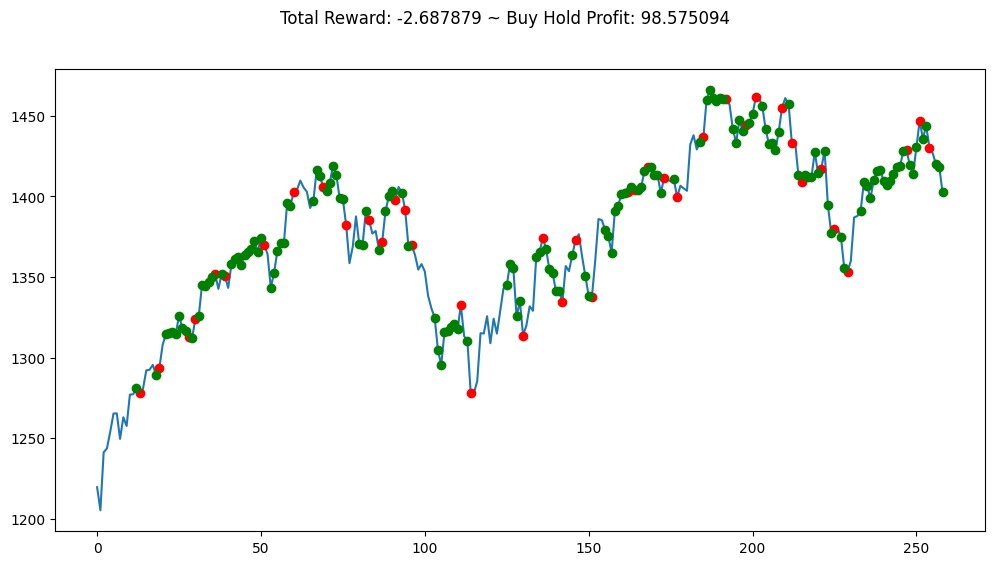

In [ ]:
env = OneHotPriceStocksEnv(
    df=data,
    window_size=10,
    frame_bound=(10, 24232),
    min_year=1929,
    max_year=2023,
    max_shares=10
)

observation, info = env.reset(seed=2023)
steps = 0
while True:
    action = env.action_space.sample()
    observation, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    steps += 1

    # env.render()
    if done:
        print("info:", info)
        break

env.unwrapped.render_all()

## Training

In [ ]:
import os
import random
import time
from dataclasses import dataclass

import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import tqdm
from torch.distributions.categorical import Categorical
from torch.utils.tensorboard import SummaryWriter
INF = 1e10

In [ ]:
def layer_init(layer, std=np.sqrt(2), bias_const=0.0):
    torch.nn.init.orthogonal_(layer.weight, std)
    torch.nn.init.constant_(layer.bias, bias_const)
    return layer

#### Encoder Stock Env

In [ ]:
### Load Encoder Model
device = "cuda" if torch.cuda.is_available() else "cpu"
model = StockTrainerTransformerModel(512, device)
path = "/content/drive/MyDrive/code/fintransformer/models/encoder_45days_sp500_eval.pt"
#path = "/content/drive/MyDrive/encoder_45days_sp500_eval.pt"
def load_model(self, path):
    model = StockTrainerTransformerModel(512, device)
    checkpoint = torch.load(path, map_location=torch.device(device))
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Model loaded from {path}")
    print(f"Model Accuracy: {checkpoint['acc']}")
    return model

#encoder = load_model(model, path)
encoder = model

In [ ]:
def make_encoder_env(min_year, max_year, ticker="^SPX"):
    def thunk():
        data= extract_data("^SPX")
        env = OneHotPriceStocksEnv(
            df=data,
            window_size=10,
            frame_bound=(10, 24232),
            min_year=min_year,
            max_year=max_year,
            max_shares=10
        )
        return env
    return thunk

In [ ]:
class EncoderAgent(nn.Module):
    def __init__(self, encoder, envs, feature_dim):
        super().__init__()
        self.encoder = encoder
        self.linear = nn.Linear(feature_dim, 512)
        self.conv = nn.Conv1d(4, 1, 1, stride=1)
        self.critic = nn.Sequential(
            nn.Conv1d(10, 1, 1, stride=1),
            nn.Tanh(),
            nn.Linear(512, 512),
            nn.Tanh(),
            nn.Linear(512, 1)
        )
        self.actor = nn.Sequential(
            nn.Conv1d(10, 1, 1, stride=1),
            nn.Tanh(),
            nn.Linear(512, 512),
            nn.Tanh(),
            nn.Linear(512, envs.single_action_space.n)
        )
        self.device = "cuda" if torch.cuda.is_available() else "cpu"

    def get_value(self, x):
        if torch.is_tensor(x) is not True:
            x = torch.Tensor(x)
        x = x.to(self.device)
        batch_size = x.size(0)
        x = self.linear(x)
        x = self.encoder(x)
        critic_out = self.critic(x).view(batch_size)
        return critic_out

    def get_action_and_value(self, x, action=None):
        if torch.is_tensor(x) is not True:
            x = torch.Tensor(x)
        x = x.to(self.device)
        batch_size = x.size(0)
        x = self.linear(x)
        #print(f"linear out shape: {x.shape}")
        x = self.encoder(x)
        #print(f"encoder out: {x.shape}")
        logits = self.actor(x).squeeze(1)
        #print(f"logits shape: {logits.shape}")
        probs = Categorical(logits=logits)
        if action is None:
            action = probs.sample()

        #print(f"batch: {batch_size}")
        critic_out = self.critic(x)
        #print(f"critic_out: {critic_out.shape}")
        return action, probs.log_prob(action), probs.entropy(), critic_out

In [ ]:
class EncoderAgent(nn.Module):
    def __init__(self, encoder, envs, feature_dim):
        super().__init__()
        self.encoder = encoder
        self.linear = nn.Linear(feature_dim, 512)
        self.conv = nn.Conv1d(4, 1, 1, stride=1)
        self.critic = nn.Sequential(
            nn.Conv1d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=0),
            nn.Tanh(),
            nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=0),
            nn.Tanh(),
            nn.Conv1d(in_channels=128, out_channels=1, kernel_size=1, stride=1, padding=0),
            nn.Tanh(),
            nn.Flatten(),
            nn.Linear(6, 1)
        )
        self.actor = nn.Sequential(
            nn.Conv1d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=0),
            nn.Tanh(),
            nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=0),
            nn.Tanh(),
            nn.Conv1d(in_channels=128, out_channels=1, kernel_size=1, stride=1, padding=0),
            nn.Tanh(),
            nn.Flatten(),
            nn.Linear(6, envs.single_action_space.n)
        )
        self.device = "cuda" if torch.cuda.is_available() else "cpu"

    def get_value(self, x):
        if torch.is_tensor(x) is not True:
            x = torch.Tensor(x)
        x = x.to(self.device)
        batch_size = x.size(0)
        x = self.linear(x)
        x = self.encoder(x)
        x = x.permute(0,2,1)
        critic_out = self.critic(x).squeeze(-1)
        return critic_out

    def get_action_and_value(self, x, action=None):
        if torch.is_tensor(x) is not True:
            x = torch.Tensor(x)
        x = x.to(self.device)
        batch_size = x.size(0)
        x = self.linear(x)
        #print(f"linear out shape: {x.shape}")
        x = self.encoder(x)
        #print(f"encoder out: {x.shape}")
        x = x.permute(0,2,1)
        logits = self.actor(x).squeeze(1)
        #print(f"logits shape: {logits.shape}")
        probs = Categorical(logits=logits)
        if action is None:
            action = probs.sample()

        #print(f"batch: {batch_size}")
        critic_out = self.critic(x)
        #print(f"critic_out: {critic_out.shape}")
        return action, probs.log_prob(action), probs.entropy(), critic_out.squeeze(-1)

In [ ]:
args = Args()
envs = gym.vector.SyncVectorEnv(
    [make_encoder_env(min_year=args.min_year, max_year=args.max_year, ticker=args.ticker) for i in range(args.num_envs)],
)
print(envs.single_observation_space.shape)

(10, 20)


In [ ]:
next_obs, _ = envs.reset()
next_obs.shape

(4, 10, 20)

In [ ]:
next_obs = torch.Tensor(next_obs).to(device)
encoder = StockTrainerTransformerModel(512, device)
agent = EncoderAgent(encoder, envs, 20).to(device)
a, p, _, c = agent.get_action_and_value(next_obs)

In [ ]:
a.shape

torch.Size([4])

In [ ]:
@dataclass
class Args():
    exp_name: str = "S&P500_discrete_env_one_hot_encoder_run2"
    """the name of this experiment"""
    ticker: str = "^SPX"
    """Ticker of equity"""
    seed: int = 1
    """seed of the experiment"""
    torch_deterministic: bool = True
    """if toggled, `torch.backends.cudnn.deterministic=False`"""
    cuda: bool = True
    """if toggled, cuda will be enabled by default"""
    min_year: int = 1929
    max_year: int = 2023
    feature_dim: int = 20
    d_model: int = 512

    # Algorithm specific arguments
    env_id: str = "stocks-v0"
    """the id of the environment"""
    total_timesteps: int = 10000
    """total timesteps of the experiments"""
    learning_rate: float = 2.5e-4
    """the learning rate of the optimizer"""
    num_envs: int = 4
    """the number of parallel game environments"""
    num_steps: int = 365
    """the number of steps to run in each environment per policy rollout"""
    anneal_lr: bool = True
    """Toggle learning rate annealing for policy and value networks"""
    gamma: float = 0.99
    """the discount factor gamma"""
    gae_lambda: float = 0.95
    """the lambda for the general advantage estimation"""
    num_minibatches: int = 4
    """the number of mini-batches"""
    update_epochs: int = 4
    """the K epochs to update the policy"""
    norm_adv: bool = True
    """Toggles advantages normalization"""
    clip_coef: float = 0.2
    """the surrogate clipping coefficient"""
    clip_vloss: bool = True
    """Toggles whether or not to use a clipped loss for the value function, as per the paper."""
    ent_coef: float = 0.01
    """coefficient of the entropy"""
    vf_coef: float = 0.5
    """coefficient of the value function"""
    max_grad_norm: float = 0.5
    """the maximum norm for the gradient clipping"""
    target_kl: float = None
    """the target KL divergence threshold"""

    # to be filled in runtime
    batch_size: int = int(num_envs * num_steps)
    """the batch size (computed in runtime)"""
    minibatch_size: int = int(batch_size // num_minibatches)
    """the mini-batch size (computed in runtime)"""
    num_iterations: int = 1000
    """the number of iterations (computed in runtime)"""

In [ ]:
args = Args
run_name = f"{args.env_id}__{args.exp_name}"

writer = SummaryWriter(f"/content/drive/MyDrive/code/fintransformer/rl_runs/{run_name}") ## main account
#writer = SummaryWriter(f"/content/drive/MyDrive/finrl/{run_name}") ## snu account
writer.add_text(
    "hyperparameters",
    "|param|value|\n|-|-|\n%s" % ("\n".join([f"|{key}|{value}|" for key, value in vars(args).items()])),
)

device = "cuda" if torch.cuda.is_available() else "cpu"


pretrained_encoder_path = "/content/drive/MyDrive/code/fintransformer/models/encoder_45days_sp500_eval.pt"
try:
  encoder = load_model(model, pretrained_encoder_path)
  print(f"Loaded pretrained encoder model from: {pretrained_encoder_path}")
except:
  encoder = StockTrainerTransformerModel(args.d_model, device)
  print("Encoder model is freshly loaded")

# TRY NOT TO MODIFY: seeding
"""random.seed(args.seed)
np.random.seed(args.seed)
torch.manual_seed(args.seed)"""
torch.backends.cudnn.deterministic = args.torch_deterministic


envs = gym.vector.SyncVectorEnv(
    [make_encoder_env(min_year=args.min_year, max_year=args.max_year, ticker=args.ticker) for i in range(args.num_envs)],
)
assert isinstance(envs.single_action_space, gym.spaces.Discrete), "only discrete action space is supported"

agent = EncoderAgent(encoder, envs, args.feature_dim).to(device)
optimizer = optim.Adam(agent.parameters(), lr=args.learning_rate, eps=1e-5)

# ALGO Logic: Storage setup
obs = torch.zeros((args.num_steps, args.num_envs) + envs.single_observation_space.shape).to(device)
actions = torch.zeros((args.num_steps, args.num_envs) + envs.single_action_space.shape).to(device)
logprobs = torch.zeros((args.num_steps, args.num_envs)).to(device)
rewards = torch.zeros((args.num_steps, args.num_envs)).to(device)
dones = torch.zeros((args.num_steps, args.num_envs)).to(device)
values = torch.zeros((args.num_steps, args.num_envs)).to(device)

# TRY NOT TO MODIFY: start the game
global_step = 0
start_time = time.time()
next_obs, _ = envs.reset(seed=args.seed)
next_obs = torch.Tensor(next_obs).to(device)
next_done = torch.zeros(args.num_envs).to(device)

loop_range = tqdm.tqdm(range(0, args.num_iterations + 1))
for iteration in loop_range:
    # Annealing the rate if instructed to do so.
    if args.anneal_lr:
        frac = 1.0 - (iteration - 1.0) / args.num_iterations
        lrnow = frac * args.learning_rate
        optimizer.param_groups[0]["lr"] = lrnow


    for step in range(0, args.num_steps):
        global_step += args.num_envs
        obs[step] = next_obs
        dones[step] = next_done

        # ALGO LOGIC: action logic
        with torch.no_grad():
            action, logprob, _, value = agent.get_action_and_value(next_obs)
            values[step] = value.flatten()
        actions[step] = action
        logprobs[step] = logprob

        # TRY NOT TO MODIFY: execute the game and log data.
        next_obs, reward, terminations, truncations, infos = envs.step(action.cpu().numpy())
        #print(f"Action: {action.cpu().numpy()} | Obs: {next_obs} | reard: {reward}")
        next_done = np.logical_or(terminations, truncations)
        rewards[step] = torch.tensor(reward).to(device).view(-1)
        next_obs, next_done = torch.Tensor(next_obs).to(device), torch.Tensor(next_done).to(device)

        #print(f"next_done: {next_done}")
        for idx, d in enumerate(next_done):

            if d:
              for info in infos['final_info']:
                if info is not None:
                  print(f"Year={info['year']} | Episodic_return={info['total_reward']} | Buy Hold Profit={info['buy_hold_profit']}")
                  writer.add_scalar(f"charts/episodic_reward", info["total_reward"], global_step)
                  writer.add_scalar(f"charts/episodic_profit", info["total_profit"], global_step)
                  comparison_benchmark = info["total_reward"] - info["buy_hold_profit"]
                  writer.add_scalar(f"charts/comparison_buyNhold", comparison_benchmark, global_step)

    # bootstrap value if not done
    with torch.no_grad():
        next_value = agent.get_value(next_obs).reshape(1, -1)
        advantages = torch.zeros_like(rewards).to(device)
        lastgaelam = 0
        for t in reversed(range(args.num_steps)):
            if t == args.num_steps - 1:
                nextnonterminal = 1.0 - next_done
                nextvalues = next_value
            else:
                nextnonterminal = 1.0 - dones[t + 1]
                nextvalues = values[t + 1]
            delta = rewards[t] + args.gamma * nextvalues * nextnonterminal - values[t]
            advantages[t] = lastgaelam = delta + args.gamma * args.gae_lambda * nextnonterminal * lastgaelam
        returns = advantages + values

    # flatten the batch
    b_obs = obs.reshape((-1,) + envs.single_observation_space.shape)
    b_logprobs = logprobs.reshape(-1)
    b_actions = actions.reshape((-1,) + envs.single_action_space.shape)
    b_advantages = advantages.reshape(-1)
    b_returns = returns.reshape(-1)
    b_values = values.reshape(-1)

    # Optimizing the policy and value network
    b_inds = np.arange(args.batch_size)
    clipfracs = []
    for epoch in range(args.update_epochs):
        np.random.shuffle(b_inds)
        for start in range(0, args.batch_size, args.minibatch_size):
            end = start + args.minibatch_size
            mb_inds = b_inds[start:end]

            _, newlogprob, entropy, newvalue = agent.get_action_and_value(b_obs[mb_inds], b_actions.long()[mb_inds])
            logratio = newlogprob - b_logprobs[mb_inds]
            ratio = logratio.exp()

            with torch.no_grad():
                # calculate approx_kl http://joschu.net/blog/kl-approx.html
                old_approx_kl = (-logratio).mean()
                approx_kl = ((ratio - 1) - logratio).mean()
                clipfracs += [((ratio - 1.0).abs() > args.clip_coef).float().mean().item()]

            mb_advantages = b_advantages[mb_inds]
            if args.norm_adv:
                mb_advantages = (mb_advantages - mb_advantages.mean()) / (mb_advantages.std() + 1e-8)

            # Policy loss
            pg_loss1 = -mb_advantages * ratio
            pg_loss2 = -mb_advantages * torch.clamp(ratio, 1 - args.clip_coef, 1 + args.clip_coef)
            pg_loss = torch.max(pg_loss1, pg_loss2).mean()

            # Value loss
            newvalue = newvalue.view(-1)
            if args.clip_vloss:
                v_loss_unclipped = (newvalue - b_returns[mb_inds]) ** 2
                v_clipped = b_values[mb_inds] + torch.clamp(
                    newvalue - b_values[mb_inds],
                    -args.clip_coef,
                    args.clip_coef,
                )
                v_loss_clipped = (v_clipped - b_returns[mb_inds]) ** 2
                v_loss_max = torch.max(v_loss_unclipped, v_loss_clipped)
                v_loss = 0.5 * v_loss_max.mean()
            else:
                v_loss = 0.5 * ((newvalue - b_returns[mb_inds]) ** 2).mean()

            entropy_loss = entropy.mean()
            loss = pg_loss - args.ent_coef * entropy_loss + v_loss * args.vf_coef

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(agent.parameters(), args.max_grad_norm)
            optimizer.step()

        if args.target_kl is not None and approx_kl > args.target_kl:
            break

    y_pred, y_true = b_values.cpu().numpy(), b_returns.cpu().numpy()
    var_y = np.var(y_true)
    explained_var = np.nan if var_y == 0 else 1 - np.var(y_true - y_pred) / var_y

    # TRY NOT TO MODIFY: record rewards for plotting purposes
    writer.add_scalar("charts/learning_rate", optimizer.param_groups[0]["lr"], global_step)
    writer.add_scalar("losses/value_loss", v_loss.item(), global_step)
    writer.add_scalar("losses/policy_loss", pg_loss.item(), global_step)
    writer.add_scalar("losses/entropy", entropy_loss.item(), global_step)
    writer.add_scalar("losses/old_approx_kl", old_approx_kl.item(), global_step)
    writer.add_scalar("losses/approx_kl", approx_kl.item(), global_step)
    writer.add_scalar("losses/clipfrac", np.mean(clipfracs), global_step)
    writer.add_scalar("losses/explained_variance", explained_var, global_step)
    print("SPS:", int(global_step / (time.time() - start_time)))
    writer.add_scalar("charts/SPS", int(global_step / (time.time() - start_time)), global_step)

envs.close()
writer.close()

Encoder model is freshly loaded


  0%|          | 0/1001 [00:00<?, ?it/s]

Year=1980 | Episodic_return=90.67918831961458 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-2.3993277443779846 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=90.67918831961458 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-2.3993277443779846 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=-32.781837972005235 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=99.50798347109856 | Buy Hold Profit=119.37419555664064


  0%|          | 1/1001 [00:04<1:08:57,  4.14s/it]

SPS: 352
Year=2019 | Episodic_return=195.6433355869392 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.752546844785165 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=195.6433355869392 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.752546844785165 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=-36.57317741030727 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=8.861417473687084 | Buy Hold Profit=119.37419555664064


  0%|          | 2/1001 [00:07<1:00:51,  3.66s/it]

SPS: 391
Year=1960 | Episodic_return=111.56754668264637 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.1959341790941096 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=111.56754668264637 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.1959341790941096 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=22.53665428326761 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=60.211001199389216 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=-3.0023290152504387 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-6.484942203785955 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-3.0023290152504387 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-6.484942203785955 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=-15.572359460497665 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=114.42785880806196 | Buy Hold Pro

  0%|          | 3/1001 [00:10<58:44,  3.53s/it]  

SPS: 403
Year=2002 | Episodic_return=13.286943126860024 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-4.983416000245107 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=13.286943126860024 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-4.983416000245107 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=-80.59022489275256 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=36.706108162425494 | Buy Hold Profit=119.37419555664064


  0%|          | 4/1001 [00:14<57:42,  3.47s/it]

SPS: 410
Year=2022 | Episodic_return=29.884968029813535 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=0.8915121720466743 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=29.884968029813535 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=0.8915121720466743 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=30.516628187130692 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=64.34355512346531 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=37.912666001533466 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-4.1551972389221135 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=37.912666001533466 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-4.1551972389221135 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=14.444683468531053 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=98.54453495182031 | Buy Hold Profit=

  0%|          | 5/1001 [00:17<57:16,  3.45s/it]

SPS: 413
Year=1970 | Episodic_return=29.139169041175137 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-5.408429575257543 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=29.139169041175137 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-5.408429575257543 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=33.626948521718276 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=9.47038753228776 | Buy Hold Profit=119.37419555664064


  1%|          | 6/1001 [00:21<57:21,  3.46s/it]

SPS: 414
Year=2014 | Episodic_return=125.64536336923561 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-1.3721180853905608 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=125.64536336923561 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-1.3721180853905608 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=-38.139121046520415 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=57.89770488436261 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=203.57822487075543 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-2.326097225007551 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=203.57822487075543 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-2.326097225007551 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-5.799524349636442 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=32.285854716877225 | Buy Hold Profi

  1%|          | 7/1001 [00:24<56:56,  3.44s/it]

SPS: 417
Year=2007 | Episodic_return=-60.66085880824528 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-2.5819380942088017 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=-60.66085880824528 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-2.5819380942088017 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-24.5462853254501 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=69.59116837939291 | Buy Hold Profit=119.37419555664064


  1%|          | 8/1001 [00:27<56:26,  3.41s/it]

SPS: 419
Year=1968 | Episodic_return=98.17089938539482 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-1.7520236936389892 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=98.17089938539482 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-1.7520236936389892 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=18.443215312107014 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=68.1580850344651 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=18.041119974859953 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-2.622581852454502 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=18.041119974859953 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-2.622581852454502 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=-28.025444630214196 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=108.95456298343709 | Buy Hold Profit=1

  1%|          | 9/1001 [00:31<56:34,  3.42s/it]

SPS: 419
Year=1982 | Episodic_return=201.65401021665934 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-0.10850523085821351 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=201.65401021665934 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-0.10850523085821351 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=51.75793436223813 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=62.51838562540172 | Buy Hold Profit=119.37419555664064


  1%|          | 10/1001 [00:34<56:16,  3.41s/it]

SPS: 420
Year=1967 | Episodic_return=-65.00620524088527 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-5.077179209391275 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=-65.00620524088527 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-5.077179209391275 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=26.99513563676311 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=41.28124304877406 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=335.7859109545511 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.1833861668904575 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=335.7859109545511 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.1833861668904575 | Buy Hold Profit=-7.477798957824703


  1%|          | 11/1001 [00:37<55:19,  3.35s/it]

SPS: 423
Year=1940 | Episodic_return=-0.803710428873643 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=25.96006702241459 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=227.0950100368923 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=1.0882318814595564 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=227.0950100368923 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=1.0882318814595564 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=12.988789149693076 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=80.42324320475268 | Buy Hold Profit=119.37419555664064


  1%|          | 12/1001 [00:41<55:35,  3.37s/it]

SPS: 423
Year=1950 | Episodic_return=110.31026713053382 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.301532309395917 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=110.31026713053382 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.301532309395917 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-26.99171837700746 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=45.909166390555356 | Buy Hold Profit=119.37419555664064


  1%|▏         | 13/1001 [00:44<55:37,  3.38s/it]

SPS: 424
Year=1971 | Episodic_return=113.56399710518986 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=1.3134993235270116 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=113.56399710518986 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=1.3134993235270116 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-38.51483815511065 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=33.90300859723777 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=132.4024709065758 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-3.098562603905087 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=132.4024709065758 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-3.098562603905087 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=49.431477924815425 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=55.51972031366256 | Buy Hold Profit=119.

  1%|▏         | 14/1001 [00:48<55:50,  3.40s/it]

SPS: 424
Year=1997 | Episodic_return=132.9740013353752 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-6.936859477650039 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=132.9740013353752 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-6.936859477650039 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=-116.94137708875866 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=78.34364217122379 | Buy Hold Profit=119.37419555664064


  1%|▏         | 15/1001 [00:51<55:42,  3.39s/it]

SPS: 424
Year=2017 | Episodic_return=181.90181957426512 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.644782083271899 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=181.90181957426512 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.644782083271899 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=25.26994247436525 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=39.02662523057734 | Buy Hold Profit=119.37419555664064
Year=1990 | Episodic_return=49.04877443520036 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-5.195846970876062 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=49.04877443520036 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-5.195846970876062 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=-7.510482570103193 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=39.26441445822252 | Buy Hold Profit=119.3

  2%|▏         | 16/1001 [00:54<55:44,  3.40s/it]

SPS: 425
Year=2013 | Episodic_return=-5.633875383649411 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.7103334108988477 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=-5.633875383649411 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.7103334108988477 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=-41.15732280846797 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=84.06480233328682 | Buy Hold Profit=119.37419555664064


  2%|▏         | 17/1001 [00:58<55:36,  3.39s/it]

SPS: 425
Year=1966 | Episodic_return=247.73552856445303 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-5.830580075581871 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=247.73552856445303 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-5.830580075581871 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=56.49408918438539 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=65.51961909702845 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=132.62032935732896 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-2.765024029537713 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=132.62032935732896 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-2.765024029537713 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=-3.5284827701629524 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=66.35622682117298 | Buy Hold Profit=11

  2%|▏         | 18/1001 [01:01<55:39,  3.40s/it]

SPS: 425
Year=2001 | Episodic_return=115.60263129340285 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.8790545675489625 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=115.60263129340285 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.8790545675489625 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=-7.015640489982843 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=72.42060035166105 | Buy Hold Profit=119.37419555664064


  2%|▏         | 19/1001 [01:05<55:23,  3.38s/it]

SPS: 426
Year=1972 | Episodic_return=29.51735810779394 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=1.1075176329839778 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=29.51735810779394 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=1.1075176329839778 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=24.025069221617628 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=41.38094889322906 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=-68.0468357895362 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=2.824188731965563 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=-68.0468357895362 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=2.824188731965563 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-9.106065223330603 | Buy Hold Profit=-3.5330963134765625


  2%|▏         | 20/1001 [01:08<54:50,  3.35s/it]

SPS: 427
Year=1987 | Episodic_return=101.31218397352427 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=229.64096573998938 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.1492895974053283 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=229.64096573998938 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.1492895974053283 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=-3.514284660702657 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=68.19726170131139 | Buy Hold Profit=119.37419555664064


  2%|▏         | 21/1001 [01:11<54:37,  3.34s/it]

SPS: 427
Year=1953 | Episodic_return=34.01700507269993 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-1.9514908366733081 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=34.01700507269993 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-1.9514908366733081 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=26.98745480492002 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=99.37516017104656 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=67.72163783482108 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-3.723537010616731 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=67.72163783482108 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-3.723537010616731 | Buy Hold Profit=-7.477798957824703


  2%|▏         | 22/1001 [01:15<54:43,  3.35s/it]

SPS: 427
Year=1932 | Episodic_return=-11.107588746812667 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=108.97020362975093 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=141.4618743896483 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-2.198453028515125 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=141.4618743896483 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-2.198453028515125 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=59.55532162984207 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=-35.627849324544286 | Buy Hold Profit=119.37419555664064


  2%|▏         | 23/1001 [01:18<54:55,  3.37s/it]

SPS: 427
Year=1973 | Episodic_return=83.57093657165046 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=1.0549706776936816 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=83.57093657165046 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=1.0549706776936816 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=20.428958565848205 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=72.67907401842967 | Buy Hold Profit=119.37419555664064
Year=1967 | Episodic_return=212.980697602629 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-0.24132000233703366 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=212.980697602629 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-0.24132000233703366 | Buy Hold Profit=-7.477798957824703


  2%|▏         | 24/1001 [01:21<55:15,  3.39s/it]

SPS: 427
Year=1951 | Episodic_return=21.968862999810085 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=62.00661193935707 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=201.05007382347435 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-6.443683323027599 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=201.05007382347435 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-6.443683323027599 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=22.302278661246334 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=65.22165951198997 | Buy Hold Profit=119.37419555664064


  2%|▏         | 25/1001 [01:25<55:11,  3.39s/it]

SPS: 427
Year=2023 | Episodic_return=105.48708801269504 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.6407365481058633 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=105.48708801269504 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.6407365481058633 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=13.826692269065092 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=48.33762576060542 | Buy Hold Profit=119.37419555664064


  3%|▎         | 26/1001 [01:28<55:00,  3.39s/it]

SPS: 428
Year=2012 | Episodic_return=218.8078073317605 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=0.9225008555821077 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=218.8078073317605 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=0.9225008555821077 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=-73.12245259779866 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=79.56391449168882 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=204.12450641450425 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-2.949294319834557 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=204.12450641450425 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-2.949294319834557 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=33.74771572672782 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=89.12102987116043 | Buy Hold Profit=119.3

  3%|▎         | 27/1001 [01:32<55:01,  3.39s/it]

SPS: 428
Year=2010 | Episodic_return=79.37158498612666 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.26058860611635 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=79.37158498612666 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.26058860611635 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=-13.895318811937699 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=141.2510347821733 | Buy Hold Profit=119.37419555664064


  3%|▎         | 28/1001 [01:35<54:58,  3.39s/it]

SPS: 428
Year=1944 | Episodic_return=153.09300411163827 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.0011427371533017 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=153.09300411163827 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.0011427371533017 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=-9.670707884289044 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=115.84972025553395 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=123.31644555954722 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.988569957766188 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=123.31644555954722 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.988569957766188 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=10.110511753881156 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=-7.1973878862391985 | Buy Hold Prof

  3%|▎         | 29/1001 [01:38<54:20,  3.35s/it]

SPS: 428
Year=1977 | Episodic_return=74.76168162027966 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-1.1186877476765176 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=74.76168162027966 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-1.1186877476765176 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=-16.394140625000006 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=113.66045774429551 | Buy Hold Profit=119.37419555664064


  3%|▎         | 30/1001 [01:42<53:51,  3.33s/it]

SPS: 429
Year=1953 | Episodic_return=48.00848999023458 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-6.505072950938398 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=48.00848999023458 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-6.505072950938398 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=38.902924071239795 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=27.865868559337855 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=84.34265238443993 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-5.929264291127524 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=84.34265238443993 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-5.929264291127524 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=3.0224145577313664 | Buy Hold Profit=-3.5330963134765625


  3%|▎         | 31/1001 [01:45<54:15,  3.36s/it]

SPS: 429
Year=1994 | Episodic_return=24.705519951714336 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=172.01360861157616 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-8.956128987811866 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=172.01360861157616 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-8.956128987811866 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=50.09167648287479 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=69.94899088541672 | Buy Hold Profit=119.37419555664064


  3%|▎         | 32/1001 [01:48<54:13,  3.36s/it]

SPS: 429
Year=1952 | Episodic_return=45.46515581992912 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-6.493304064917183 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=45.46515581992912 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-6.493304064917183 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=-24.87986411442833 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=35.56058358196549 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=40.64699307396347 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-3.6937921009366548 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=40.64699307396347 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-3.6937921009366548 | Buy Hold Profit=-7.477798957824703


  3%|▎         | 33/1001 [01:52<54:13,  3.36s/it]

SPS: 429
Year=1958 | Episodic_return=22.198294951423748 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=87.61906463238392 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=88.06673482259055 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-1.3900502888940736 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=88.06673482259055 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-1.3900502888940736 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=34.78495300920494 | Buy Hold Profit=-3.5330963134765625
Year=1978 | Episodic_return=123.7008036779979 | Buy Hold Profit=119.37419555664064


  3%|▎         | 34/1001 [01:55<54:11,  3.36s/it]

SPS: 429
Year=1965 | Episodic_return=138.31664199177033 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-1.9696265960607846 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=138.31664199177033 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-1.9696265960607846 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=-11.492642502557743 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=49.38186644847269 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=177.80727340896397 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-3.2132243340414277 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=177.80727340896397 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-3.2132243340414277 | Buy Hold Profit=-7.477798957824703


  3%|▎         | 35/1001 [01:58<54:09,  3.36s/it]

SPS: 429
Year=2004 | Episodic_return=26.6143616394219 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=37.48513031005871 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=363.84624871148026 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-1.0836690811883827 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=363.84624871148026 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-1.0836690811883827 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=-12.881211731925788 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=85.21500686651802 | Buy Hold Profit=119.37419555664064


  4%|▎         | 36/1001 [02:02<54:12,  3.37s/it]

SPS: 429
Year=1946 | Episodic_return=49.294853210449105 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-2.0018089972348108 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=49.294853210449105 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-2.0018089972348108 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=6.487606133354916 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=93.0607270982531 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=30.030401320684405 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.604081217447913 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=30.030401320684405 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.604081217447913 | Buy Hold Profit=-7.477798957824703


  4%|▎         | 37/1001 [02:05<54:18,  3.38s/it]

SPS: 429
Year=1932 | Episodic_return=-3.2372164155152916 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=108.71963935620863 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=101.83365580240866 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-2.335329346429731 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=101.83365580240866 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-2.335329346429731 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=5.966849796355689 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=94.96316436283189 | Buy Hold Profit=119.37419555664064


  4%|▍         | 38/1001 [02:09<54:03,  3.37s/it]

SPS: 429
Year=1970 | Episodic_return=112.68607250395291 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-3.581945906745055 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=112.68607250395291 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-3.581945906745055 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=24.913281685965302 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=55.90758107147565 | Buy Hold Profit=119.37419555664064


  4%|▍         | 39/1001 [02:12<53:37,  3.34s/it]

SPS: 430
Year=1985 | Episodic_return=78.97589707147529 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-1.9413408279419002 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=78.97589707147529 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-1.9413408279419002 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=51.6006686074393 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=32.007337225051174 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=293.4059766981338 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-4.8222972710927365 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=293.4059766981338 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-4.8222972710927365 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=4.693114525931293 | Buy Hold Profit=-3.5330963134765625


  4%|▍         | 40/1001 [02:15<53:50,  3.36s/it]

SPS: 430
Year=1979 | Episodic_return=-7.409067499069806 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=287.80219920765285 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.579879950778377 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=287.80219920765285 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.579879950778377 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=3.632975006103493 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=99.56088634672597 | Buy Hold Profit=119.37419555664064


  4%|▍         | 41/1001 [02:19<54:00,  3.38s/it]

SPS: 430
Year=1947 | Episodic_return=243.0236338297525 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.154113960266109 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=243.0236338297525 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.154113960266109 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=9.212765502929727 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=30.46978949344532 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=17.231892626213494 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.695983029925628 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=17.231892626213494 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.695983029925628 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=11.905503263927756 | Buy Hold Profit=-3.5330963134765625


  4%|▍         | 42/1001 [02:22<53:55,  3.37s/it]

SPS: 430
Year=2004 | Episodic_return=98.9520517985028 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=111.49470319211218 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-2.44349326179141 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=111.49470319211218 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-2.44349326179141 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=14.016944797180145 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=31.61272602384065 | Buy Hold Profit=119.37419555664064


  4%|▍         | 43/1001 [02:25<54:00,  3.38s/it]

SPS: 430
Year=1970 | Episodic_return=197.55047454833948 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-5.607980060577404 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=197.55047454833948 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-5.607980060577404 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=33.59542883010144 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=49.51545388916895 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=45.91711527506516 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.636919907161172 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=45.91711527506516 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.636919907161172 | Buy Hold Profit=-7.477798957824703


  4%|▍         | 44/1001 [02:29<53:58,  3.38s/it]

SPS: 430
Year=1953 | Episodic_return=18.498225548153783 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=66.02265615752242 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=39.726619720458984 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-3.3899330411638644 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=39.726619720458984 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-3.3899330411638644 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=19.23860346476235 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=45.72692505917678 | Buy Hold Profit=119.37419555664064


  4%|▍         | 45/1001 [02:32<53:50,  3.38s/it]

SPS: 430
Year=1961 | Episodic_return=1.2555700392948665 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-0.8164717628842268 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=1.2555700392948665 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-0.8164717628842268 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=1.6025196173251857 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=46.614841418245646 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=163.11232968284958 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-0.2566822960263053 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=163.11232968284958 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-0.2566822960263053 | Buy Hold Profit=-7.477798957824703


  5%|▍         | 46/1001 [02:36<53:54,  3.39s/it]

SPS: 430
Year=1934 | Episodic_return=35.22976719689737 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=72.4333442687988 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=16.64077864477622 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-2.382518090142149 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=16.64077864477622 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-2.382518090142149 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=15.610915847051757 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=44.43269857086739 | Buy Hold Profit=119.37419555664064


  5%|▍         | 47/1001 [02:39<54:03,  3.40s/it]

SPS: 430
Year=2001 | Episodic_return=19.495974561903495 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.471606507959244 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=19.495974561903495 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.471606507959244 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=-1.7602242848229537 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=92.2563911801293 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=119.9222236206814 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-4.098705837392885 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=119.9222236206814 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-4.098705837392885 | Buy Hold Profit=-7.477798957824703


  5%|▍         | 48/1001 [02:42<53:20,  3.36s/it]

SPS: 430
Year=2004 | Episodic_return=19.09580250433902 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=91.25191701253266 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=64.38056850240696 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=0.07591918763661454 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=64.38056850240696 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=0.07591918763661454 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=8.850142078417406 | Buy Hold Profit=-3.5330963134765625


  5%|▍         | 49/1001 [02:46<53:26,  3.37s/it]

SPS: 430
Year=1955 | Episodic_return=42.467783137730066 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=288.98766712007045 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-5.104492649956349 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=288.98766712007045 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-5.104492649956349 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=10.627483912876556 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=64.64734901549343 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=37.47822207496313 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.621502033869433 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=37.47822207496313 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.621502033869433 | Buy Hold Profit=-7.477798957824703


  5%|▍         | 50/1001 [02:49<53:27,  3.37s/it]

SPS: 430
Year=2017 | Episodic_return=-23.16120087759836 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=40.55839848594076 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=149.51238521867265 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-5.060626561301092 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=149.51238521867265 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-5.060626561301092 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=-64.44450880989191 | Buy Hold Profit=-3.5330963134765625


  5%|▌         | 51/1001 [02:52<53:15,  3.36s/it]

SPS: 430
Year=2023 | Episodic_return=79.61109706333707 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=160.02367451985685 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-4.335898350224355 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=160.02367451985685 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-4.335898350224355 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=-6.384344942607413 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=90.03880175966208 | Buy Hold Profit=119.37419555664064


  5%|▌         | 52/1001 [02:56<53:15,  3.37s/it]

SPS: 430
Year=1961 | Episodic_return=63.71429685562339 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=0.9402848129492583 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=63.71429685562339 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=0.9402848129492583 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=11.014532678777556 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=39.77328752790197 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=105.3785856701079 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-4.245350229172487 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=105.3785856701079 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-4.245350229172487 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=-13.304478563581313 | Buy Hold Profit=-3.5330963134765625


  5%|▌         | 53/1001 [02:59<53:40,  3.40s/it]

SPS: 430
Year=1975 | Episodic_return=73.907046508789 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=31.98678162047895 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-0.7707661038353351 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=31.98678162047895 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-0.7707661038353351 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=21.100307113405194 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=45.37149033319372 | Buy Hold Profit=119.37419555664064


  5%|▌         | 54/1001 [03:03<53:33,  3.39s/it]

SPS: 430
Year=2007 | Episodic_return=69.20691361860816 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.71723246952844 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=69.20691361860816 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.71723246952844 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=21.274224490211168 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=132.36675008138025 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=72.02075645810135 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-0.06833219528198242 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=72.02075645810135 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-0.06833219528198242 | Buy Hold Profit=-7.477798957824703


  5%|▌         | 55/1001 [03:06<53:25,  3.39s/it]

SPS: 430
Year=2007 | Episodic_return=7.768886566162109 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=59.553907412574404 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=34.512268260168526 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-5.018638128635693 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=34.512268260168526 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-5.018638128635693 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=25.022048950195312 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=27.79247385660824 | Buy Hold Profit=119.37419555664064


  6%|▌         | 56/1001 [03:09<53:52,  3.42s/it]

SPS: 430
Year=1965 | Episodic_return=83.1507171630858 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-5.089332176390151 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=83.1507171630858 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-5.089332176390151 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=24.400664265950496 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=78.98767700195299 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=32.05634024483811 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-4.748024387848687 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=32.05634024483811 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-4.748024387848687 | Buy Hold Profit=-7.477798957824703


  6%|▌         | 57/1001 [03:13<52:54,  3.36s/it]

SPS: 430
Year=1990 | Episodic_return=-36.9706430707659 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=62.63157512009752 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=143.38415236700155 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-4.698658053080251 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=143.38415236700155 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-4.698658053080251 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=-5.790060170491586 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=34.51941484723784 | Buy Hold Profit=119.37419555664064


  6%|▌         | 58/1001 [03:16<52:27,  3.34s/it]

SPS: 431
Year=1945 | Episodic_return=299.75490068708143 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.5803361347743348 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=299.75490068708143 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.5803361347743348 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=74.2591372898647 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=83.47510884602866 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=65.28281061081634 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.3858135541280205 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=65.28281061081634 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.3858135541280205 | Buy Hold Profit=-7.477798957824703


  6%|▌         | 59/1001 [03:19<52:41,  3.36s/it]

SPS: 430
Year=1957 | Episodic_return=10.841037750244112 | Buy Hold Profit=-3.5330963134765625
Year=2010 | Episodic_return=48.947337849935025 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=117.58204912458132 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-1.227014011806915 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=117.58204912458132 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-1.227014011806915 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=4.947660536993112 | Buy Hold Profit=-3.5330963134765625


  6%|▌         | 60/1001 [03:23<52:52,  3.37s/it]

SPS: 430
Year=1990 | Episodic_return=54.06959431966163 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=202.03938918340782 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.4423954010009723 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=202.03938918340782 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.4423954010009723 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=-59.85807952880859 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=67.83803061833464 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=77.09886271158871 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=0.9200928370157868 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=77.09886271158871 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=0.9200928370157868 | Buy Hold Profit=-7.477798957824703


  6%|▌         | 61/1001 [03:26<53:19,  3.40s/it]

SPS: 430
Year=1979 | Episodic_return=-23.337046414329848 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=117.73357340494783 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=43.599162292480514 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.116659545898436 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=43.599162292480514 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.116659545898436 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=-28.377769215901736 | Buy Hold Profit=-3.5330963134765625


  6%|▌         | 62/1001 [03:30<53:08,  3.40s/it]

SPS: 430
Year=2010 | Episodic_return=7.157895221132321 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=220.37778581891723 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-7.71766114007859 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=220.37778581891723 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-7.71766114007859 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=-31.096249898274777 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=48.11322588239409 | Buy Hold Profit=119.37419555664064


  6%|▋         | 63/1001 [03:33<53:08,  3.40s/it]

SPS: 430
Year=1947 | Episodic_return=-21.478872680663812 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-6.510148239135738 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=-21.478872680663812 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-6.510148239135738 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=-47.79394832792735 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=68.08952840169286 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=205.53300112769716 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-0.6626717885335225 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=205.53300112769716 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-0.6626717885335225 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=27.225654747372545 | Buy Hold Profit=-3.5330963134765625


  6%|▋         | 64/1001 [03:36<53:00,  3.39s/it]

SPS: 430
Year=1946 | Episodic_return=85.7982425265842 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=263.0914701915922 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=0.6483260790507046 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=263.0914701915922 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=0.6483260790507046 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=-52.657079315185655 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=79.85593973795574 | Buy Hold Profit=119.37419555664064


  6%|▋         | 65/1001 [03:40<52:46,  3.38s/it]

SPS: 430
Year=1938 | Episodic_return=179.39999229794432 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=3.63568034701877 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=179.39999229794432 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=3.63568034701877 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=-15.494156392415277 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=54.25903538295199 | Buy Hold Profit=119.37419555664064
Year=1987 | Episodic_return=14.805948893229015 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=0.441173998514806 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=14.805948893229015 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=0.441173998514806 | Buy Hold Profit=-7.477798957824703


  7%|▋         | 66/1001 [03:43<52:19,  3.36s/it]

SPS: 430
Year=2011 | Episodic_return=-25.58988582066135 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=27.394442749023483 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=206.57963663737007 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=1.3516742070515946 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=206.57963663737007 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=1.3516742070515946 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=83.95635795593267 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=84.57305297851553 | Buy Hold Profit=119.37419555664064


  7%|▋         | 67/1001 [03:46<52:18,  3.36s/it]

SPS: 431
Year=1977 | Episodic_return=-8.032099405924441 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.0368285133725195 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-8.032099405924441 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.0368285133725195 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=0.49235941569014585 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=79.8533832368397 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=20.84227498372411 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.5568220774332602 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=20.84227498372411 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.5568220774332602 | Buy Hold Profit=-7.477798957824703


  7%|▋         | 68/1001 [03:50<52:30,  3.38s/it]

SPS: 430
Year=1949 | Episodic_return=15.176064130994973 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=98.68526272243912 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=169.48220868791896 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.9682723681132046 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=169.48220868791896 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.9682723681132046 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=-30.346968980269025 | Buy Hold Profit=-3.5330963134765625


  7%|▋         | 69/1001 [03:53<52:27,  3.38s/it]

SPS: 430
Year=1968 | Episodic_return=24.447333272298124 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=19.592426699683983 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.6931818402002747 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=19.592426699683983 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.6931818402002747 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=-52.897716005884035 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=78.27924249822468 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=132.13001534598232 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.4169719547420314 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=132.13001534598232 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.4169719547420314 | Buy Hold Profit=-7.477798957824703


  7%|▋         | 70/1001 [03:57<52:42,  3.40s/it]

SPS: 430
Year=1947 | Episodic_return=-40.893998100644154 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=101.05104811671902 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=174.78515557055653 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-6.12965304056803 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=174.78515557055653 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-6.12965304056803 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=18.15113750639418 | Buy Hold Profit=-3.5330963134765625


  7%|▋         | 71/1001 [04:00<52:24,  3.38s/it]

SPS: 430
Year=1995 | Episodic_return=82.58679962158203 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=179.3855151552143 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.28930884646131 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=179.3855151552143 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.28930884646131 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=-6.676789093017561 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=-3.4033484785070414 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=135.49922645205538 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-0.020888536626642917 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=135.49922645205538 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-0.020888536626642917 | Buy Hold Profit=-7.477798957824703


  7%|▋         | 72/1001 [04:03<52:26,  3.39s/it]

SPS: 430
Year=1952 | Episodic_return=6.784112236716567 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=92.01973586309532 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=129.96933492024732 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-0.8199433644612597 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=129.96933492024732 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-0.8199433644612597 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=-28.860799662272058 | Buy Hold Profit=-3.5330963134765625


  7%|▋         | 73/1001 [04:07<52:26,  3.39s/it]

SPS: 430
Year=1964 | Episodic_return=31.663657633463572 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=23.95003182547441 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-4.346912583850681 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=23.95003182547441 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-4.346912583850681 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-26.618926662868915 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=31.15341491699212 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=92.39754435221369 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-4.424167315165207 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=92.39754435221369 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-4.424167315165207 | Buy Hold Profit=-7.477798957824703


  7%|▋         | 74/1001 [04:10<52:37,  3.41s/it]

SPS: 430
Year=1963 | Episodic_return=-31.19922739664713 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=81.36993408203125 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=147.94709211077054 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.994847152346658 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=147.94709211077054 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.994847152346658 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=36.84380493164062 | Buy Hold Profit=-3.5330963134765625


  7%|▋         | 75/1001 [04:14<52:11,  3.38s/it]

SPS: 430
Year=1975 | Episodic_return=8.927355617947 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=167.8160441080729 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-3.8369766326177697 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=167.8160441080729 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-3.8369766326177697 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=17.485069274902315 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=62.057073829287674 | Buy Hold Profit=119.37419555664064


  8%|▊         | 76/1001 [04:17<51:26,  3.34s/it]

SPS: 431
Year=1960 | Episodic_return=207.01947835286444 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-2.018982315063475 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=207.01947835286444 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-2.018982315063475 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=5.829177856445284 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=82.14824863009994 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=166.30652058919293 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=0.11450398763021497 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=166.30652058919293 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=0.11450398763021497 | Buy Hold Profit=-7.477798957824703


  8%|▊         | 77/1001 [04:20<51:36,  3.35s/it]

SPS: 431
Year=2003 | Episodic_return=11.548212505522201 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=39.12568025134874 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=102.45105489095056 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.516715600755475 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=102.45105489095056 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.516715600755475 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=34.068758162241096 | Buy Hold Profit=-3.5330963134765625


  8%|▊         | 78/1001 [04:24<51:44,  3.36s/it]

SPS: 431
Year=2004 | Episodic_return=77.79113740466903 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=-66.33413405645479 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=0.5772163391113239 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-66.33413405645479 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=0.5772163391113239 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=14.904596116807767 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=70.29313151041652 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=77.84402058919295 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-2.059694717043925 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=77.84402058919295 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-2.059694717043925 | Buy Hold Profit=-7.477798957824703


  8%|▊         | 79/1001 [04:27<52:11,  3.40s/it]

SPS: 431
Year=1988 | Episodic_return=22.71528084164578 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=80.09091855003726 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=94.35832926432283 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-4.928841590881355 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=94.35832926432283 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-4.928841590881355 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=29.12063859466815 | Buy Hold Profit=-3.5330963134765625


  8%|▊         | 80/1001 [04:30<51:51,  3.38s/it]

SPS: 431
Year=2008 | Episodic_return=74.13139604840956 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=59.86555495489199 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-5.7658535003662195 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=59.86555495489199 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-5.7658535003662195 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=-35.756728363037155 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=34.008744812011855 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=195.61329675099205 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-3.9185963403611055 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=195.61329675099205 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-3.9185963403611055 | Buy Hold Profit=-7.477798957824703


  8%|▊         | 81/1001 [04:34<51:57,  3.39s/it]

SPS: 431
Year=1942 | Episodic_return=40.15942737639898 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=62.837740071614576 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=88.65132954915384 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-3.27749970753986 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=88.65132954915384 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-3.27749970753986 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=26.57810338338217 | Buy Hold Profit=-3.5330963134765625


  8%|▊         | 82/1001 [04:37<51:46,  3.38s/it]

SPS: 431
Year=1972 | Episodic_return=67.61029684884215 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=111.54843391539555 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-0.7615525926862361 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=111.54843391539555 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-0.7615525926862361 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=-8.54314727783202 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=14.008053588867142 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=21.16982930501274 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-0.2754615602039152 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=21.16982930501274 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-0.2754615602039152 | Buy Hold Profit=-7.477798957824703


  8%|▊         | 83/1001 [04:41<51:44,  3.38s/it]

SPS: 431
Year=2000 | Episodic_return=-3.741792924889296 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=42.68206736246748 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=27.647482299804892 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=1.3985997336251401 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=27.647482299804892 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=1.3985997336251401 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-44.731372578938846 | Buy Hold Profit=-3.5330963134765625


  8%|▊         | 84/1001 [04:44<51:30,  3.37s/it]

SPS: 431
Year=1960 | Episodic_return=24.532161119249167 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=115.88619501023106 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-3.588836542765293 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=115.88619501023106 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-3.588836542765293 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=-23.12121138799759 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=72.46954360235293 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=133.98386009132446 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.3729906294080934 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=133.98386009132446 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.3729906294080934 | Buy Hold Profit=-7.477798957824703


  8%|▊         | 85/1001 [04:47<51:15,  3.36s/it]

SPS: 431
Year=2003 | Episodic_return=3.5111946105956804 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=71.74890093122224 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=143.20575663248667 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.098844864254893 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=143.20575663248667 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.098844864254893 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=23.805861663818376 | Buy Hold Profit=-3.5330963134765625


  9%|▊         | 86/1001 [04:51<51:03,  3.35s/it]

SPS: 431
Year=1995 | Episodic_return=128.81396658761162 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=85.91834818522125 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-7.759843869642772 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=128.81396658761162 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=85.91834818522125 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-7.759843869642772 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=128.81396658761162 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=85.91834818522125 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-7.759843869642772 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=-98.65755208333337 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=72.01471286349863 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.667012596130377 | Buy Hold Profit=-7.47

  9%|▊         | 87/1001 [04:54<51:03,  3.35s/it]

SPS: 431
Year=2021 | Episodic_return=59.75734939575193 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=176.56181495303213 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.642751784551699 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=176.56181495303213 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.642751784551699 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=79.15643179757251 | Buy Hold Profit=119.37419555664064


  9%|▉         | 88/1001 [04:57<51:10,  3.36s/it]

SPS: 431
Year=1933 | Episodic_return=-97.98529471745564 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=20.63498886570767 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-5.019847588312054 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=20.63498886570767 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-5.019847588312054 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=104.71418268112905 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=-10.537993876139296 | Buy Hold Profit=-3.5330963134765625


  9%|▉         | 89/1001 [05:01<51:28,  3.39s/it]

SPS: 431
Year=2018 | Episodic_return=96.37383015950502 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=2.702511850992842 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=96.37383015950502 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=2.702511850992842 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=34.565033685593335 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=17.88690149216424 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=106.44697774251324 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-3.107506570361906 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=106.44697774251324 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-3.107506570361906 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=103.97389657156782 | Buy Hold Profit=119.37419555664064


  9%|▉         | 90/1001 [05:04<51:17,  3.38s/it]

SPS: 431
Year=1955 | Episodic_return=38.925527445475325 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=270.785073997861 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.7102294558570534 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=270.785073997861 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.7102294558570534 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=-38.56020812988277 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=-43.218491617838566 | Buy Hold Profit=-3.5330963134765625


  9%|▉         | 91/1001 [05:07<51:16,  3.38s/it]

SPS: 431
Year=1972 | Episodic_return=104.21993001962664 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-3.854659144083655 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=104.21993001962664 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-3.854659144083655 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=54.67203616187669 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=-17.213862101236998 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=25.173337809244913 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-5.330025803922389 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=25.173337809244913 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-5.330025803922389 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=69.05920918782556 | Buy Hold Profit=119.37419555664064


  9%|▉         | 92/1001 [05:11<51:32,  3.40s/it]

SPS: 431
Year=1930 | Episodic_return=-28.673592846210227 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=4.477865600585915 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-5.252480370657786 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=4.477865600585915 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-5.252480370657786 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=112.2499629429409 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=7.137251366509304 | Buy Hold Profit=-3.5330963134765625


  9%|▉         | 93/1001 [05:14<51:17,  3.39s/it]

SPS: 431
Year=1929 | Episodic_return=149.40737140131932 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-5.612986916186763 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=149.40737140131932 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-5.612986916186763 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=74.70781122843425 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=23.440478261311796 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=109.75883449978289 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-0.4701098590702131 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=109.75883449978289 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-0.4701098590702131 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=95.87061331612733 | Buy Hold Profit=119.37419555664064


  9%|▉         | 94/1001 [05:18<50:44,  3.36s/it]

SPS: 431
Year=1935 | Episodic_return=-5.189865075974211 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=72.64679327325496 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-1.6396324095470405 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=72.64679327325496 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-1.6396324095470405 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=112.61997976151736 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=1.1308809916178575 | Buy Hold Profit=-3.5330963134765625


  9%|▉         | 95/1001 [05:21<50:35,  3.35s/it]

SPS: 431
Year=1931 | Episodic_return=170.45621625892045 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-7.47315673828124 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=170.45621625892045 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-7.47315673828124 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=1.273354133727139 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=-77.54753637069311 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=113.64172856257517 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-7.280550916267174 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=113.64172856257517 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-7.280550916267174 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=44.31330728682269 | Buy Hold Profit=119.37419555664064


 10%|▉         | 96/1001 [05:24<51:04,  3.39s/it]

SPS: 431
Year=2009 | Episodic_return=-2.4694093250092806 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=133.30989888509112 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-0.27018567067375443 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=133.30989888509112 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-0.27018567067375443 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=67.10435729533333 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=-28.579230462937062 | Buy Hold Profit=-3.5330963134765625


 10%|▉         | 97/1001 [05:28<51:02,  3.39s/it]

SPS: 431
Year=1973 | Episodic_return=49.406638590494936 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-7.5355042523635944 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=49.406638590494936 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-7.5355042523635944 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=43.63068728756582 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=22.648735682169644 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=164.2482045491538 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-5.488918031964985 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=164.2482045491538 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-5.488918031964985 | Buy Hold Profit=-7.477798957824703


 10%|▉         | 98/1001 [05:31<50:59,  3.39s/it]

SPS: 431
Year=1973 | Episodic_return=10.004400634765602 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=27.47354442051477 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=209.2780059814453 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.6027043149928915 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=209.2780059814453 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.6027043149928915 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=83.20830281575525 | Buy Hold Profit=119.37419555664064


 10%|▉         | 99/1001 [05:35<51:07,  3.40s/it]

SPS: 431
Year=2000 | Episodic_return=-1.8484752110072975 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=255.24698457263764 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-4.766012509663902 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=255.24698457263764 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-4.766012509663902 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=73.52875773111987 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=18.808346996885376 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=203.85160929362007 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-3.80940596262613 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=203.85160929362007 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-3.80940596262613 | Buy Hold Profit=-7.477798957824703


 10%|▉         | 100/1001 [05:38<51:01,  3.40s/it]

SPS: 431
Year=1984 | Episodic_return=26.427594284784277 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=-16.28972727457682 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=132.70098805147063 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-5.409989802042631 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=132.70098805147063 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-5.409989802042631 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=21.664948599679178 | Buy Hold Profit=119.37419555664064


 10%|█         | 101/1001 [05:41<51:06,  3.41s/it]

SPS: 431
Year=2016 | Episodic_return=4.585392942882663 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=150.85834684826068 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-4.214167753855385 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=150.85834684826068 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-4.214167753855385 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=76.71919606526683 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-18.809162285214427 | Buy Hold Profit=-3.5330963134765625


 10%|█         | 102/1001 [05:45<50:59,  3.40s/it]

SPS: 431
Year=2001 | Episodic_return=83.25797932942714 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-0.6184950510660769 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=83.25797932942714 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-0.6184950510660769 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=110.5342542860243 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=15.010946146647143 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=-21.117859903971294 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-1.3713376998901339 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=-21.117859903971294 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-1.3713376998901339 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=33.01984558105471 | Buy Hold Profit=119.37419555664064


 10%|█         | 103/1001 [05:48<51:03,  3.41s/it]

SPS: 431
Year=2018 | Episodic_return=79.669184366862 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=40.62910025460383 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-2.8485606511433943 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=40.62910025460383 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-2.8485606511433943 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=70.48737439352385 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=29.25080871582037 | Buy Hold Profit=-3.5330963134765625


 10%|█         | 104/1001 [05:51<50:14,  3.36s/it]

SPS: 431
Year=1937 | Episodic_return=81.63853381928936 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-1.7522150947933923 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=81.63853381928936 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-1.7522150947933923 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=18.988097127278706 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-26.519278898693273 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=103.84333873930473 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.560056304931649 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=103.84333873930473 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.560056304931649 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=25.2528133155638 | Buy Hold Profit=119.37419555664064


 10%|█         | 105/1001 [05:55<50:22,  3.37s/it]

SPS: 431
Year=1992 | Episodic_return=-35.32345631917315 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=64.41627509707484 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.3757437677094515 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=64.41627509707484 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.3757437677094515 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=58.12844034830721 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=32.2845226469494 | Buy Hold Profit=-3.5330963134765625


 11%|█         | 106/1001 [05:58<50:25,  3.38s/it]

SPS: 431
Year=1956 | Episodic_return=123.0552678822437 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-5.190990756806876 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=123.0552678822437 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-5.190990756806876 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=19.144725908551777 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=-19.592308739479535 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=119.0144511631554 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-0.23649929975852757 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=119.0144511631554 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-0.23649929975852757 | Buy Hold Profit=-7.477798957824703


 11%|█         | 107/1001 [06:02<50:33,  3.39s/it]

SPS: 431
Year=1961 | Episodic_return=58.184291431157135 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=-40.04127103301869 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=187.69192079537072 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.802055228935494 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=187.69192079537072 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.802055228935494 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=32.56992981925862 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=-27.141730963274114 | Buy Hold Profit=-3.5330963134765625


 11%|█         | 108/1001 [06:05<50:31,  3.40s/it]

SPS: 431
Year=1947 | Episodic_return=167.32151156840905 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.124384945157978 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=167.32151156840905 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.124384945157978 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=37.73836023537751 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=-29.892171662951313 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=144.15039724307007 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.400433049477229 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=144.15039724307007 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.400433049477229 | Buy Hold Profit=-7.477798957824703


 11%|█         | 109/1001 [06:09<50:27,  3.39s/it]

SPS: 431
Year=1932 | Episodic_return=54.38227579305453 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=-54.401984641665564 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=109.79930812290775 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-0.6711284049992372 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=109.79930812290775 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-0.6711284049992372 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=74.96923166910801 | Buy Hold Profit=119.37419555664064


 11%|█         | 110/1001 [06:12<50:41,  3.41s/it]

SPS: 431
Year=2003 | Episodic_return=2.060964911324646 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=82.18154257241804 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-5.0803328014555404 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=82.18154257241804 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-5.0803328014555404 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=112.77902362157465 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=-5.173431396484347 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=136.67221395649437 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-1.31915274120513 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=136.67221395649437 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-1.31915274120513 | Buy Hold Profit=-7.477798957824703


 11%|█         | 111/1001 [06:15<50:37,  3.41s/it]

SPS: 431
Year=1943 | Episodic_return=45.236571069514866 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=-40.601640837646556 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=12.729118734612598 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-7.732321911766412 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=12.729118734612598 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-7.732321911766412 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=80.66710433629692 | Buy Hold Profit=119.37419555664064


 11%|█         | 112/1001 [06:19<50:13,  3.39s/it]

SPS: 431
Year=2008 | Episodic_return=34.80288371227135 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=84.15970764160181 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=0.45863560322902686 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=84.15970764160181 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=0.45863560322902686 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=46.116683669317354 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=30.189011201404412 | Buy Hold Profit=-3.5330963134765625


 11%|█▏        | 113/1001 [06:22<49:41,  3.36s/it]

SPS: 431
Year=2010 | Episodic_return=93.79081651177603 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-3.4095469907411697 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=93.79081651177603 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-3.4095469907411697 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=81.69951169452975 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=58.82890123639788 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=-7.734363517375982 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-1.0687693550473227 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=-7.734363517375982 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-1.0687693550473227 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=87.64665517655624 | Buy Hold Profit=119.37419555664064


 11%|█▏        | 114/1001 [06:25<49:50,  3.37s/it]

SPS: 431
Year=1954 | Episodic_return=9.516873189216682 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=18.938412935771566 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.884673593914691 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=18.938412935771566 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.884673593914691 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=46.73842448140226 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=20.043128821963364 | Buy Hold Profit=-3.5330963134765625


 11%|█▏        | 115/1001 [06:29<50:00,  3.39s/it]

SPS: 431
Year=1978 | Episodic_return=183.95837324838772 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.364204394352903 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=183.95837324838772 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.364204394352903 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=64.66472278171125 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=41.903460548037515 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=2.7393540155319442 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.3507240900917523 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=2.7393540155319442 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.3507240900917523 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=51.12827711838952 | Buy Hold Profit=119.37419555664064


 12%|█▏        | 116/1001 [06:32<49:52,  3.38s/it]

SPS: 431
Year=2003 | Episodic_return=28.200391361582092 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=193.69442478304097 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=1.887799160064212 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=193.69442478304097 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=1.887799160064212 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=78.1534091195332 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=29.062950770060183 | Buy Hold Profit=-3.5330963134765625


 12%|█▏        | 117/1001 [06:36<49:45,  3.38s/it]

SPS: 431
Year=1972 | Episodic_return=39.12260600219281 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=2.036856174468987 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=39.12260600219281 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=2.036856174468987 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=97.14728529188358 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=8.17290145631813 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=170.40834399026528 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.3177124330425585 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=170.40834399026528 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.3177124330425585 | Buy Hold Profit=-7.477798957824703


 12%|█▏        | 118/1001 [06:39<49:50,  3.39s/it]

SPS: 431
Year=1977 | Episodic_return=12.157781328473789 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=-35.9582871573312 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=155.4141783214751 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-3.101961486825722 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=155.4141783214751 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-3.101961486825722 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=112.92309498972725 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=38.59904207557139 | Buy Hold Profit=-3.5330963134765625


 12%|█▏        | 119/1001 [06:42<49:55,  3.40s/it]

SPS: 431
Year=1964 | Episodic_return=75.57384616020022 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.935730032487349 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=75.57384616020022 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.935730032487349 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=-4.231435294103335 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=-10.87043983281012 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=53.56319290857266 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.3962498108545986 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=53.56319290857266 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.3962498108545986 | Buy Hold Profit=-7.477798957824703


 12%|█▏        | 120/1001 [06:46<49:55,  3.40s/it]

SPS: 431
Year=1982 | Episodic_return=42.06039178210449 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=34.34153688824355 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=104.00898370123537 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=0.7704302257961686 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=104.00898370123537 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=0.7704302257961686 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=76.84396059923586 | Buy Hold Profit=119.37419555664064


 12%|█▏        | 121/1001 [06:49<49:53,  3.40s/it]

SPS: 431
Year=1970 | Episodic_return=11.164809070933899 | Buy Hold Profit=-3.5330963134765625
Year=2021 | Episodic_return=89.0688382103333 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-5.4234235310795285 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=89.0688382103333 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-5.4234235310795285 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=38.25607016427193 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-32.62042695082627 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=68.62812728435642 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-1.2870967489300256 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=68.62812728435642 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-1.2870967489300256 | Buy Hold Profit=-7.477798957824703


 12%|█▏        | 122/1001 [06:52<49:05,  3.35s/it]

SPS: 431
Year=1965 | Episodic_return=54.179384128302445 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=42.08042691849309 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=114.02030198838963 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.0926685590592626 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=114.02030198838963 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.0926685590592626 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=72.23218609695425 | Buy Hold Profit=119.37419555664064


 12%|█▏        | 123/1001 [06:56<49:11,  3.36s/it]

SPS: 431
Year=2017 | Episodic_return=14.908077622010524 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=196.46131932405478 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-6.360919532941011 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=196.46131932405478 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-6.360919532941011 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=60.63635772220664 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=18.360709059718744 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=122.43116274526744 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-0.6094081999763787 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=122.43116274526744 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-0.6094081999763787 | Buy Hold Profit=-7.477798957824703


 12%|█▏        | 124/1001 [06:59<49:15,  3.37s/it]

SPS: 431
Year=1940 | Episodic_return=60.05330096576472 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=-25.931545899406302 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=158.1668870713977 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-1.2062046732221319 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=158.1668870713977 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-1.2062046732221319 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=81.8122906304103 | Buy Hold Profit=119.37419555664064


 12%|█▏        | 125/1001 [07:03<49:08,  3.37s/it]

SPS: 431
Year=2001 | Episodic_return=53.526893736824064 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=71.39819321405321 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-7.009216151161802 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=71.39819321405321 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-7.009216151161802 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=73.41291357043144 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=-28.86944527398964 | Buy Hold Profit=-3.5330963134765625


 13%|█▎        | 126/1001 [07:06<49:07,  3.37s/it]

SPS: 431
Year=1946 | Episodic_return=223.06674487181397 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=1.7187913105164725 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=223.06674487181397 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=1.7187913105164725 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=75.6819113837347 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=-71.55093002319333 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=90.33434964134597 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-5.533604431152341 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=90.33434964134597 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-5.533604431152341 | Buy Hold Profit=-7.477798957824703


 13%|█▎        | 127/1001 [07:09<49:11,  3.38s/it]

SPS: 431
Year=1950 | Episodic_return=55.60922275119378 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=24.130499340239027 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=134.04003767059476 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.3169553046618745 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=134.04003767059476 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.3169553046618745 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=97.53113117148155 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=-46.55581863878405 | Buy Hold Profit=-3.5330963134765625


 13%|█▎        | 128/1001 [07:13<49:24,  3.40s/it]

SPS: 431
Year=1950 | Episodic_return=227.76816196837592 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-0.11968020787313804 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=227.76816196837592 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-0.11968020787313804 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=72.30291714138446 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=30.968950610690655 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=126.01802032806074 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=2.6307947274410424 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=126.01802032806074 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=2.6307947274410424 | Buy Hold Profit=-7.477798957824703


 13%|█▎        | 129/1001 [07:16<49:23,  3.40s/it]

SPS: 431
Year=2005 | Episodic_return=41.73874376085064 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=18.067475382487032 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=37.08474765353753 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-2.929127081613693 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=37.08474765353753 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-2.929127081613693 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=39.81752057756705 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=-30.26161021697206 | Buy Hold Profit=-3.5330963134765625


 13%|█▎        | 130/1001 [07:20<49:19,  3.40s/it]

SPS: 431
Year=1953 | Episodic_return=175.50442715599388 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-1.7434976066264412 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=175.50442715599388 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-1.7434976066264412 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=85.6794292318167 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=67.7652510143462 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=47.15204724322257 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-3.3308408814247272 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=47.15204724322257 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-3.3308408814247272 | Buy Hold Profit=-7.477798957824703


 13%|█▎        | 131/1001 [07:23<48:49,  3.37s/it]

SPS: 431
Year=2018 | Episodic_return=6.239925784156185 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=-33.10166911005453 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=33.58885654377889 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-0.2639228237311926 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=33.58885654377889 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-0.2639228237311926 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=84.62651460435654 | Buy Hold Profit=119.37419555664064


 13%|█▎        | 132/1001 [07:26<48:49,  3.37s/it]

SPS: 431
Year=1967 | Episodic_return=-66.03819675096227 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=262.75487743559313 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.7794901984078564 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=262.75487743559313 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.7794901984078564 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=74.7756351047093 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=-22.51164062742211 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=152.61608818901914 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-3.111661020914717 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=152.61608818901914 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-3.111661020914717 | Buy Hold Profit=-7.477798957824703


 13%|█▎        | 133/1001 [07:30<48:55,  3.38s/it]

SPS: 431
Year=1959 | Episodic_return=42.94215366255696 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=-15.435363291180295 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=51.326351783389214 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-1.3901771211004927 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=51.326351783389214 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-1.3901771211004927 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=39.95140434364214 | Buy Hold Profit=119.37419555664064


 13%|█▎        | 134/1001 [07:33<49:13,  3.41s/it]

SPS: 431
Year=2010 | Episodic_return=20.52198050362722 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=130.23563949342793 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-0.5461075374058382 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=130.23563949342793 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-0.5461075374058382 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=51.12022160121364 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-43.925338317535704 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=126.45141320166636 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-0.5941356584623279 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=126.45141320166636 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-0.5941356584623279 | Buy Hold Profit=-7.477798957824703


 13%|█▎        | 135/1001 [07:37<49:08,  3.40s/it]

SPS: 431
Year=1995 | Episodic_return=62.89206863624452 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=1.0518265846448287 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=110.46377907404815 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-3.6002771468389625 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=110.46377907404815 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-3.6002771468389625 | Buy Hold Profit=-7.477798957824703


 14%|█▎        | 136/1001 [07:40<49:03,  3.40s/it]

SPS: 431
Year=1951 | Episodic_return=112.27025672437514 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=-26.095121256510367 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=159.41787879580534 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.193952655792231 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=159.41787879580534 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.193952655792231 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=34.07780017935363 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=-42.1232574239319 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=174.18529797178314 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-4.432096122560054 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=174.18529797178314 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-4.432096122560054 | Buy Hold Profit=-

 14%|█▎        | 137/1001 [07:43<49:03,  3.41s/it]

SPS: 431
Year=2020 | Episodic_return=47.698217192150196 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=-12.46054408966549 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=162.2570844377791 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.6096531368437255 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=162.2570844377791 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.6096531368437255 | Buy Hold Profit=-7.477798957824703


 14%|█▍        | 138/1001 [07:47<49:05,  3.41s/it]

SPS: 431
Year=2005 | Episodic_return=75.40418812212624 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=3.4975256783621376 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=100.744887819724 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.8771600087483833 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=100.744887819724 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.8771600087483833 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=57.169798278808685 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=59.23237790910022 | Buy Hold Profit=-3.5330963134765625


 14%|█▍        | 139/1001 [07:50<49:07,  3.42s/it]

SPS: 431
Year=1947 | Episodic_return=149.26689421638628 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=0.3862992150442892 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=149.26689421638628 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=0.3862992150442892 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=69.88040193720133 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=27.824610141242204 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=117.11812891884426 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=0.4191930765909788 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=117.11812891884426 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=0.4191930765909788 | Buy Hold Profit=-7.477798957824703


 14%|█▍        | 140/1001 [07:53<48:28,  3.38s/it]

SPS: 431
Year=2013 | Episodic_return=49.339940679641245 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=4.2816779328104815 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=124.93985871814539 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.748238015553312 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=124.93985871814539 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.748238015553312 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=45.95039529748556 | Buy Hold Profit=119.37419555664064
Year=1990 | Episodic_return=0.44057835170204385 | Buy Hold Profit=-3.5330963134765625


 14%|█▍        | 141/1001 [07:57<48:13,  3.37s/it]

SPS: 431
Year=1992 | Episodic_return=121.64361466512946 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-4.9604544552254595 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=121.64361466512946 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-4.9604544552254595 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=47.36728103134658 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=-17.443229257492817 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=169.1354496062745 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.46728326578571 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=169.1354496062745 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.46728326578571 | Buy Hold Profit=-7.477798957824703


 14%|█▍        | 142/1001 [08:00<48:15,  3.37s/it]

SPS: 431
Year=1930 | Episodic_return=118.62691555931451 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=10.691230620897556 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=182.2678035675532 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=0.8382071162027032 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=182.2678035675532 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=0.8382071162027032 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=64.53184894380104 | Buy Hold Profit=119.37419555664064


 14%|█▍        | 143/1001 [08:04<48:21,  3.38s/it]

SPS: 431
Year=1992 | Episodic_return=22.124796138834938 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=184.03568841843366 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=0.04636438879774829 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=184.03568841843366 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=0.04636438879774829 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=53.91662433703448 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=-9.195726642911325 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=179.45611677954207 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.754502423604336 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=179.45611677954207 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.754502423604336 | Buy Hold Profit=-7.477798957824703


 14%|█▍        | 144/1001 [08:07<48:25,  3.39s/it]

SPS: 431
Year=1959 | Episodic_return=104.84038184029714 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=-100.58909086417324 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=5.82043239048528 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-5.500823788415822 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=5.82043239048528 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-5.500823788415822 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=94.19307452005046 | Buy Hold Profit=119.37419555664064


 14%|█▍        | 145/1001 [08:10<48:33,  3.40s/it]

SPS: 431
Year=1985 | Episodic_return=-11.958626520065991 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=50.579252855705704 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.757776193082073 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=50.579252855705704 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.757776193082073 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=70.25632157098676 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=88.2116511753627 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=69.39568739670972 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-5.607325387517108 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=69.39568739670972 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-5.607325387517108 | Buy Hold Profit=-7.477798957824703


 15%|█▍        | 146/1001 [08:14<48:37,  3.41s/it]

SPS: 431
Year=1949 | Episodic_return=33.97292288321046 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=36.402752474169716 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=157.37036264686094 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.5974844235736754 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=157.37036264686094 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.5974844235736754 | Buy Hold Profit=-7.477798957824703


 15%|█▍        | 147/1001 [08:17<48:30,  3.41s/it]

SPS: 431
Year=2004 | Episodic_return=92.21036529541016 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=13.730037459666562 | Buy Hold Profit=-3.5330963134765625
Year=1992 | Episodic_return=183.60364523619262 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.406604639689121 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=183.60364523619262 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.406604639689121 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=77.69433818998789 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=52.45820684611871 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=85.04917016407808 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.564679049334053 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=85.04917016407808 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.564679049334053 | Buy Hold Profit=-7.47

 15%|█▍        | 148/1001 [08:21<48:22,  3.40s/it]

SPS: 431
Year=1982 | Episodic_return=50.70829837683448 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=53.22169640200039 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=96.90764180303154 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.325103618709889 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=96.90764180303154 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.325103618709889 | Buy Hold Profit=-7.477798957824703


 15%|█▍        | 149/1001 [08:24<48:07,  3.39s/it]

SPS: 431
Year=1947 | Episodic_return=42.228693644205805 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=54.23499833969848 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=46.8586067893292 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-7.204793920971092 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=46.8586067893292 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-7.204793920971092 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=110.82699626575811 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=20.62740658846775 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=142.82224620557997 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=0.22965880444900222 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=142.82224620557997 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=0.22965880444900222 | Buy Hold Profit=-7.4

 15%|█▍        | 150/1001 [08:27<47:28,  3.35s/it]

SPS: 431
Year=2007 | Episodic_return=98.05099882665479 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=57.617945476154745 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=142.11424503163437 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-7.387748527526853 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=142.11424503163437 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-7.387748527526853 | Buy Hold Profit=-7.477798957824703


 15%|█▌        | 151/1001 [08:31<47:30,  3.35s/it]

SPS: 431
Year=1988 | Episodic_return=52.594002569289614 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=7.688266990298274 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=126.45385326809367 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.837589138410827 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=126.45385326809367 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.837589138410827 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=138.2185249097421 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=14.833290836614907 | Buy Hold Profit=-3.5330963134765625


 15%|█▌        | 152/1001 [08:34<47:47,  3.38s/it]

SPS: 431
Year=1982 | Episodic_return=180.0811543518331 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.2849839346749405 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=180.0811543518331 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.2849839346749405 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=23.005844745938703 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=23.615383450947064 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=101.19684496242417 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.8711964198521258 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=101.19684496242417 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.8711964198521258 | Buy Hold Profit=-7.477798957824703


 15%|█▌        | 153/1001 [08:37<47:49,  3.38s/it]

SPS: 431
Year=1962 | Episodic_return=75.14716394818026 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=-35.062925465901685 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=182.53640018225553 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.4368818419320348 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=182.53640018225553 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.4368818419320348 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=25.618480771547752 | Buy Hold Profit=119.37419555664064


 15%|█▌        | 154/1001 [08:41<47:48,  3.39s/it]

SPS: 431
Year=2001 | Episodic_return=27.57329340132449 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=144.63811669728113 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-2.1940739211502702 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=144.63811669728113 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-2.1940739211502702 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=76.03607546543503 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=16.627742258707684 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=51.84873032342773 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-10.756412170046865 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=51.84873032342773 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-10.756412170046865 | Buy Hold Profit=-7.477798957824703


 15%|█▌        | 155/1001 [08:44<47:47,  3.39s/it]

SPS: 431
Year=1944 | Episodic_return=-27.012489779033217 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=16.419159189860096 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=204.77826532801487 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.2026977274841 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=204.77826532801487 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.2026977274841 | Buy Hold Profit=-7.477798957824703


 16%|█▌        | 156/1001 [08:48<47:41,  3.39s/it]

SPS: 431
Year=1983 | Episodic_return=85.86208727863425 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=66.59669455503811 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=234.417152820934 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-2.5356145858764663 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=234.417152820934 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-2.5356145858764663 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=69.35931381952196 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=9.734315236409515 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=42.75182427300365 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=2.0850614335801936 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=42.75182427300365 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=2.0850614335801936 | Buy Hold Profit=-7.47779

 16%|█▌        | 157/1001 [08:51<47:34,  3.38s/it]

SPS: 431
Year=2011 | Episodic_return=59.42613252471881 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-52.4832594867392 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=106.77063496907545 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-5.482811119442893 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=106.77063496907545 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-5.482811119442893 | Buy Hold Profit=-7.477798957824703


 16%|█▌        | 158/1001 [08:54<47:23,  3.37s/it]

SPS: 431
Year=1984 | Episodic_return=81.346168881371 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=49.770237986246855 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=147.97226155598958 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-4.0526449021839 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=147.97226155598958 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-4.0526449021839 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=73.93690369621163 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=18.309333970811537 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=264.4521863664901 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=0.12847809647068686 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=264.4521863664901 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=0.12847809647068686 | Buy Hold Profit=-7.47779

 16%|█▌        | 159/1001 [08:58<46:39,  3.32s/it]

SPS: 431
Year=2017 | Episodic_return=15.290969509548631 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=14.592753403037676 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=315.8609236345909 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-5.471261555807928 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=315.8609236345909 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-5.471261555807928 | Buy Hold Profit=-7.477798957824703


 16%|█▌        | 160/1001 [09:01<46:47,  3.34s/it]

SPS: 431
Year=1939 | Episodic_return=40.026760651864606 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=-0.02858600919211085 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=206.9217845569956 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-4.1474397948630255 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=206.9217845569956 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-4.1474397948630255 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=54.31355794270837 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=34.284432161771264 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=192.88317842029426 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.822793983277826 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=192.88317842029426 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.822793983277826 | Buy Hold Profit

 16%|█▌        | 161/1001 [09:04<47:01,  3.36s/it]

SPS: 431
Year=1932 | Episodic_return=80.73189588274283 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=41.935161661812344 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=160.15041881742854 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=2.013123436579633 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=160.15041881742854 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=2.013123436579633 | Buy Hold Profit=-7.477798957824703


 16%|█▌        | 162/1001 [09:08<46:59,  3.36s/it]

SPS: 431
Year=1958 | Episodic_return=48.924995292454355 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=-4.703787092729016 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=253.33298765240295 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.5442294014824682 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=253.33298765240295 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.5442294014824682 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=97.43711015833912 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=57.925941898846844 | Buy Hold Profit=-3.5330963134765625


 16%|█▋        | 163/1001 [09:11<47:00,  3.37s/it]

SPS: 431
Year=1930 | Episodic_return=174.30434502495677 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-2.6168412390209497 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=174.30434502495677 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-2.6168412390209497 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=63.3258095150901 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=40.82297795613613 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=242.33689991344136 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.6354896227518694 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=242.33689991344136 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.6354896227518694 | Buy Hold Profit=-7.477798957824703


 16%|█▋        | 164/1001 [09:15<47:08,  3.38s/it]

SPS: 431
Year=1997 | Episodic_return=42.3570988995001 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=-25.32707023620611 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=269.5292162456208 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-5.079677036830354 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=269.5292162456208 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-5.079677036830354 | Buy Hold Profit=-7.477798957824703


 16%|█▋        | 165/1001 [09:18<47:05,  3.38s/it]

SPS: 431
Year=1980 | Episodic_return=80.39570423473015 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=-36.774532826741535 | Buy Hold Profit=-3.5330963134765625
Year=2021 | Episodic_return=279.4353789798797 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.220984248975256 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=279.4353789798797 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.220984248975256 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=39.802024720207214 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=21.125520978655118 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=25.552675374348837 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.033949680118781 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=25.552675374348837 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.033949680118781 | Buy Hold Profit=-7

 17%|█▋        | 166/1001 [09:21<47:01,  3.38s/it]

SPS: 431
Year=1946 | Episodic_return=88.57690325320016 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=61.064163014245366 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=201.9021035572839 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-2.8658066266542903 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=201.9021035572839 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-2.8658066266542903 | Buy Hold Profit=-7.477798957824703


 17%|█▋        | 167/1001 [09:25<47:00,  3.38s/it]

SPS: 431
Year=1947 | Episodic_return=68.96912919742226 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=17.63063665723044 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=207.15041242326993 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.280782554263169 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=207.15041242326993 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.280782554263169 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=51.96526852562329 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=-17.621431363283932 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=56.39522958730731 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.7179831808263515 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=56.39522958730731 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.7179831808263515 | Buy Hold Profit=-7

 17%|█▋        | 168/1001 [09:28<46:22,  3.34s/it]

SPS: 431
Year=1975 | Episodic_return=120.1692000755595 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=-15.240595727217851 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=78.51739480154856 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.4301458389040107 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=78.51739480154856 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.4301458389040107 | Buy Hold Profit=-7.477798957824703


 17%|█▋        | 169/1001 [09:31<46:13,  3.33s/it]

SPS: 431
Year=1946 | Episodic_return=75.21625597049012 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=53.5220359650869 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=79.72586041311922 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.030701626671693 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=79.72586041311922 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.030701626671693 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=42.11853586832672 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=17.203069051106837 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=156.1250070415016 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-0.7560159131284152 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=156.1250070415016 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-0.7560159131284152 | Buy Hold Profit=-7.477

 17%|█▋        | 170/1001 [09:35<46:32,  3.36s/it]

SPS: 431
Year=1980 | Episodic_return=33.070395287187694 | Buy Hold Profit=119.37419555664064
Year=1967 | Episodic_return=17.146143928406673 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=192.23139257186472 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-4.983100536542075 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=192.23139257186472 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-4.983100536542075 | Buy Hold Profit=-7.477798957824703


 17%|█▋        | 171/1001 [09:38<46:41,  3.38s/it]

SPS: 431
Year=1961 | Episodic_return=23.380768548874812 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=-33.0515296432998 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=98.03569189294558 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-4.846252964482154 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=98.03569189294558 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-4.846252964482154 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=12.899024382091739 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=98.69164060562355 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-55.61805231003541 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=-3.3152082104703524 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=98.69164060562355 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-55.61805231003541 | Buy Hold Profit=-3.5

 17%|█▋        | 172/1001 [09:41<46:42,  3.38s/it]

SPS: 431
Year=2020 | Episodic_return=64.11032745940588 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=35.40113790391183 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=-3.6776860146295505 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=64.11032745940588 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=35.40113790391183 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=-3.6776860146295505 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=64.11032745940588 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=35.40113790391183 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=-3.6776860146295505 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=26.676630619593993 | Buy Hold Profit=-3.5330963134765625


 17%|█▋        | 173/1001 [09:45<46:28,  3.37s/it]

SPS: 431
Year=1967 | Episodic_return=96.10347191946857 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-1.845125186804566 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=96.10347191946857 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-1.845125186804566 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=34.006751205109055 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=18.896085913801357 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=34.006751205109055 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=18.896085913801357 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=-44.472573513455245 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.4033823979365323 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-44.472573513455245 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.4033823979365323 | Buy Hold Profi

 17%|█▋        | 174/1001 [09:48<46:31,  3.38s/it]

SPS: 431
Year=1987 | Episodic_return=100.39625068636599 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.5999340541779006 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=100.39625068636599 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.5999340541779006 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=17.305155489042107 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=48.43661746070495 | Buy Hold Profit=119.37419555664064


 17%|█▋        | 175/1001 [09:52<46:44,  3.40s/it]

SPS: 431
Year=1942 | Episodic_return=12.828568132409032 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-3.144752327601111 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=12.828568132409032 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-3.144752327601111 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=-18.17120166354715 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=77.81140325637102 | Buy Hold Profit=119.37419555664064


 18%|█▊        | 176/1001 [09:55<46:43,  3.40s/it]

SPS: 431
Year=2003 | Episodic_return=68.81987428983382 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-2.0464978354317864 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=68.81987428983382 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-2.0464978354317864 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=29.410049196273576 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=45.05909763122929 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=164.89611769354497 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-6.475931564485187 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=164.89611769354497 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-6.475931564485187 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=38.89752190825223 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=-23.07700813370502 | Buy Hold Profit=11

 18%|█▊        | 177/1001 [09:58<46:20,  3.37s/it]

SPS: 431
Year=1985 | Episodic_return=97.0563171386716 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-6.99274978707561 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=97.0563171386716 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-6.99274978707561 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=48.04493764707311 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=93.87890365097542 | Buy Hold Profit=119.37419555664064


 18%|█▊        | 178/1001 [10:02<46:22,  3.38s/it]

SPS: 431
Year=1976 | Episodic_return=78.09707123287149 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-1.7846499291822084 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=78.09707123287149 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-1.7846499291822084 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=32.61867020855021 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=33.82177928137412 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=40.88577033148874 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.0251149994986406 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=40.88577033148874 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.0251149994986406 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=-22.337622572333288 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=47.36929522427636 | Buy Hold Profit=11

 18%|█▊        | 179/1001 [10:05<46:18,  3.38s/it]

SPS: 431
Year=1936 | Episodic_return=143.39941202799469 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.0343116832343284 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=143.39941202799469 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.0343116832343284 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=-28.122039579141045 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=109.6963760375977 | Buy Hold Profit=119.37419555664064


 18%|█▊        | 180/1001 [10:09<46:47,  3.42s/it]

SPS: 431
Year=2015 | Episodic_return=226.64956744305505 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-0.08635623114450652 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=226.64956744305505 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-0.08635623114450652 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=15.707891434889518 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=75.36896181211353 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=223.8182723272413 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-4.1358538704689 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=223.8182723272413 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-4.1358538704689 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=4.713650117464056 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=53.45332232023543 | Buy Hold Profit=119.3

 18%|█▊        | 181/1001 [10:12<46:46,  3.42s/it]

SPS: 431
Year=1996 | Episodic_return=86.1924531878849 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-2.461828640941931 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=86.1924531878849 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-2.461828640941931 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=58.77058340871449 | Buy Hold Profit=-3.5330963134765625
Year=2017 | Episodic_return=27.90585986821327 | Buy Hold Profit=119.37419555664064


 18%|█▊        | 182/1001 [10:16<46:55,  3.44s/it]

SPS: 431
Year=1960 | Episodic_return=53.27203495086235 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.067496537955805 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=53.27203495086235 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.067496537955805 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=37.79982738192112 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=132.7891996030453 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=198.46269579690602 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-0.15234907447516832 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=198.46269579690602 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-0.15234907447516832 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-22.283307270427343 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=113.1124787830172 | Buy Hold Profit=

 18%|█▊        | 183/1001 [10:19<46:39,  3.42s/it]

SPS: 431
Year=1963 | Episodic_return=58.017823481044275 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-6.382380966913139 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=58.017823481044275 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-6.382380966913139 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=-23.569177266460855 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=43.986475724186334 | Buy Hold Profit=119.37419555664064


 18%|█▊        | 184/1001 [10:22<46:40,  3.43s/it]

SPS: 431
Year=2021 | Episodic_return=196.77617764228057 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-1.3592780376091866 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=196.77617764228057 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-1.3592780376091866 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=40.59629925173422 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=61.47124035547654 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=186.58105348393792 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.850177073692592 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=186.58105348393792 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.850177073692592 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=26.646680970625425 | Buy Hold Profit=-3.5330963134765625


 18%|█▊        | 185/1001 [10:26<46:40,  3.43s/it]

SPS: 431
Year=1986 | Episodic_return=25.462143782073213 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=37.62414822048606 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-2.956951522827147 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=37.62414822048606 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-2.956951522827147 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=5.5804180255780125 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=56.48641535441061 | Buy Hold Profit=119.37419555664064


 19%|█▊        | 186/1001 [10:29<46:17,  3.41s/it]

SPS: 431
Year=1971 | Episodic_return=123.14469382235325 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.056432479507244 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=123.14469382235325 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.056432479507244 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=4.630090368361778 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=66.86948364728653 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=153.54349638872975 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-5.259402114625956 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=153.54349638872975 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-5.259402114625956 | Buy Hold Profit=-7.477798957824703


 19%|█▊        | 187/1001 [10:32<45:50,  3.38s/it]

SPS: 431
Year=1995 | Episodic_return=-3.6886557200596997 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=39.90023089212082 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=113.2501291910803 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.376862775711793 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=113.2501291910803 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.376862775711793 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=4.847155790342725 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=88.54338495591082 | Buy Hold Profit=119.37419555664064


 19%|█▉        | 188/1001 [10:36<45:58,  3.39s/it]

SPS: 431
Year=1938 | Episodic_return=140.09438651184007 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.8565906549428917 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=140.09438651184007 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.8565906549428917 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=-65.54534065940157 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=35.67990388788712 | Buy Hold Profit=119.37419555664064


 19%|█▉        | 189/1001 [10:39<46:02,  3.40s/it]

SPS: 431
Year=1944 | Episodic_return=188.25389840262278 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-4.055610618470624 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=188.25389840262278 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-4.055610618470624 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=31.820933075453354 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=71.2141016076747 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=263.0832836388671 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.5935636784712983 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=263.0832836388671 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.5935636784712983 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=5.7143607245550925 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=90.67725311342508 | Buy Hold Profit=119

 19%|█▉        | 190/1001 [10:43<45:57,  3.40s/it]

SPS: 431
Year=1984 | Episodic_return=176.0132417268744 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-1.8873440190655018 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=176.0132417268744 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-1.8873440190655018 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=-31.096534544789904 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=84.51416705903546 | Buy Hold Profit=119.37419555664064


 19%|█▉        | 191/1001 [10:46<45:50,  3.40s/it]

SPS: 431
Year=1976 | Episodic_return=199.97443416696933 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-2.41317251296271 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=199.97443416696933 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-2.41317251296271 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=-28.362992476172053 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=84.74508092971087 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=101.64620914833199 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-4.254114898045842 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=101.64620914833199 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-4.254114898045842 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=14.803108162487803 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=49.429108810643925 | Buy Hold Profit=11

 19%|█▉        | 192/1001 [10:50<45:56,  3.41s/it]

SPS: 431
Year=1936 | Episodic_return=91.93667270805634 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-2.1097267379108615 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=91.93667270805634 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-2.1097267379108615 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=-0.40655193356377595 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=19.4562425999859 | Buy Hold Profit=119.37419555664064


 19%|█▉        | 193/1001 [10:53<46:03,  3.42s/it]

SPS: 431
Year=1985 | Episodic_return=164.7030162024115 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-4.296005528488436 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=164.7030162024115 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-4.296005528488436 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=16.230356625846866 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=30.668120730181386 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=55.12555399312612 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-5.438252122626544 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=55.12555399312612 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-5.438252122626544 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=-75.64989647032718 | Buy Hold Profit=-3.5330963134765625


 19%|█▉        | 194/1001 [10:56<45:56,  3.42s/it]

SPS: 431
Year=2020 | Episodic_return=49.98749257405598 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=243.43841090346814 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-3.0512046813964915 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=243.43841090346814 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-3.0512046813964915 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=25.07400040674682 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=61.99707777411413 | Buy Hold Profit=119.37419555664064


 19%|█▉        | 195/1001 [11:00<45:38,  3.40s/it]

SPS: 431
Year=1974 | Episodic_return=113.56618442558658 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-0.701598856228749 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=113.56618442558658 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-0.701598856228749 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=-7.532914079938621 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=53.15640129659312 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=176.76792583162808 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-0.8850653590578119 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=176.76792583162808 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-0.8850653590578119 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=41.68871018313084 | Buy Hold Profit=-3.5330963134765625


 20%|█▉        | 196/1001 [11:03<45:13,  3.37s/it]

SPS: 431
Year=2021 | Episodic_return=59.33787762750626 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=165.68041396368108 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.6495410031888014 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=165.68041396368108 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.6495410031888014 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=55.3397016381015 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=62.39083525269871 | Buy Hold Profit=119.37419555664064


 20%|█▉        | 197/1001 [11:07<45:29,  3.40s/it]

SPS: 431
Year=1990 | Episodic_return=5.697083536783907 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-3.2459683100382506 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=5.697083536783907 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-3.2459683100382506 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=-32.048961117566904 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=62.7802169601639 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=203.29505184113032 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-4.7117875185879825 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=203.29505184113032 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-4.7117875185879825 | Buy Hold Profit=-7.477798957824703


 20%|█▉        | 198/1001 [11:10<45:24,  3.39s/it]

SPS: 431
Year=1966 | Episodic_return=-40.49523584275019 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=45.26571488153377 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=-26.731037666218526 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-4.117942764994865 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=-26.731037666218526 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-4.117942764994865 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=10.455547756618898 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=79.38865745731607 | Buy Hold Profit=119.37419555664064


 20%|█▉        | 199/1001 [11:13<45:21,  3.39s/it]

SPS: 431
Year=1938 | Episodic_return=157.51234210125813 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-2.31539115754385 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=157.51234210125813 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-2.31539115754385 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=-50.49119952973868 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=-4.893392759381072 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=108.9753119973575 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-4.273596098653506 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=108.9753119973575 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-4.273596098653506 | Buy Hold Profit=-7.477798957824703


 20%|█▉        | 200/1001 [11:17<45:25,  3.40s/it]

SPS: 431
Year=2007 | Episodic_return=51.75593975523185 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=66.94659951830658 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=173.68558197021468 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-2.2218447375924697 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=173.68558197021468 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-2.2218447375924697 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=-9.794474534864491 | Buy Hold Profit=-3.5330963134765625
Year=1978 | Episodic_return=53.902798728337416 | Buy Hold Profit=119.37419555664064


 20%|██        | 201/1001 [11:20<45:20,  3.40s/it]

SPS: 431
Year=1990 | Episodic_return=208.89999556768475 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-1.8873826288309985 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=208.89999556768475 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-1.8873826288309985 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-9.137215392758094 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=95.98608862603453 | Buy Hold Profit=119.37419555664064


 20%|██        | 202/1001 [11:24<45:20,  3.41s/it]

SPS: 431
Year=1990 | Episodic_return=203.1553408591668 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-2.483986566730735 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=203.1553408591668 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-2.483986566730735 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=35.92096668378474 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=90.1900711543974 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=170.3347839038738 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-2.6475578160857154 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=170.3347839038738 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-2.6475578160857154 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=13.185039335308545 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=120.04390864516745 | Buy Hold Profit=119.3

 20%|██        | 203/1001 [11:27<45:24,  3.41s/it]

SPS: 431
Year=1953 | Episodic_return=248.49386076823964 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=0.01011964101640217 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=248.49386076823964 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=0.01011964101640217 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=-25.293917274538643 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=82.49722764977139 | Buy Hold Profit=119.37419555664064


 20%|██        | 204/1001 [11:30<45:16,  3.41s/it]

SPS: 431
Year=1979 | Episodic_return=60.70745454598307 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-3.3165488875392697 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=60.70745454598307 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-3.3165488875392697 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=13.395371934932655 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=27.0294937464065 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=78.68684823172464 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-5.011965917336816 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=78.68684823172464 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-5.011965917336816 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=10.458477867974125 | Buy Hold Profit=-3.5330963134765625


 20%|██        | 205/1001 [11:34<44:34,  3.36s/it]

SPS: 431
Year=1950 | Episodic_return=55.31220613950268 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=172.87185341215059 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.107974835047642 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=172.87185341215059 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.107974835047642 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=-2.30688591113514 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=61.93772469172427 | Buy Hold Profit=119.37419555664064


 21%|██        | 206/1001 [11:37<44:37,  3.37s/it]

SPS: 431
Year=1957 | Episodic_return=218.41366332181667 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-3.442982589805517 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=218.41366332181667 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-3.442982589805517 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=14.929250717163029 | Buy Hold Profit=-3.5330963134765625
Year=2010 | Episodic_return=100.1394127255395 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=25.520027717711514 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.546658299408314 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=25.520027717711514 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.546658299408314 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=38.61561602811207 | Buy Hold Profit=-3.5330963134765625


 21%|██        | 207/1001 [11:40<44:50,  3.39s/it]

SPS: 431
Year=2002 | Episodic_return=15.014832899305588 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=5.062479084669917 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.3748756257314554 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=5.062479084669917 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.3748756257314554 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=-18.74326771746621 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=85.51803603399378 | Buy Hold Profit=119.37419555664064


 21%|██        | 208/1001 [11:44<44:42,  3.38s/it]

SPS: 431
Year=1947 | Episodic_return=112.16629725864948 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.04866645154339 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=112.16629725864948 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.04866645154339 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=-1.5319730387105608 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=95.59548083548952 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=142.7130933973524 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-1.7877548143461013 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=142.7130933973524 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-1.7877548143461013 | Buy Hold Profit=-7.477798957824703


 21%|██        | 209/1001 [11:47<44:34,  3.38s/it]

SPS: 431
Year=2008 | Episodic_return=-42.51466863723019 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=94.21330643301462 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=-4.877451053830214 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.4965407394227555 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=-4.877451053830214 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.4965407394227555 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-4.749423556857579 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=113.58850199381504 | Buy Hold Profit=119.37419555664064


 21%|██        | 210/1001 [11:51<44:39,  3.39s/it]

SPS: 431
Year=1945 | Episodic_return=214.47610209631523 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.967578084845293 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=214.47610209631523 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.967578084845293 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=23.291459252823955 | Buy Hold Profit=-3.5330963134765625
Year=1949 | Episodic_return=144.89762497019478 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=219.96677682059135 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.396487925719285 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=219.96677682059135 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.396487925719285 | Buy Hold Profit=-7.477798957824703


 21%|██        | 211/1001 [11:54<44:41,  3.39s/it]

SPS: 431
Year=2022 | Episodic_return=-27.976695142473545 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=119.15964784388257 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=124.18968743218272 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-3.487228638959891 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=124.18968743218272 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-3.487228638959891 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=21.555512354875106 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=87.48816458081444 | Buy Hold Profit=119.37419555664064


 21%|██        | 212/1001 [11:57<44:46,  3.41s/it]

SPS: 431
Year=1952 | Episodic_return=135.4285946018092 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.4061391109933297 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=135.4285946018092 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.4061391109933297 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=-49.90251504620926 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=71.92202327667724 | Buy Hold Profit=119.37419555664064


 21%|██▏       | 213/1001 [12:01<44:35,  3.40s/it]

SPS: 431
Year=1941 | Episodic_return=185.18502807617233 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-1.1720507599058578 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=185.18502807617233 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-1.1720507599058578 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-22.103756713867142 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=70.36903443109406 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=289.1969971485628 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.124917873710096 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=289.1969971485628 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.124917873710096 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=2.089424595688314 | Buy Hold Profit=-3.5330963134765625


 21%|██▏       | 214/1001 [12:04<44:06,  3.36s/it]

SPS: 431
Year=1941 | Episodic_return=114.56079246003571 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=75.08196437775166 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-3.016162213825048 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=75.08196437775166 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-3.016162213825048 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=-16.299936336941187 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=95.02400475704292 | Buy Hold Profit=119.37419555664064


 21%|██▏       | 215/1001 [12:07<43:50,  3.35s/it]

SPS: 431
Year=1990 | Episodic_return=107.60218641492975 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-4.0019970512665495 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=107.60218641492975 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-4.0019970512665495 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-22.27207707216556 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=53.57549244714164 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=191.09695045335843 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.62356731379014 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=191.09695045335843 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.62356731379014 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-32.57281851948977 | Buy Hold Profit=-3.5330963134765625


 22%|██▏       | 216/1001 [12:11<43:56,  3.36s/it]

SPS: 431
Year=1967 | Episodic_return=81.88923058888258 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=197.82266594899977 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-4.571739033290314 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=197.82266594899977 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-4.571739033290314 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=7.509014753555078 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=54.57140816653816 | Buy Hold Profit=119.37419555664064


 22%|██▏       | 217/1001 [12:14<44:15,  3.39s/it]

SPS: 431
Year=1959 | Episodic_return=190.25482707498395 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.40064956329680257 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=190.25482707498395 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.40064956329680257 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=40.46617753397257 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=102.79654201931419 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=74.03835042317712 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.999459868179258 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=74.03835042317712 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.999459868179258 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=-30.95923283681148 | Buy Hold Profit=-3.5330963134765625


 22%|██▏       | 218/1001 [12:18<44:18,  3.40s/it]

SPS: 431
Year=2021 | Episodic_return=11.90856950547959 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=159.39455039945017 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.927084382375085 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=159.39455039945017 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.927084382375085 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=19.322531888667243 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=95.33207294346846 | Buy Hold Profit=119.37419555664064


 22%|██▏       | 219/1001 [12:21<44:03,  3.38s/it]

SPS: 431
Year=1983 | Episodic_return=122.53822660900289 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-6.500218986742432 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=122.53822660900289 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-6.500218986742432 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=12.513053623004197 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=65.00003321924237 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=123.6912786794777 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.212359461158222 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=123.6912786794777 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.212359461158222 | Buy Hold Profit=-7.477798957824703


 22%|██▏       | 220/1001 [12:24<44:03,  3.38s/it]

SPS: 431
Year=1991 | Episodic_return=-36.00805611692084 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=94.84275794160703 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=218.34543326241658 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=0.9562466848464126 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=218.34543326241658 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=0.9562466848464126 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=-34.77357921813291 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=94.90201306363724 | Buy Hold Profit=119.37419555664064


 22%|██▏       | 221/1001 [12:28<44:09,  3.40s/it]

SPS: 431
Year=1955 | Episodic_return=90.62374516716943 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-4.2424862210712675 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=90.62374516716943 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-4.2424862210712675 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=1.3683506677175217 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=36.927444770669695 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=29.304446825727155 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.9183432919638506 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=29.304446825727155 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.9183432919638506 | Buy Hold Profit=-7.477798957824703


 22%|██▏       | 222/1001 [12:31<44:00,  3.39s/it]

SPS: 431
Year=1983 | Episodic_return=2.0529745556058003 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=79.83305459070675 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=237.60329549600783 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=0.1738954662416532 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=237.60329549600783 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=0.1738954662416532 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=11.775600742708832 | Buy Hold Profit=-3.5330963134765625


 22%|██▏       | 223/1001 [12:34<43:30,  3.36s/it]

SPS: 431
Year=2018 | Episodic_return=88.99735783168262 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=314.914114009973 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-5.358726966901095 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=314.914114009973 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-5.358726966901095 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=64.69975936572922 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=87.87952154250377 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=188.2666822160993 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-1.9274323763006862 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=188.2666822160993 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-1.9274323763006862 | Buy Hold Profit=-7.477798957824703


 22%|██▏       | 224/1001 [12:38<43:18,  3.34s/it]

SPS: 431
Year=2014 | Episodic_return=31.505628967285077 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=86.73475683303104 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=125.67120598687029 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-5.04299984746801 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=125.67120598687029 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-5.04299984746801 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=63.656285260353314 | Buy Hold Profit=-3.5330963134765625


 22%|██▏       | 225/1001 [12:41<43:54,  3.40s/it]

SPS: 431
Year=2001 | Episodic_return=60.42955755808987 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=120.3206663213225 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.717859337643752 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=120.3206663213225 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.717859337643752 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=32.08488114372125 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=88.85976262981262 | Buy Hold Profit=119.37419555664064


 23%|██▎       | 226/1001 [12:45<43:48,  3.39s/it]

SPS: 431
Year=1987 | Episodic_return=23.34268406459296 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=0.9355974046010829 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=23.34268406459296 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=0.9355974046010829 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=-17.167363949116066 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=46.84901418534537 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=116.98531922839959 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.6657018969757473 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=116.98531922839959 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.6657018969757473 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=29.099258640834194 | Buy Hold Profit=-3.5330963134765625


 23%|██▎       | 227/1001 [12:48<43:45,  3.39s/it]

SPS: 431
Year=2003 | Episodic_return=86.25465591672855 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=133.8530982211555 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-1.844107126187879 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=133.8530982211555 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-1.844107126187879 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=15.320767766779113 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=43.4950969635496 | Buy Hold Profit=119.37419555664064


 23%|██▎       | 228/1001 [12:52<43:53,  3.41s/it]

SPS: 431
Year=2012 | Episodic_return=138.032895027486 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.991008427442424 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=138.032895027486 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.991008427442424 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=-44.253659348260726 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=61.69487910238877 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=178.08266025119372 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-1.6940034901546355 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=178.08266025119372 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-1.6940034901546355 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-42.2045872158474 | Buy Hold Profit=-3.5330963134765625


 23%|██▎       | 229/1001 [12:55<43:50,  3.41s/it]

SPS: 431
Year=2007 | Episodic_return=86.28419756208154 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=108.35378706190352 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-2.2314232100788303 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=108.35378706190352 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-2.2314232100788303 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=-11.612667653848916 | Buy Hold Profit=-3.5330963134765625
Year=2010 | Episodic_return=108.54243899614391 | Buy Hold Profit=119.37419555664064


 23%|██▎       | 230/1001 [12:58<43:44,  3.40s/it]

SPS: 431
Year=1935 | Episodic_return=179.31161225147775 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=0.040717170989040596 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=179.31161225147775 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=0.040717170989040596 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=23.791508968292675 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=74.4096377352098 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=65.63187320593647 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-7.098057339270554 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=65.63187320593647 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-7.098057339270554 | Buy Hold Profit=-7.477798957824703


 23%|██▎       | 231/1001 [13:02<43:45,  3.41s/it]

SPS: 431
Year=1976 | Episodic_return=32.51437490172995 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=43.90088253929514 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=101.58310314360108 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-6.414481524953253 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=101.58310314360108 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-6.414481524953253 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=-20.38712525883409 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=35.6698013305662 | Buy Hold Profit=119.37419555664064


 23%|██▎       | 232/1001 [13:05<43:32,  3.40s/it]

SPS: 431
Year=1986 | Episodic_return=197.99710680356907 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-0.294714096770889 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=197.99710680356907 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-0.294714096770889 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=-36.48768633887889 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=47.682383982340525 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=135.6064103560011 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-0.596545973278225 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=135.6064103560011 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-0.596545973278225 | Buy Hold Profit=-7.477798957824703


 23%|██▎       | 233/1001 [13:08<43:03,  3.36s/it]

SPS: 431
Year=2006 | Episodic_return=39.32009681348521 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=96.87810200561967 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=199.44543268553264 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-7.6747807744949625 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=199.44543268553264 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-7.6747807744949625 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=40.75300956329738 | Buy Hold Profit=-3.5330963134765625


 23%|██▎       | 234/1001 [13:12<43:09,  3.38s/it]

SPS: 431
Year=1958 | Episodic_return=51.34348102079662 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=54.391973440987954 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-6.134728743538027 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=54.391973440987954 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-6.134728743538027 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=59.15169135089556 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=109.45439005269623 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=108.65171795469348 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-0.38729027188013276 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=108.65171795469348 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-0.38729027188013276 | Buy Hold Profit=-7.477798957824703


 23%|██▎       | 235/1001 [13:15<43:17,  3.39s/it]

SPS: 431
Year=1962 | Episodic_return=49.65157156444741 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=71.52504691692309 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=192.0675164380973 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-0.4317754806034131 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=192.0675164380973 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-0.4317754806034131 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=-2.8378553888669558 | Buy Hold Profit=-3.5330963134765625


 24%|██▎       | 236/1001 [13:19<43:21,  3.40s/it]

SPS: 431
Year=1965 | Episodic_return=60.21112772623701 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=152.7402258824817 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-1.5438624370119314 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=152.7402258824817 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-1.5438624370119314 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=0.8066543215796571 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=66.95901198614206 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=83.69822628369991 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-4.223606722250892 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=83.69822628369991 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-4.223606722250892 | Buy Hold Profit=-7.477798957824703


 24%|██▎       | 237/1001 [13:22<43:28,  3.41s/it]

SPS: 431
Year=1979 | Episodic_return=-5.3659876254014875 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=85.3193047263403 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=113.28471376869027 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.100184377034502 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=113.28471376869027 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.100184377034502 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=26.372808528531323 | Buy Hold Profit=-3.5330963134765625


 24%|██▍       | 238/1001 [13:25<43:22,  3.41s/it]

SPS: 431
Year=2006 | Episodic_return=81.91478762780866 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=-17.751195126488142 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-0.6212626981943146 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=-17.751195126488142 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-0.6212626981943146 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=-25.351693779725508 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=96.37714018769316 | Buy Hold Profit=119.37419555664064


 24%|██▍       | 239/1001 [13:29<43:18,  3.41s/it]

SPS: 431
Year=1942 | Episodic_return=156.00378116891784 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=0.4282362377832811 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=156.00378116891784 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=0.4282362377832811 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=27.67665743807177 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=92.20280463148526 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=219.15894272353614 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-4.568132919735376 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=219.15894272353614 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-4.568132919735376 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=13.278466178545045 | Buy Hold Profit=-3.5330963134765625


 24%|██▍       | 240/1001 [13:32<43:17,  3.41s/it]

SPS: 431
Year=1938 | Episodic_return=53.36480029878146 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=190.16250406901008 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.496353096432159 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=190.16250406901008 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.496353096432159 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=-51.59151282812783 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=9.345353577628998 | Buy Hold Profit=119.37419555664064


 24%|██▍       | 241/1001 [13:36<43:03,  3.40s/it]

SPS: 431
Year=2002 | Episodic_return=263.16046571057257 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-1.0086755434672057 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=263.16046571057257 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-1.0086755434672057 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-31.849451209834825 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=68.03378550211607 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=142.83832629975836 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.9351853842687063 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=142.83832629975836 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.9351853842687063 | Buy Hold Profit=-7.477798957824703


 24%|██▍       | 242/1001 [13:39<42:47,  3.38s/it]

SPS: 431
Year=2011 | Episodic_return=30.429356408497654 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=66.10005850908692 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=174.95262877429582 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-5.52257317437067 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=174.95262877429582 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-5.52257317437067 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=-32.46684933617016 | Buy Hold Profit=-3.5330963134765625


 24%|██▍       | 243/1001 [13:42<42:48,  3.39s/it]

SPS: 431
Year=1998 | Episodic_return=96.70784666273323 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-21.99980401305777 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-2.5450899010612886 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=-21.99980401305777 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-2.5450899010612886 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=55.49954045613606 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=81.64067048572349 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=172.64611329578224 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-3.065916769315848 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=172.64611329578224 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-3.065916769315848 | Buy Hold Profit=-7.477798957824703


 24%|██▍       | 244/1001 [13:46<42:45,  3.39s/it]

SPS: 431
Year=1968 | Episodic_return=-17.1072018941243 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=94.8625959608288 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=241.39862147739927 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.5894352843989168 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=241.39862147739927 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.5894352843989168 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-31.528964761841394 | Buy Hold Profit=-3.5330963134765625


 24%|██▍       | 245/1001 [13:49<42:44,  3.39s/it]

SPS: 431
Year=1986 | Episodic_return=47.72504910555733 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=119.97856944250645 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-2.996031896409086 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=119.97856944250645 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-2.996031896409086 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=-20.400977322136697 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=53.99778165843975 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=70.77195594424325 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=2.712184607793425 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=70.77195594424325 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=2.712184607793425 | Buy Hold Profit=-7.477798957824703


 25%|██▍       | 246/1001 [13:53<42:52,  3.41s/it]

SPS: 431
Year=1988 | Episodic_return=-39.55202701453007 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=44.88905930292037 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=165.81807582981003 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.7863220918746308 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=165.81807582981003 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.7863220918746308 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=10.589884331112899 | Buy Hold Profit=-3.5330963134765625


 25%|██▍       | 247/1001 [13:56<42:54,  3.41s/it]

SPS: 431
Year=2022 | Episodic_return=38.24359186589243 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=92.53634400606484 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-5.288077801956234 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=92.53634400606484 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-5.288077801956234 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=-1.1430626632820235 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=80.18211752084574 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=150.8803670247397 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.4875931545769419 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=150.8803670247397 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.4875931545769419 | Buy Hold Profit=-7.477798957824703


 25%|██▍       | 248/1001 [14:00<42:53,  3.42s/it]

SPS: 431
Year=1952 | Episodic_return=-29.310721460978158 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=19.054924616737935 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=-1.4601056780131785 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-2.677652163732624 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-1.4601056780131785 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-2.677652163732624 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=10.813877033051938 | Buy Hold Profit=-3.5330963134765625


 25%|██▍       | 249/1001 [14:03<42:51,  3.42s/it]

SPS: 431
Year=1982 | Episodic_return=-44.54781595865893 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=209.0495021657539 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-2.204124605088005 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=209.0495021657539 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-2.204124605088005 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-8.044209289550736 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=51.28697935162177 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=139.17689694135652 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=0.39337222689673723 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=139.17689694135652 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=0.39337222689673723 | Buy Hold Profit=-7.477798957824703


 25%|██▍       | 250/1001 [14:06<42:53,  3.43s/it]

SPS: 430
Year=1952 | Episodic_return=4.571200561523511 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=52.142215208023345 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=31.648683481367698 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-2.5013142691718215 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=31.648683481367698 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-2.5013142691718215 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=5.446128663562604 | Buy Hold Profit=-3.5330963134765625


 25%|██▌       | 251/1001 [14:10<42:00,  3.36s/it]

SPS: 431
Year=1991 | Episodic_return=51.639819745480736 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=77.22148321242582 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-3.5164466797359353 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=77.22148321242582 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-3.5164466797359353 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=1.3453726368032903 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=72.8663593781298 | Buy Hold Profit=119.37419555664064


 25%|██▌       | 252/1001 [14:13<41:59,  3.36s/it]

SPS: 431
Year=2005 | Episodic_return=101.82367263067351 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=1.6686138970511308 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=101.82367263067351 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=1.6686138970511308 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=16.147224595811622 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=31.838477210858855 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=155.0839059306046 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-0.8942061227465601 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=155.0839059306046 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-0.8942061227465601 | Buy Hold Profit=-7.477798957824703


 25%|██▌       | 253/1001 [14:16<42:19,  3.40s/it]

SPS: 431
Year=1990 | Episodic_return=55.03395514109778 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=84.40189586821054 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=128.81855850550016 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.293681851295041 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=128.81855850550016 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.293681851295041 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=32.91970504555806 | Buy Hold Profit=-3.5330963134765625


 25%|██▌       | 254/1001 [14:20<42:23,  3.40s/it]

SPS: 431
Year=1972 | Episodic_return=89.1188983977786 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=-19.714181663876275 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.0438867340634204 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-19.714181663876275 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.0438867340634204 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=-5.171536933051186 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=81.75447794596357 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=235.11527303059893 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-5.304305758027951 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=235.11527303059893 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-5.304305758027951 | Buy Hold Profit=-7.477798957824703


 25%|██▌       | 255/1001 [14:23<42:26,  3.41s/it]

SPS: 431
Year=1980 | Episodic_return=-21.91032828679161 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=112.54732120398319 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=101.05807975559856 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-5.1606622877575035 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=101.05807975559856 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-5.1606622877575035 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=-20.90988447401253 | Buy Hold Profit=-3.5330963134765625


 26%|██▌       | 256/1001 [14:27<42:23,  3.41s/it]

SPS: 430
Year=1974 | Episodic_return=48.98297747987692 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=325.6899210611981 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.462182894620028 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=325.6899210611981 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.462182894620028 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=-1.15973783220565 | Buy Hold Profit=-3.5330963134765625
Year=1992 | Episodic_return=76.95471762124589 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=182.75553773822242 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-3.1323322614033984 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=182.75553773822242 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-3.1323322614033984 | Buy Hold Profit=-7.477798957824703


 26%|██▌       | 257/1001 [14:30<42:29,  3.43s/it]

SPS: 430
Year=1936 | Episodic_return=15.449324787024324 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=46.56060855749877 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=118.41033504425582 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.996211233593172 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=118.41033504425582 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.996211233593172 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=55.472268676757864 | Buy Hold Profit=-3.5330963134765625


 26%|██▌       | 258/1001 [14:34<42:24,  3.42s/it]

SPS: 430
Year=1941 | Episodic_return=49.64556492396764 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=249.71183183458118 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.5033538333953445 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=249.71183183458118 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.5033538333953445 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=-53.026875813802036 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=106.69828491210933 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=73.3922434488934 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=-4.062365368434364 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=106.69828491210933 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=73.3922434488934 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=-4.062365368434364 | Buy Hold Profit=-7.

 26%|██▌       | 259/1001 [14:37<42:21,  3.43s/it]

SPS: 430
Year=1949 | Episodic_return=0.05851542154951517 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=186.84100530715205 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-3.636483764648432 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=186.84100530715205 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-3.636483764648432 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=41.87823064894906 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=-6.929462305704703 | Buy Hold Profit=-3.5330963134765625


 26%|██▌       | 260/1001 [14:40<42:04,  3.41s/it]

SPS: 430
Year=2010 | Episodic_return=58.8197247613906 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-2.416767238435284 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=58.8197247613906 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-2.416767238435284 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=43.41003737676692 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=-8.684818013509016 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=155.31076519305896 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-5.556823190053308 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=155.31076519305896 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-5.556823190053308 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=57.291862996419354 | Buy Hold Profit=119.37419555664064


 26%|██▌       | 261/1001 [14:44<42:01,  3.41s/it]

SPS: 430
Year=2019 | Episodic_return=-71.74958190917968 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=180.26318562825497 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-0.5442063831147763 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=180.26318562825497 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-0.5442063831147763 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=74.41293589274085 | Buy Hold Profit=119.37419555664064


 26%|██▌       | 262/1001 [14:47<42:01,  3.41s/it]

SPS: 430
Year=1966 | Episodic_return=7.287084161667593 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=-81.90607910156223 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-8.83681592487153 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=-81.90607910156223 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-8.83681592487153 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=88.74922746930793 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=-30.14149202619285 | Buy Hold Profit=-3.5330963134765625


 26%|██▋       | 263/1001 [14:51<41:55,  3.41s/it]

SPS: 430
Year=2016 | Episodic_return=189.0539093017578 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-9.855147909189206 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=189.0539093017578 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-9.855147909189206 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=73.93514256553055 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=-26.29923604329423 | Buy Hold Profit=-3.5330963134765625
Year=1989 | Episodic_return=-98.89616088867172 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-5.547725305515961 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-98.89616088867172 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-5.547725305515961 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=75.5936754499163 | Buy Hold Profit=119.37419555664064


 26%|██▋       | 264/1001 [14:54<42:00,  3.42s/it]

SPS: 430
Year=1965 | Episodic_return=-2.6887059529622945 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=94.0462832011873 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-5.114102849919043 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=94.0462832011873 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-5.114102849919043 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=42.904216245621 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=14.07742904271845 | Buy Hold Profit=-3.5330963134765625


 26%|██▋       | 265/1001 [14:57<41:50,  3.41s/it]

SPS: 430
Year=2005 | Episodic_return=153.45320853801672 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-5.9485294342041115 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=153.45320853801672 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-5.9485294342041115 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=69.6707722981771 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=-64.0403099786667 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=89.52986086890814 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.989694804237004 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=89.52986086890814 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.989694804237004 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=105.67580668131495 | Buy Hold Profit=119.37419555664064


 27%|██▋       | 266/1001 [15:01<41:48,  3.41s/it]

SPS: 430
Year=2014 | Episodic_return=26.1663627624512 | Buy Hold Profit=-3.5330963134765625
Year=1978 | Episodic_return=137.4797258913776 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-4.485673613775326 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=137.4797258913776 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-4.485673613775326 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=24.685783928392652 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=-8.428618028428815 | Buy Hold Profit=-3.5330963134765625


 27%|██▋       | 267/1001 [15:04<41:45,  3.41s/it]

SPS: 430
Year=1982 | Episodic_return=31.570748901366983 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-0.7199764158690982 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=31.570748901366983 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-0.7199764158690982 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=76.22350699684841 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=28.370541127522813 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=184.29515152917543 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.027421184162513 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=184.29515152917543 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.027421184162513 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=135.11545359293632 | Buy Hold Profit=119.37419555664064


 27%|██▋       | 268/1001 [15:08<41:48,  3.42s/it]

SPS: 430
Year=2017 | Episodic_return=-2.6588378906249943 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=143.1957754505246 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-2.9724539732321773 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=143.1957754505246 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-2.9724539732321773 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=25.171940941904268 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=45.73646838035418 | Buy Hold Profit=-3.5330963134765625


 27%|██▋       | 269/1001 [15:11<41:20,  3.39s/it]

SPS: 430
Year=2019 | Episodic_return=170.50262213372537 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-1.2358222845829019 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=170.50262213372537 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-1.2358222845829019 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=59.39933622285935 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=27.76064781915585 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=163.37660987490733 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-5.429039007519911 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=163.37660987490733 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-5.429039007519911 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=25.019236526209625 | Buy Hold Profit=119.37419555664064


 27%|██▋       | 270/1001 [15:14<41:04,  3.37s/it]

SPS: 430
Year=1986 | Episodic_return=13.727104593252164 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=78.93469892229302 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.5524430316247972 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=78.93469892229302 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.5524430316247972 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=74.42784806949214 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=-30.140717153838153 | Buy Hold Profit=-3.5330963134765625


 27%|██▋       | 271/1001 [15:18<41:28,  3.41s/it]

SPS: 430
Year=1964 | Episodic_return=219.610235595703 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.116996571511933 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=219.610235595703 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.116996571511933 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=72.65160023895385 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=-4.381755120413487 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=-36.18021022251662 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-5.797967433262528 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-36.18021022251662 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-5.797967433262528 | Buy Hold Profit=-7.477798957824703


 27%|██▋       | 272/1001 [15:21<41:21,  3.40s/it]

SPS: 430
Year=1993 | Episodic_return=66.03476264590313 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=7.366711924499327 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=7.680535452706295 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-6.206266908934609 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=7.680535452706295 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-6.206266908934609 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=10.132561418122009 | Buy Hold Profit=119.37419555664064


 27%|██▋       | 273/1001 [15:25<41:22,  3.41s/it]

SPS: 430
Year=1984 | Episodic_return=0.5534717135959113 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=92.57814069475455 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.986758574228432 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=92.57814069475455 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.986758574228432 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=119.27030305408323 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=65.4966792324133 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=99.63957577659971 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-1.8538305038060798 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=99.63957577659971 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-1.8538305038060798 | Buy Hold Profit=-7.477798957824703


 27%|██▋       | 274/1001 [15:28<41:20,  3.41s/it]

SPS: 430
Year=2021 | Episodic_return=74.66165151885059 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=33.25492053561743 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=262.15691092354905 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-1.8232294355119905 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=262.15691092354905 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-1.8232294355119905 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=42.02112998356881 | Buy Hold Profit=119.37419555664064


 27%|██▋       | 275/1001 [15:32<41:24,  3.42s/it]

SPS: 430
Year=1929 | Episodic_return=3.5377224150158213 | Buy Hold Profit=-3.5330963134765625
Year=1978 | Episodic_return=104.8338643391927 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-2.1829089573451483 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=104.8338643391927 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-2.1829089573451483 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=159.54817126980367 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=54.40564196147619 | Buy Hold Profit=-3.5330963134765625


 28%|██▊       | 276/1001 [15:35<41:23,  3.43s/it]

SPS: 430
Year=1968 | Episodic_return=76.24459833582773 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-0.629812172495221 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=76.24459833582773 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-0.629812172495221 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=20.78377281254177 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=-22.544467998686287 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=114.0548005603606 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.253429857889813 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=114.0548005603606 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.253429857889813 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=50.62684185694127 | Buy Hold Profit=119.37419555664064


 28%|██▊       | 277/1001 [15:38<41:15,  3.42s/it]

SPS: 430
Year=1961 | Episodic_return=43.54683764459082 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=212.06768723965376 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-7.621954684236854 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=212.06768723965376 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-7.621954684236854 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=79.57316625685917 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=36.85310438191914 | Buy Hold Profit=-3.5330963134765625


 28%|██▊       | 278/1001 [15:42<41:08,  3.41s/it]

SPS: 430
Year=2016 | Episodic_return=77.55937412806895 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-2.1108540051731595 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=77.55937412806895 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-2.1108540051731595 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=75.56631971086767 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=-1.9791169975637501 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=113.3230166965061 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-3.964004411912498 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=113.3230166965061 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-3.964004411912498 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=93.58741149902346 | Buy Hold Profit=119.37419555664064


 28%|██▊       | 279/1001 [15:45<40:37,  3.38s/it]

SPS: 430
Year=1958 | Episodic_return=-37.66630071004232 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=263.1685184911926 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-10.215230410439617 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=263.1685184911926 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-10.215230410439617 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=57.31020864409834 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=14.645782161682604 | Buy Hold Profit=-3.5330963134765625


 28%|██▊       | 280/1001 [15:48<40:33,  3.38s/it]

SPS: 430
Year=1997 | Episodic_return=199.1639701942346 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-3.112184562578989 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=199.1639701942346 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-3.112184562578989 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=41.53933224148216 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=42.89492831759972 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=170.3509341615619 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-4.476074105503166 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=170.3509341615619 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-4.476074105503166 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=35.54324958437974 | Buy Hold Profit=119.37419555664064


 28%|██▊       | 281/1001 [15:52<40:34,  3.38s/it]

SPS: 430
Year=1967 | Episodic_return=-27.516632762650204 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=110.09411180656889 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-4.810681629575804 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=110.09411180656889 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-4.810681629575804 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=54.3778203511373 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=6.918697956630183 | Buy Hold Profit=-3.5330963134765625


 28%|██▊       | 282/1001 [15:55<40:38,  3.39s/it]

SPS: 430
Year=2000 | Episodic_return=128.37460171867508 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-5.637704973372188 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=128.37460171867508 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-5.637704973372188 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=54.381551593039944 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=-17.178385978007725 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=139.47991100492948 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-2.9877986544654433 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=139.47991100492948 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-2.9877986544654433 | Buy Hold Profit=-7.477798957824703


 28%|██▊       | 283/1001 [15:59<40:35,  3.39s/it]

SPS: 430
Year=1984 | Episodic_return=83.223279147678 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=52.869728808382405 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=-0.6544607143208623 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.9686408905755854 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-0.6544607143208623 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.9686408905755854 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=84.15259501139337 | Buy Hold Profit=119.37419555664064


 28%|██▊       | 284/1001 [16:02<40:33,  3.39s/it]

SPS: 430
Year=1966 | Episodic_return=16.55735920607441 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=79.64055373247902 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-2.281053129831939 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=79.64055373247902 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-2.281053129831939 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=59.84607594807926 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=-1.3776059501614384 | Buy Hold Profit=-3.5330963134765625
Year=2010 | Episodic_return=-14.636116342695686 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=0.28942807515462476 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=-14.636116342695686 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=0.28942807515462476 | Buy Hold Profit=-7.477798957824703


 28%|██▊       | 285/1001 [16:06<40:47,  3.42s/it]

SPS: 430
Year=1935 | Episodic_return=50.3999688284739 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=-4.729884653242806 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=-33.062736632332076 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-3.525871912638358 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=-33.062736632332076 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-3.525871912638358 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=36.67210308256597 | Buy Hold Profit=119.37419555664064


 29%|██▊       | 286/1001 [16:09<40:41,  3.41s/it]

SPS: 430
Year=1960 | Episodic_return=26.297322336832707 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=37.44066351586639 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-3.6323886285625804 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=37.44066351586639 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-3.6323886285625804 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=21.38096681625109 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=2.892919728112588 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=133.41778571719203 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.9969217512342539 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=133.41778571719203 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.9969217512342539 | Buy Hold Profit=-7.477798957824703


 29%|██▊       | 287/1001 [16:12<40:32,  3.41s/it]

SPS: 430
Year=2013 | Episodic_return=47.43971673874637 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=30.946714670420704 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=56.2498453776044 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.9078845817090766 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=56.2498453776044 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.9078845817090766 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=64.58193025134847 | Buy Hold Profit=119.37419555664064


 29%|██▉       | 288/1001 [16:16<39:52,  3.36s/it]

SPS: 430
Year=1967 | Episodic_return=30.92097073509572 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=98.07192450629316 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-4.202792468088454 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=98.07192450629316 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-4.202792468088454 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=52.759750511532616 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=15.495280159293799 | Buy Hold Profit=-3.5330963134765625


 29%|██▉       | 289/1001 [16:19<40:11,  3.39s/it]

SPS: 430
Year=1959 | Episodic_return=182.99068196614587 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-3.593773768371321 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=182.99068196614587 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-3.593773768371321 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=45.50025235130681 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=-12.517992982410249 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=231.56562921433226 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-3.3896477612582103 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=231.56562921433226 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-3.3896477612582103 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=114.75744759695874 | Buy Hold Profit=119.37419555664064


 29%|██▉       | 290/1001 [16:22<40:13,  3.39s/it]

SPS: 430
Year=1973 | Episodic_return=54.28937495716829 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=129.82368626032837 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-3.4164448738098017 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=129.82368626032837 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-3.4164448738098017 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=72.32944798325036 | Buy Hold Profit=119.37419555664064
Year=1979 | Episodic_return=11.825187053377647 | Buy Hold Profit=-3.5330963134765625


 29%|██▉       | 291/1001 [16:26<40:11,  3.40s/it]

SPS: 430
Year=1951 | Episodic_return=99.52915408972558 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-6.281531320299422 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=99.52915408972558 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-6.281531320299422 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=114.43899258903525 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=18.22534679765471 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=96.20290643601197 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-3.421236698211189 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=96.20290643601197 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-3.421236698211189 | Buy Hold Profit=-7.477798957824703


 29%|██▉       | 292/1001 [16:29<40:10,  3.40s/it]

SPS: 430
Year=1932 | Episodic_return=46.125036282009546 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=14.94071231418178 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=147.5986335391092 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-3.28750381469726 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=147.5986335391092 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-3.28750381469726 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=-3.268213399251408 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=14.219380478631848 | Buy Hold Profit=-3.5330963134765625


 29%|██▉       | 293/1001 [16:33<40:19,  3.42s/it]

SPS: 430
Year=1941 | Episodic_return=-114.22129313151015 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-3.790789780341889 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=-114.22129313151015 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-3.790789780341889 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=65.95333033970428 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=52.012260182698554 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=296.6107581200539 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-6.181066567557195 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=296.6107581200539 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-6.181066567557195 | Buy Hold Profit=-7.477798957824703


 29%|██▉       | 294/1001 [16:36<40:11,  3.41s/it]

SPS: 430
Year=1960 | Episodic_return=32.51972439385145 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=9.35498248756707 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=217.89611612955707 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-2.540749519039906 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=217.89611612955707 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-2.540749519039906 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=53.679221743629114 | Buy Hold Profit=119.37419555664064


 29%|██▉       | 295/1001 [16:40<40:11,  3.42s/it]

SPS: 430
Year=2009 | Episodic_return=39.37710596720379 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=232.7874254499162 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=1.1650042670113763 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=232.7874254499162 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=1.1650042670113763 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=67.77412328898981 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=8.459475267850422 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=145.340410795666 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-5.932669376191633 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=145.340410795666 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-5.932669376191633 | Buy Hold Profit=-7.477798957824703


 30%|██▉       | 296/1001 [16:43<40:17,  3.43s/it]

SPS: 430
Year=1949 | Episodic_return=85.80679345509361 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=-38.14165714808868 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=154.56792297363313 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-3.91123239508957 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=154.56792297363313 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-3.91123239508957 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=89.71990276518318 | Buy Hold Profit=119.37419555664064


 30%|██▉       | 297/1001 [16:46<39:40,  3.38s/it]

SPS: 430
Year=1994 | Episodic_return=-36.41409730457133 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=83.07784830729156 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-6.604084668840692 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=83.07784830729156 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-6.604084668840692 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=87.71739027235219 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=-10.708643668038462 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=99.28242923797143 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.247669696807854 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=99.28242923797143 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.247669696807854 | Buy Hold Profit=-7.477798957824703


 30%|██▉       | 298/1001 [16:50<39:37,  3.38s/it]

SPS: 430
Year=1977 | Episodic_return=39.119890848795535 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=-13.343860928974465 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=146.8090071905226 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.765897482917431 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=146.8090071905226 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.765897482917431 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=29.195639932962308 | Buy Hold Profit=119.37419555664064


 30%|██▉       | 299/1001 [16:53<39:46,  3.40s/it]

SPS: 430
Year=1996 | Episodic_return=-19.5007029699901 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=55.609762110854945 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-2.31082331339519 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=55.609762110854945 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-2.31082331339519 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=84.86882677835149 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=26.46987508138011 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=271.25325506301124 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-4.7664681873624275 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=271.25325506301124 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-4.7664681873624275 | Buy Hold Profit=-7.477798957824703


 30%|██▉       | 300/1001 [16:56<39:46,  3.40s/it]

SPS: 430
Year=1930 | Episodic_return=94.63775009322967 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=-45.19984792073575 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=223.58888424960082 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-3.2663998679509163 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=223.58888424960082 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-3.2663998679509163 | Buy Hold Profit=-7.477798957824703


 30%|███       | 301/1001 [17:00<39:45,  3.41s/it]

SPS: 430
Year=1995 | Episodic_return=66.60754234677279 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=37.470068032400945 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=114.56895839146227 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-2.2611459747193408 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=114.56895839146227 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-2.2611459747193408 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=76.65299314753554 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=40.69506215897823 | Buy Hold Profit=-3.5330963134765625


 30%|███       | 302/1001 [17:03<39:44,  3.41s/it]

SPS: 430
Year=2015 | Episodic_return=175.4979341713381 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-3.073904409862692 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=175.4979341713381 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-3.073904409862692 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=85.53069705054861 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=29.690296306307346 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=151.23515339200435 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-3.0351752372015213 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=151.23515339200435 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-3.0351752372015213 | Buy Hold Profit=-7.477798957824703


 30%|███       | 303/1001 [17:07<39:43,  3.41s/it]

SPS: 430
Year=1961 | Episodic_return=114.35999217508163 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=-20.978032647995718 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=132.5028983222112 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.978218768891836 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=132.5028983222112 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.978218768891836 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=102.16734088716055 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-20.339430652965206 | Buy Hold Profit=-3.5330963134765625


 30%|███       | 304/1001 [17:10<39:39,  3.41s/it]

SPS: 430
Year=1949 | Episodic_return=104.52650641148387 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-2.079216616494307 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=104.52650641148387 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-2.079216616494307 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=43.344468374100984 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=13.532742721315401 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=85.33811093284942 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-2.624662399291992 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=85.33811093284942 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-2.624662399291992 | Buy Hold Profit=-7.477798957824703


 30%|███       | 305/1001 [17:14<39:38,  3.42s/it]

SPS: 430
Year=1984 | Episodic_return=54.12703685457734 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=-14.346470097133022 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=142.75082402304986 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-5.8875550646193915 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=142.75082402304986 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-5.8875550646193915 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=130.7023388984876 | Buy Hold Profit=119.37419555664064


 31%|███       | 306/1001 [17:17<39:18,  3.39s/it]

SPS: 430
Year=2014 | Episodic_return=-45.2599561055502 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=121.73262583414726 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-3.018963841029553 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=121.73262583414726 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-3.018963841029553 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=78.33530295235767 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=-17.162104995529432 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=-9.645364670526533 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-0.4223600796290796 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=-9.645364670526533 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-0.4223600796290796 | Buy Hold Profit=-7.477798957824703


 31%|███       | 307/1001 [17:20<39:09,  3.39s/it]

SPS: 430
Year=1938 | Episodic_return=24.599070667085243 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=-5.508511388869493 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=118.65693792698187 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.8237956997239095 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=118.65693792698187 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.8237956997239095 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=88.26825035942932 | Buy Hold Profit=119.37419555664064


 31%|███       | 308/1001 [17:24<39:04,  3.38s/it]

SPS: 430
Year=1991 | Episodic_return=31.6072018941243 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=-37.22252226329954 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=0.1578814335358345 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=-37.22252226329954 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=0.1578814335358345 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=107.81585678827173 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=-83.61235213506797 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=188.37134829790148 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.218702861240942 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=188.37134829790148 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.218702861240942 | Buy Hold Profit=-7.477798957824703


 31%|███       | 309/1001 [17:27<39:11,  3.40s/it]

SPS: 430
Year=1938 | Episodic_return=114.90200238909017 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=-25.737328471834644 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=85.29731852213547 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.573875163575103 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=85.29731852213547 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.573875163575103 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=61.20286923363096 | Buy Hold Profit=119.37419555664064


 31%|███       | 310/1001 [17:31<39:12,  3.40s/it]

SPS: 430
Year=1984 | Episodic_return=-1.2701701572963202 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=69.0977796678419 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-2.4975850964005417 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=69.0977796678419 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-2.4975850964005417 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=42.32862058697333 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-3.2048123677570857 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=118.24331272670213 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.8235738321512613 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=118.24331272670213 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.8235738321512613 | Buy Hold Profit=-7.477798957824703


 31%|███       | 311/1001 [17:34<39:12,  3.41s/it]

SPS: 430
Year=1930 | Episodic_return=62.52659369574644 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=-6.9459523518880815 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=-76.98599548339848 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.762455867585679 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-76.98599548339848 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.762455867585679 | Buy Hold Profit=-7.477798957824703


 31%|███       | 312/1001 [17:37<39:07,  3.41s/it]

SPS: 430
Year=1999 | Episodic_return=59.39486883254301 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=-14.000581335643034 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=198.30338856530568 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-0.8673294512938909 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=198.30338856530568 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-0.8673294512938909 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=48.24489543523953 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=-32.30666136130307 | Buy Hold Profit=-3.5330963134765625


 31%|███▏      | 313/1001 [17:41<39:02,  3.40s/it]

SPS: 430
Year=1951 | Episodic_return=125.47032809787322 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-6.722836939493803 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=125.47032809787322 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-6.722836939493803 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=49.701243131122965 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=-34.8066664196196 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=-13.311036754789939 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-4.26559187873962 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=-13.311036754789939 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-4.26559187873962 | Buy Hold Profit=-7.477798957824703


 31%|███▏      | 314/1001 [17:44<39:04,  3.41s/it]

SPS: 430
Year=1960 | Episodic_return=85.66446504138787 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=43.203767662543754 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=66.93905421665715 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-0.9144010755750855 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=66.93905421665715 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-0.9144010755750855 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=59.5129313020625 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=-50.7104713439941 | Buy Hold Profit=-3.5330963134765625


 31%|███▏      | 315/1001 [17:48<38:51,  3.40s/it]

SPS: 430
Year=1964 | Episodic_return=25.23002634199861 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.233417474655873 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=25.23002634199861 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.233417474655873 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=105.75411798386324 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=-8.566987101237004 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=177.21016950070543 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-6.498228283533976 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=177.21016950070543 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-6.498228283533976 | Buy Hold Profit=-7.477798957824703


 32%|███▏      | 316/1001 [17:51<38:36,  3.38s/it]

SPS: 430
Year=2013 | Episodic_return=127.36039799281514 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=-11.71078672863186 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=136.7258072009506 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-3.2163579040791674 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=136.7258072009506 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-3.2163579040791674 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=26.73667738172753 | Buy Hold Profit=119.37419555664064


 32%|███▏      | 317/1001 [17:54<38:38,  3.39s/it]

SPS: 430
Year=1943 | Episodic_return=-17.94232979756589 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=32.18549952651517 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.16167757624671708 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=32.18549952651517 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.16167757624671708 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=65.59495413644004 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=23.264093780517555 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=151.61867632184726 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.9705529742770764 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=151.61867632184726 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.9705529742770764 | Buy Hold Profit=-7.477798957824703


 32%|███▏      | 318/1001 [17:58<38:40,  3.40s/it]

SPS: 430
Year=1941 | Episodic_return=51.10574660528266 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=9.976154356016508 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=135.6253692626957 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-6.143821403233694 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=135.6253692626957 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-6.143821403233694 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=-8.024300704889697 | Buy Hold Profit=119.37419555664064


 32%|███▏      | 319/1001 [18:01<38:38,  3.40s/it]

SPS: 430
Year=1957 | Episodic_return=-93.88365234606198 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=139.64582781110482 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.02551304272243 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=139.64582781110482 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.02551304272243 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=39.40225856940651 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=-3.2574652353922886 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=79.99638211689296 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-4.793594723888951 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=79.99638211689296 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-4.793594723888951 | Buy Hold Profit=-7.477798957824703


 32%|███▏      | 320/1001 [18:05<38:39,  3.41s/it]

SPS: 430
Year=1944 | Episodic_return=109.10658562069852 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=52.99859364827469 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=155.99390936957468 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.8798064080495607 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=155.99390936957468 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.8798064080495607 | Buy Hold Profit=-7.477798957824703


 32%|███▏      | 321/1001 [18:08<38:37,  3.41s/it]

SPS: 430
Year=1994 | Episodic_return=74.90391777886293 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=7.640510837615466 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=19.719488525390943 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.0818111438943845 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=19.719488525390943 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.0818111438943845 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=42.65914255117434 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=11.953750016954217 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=-110.09777730305984 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-3.3658278783162388 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=-110.09777730305984 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-3.3658278783162388 | Buy Hold Prof

 32%|███▏      | 322/1001 [18:11<38:40,  3.42s/it]

SPS: 430
Year=1972 | Episodic_return=79.51743173310251 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=-21.30928454928923 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=279.1919135199654 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=0.1088603337605818 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=279.1919135199654 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=0.1088603337605818 | Buy Hold Profit=-7.477798957824703


 32%|███▏      | 323/1001 [18:15<38:34,  3.41s/it]

SPS: 430
Year=1934 | Episodic_return=93.19400617150848 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=14.98822501046314 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=204.65547678233247 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-9.129175060239199 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=204.65547678233247 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-9.129175060239199 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=99.99512597946898 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=-21.12037056816945 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=112.68884408133385 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.1464249111357177 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=112.68884408133385 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.1464249111357177 | Buy Hold Profit=-

 32%|███▏      | 324/1001 [18:18<38:23,  3.40s/it]

SPS: 430
Year=2021 | Episodic_return=87.2582222348168 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=48.908284844292496 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=32.676410678351544 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.332704705903019 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=32.676410678351544 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.332704705903019 | Buy Hold Profit=-7.477798957824703


 32%|███▏      | 325/1001 [18:21<37:49,  3.36s/it]

SPS: 430
Year=2017 | Episodic_return=63.402974916115795 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=-40.816846126980295 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=49.95405254061302 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-3.1623887591891844 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=49.95405254061302 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-3.1623887591891844 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=93.41393573315122 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=75.7843948364258 | Buy Hold Profit=-3.5330963134765625


 33%|███▎      | 326/1001 [18:25<37:49,  3.36s/it]

SPS: 430
Year=1977 | Episodic_return=228.46157313755566 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.4526451125977573 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=228.46157313755566 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.4526451125977573 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=58.79543551490406 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=-20.29359836881116 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=184.47406274704736 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.354799955954277 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=184.47406274704736 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.354799955954277 | Buy Hold Profit=-7.477798957824703


 33%|███▎      | 327/1001 [18:28<37:52,  3.37s/it]

SPS: 430
Year=2017 | Episodic_return=90.0420460292271 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=-20.511619902551644 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=237.70921936035165 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-5.052394253867021 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=237.70921936035165 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-5.052394253867021 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=98.70642385331416 | Buy Hold Profit=119.37419555664064


 33%|███▎      | 328/1001 [18:32<38:00,  3.39s/it]

SPS: 430
Year=1953 | Episodic_return=-20.304872639973922 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=-23.09092475043417 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-6.6899650477399675 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=-23.09092475043417 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-6.6899650477399675 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=132.50171889369574 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=44.39241263979957 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=228.5641825358075 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-2.1748383294968363 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=228.5641825358075 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-2.1748383294968363 | Buy Hold Profit=-7.477798957824703


 33%|███▎      | 329/1001 [18:35<38:00,  3.39s/it]

SPS: 430
Year=2000 | Episodic_return=75.31607043861015 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=41.498218814910445 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=167.7818025134859 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-6.0704317311703875 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=167.7818025134859 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-6.0704317311703875 | Buy Hold Profit=-7.477798957824703


 33%|███▎      | 330/1001 [18:38<37:51,  3.39s/it]

SPS: 430
Year=1958 | Episodic_return=48.21115814693394 | Buy Hold Profit=119.37419555664064
Year=1994 | Episodic_return=0.5990237977769652 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=161.19511079334075 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.300912950327117 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=161.19511079334075 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.300912950327117 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=40.469765944707774 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=-37.62697147187731 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=170.8321452703657 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-5.773565375615682 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=170.8321452703657 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-5.773565375615682 | Buy Hold Profit=-7.

 33%|███▎      | 331/1001 [18:42<37:44,  3.38s/it]

SPS: 430
Year=1979 | Episodic_return=93.94377841041216 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=25.370535185842783 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=88.05853489467063 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-3.381247063288619 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=88.05853489467063 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-3.381247063288619 | Buy Hold Profit=-7.477798957824703


 33%|███▎      | 332/1001 [18:45<37:44,  3.38s/it]

SPS: 430
Year=1939 | Episodic_return=94.61745264623073 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=42.851162700164025 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=252.5794822348197 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-4.044120973021123 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=252.5794822348197 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-4.044120973021123 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=32.66179089016373 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=-13.73302917480467 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=16.360528685554755 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-5.407359004457355 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=16.360528685554755 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-5.407359004457355 | Buy Hold Profit=-7.4

 33%|███▎      | 333/1001 [18:49<37:52,  3.40s/it]

SPS: 430
Year=2010 | Episodic_return=50.28831440759086 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=69.34781745239925 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=127.68908691406227 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.8044070380074544 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=127.68908691406227 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.8044070380074544 | Buy Hold Profit=-7.477798957824703


 33%|███▎      | 334/1001 [18:52<37:09,  3.34s/it]

SPS: 430
Year=2002 | Episodic_return=84.84679361979181 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=20.850324903215665 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=115.54031977577802 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-5.084050106279783 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=115.54031977577802 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-5.084050106279783 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=146.85754614936002 | Buy Hold Profit=119.37419555664064
Year=1979 | Episodic_return=-9.635670775046066 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=-64.86718546549469 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-5.543044684832786 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-64.86718546549469 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-5.543044684832786 | Buy Hold Profit=-

 33%|███▎      | 335/1001 [18:55<37:18,  3.36s/it]

SPS: 430
Year=1956 | Episodic_return=88.05719663501657 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=-40.34846759372289 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=306.30100124156115 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-6.1241100927795955 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=306.30100124156115 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-6.1241100927795955 | Buy Hold Profit=-7.477798957824703


 34%|███▎      | 336/1001 [18:59<37:26,  3.38s/it]

SPS: 430
Year=1965 | Episodic_return=30.25441657172314 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=20.79864522540379 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=175.83326357886915 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-0.6403746489322515 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=175.83326357886915 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-0.6403746489322515 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=95.57031046549469 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=-46.77145842294854 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=107.91775168767003 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.074271804567367 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=107.91775168767003 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.074271804567367 | Buy Hold Profit=-

 34%|███▎      | 337/1001 [19:02<37:29,  3.39s/it]

SPS: 430
Year=1929 | Episodic_return=54.295149884905186 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=-10.355021752251474 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=277.8986063639319 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.0913311882624654 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=277.8986063639319 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.0913311882624654 | Buy Hold Profit=-7.477798957824703


 34%|███▍      | 338/1001 [19:05<37:33,  3.40s/it]

SPS: 430
Year=2023 | Episodic_return=83.81520719982325 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=26.913623276967826 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=213.5475801255966 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-5.569416766696513 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=213.5475801255966 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-5.569416766696513 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=85.55259895743905 | Buy Hold Profit=119.37419555664064


 34%|███▍      | 339/1001 [19:09<37:37,  3.41s/it]

SPS: 430
Year=2010 | Episodic_return=-18.210906425355034 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=138.5543168083068 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-1.8232036787366042 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=138.5543168083068 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-1.8232036787366042 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=82.49712211972178 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=12.638475575522762 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=140.35748850504558 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=2.9091194045491946 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=140.35748850504558 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=2.9091194045491946 | Buy Hold Profit=-7.477798957824703


 34%|███▍      | 340/1001 [19:12<37:35,  3.41s/it]

SPS: 430
Year=2022 | Episodic_return=88.10242345900747 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=-26.09608561197919 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=179.52670822423022 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-6.636592127784866 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=179.52670822423022 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-6.636592127784866 | Buy Hold Profit=-7.477798957824703


 34%|███▍      | 341/1001 [19:16<37:15,  3.39s/it]

SPS: 430
Year=1961 | Episodic_return=99.59301307314922 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=26.907242148263094 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=377.97239970858175 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.758173624674484 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=377.97239970858175 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.758173624674484 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=33.27612474881687 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-17.918701789492673 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=-41.36612129596779 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=0.21523992447625773 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=-41.36612129596779 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=0.21523992447625773 | Buy Hold Profit

 34%|███▍      | 342/1001 [19:19<37:11,  3.39s/it]

SPS: 430
Year=1972 | Episodic_return=20.394620388156795 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=-24.67027835378056 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=171.81206606910348 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-3.0547622559562626 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=171.81206606910348 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-3.0547622559562626 | Buy Hold Profit=-7.477798957824703


 34%|███▍      | 343/1001 [19:22<36:55,  3.37s/it]

SPS: 430
Year=1944 | Episodic_return=100.14373832724004 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=21.606867772882566 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=-32.03953174409412 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-5.04138659522647 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=-32.03953174409412 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-5.04138659522647 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=89.28174526990745 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=77.58047834123886 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-13.383506011962908 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=-4.876665623982738 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=77.58047834123886 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-13.383506011962908 | Buy Hold Profit=-3.

 34%|███▍      | 344/1001 [19:26<36:41,  3.35s/it]

SPS: 430
Year=1955 | Episodic_return=56.31735959268474 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=313.3434433710007 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.6615753968556817 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=313.3434433710007 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.6615753968556817 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=28.62197728673101 | Buy Hold Profit=-3.5330963134765625


 34%|███▍      | 345/1001 [19:29<36:38,  3.35s/it]

SPS: 430
Year=1974 | Episodic_return=146.82375269180716 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=18.26950767924427 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=0.03698881240118368 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=146.82375269180716 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=18.26950767924427 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=0.03698881240118368 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=146.82375269180716 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=18.26950767924427 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=0.03698881240118368 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=97.32819475446442 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=108.80212174672943 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-1.8097120602925756 | Buy Hold Profit=-

 35%|███▍      | 346/1001 [19:32<36:48,  3.37s/it]

SPS: 430
Year=1932 | Episodic_return=150.72574480842184 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.9011088887334466 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=150.72574480842184 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.9011088887334466 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=-23.445320977105013 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=128.84269849989153 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=-23.445320977105013 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=128.84269849989153 | Buy Hold Profit=119.37419555664064


 35%|███▍      | 347/1001 [19:36<36:50,  3.38s/it]

SPS: 430
Year=1976 | Episodic_return=195.12466677711132 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-4.343015566675653 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=195.12466677711132 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-4.343015566675653 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=-21.775300743466403 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=78.4082240249171 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=112.1006691100099 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-5.48935452567207 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=112.1006691100099 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-5.48935452567207 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=-18.385417865571668 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=55.69435197133862 | Buy Hold Profit=119.3

 35%|███▍      | 348/1001 [19:39<36:47,  3.38s/it]

SPS: 430
Year=2011 | Episodic_return=77.04823151632081 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=0.42713321834416007 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=77.04823151632081 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=0.42713321834416007 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=33.71758826119569 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=-19.59261256626678 | Buy Hold Profit=119.37419555664064


 35%|███▍      | 349/1001 [19:43<36:38,  3.37s/it]

SPS: 430
Year=1965 | Episodic_return=157.88545480246103 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-3.9418833823431 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=157.88545480246103 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-3.9418833823431 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=-72.01208423432851 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=-11.079861474415566 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=126.96891334170414 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.8456763146415724 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=126.96891334170414 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.8456763146415724 | Buy Hold Profit=-7.477798957824703


 35%|███▍      | 350/1001 [19:46<36:51,  3.40s/it]

SPS: 430
Year=1989 | Episodic_return=-10.000177795486593 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=54.67961965673737 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=119.83426702590202 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-3.9005853212796637 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=119.83426702590202 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-3.9005853212796637 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=-30.865734645298545 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=91.5106448218936 | Buy Hold Profit=119.37419555664064


 35%|███▌      | 351/1001 [19:49<36:52,  3.40s/it]

SPS: 430
Year=2012 | Episodic_return=36.880675688243855 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-1.284186853215509 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=36.880675688243855 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-1.284186853215509 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=-23.070757619743603 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=36.445817347935076 | Buy Hold Profit=119.37419555664064


 35%|███▌      | 352/1001 [19:53<36:33,  3.38s/it]

SPS: 430
Year=1942 | Episodic_return=209.77112630208308 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.3191717465718469 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=209.77112630208308 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.3191717465718469 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=25.61989462716238 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=76.22407358469968 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=97.6952051798504 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.015478051792492 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=97.6952051798504 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.015478051792492 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=36.77179472952173 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=34.341646176292784 | Buy Hold Profit=119.3

 35%|███▌      | 353/1001 [19:56<36:13,  3.35s/it]

SPS: 430
Year=1974 | Episodic_return=75.4980495568476 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-0.1511336735316533 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=75.4980495568476 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-0.1511336735316533 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=31.43690078372049 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=72.12953738258 | Buy Hold Profit=119.37419555664064


 35%|███▌      | 354/1001 [19:59<36:20,  3.37s/it]

SPS: 430
Year=1969 | Episodic_return=60.37582695590834 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-3.2813663301013847 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=60.37582695590834 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-3.2813663301013847 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-40.28370481218619 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=44.894691103980676 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=233.6422720772881 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.5274170239766391 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=233.6422720772881 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.5274170239766391 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=-17.007826758050356 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=43.35326588948567 | Buy Hold Profit=

 35%|███▌      | 355/1001 [20:03<36:23,  3.38s/it]

SPS: 430
Year=1937 | Episodic_return=122.23719512146818 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.4709366752987876 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=122.23719512146818 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.4709366752987876 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-12.310597281848231 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=51.24211762816037 | Buy Hold Profit=119.37419555664064


 36%|███▌      | 356/1001 [20:06<36:19,  3.38s/it]

SPS: 430
Year=1981 | Episodic_return=47.58736165364576 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-4.952136185055693 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=47.58736165364576 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-4.952136185055693 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=32.86395693692296 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=55.297372182210324 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=231.77668214828225 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.5089778415740653 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=231.77668214828225 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.5089778415740653 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=-3.0733568789068784 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=3.8796607123482545 | Buy Hold Profit=

 36%|███▌      | 357/1001 [20:10<36:30,  3.40s/it]

SPS: 430
Year=1981 | Episodic_return=170.8431064181858 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.579739897178868 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=170.8431064181858 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.579739897178868 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=39.87541122436514 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=47.79550133907435 | Buy Hold Profit=119.37419555664064


 36%|███▌      | 358/1001 [20:13<36:30,  3.41s/it]

SPS: 430
Year=1935 | Episodic_return=148.34813976544024 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-1.5208409173147999 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=148.34813976544024 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-1.5208409173147999 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=57.81925281247399 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=99.88848562089231 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=43.946199095094016 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.782839558616516 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=43.946199095094016 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.782839558616516 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=9.721377054850336 | Buy Hold Profit=-3.5330963134765625


 36%|███▌      | 359/1001 [20:16<36:25,  3.40s/it]

SPS: 430
Year=2011 | Episodic_return=-21.072527785528564 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=285.4633952549524 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.142550998263893 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=285.4633952549524 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.142550998263893 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-9.459256914858372 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=31.369963655017727 | Buy Hold Profit=119.37419555664064


 36%|███▌      | 360/1001 [20:20<36:25,  3.41s/it]

SPS: 430
Year=1964 | Episodic_return=149.69881097702785 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-5.843596818712015 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=149.69881097702785 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-5.843596818712015 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=5.538889712379017 | Buy Hold Profit=-3.5330963134765625
Year=1978 | Episodic_return=10.129277230134676 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=140.96059381536622 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-1.5957443555196136 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=140.96059381536622 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-1.5957443555196136 | Buy Hold Profit=-7.477798957824703


 36%|███▌      | 361/1001 [20:23<36:01,  3.38s/it]

SPS: 430
Year=1977 | Episodic_return=29.806829579671245 | Buy Hold Profit=-3.5330963134765625
Year=1992 | Episodic_return=91.23000946874845 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=137.25193244086358 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-3.5928741462064764 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=137.25193244086358 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-3.5928741462064764 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=37.738472647618636 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=107.25339931911901 | Buy Hold Profit=119.37419555664064


 36%|███▌      | 362/1001 [20:27<35:47,  3.36s/it]

SPS: 430
Year=2002 | Episodic_return=109.02555370028051 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.5356925828116132 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=109.02555370028051 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.5356925828116132 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=-70.81245894659139 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=66.16401846749466 | Buy Hold Profit=119.37419555664064


 36%|███▋      | 363/1001 [20:30<35:56,  3.38s/it]

SPS: 430
Year=1962 | Episodic_return=29.300726648636214 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-4.212886716173848 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=29.300726648636214 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-4.212886716173848 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=13.338058695251704 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=58.6935310969277 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=23.844730169122954 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.9190060933431 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=23.844730169122954 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.9190060933431 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=55.20561881355957 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=75.18337983630954 | Buy Hold Profit=119.3741

 36%|███▋      | 364/1001 [20:33<36:00,  3.39s/it]

SPS: 430
Year=1997 | Episodic_return=172.85370686848944 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-4.22359511057536 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=172.85370686848944 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-4.22359511057536 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=11.992184847877184 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=63.67935180664074 | Buy Hold Profit=119.37419555664064


 36%|███▋      | 365/1001 [20:37<35:58,  3.39s/it]

SPS: 430
Year=2017 | Episodic_return=143.99523814367853 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.480012819502086 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=143.99523814367853 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.480012819502086 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=-27.52222564753157 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=56.25626831054683 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=22.092205132378467 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-8.442478788466673 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=22.092205132378467 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-8.442478788466673 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=12.417624155680329 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=16.31238139319032 | Buy Hold Profit=11

 37%|███▋      | 366/1001 [20:40<35:57,  3.40s/it]

SPS: 430
Year=1999 | Episodic_return=213.66678297254794 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-4.540408209598425 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=213.66678297254794 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-4.540408209598425 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=9.548118591308594 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=-1.6617146325489784 | Buy Hold Profit=119.37419555664064


 37%|███▋      | 367/1001 [20:44<35:56,  3.40s/it]

SPS: 430
Year=1956 | Episodic_return=196.49126242613158 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.350517469739152 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=196.49126242613158 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.350517469739152 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=-3.573174140566863 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=90.33749941871281 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=201.3117555164157 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.249067370096839 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=201.3117555164157 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.249067370096839 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=17.998441647726423 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=54.88014882405605 | Buy Hold Profit=119.

 37%|███▋      | 368/1001 [20:47<35:55,  3.40s/it]

SPS: 430
Year=1930 | Episodic_return=-5.888654872349207 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-0.6811175845918243 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=-5.888654872349207 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-0.6811175845918243 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=-62.550307836288056 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=37.73468787783668 | Buy Hold Profit=119.37419555664064


 37%|███▋      | 369/1001 [20:50<36:03,  3.42s/it]

SPS: 430
Year=1946 | Episodic_return=165.89184046036166 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.114521553402838 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=165.89184046036166 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.114521553402838 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=-3.4571439569646145 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=105.78336581275573 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=235.82328186035159 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.775160757700604 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=235.82328186035159 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.775160757700604 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=-45.03876749674478 | Buy Hold Profit=-3.5330963134765625


 37%|███▋      | 370/1001 [20:54<35:52,  3.41s/it]

SPS: 430
Year=2013 | Episodic_return=-2.2487247043184198 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-3.6202460152762796 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-1.080320040384926 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=-3.6202460152762796 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-1.080320040384926 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=2.49056516374867 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=132.17255743778105 | Buy Hold Profit=119.37419555664064


 37%|███▋      | 371/1001 [20:57<35:24,  3.37s/it]

SPS: 430
Year=1991 | Episodic_return=64.71859334309909 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.9529062271118107 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=64.71859334309909 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.9529062271118107 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=10.458158692859485 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=76.34618244473916 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=114.61188296363468 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-4.166723717583537 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=114.61188296363468 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-4.166723717583537 | Buy Hold Profit=-7.477798957824703


 37%|███▋      | 372/1001 [21:00<35:08,  3.35s/it]

SPS: 430
Year=2017 | Episodic_return=-31.029691968645466 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=31.755254109700445 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=84.44365122961631 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.763502820332853 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=84.44365122961631 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.763502820332853 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=-30.175249185052962 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=118.34539693196609 | Buy Hold Profit=119.37419555664064


 37%|███▋      | 373/1001 [21:04<35:11,  3.36s/it]

SPS: 430
Year=2005 | Episodic_return=156.2004975818453 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-4.747212845938542 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=156.2004975818453 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-4.747212845938542 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=31.604286193847628 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=108.07618958190244 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=143.02997843424498 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=2.914666112264001 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=143.02997843424498 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=2.914666112264001 | Buy Hold Profit=-7.477798957824703


 37%|███▋      | 374/1001 [21:07<35:16,  3.37s/it]

SPS: 430
Year=1962 | Episodic_return=2.695827629452623 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=65.78383382161462 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=111.14259991886604 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.1570114135742244 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=111.14259991886604 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.1570114135742244 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-42.11151471819193 | Buy Hold Profit=-3.5330963134765625
Year=2021 | Episodic_return=64.30648193359377 | Buy Hold Profit=119.37419555664064


 37%|███▋      | 375/1001 [21:11<35:21,  3.39s/it]

SPS: 430
Year=1992 | Episodic_return=147.8165219261532 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-6.065805504814044 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=147.8165219261532 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-6.065805504814044 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=10.83882258581744 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=34.68465847439245 | Buy Hold Profit=119.37419555664064


 38%|███▊      | 376/1001 [21:14<35:18,  3.39s/it]

SPS: 430
Year=1973 | Episodic_return=225.83340962727868 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=1.3387513478597128 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=225.83340962727868 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=1.3387513478597128 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=47.717660231817376 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=69.73786969866069 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=281.32885640462257 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-4.653445761544376 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=281.32885640462257 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-4.653445761544376 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=6.920966339111345 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=17.865919276646196 | Buy Hold Profit=11

 38%|███▊      | 377/1001 [21:17<35:09,  3.38s/it]

SPS: 430
Year=1959 | Episodic_return=187.46647542317703 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-3.7968459447224987 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=187.46647542317703 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-3.7968459447224987 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=-11.52910308837886 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=18.540415445963504 | Buy Hold Profit=119.37419555664064


 38%|███▊      | 378/1001 [21:21<35:21,  3.40s/it]

SPS: 430
Year=1937 | Episodic_return=119.22961629231736 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-6.544057119460334 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=119.22961629231736 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-6.544057119460334 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=44.970302218482544 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=33.14760538736971 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=124.01242961580829 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.170008659362793 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=124.01242961580829 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.170008659362793 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=-55.36735661824545 | Buy Hold Profit=-3.5330963134765625


 38%|███▊      | 379/1001 [21:24<35:12,  3.40s/it]

SPS: 430
Year=2001 | Episodic_return=54.65784403483053 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=82.0246927897133 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-3.2089892936475337 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=82.0246927897133 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-3.2089892936475337 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=-29.138215637207026 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=80.92515622093549 | Buy Hold Profit=119.37419555664064


 38%|███▊      | 380/1001 [21:28<34:47,  3.36s/it]

SPS: 430
Year=1947 | Episodic_return=156.91751403808598 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-3.234339904785166 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=156.91751403808598 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-3.234339904785166 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=-20.887836710611992 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=16.29733276367176 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=26.696165974934956 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.9122248240879642 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=26.696165974934956 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.9122248240879642 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=13.569715245564709 | Buy Hold Profit=-3.5330963134765625


 38%|███▊      | 381/1001 [21:31<34:36,  3.35s/it]

SPS: 430
Year=1969 | Episodic_return=-3.643407524956501 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=174.75434570312495 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-5.22450269063313 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=174.75434570312495 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-5.22450269063313 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-22.35103970482237 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=52.375686136881654 | Buy Hold Profit=119.37419555664064


 38%|███▊      | 382/1001 [21:34<34:41,  3.36s/it]

SPS: 430
Year=1938 | Episodic_return=169.42515055338538 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=1.5536145634121397 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=169.42515055338538 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=1.5536145634121397 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=52.72674509684248 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=-28.153505452474178 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=174.75715535481743 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=1.0663307189941307 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=174.75715535481743 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=1.0663307189941307 | Buy Hold Profit=-7.477798957824703


 38%|███▊      | 383/1001 [21:38<34:41,  3.37s/it]

SPS: 430
Year=1953 | Episodic_return=-30.21294860839842 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=98.38133917914502 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=-11.431534976051012 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-3.3953707150050647 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=-11.431534976051012 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-3.3953707150050647 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=-6.7477177937825275 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=121.77743835449212 | Buy Hold Profit=119.37419555664064


 38%|███▊      | 384/1001 [21:41<34:48,  3.39s/it]

SPS: 430
Year=1935 | Episodic_return=-98.12713012695303 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-4.229667854309092 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=-98.12713012695303 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-4.229667854309092 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=5.240926833379831 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=48.91204935709629 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=182.12017676943833 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.298170280456553 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=182.12017676943833 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.298170280456553 | Buy Hold Profit=-7.477798957824703


 38%|███▊      | 385/1001 [21:45<34:58,  3.41s/it]

SPS: 430
Year=1995 | Episodic_return=-31.415986124674447 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=70.42391255696612 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=166.86481831868502 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.787337048848464 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=166.86481831868502 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.787337048848464 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=-33.967821974981405 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=97.49889889671681 | Buy Hold Profit=119.37419555664064


 39%|███▊      | 386/1001 [21:48<34:50,  3.40s/it]

SPS: 430
Year=1998 | Episodic_return=252.76154312860388 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-1.1531553268432688 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=252.76154312860388 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-1.1531553268432688 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=71.83427988688155 | Buy Hold Profit=-3.5330963134765625
Year=1949 | Episodic_return=77.25770314534509 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=73.1266343858507 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.555555915832521 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=73.1266343858507 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.555555915832521 | Buy Hold Profit=-7.477798957824703


 39%|███▊      | 387/1001 [21:51<34:49,  3.40s/it]

SPS: 430
Year=1930 | Episodic_return=38.00621163504465 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=37.51832580566406 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=162.46253734770266 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-0.9375929105849465 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=162.46253734770266 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-0.9375929105849465 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=23.91440760294597 | Buy Hold Profit=-3.5330963134765625


 39%|███▉      | 388/1001 [21:55<34:44,  3.40s/it]

SPS: 430
Year=1988 | Episodic_return=30.5481806437175 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=-106.76680908203139 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-9.148235375540594 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=-106.76680908203139 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-9.148235375540594 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=20.10384201776418 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=92.59417215983069 | Buy Hold Profit=119.37419555664064


 39%|███▉      | 389/1001 [21:58<34:26,  3.38s/it]

SPS: 430
Year=1945 | Episodic_return=0.44311930338574257 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-5.398660977681487 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=0.44311930338574257 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-5.398660977681487 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=26.566824595133482 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=-1.4540629069009583 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=138.88824666341145 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-6.287746047973634 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=138.88824666341145 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-6.287746047973634 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=-14.664149838402153 | Buy Hold Profit=-3.5330963134765625


 39%|███▉      | 390/1001 [22:01<33:59,  3.34s/it]

SPS: 430
Year=2016 | Episodic_return=40.63329017275839 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=-65.52150777180998 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.0361576080322195 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=-65.52150777180998 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.0361576080322195 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=11.87171274820966 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=19.057725524902366 | Buy Hold Profit=119.37419555664064


 39%|███▉      | 391/1001 [22:05<34:14,  3.37s/it]

SPS: 430
Year=1977 | Episodic_return=-11.61268078031992 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.369826126098644 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-11.61268078031992 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.369826126098644 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=4.567964935302712 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=84.81742553710944 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=111.93620808919263 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-3.31886899130685 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=111.93620808919263 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-3.31886899130685 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=21.941821967230965 | Buy Hold Profit=-3.5330963134765625


 39%|███▉      | 392/1001 [22:08<34:12,  3.37s/it]

SPS: 430
Year=1948 | Episodic_return=127.3475470648873 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=111.9937744140625 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.047811644417891 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=111.9937744140625 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.047811644417891 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=66.27144935244604 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=80.96355634416852 | Buy Hold Profit=119.37419555664064


 39%|███▉      | 393/1001 [22:11<34:13,  3.38s/it]

SPS: 430
Year=2013 | Episodic_return=192.98640950520837 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-0.3769938786824625 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=192.98640950520837 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-0.3769938786824625 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=55.972730763753276 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=69.6096897670202 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=151.40992184593586 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.77617175692604 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=151.40992184593586 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-4.77617175692604 | Buy Hold Profit=-7.477798957824703


 39%|███▉      | 394/1001 [22:15<34:14,  3.39s/it]

SPS: 430
Year=2021 | Episodic_return=-26.0155059814453 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=41.205454508463504 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=67.36692097981745 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-6.669442388746475 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=67.36692097981745 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-6.669442388746475 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=61.86455245245068 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=96.77069149925615 | Buy Hold Profit=119.37419555664064


 39%|███▉      | 395/1001 [22:18<34:12,  3.39s/it]

SPS: 430
Year=2001 | Episodic_return=201.1115151145243 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.9651732126871693 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=201.1115151145243 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.9651732126871693 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-29.240648396809974 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=35.13491210937491 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=141.29006144205744 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-5.624501228332512 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=141.29006144205744 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-5.624501228332512 | Buy Hold Profit=-7.477798957824703


 40%|███▉      | 396/1001 [22:22<34:16,  3.40s/it]

SPS: 430
Year=1980 | Episodic_return=-6.122574638597882 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=46.33125799269908 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=41.895490083240475 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.34379381452289 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=41.895490083240475 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.34379381452289 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-49.13419969346785 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=-9.75506591796875 | Buy Hold Profit=119.37419555664064


 40%|███▉      | 397/1001 [22:25<34:01,  3.38s/it]

SPS: 430
Year=1969 | Episodic_return=289.7670532226565 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-0.2741619745890276 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=289.7670532226565 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-0.2741619745890276 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-30.66910519070092 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=41.75677846272788 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=238.62616891571952 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-2.2053979964483332 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=238.62616891571952 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-2.2053979964483332 | Buy Hold Profit=-7.477798957824703


 40%|███▉      | 398/1001 [22:28<33:55,  3.38s/it]

SPS: 430
Year=1978 | Episodic_return=-39.941475059872545 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=82.76501363118484 | Buy Hold Profit=119.37419555664064
Year=1967 | Episodic_return=183.91303100585924 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=0.8754623933271972 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=183.91303100585924 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=0.8754623933271972 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=-25.500792566935218 | Buy Hold Profit=-3.5330963134765625


 40%|███▉      | 399/1001 [22:32<33:30,  3.34s/it]

SPS: 430
Year=1951 | Episodic_return=57.27440287272134 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=86.13570353190096 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.4682607378278618 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=86.13570353190096 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.4682607378278618 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=-6.8512662251790175 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=10.720276314871626 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=69.94588216145848 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.482492510477691 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=69.94588216145848 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.482492510477691 | Buy Hold Profit=-7.477798957824703


 40%|███▉      | 400/1001 [22:35<33:39,  3.36s/it]

SPS: 430
Year=2002 | Episodic_return=20.05376129150386 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=12.337228393554824 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=152.83409598214257 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-5.1310814221699985 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=152.83409598214257 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-5.1310814221699985 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=-13.388447207496199 | Buy Hold Profit=-3.5330963134765625


 40%|████      | 401/1001 [22:38<33:41,  3.37s/it]

SPS: 430
Year=1950 | Episodic_return=-24.818693542480446 | Buy Hold Profit=119.37419555664064
Year=1987 | Episodic_return=235.38175659179683 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.461828994750981 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=235.38175659179683 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.461828994750981 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=24.853075881231433 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=44.273695882161405 | Buy Hold Profit=119.37419555664064


 40%|████      | 402/1001 [22:42<33:39,  3.37s/it]

SPS: 430
Year=2012 | Episodic_return=105.78614603678375 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-4.153357533046176 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=105.78614603678375 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-4.153357533046176 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=47.39372736612955 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=44.521753946940066 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=84.92801920572867 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.5496386119297654 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=84.92801920572867 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.5496386119297654 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=39.47593739827471 | Buy Hold Profit=-3.5330963134765625


 40%|████      | 403/1001 [22:45<33:43,  3.38s/it]

SPS: 430
Year=2022 | Episodic_return=53.96428934733058 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=63.06882731119788 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-5.615821838378899 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=63.06882731119788 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-5.615821838378899 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=44.005368880895304 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=78.52704293387262 | Buy Hold Profit=119.37419555664064


 40%|████      | 404/1001 [22:49<33:45,  3.39s/it]

SPS: 430
Year=2020 | Episodic_return=46.50364786783871 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-1.1053212483723982 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=46.50364786783871 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-1.1053212483723982 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=1.5672365824381131 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=10.828201293945312 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=-4.875422886439878 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=0.5064937591552834 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-4.875422886439878 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=0.5064937591552834 | Buy Hold Profit=-7.477798957824703


 40%|████      | 405/1001 [22:52<33:34,  3.38s/it]

SPS: 430
Year=1991 | Episodic_return=-41.34162699381511 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=54.62001342773431 | Buy Hold Profit=119.37419555664064
Year=1994 | Episodic_return=141.38781302315851 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=0.6410140355428098 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=141.38781302315851 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=0.6410140355428098 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=57.9930300394694 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=85.73238796657995 | Buy Hold Profit=119.37419555664064


 41%|████      | 406/1001 [22:55<33:45,  3.40s/it]

SPS: 430
Year=2008 | Episodic_return=117.74971720377573 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-1.3705455144246415 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=117.74971720377573 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-1.3705455144246415 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=-3.196333058675066 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=60.171595255534044 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=97.93651326497377 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.392387072245285 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=97.93651326497377 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.392387072245285 | Buy Hold Profit=-7.477798957824703


 41%|████      | 407/1001 [22:59<33:48,  3.41s/it]

SPS: 430
Year=1982 | Episodic_return=-4.873495483398443 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=76.73748270670558 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=28.80861409505212 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-4.588340759277344 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=28.80861409505212 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-4.588340759277344 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=32.946097310384175 | Buy Hold Profit=-3.5330963134765625


 41%|████      | 408/1001 [23:02<33:29,  3.39s/it]

SPS: 430
Year=1971 | Episodic_return=-5.454945882161496 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=163.2377451578775 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-0.8107569830758194 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=163.2377451578775 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-0.8107569830758194 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=-6.572214762369725 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=52.0904208228701 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=169.14059855143216 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-0.10084883371988695 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=169.14059855143216 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-0.10084883371988695 | Buy Hold Profit=-7.477798957824703


 41%|████      | 409/1001 [23:06<33:30,  3.40s/it]

SPS: 430
Year=1986 | Episodic_return=-4.727387491862032 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=56.25159418015255 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=-29.93837527320477 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.147509574890137 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=-29.93837527320477 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.147509574890137 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=98.59825286865231 | Buy Hold Profit=-3.5330963134765625


 41%|████      | 410/1001 [23:09<33:29,  3.40s/it]

SPS: 430
Year=1980 | Episodic_return=47.98390837169802 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=26.70172322591145 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-4.065676689147949 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=26.70172322591145 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-4.065676689147949 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-51.094442579481324 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=30.005125935872456 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=75.08687874930263 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-11.591926438467844 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=75.08687874930263 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-11.591926438467844 | Buy Hold Profit=-7.477798957824703


 41%|████      | 411/1001 [23:12<33:23,  3.39s/it]

SPS: 430
Year=1978 | Episodic_return=17.997471763974175 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=15.411374724857524 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=18.411389886765164 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.832500457763679 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=18.411389886765164 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.832500457763679 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-26.91323471069336 | Buy Hold Profit=-3.5330963134765625


 41%|████      | 412/1001 [23:16<33:19,  3.39s/it]

SPS: 430
Year=2007 | Episodic_return=37.28184102376292 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=128.93545125325534 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-0.5369983037312807 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=128.93545125325534 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-0.5369983037312807 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=23.344023640950525 | Buy Hold Profit=-3.5330963134765625
Year=2021 | Episodic_return=8.888729858398392 | Buy Hold Profit=119.37419555664064


 41%|████▏     | 413/1001 [23:19<33:09,  3.38s/it]

SPS: 430
Year=1952 | Episodic_return=68.60899251302067 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-2.269806271507626 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=68.60899251302067 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-2.269806271507626 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=-14.458592006138304 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=44.884089152018305 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=19.750493367513286 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-2.829794220697316 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=19.750493367513286 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-2.829794220697316 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-23.669147237141914 | Buy Hold Profit=-3.5330963134765625


 41%|████▏     | 414/1001 [23:23<33:17,  3.40s/it]

SPS: 430
Year=2020 | Episodic_return=15.460816446940044 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=-15.16490376790341 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-4.689966955639072 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=-15.16490376790341 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-4.689966955639072 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=39.13658142089852 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=35.69558207194018 | Buy Hold Profit=119.37419555664064


 41%|████▏     | 415/1001 [23:26<33:15,  3.41s/it]

SPS: 430
Year=1956 | Episodic_return=73.37862826260664 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.1649925443861235 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=73.37862826260664 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.1649925443861235 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=49.26790788438586 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=13.269409179687614 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=182.62983635796422 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=1.596484947204587 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=182.62983635796422 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=1.596484947204587 | Buy Hold Profit=-7.477798957824703


 42%|████▏     | 416/1001 [23:29<33:17,  3.42s/it]

SPS: 430
Year=2006 | Episodic_return=14.470908101399743 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=22.97880757649739 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=118.64016723632812 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.429092225574323 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=118.64016723632812 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.429092225574323 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=3.484473758273623 | Buy Hold Profit=-3.5330963134765625


 42%|████▏     | 417/1001 [23:33<32:50,  3.37s/it]

SPS: 430
Year=2022 | Episodic_return=-2.604094441731718 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=165.34990844726553 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.7578881399972133 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=165.34990844726553 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.7578881399972133 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=-50.47113749186201 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=15.769094340006404 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=139.81528727213527 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=0.0383482615153099 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=139.81528727213527 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=0.0383482615153099 | Buy Hold Profit=-7.477798957824703


 42%|████▏     | 418/1001 [23:36<32:36,  3.36s/it]

SPS: 430
Year=1953 | Episodic_return=23.01924463907875 | Buy Hold Profit=-3.5330963134765625
Year=1978 | Episodic_return=118.46878705705922 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=159.78802490234386 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=2.7033417383829743 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=159.78802490234386 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=2.7033417383829743 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=16.855249277750545 | Buy Hold Profit=-3.5330963134765625


 42%|████▏     | 419/1001 [23:39<32:34,  3.36s/it]

SPS: 430
Year=2005 | Episodic_return=51.351989746093636 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=33.94704124814007 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.3833498636881458 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=33.94704124814007 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.3833498636881458 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=-55.76141001383459 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=31.11165408179886 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=130.94610392252605 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-4.809788722083674 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=130.94610392252605 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-4.809788722083674 | Buy Hold Profit=-7.477798957824703


 42%|████▏     | 420/1001 [23:43<32:42,  3.38s/it]

SPS: 430
Year=1985 | Episodic_return=13.28159052530927 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=6.841064453125 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=125.12646426246272 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-0.9032987382676865 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=125.12646426246272 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-0.9032987382676865 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=49.669281514485704 | Buy Hold Profit=-3.5330963134765625


 42%|████▏     | 421/1001 [23:46<32:39,  3.38s/it]

SPS: 430
Year=2000 | Episodic_return=46.150551350911655 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=28.9327264694939 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-4.442481613159188 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=28.9327264694939 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-4.442481613159188 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=57.47173309326175 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=63.11779174804701 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=53.03758850097665 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-1.494152704874672 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=53.03758850097665 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-1.494152704874672 | Buy Hold Profit=-7.477798957824703


 42%|████▏     | 422/1001 [23:50<32:34,  3.38s/it]

SPS: 430
Year=1957 | Episodic_return=29.81879128955657 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=33.996817743210386 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=137.0545511881511 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-1.3638297398885157 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=137.0545511881511 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-1.3638297398885157 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=24.306085677373943 | Buy Hold Profit=-3.5330963134765625


 42%|████▏     | 423/1001 [23:53<32:22,  3.36s/it]

SPS: 430
Year=1977 | Episodic_return=-30.332235427129717 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=84.75207519531284 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-7.762490426926391 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=84.75207519531284 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-7.762490426926391 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=-39.07377668108262 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=40.10193023681643 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=162.7308105468752 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-1.6581044060843269 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=162.7308105468752 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-1.6581044060843269 | Buy Hold Profit=-7.477798957824703


 42%|████▏     | 424/1001 [23:56<32:29,  3.38s/it]

SPS: 430
Year=1992 | Episodic_return=-3.638673727852961 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=31.397667254823773 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=64.96635742187516 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-2.1930022557576407 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=64.96635742187516 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-2.1930022557576407 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=33.65851236979168 | Buy Hold Profit=-3.5330963134765625


 42%|████▏     | 425/1001 [24:00<32:25,  3.38s/it]

SPS: 430
Year=2020 | Episodic_return=45.859421163891966 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=88.8886239188057 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-2.556843058268228 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=88.8886239188057 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-2.556843058268228 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=29.860903676350915 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=126.24863164992564 | Buy Hold Profit=119.37419555664064


 43%|████▎     | 426/1001 [24:03<31:57,  3.33s/it]

SPS: 430
Year=1951 | Episodic_return=323.9744124639601 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-1.2283634322030252 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=323.9744124639601 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-1.2283634322030252 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=-32.74149297078455 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=36.948610142299 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=176.3765665690105 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-6.32501680283319 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=176.3765665690105 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-6.32501680283319 | Buy Hold Profit=-7.477798957824703


 43%|████▎     | 427/1001 [24:06<31:51,  3.33s/it]

SPS: 430
Year=1934 | Episodic_return=-76.73228886922203 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=72.43283691406248 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=118.14585755363316 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-7.007800810677665 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=118.14585755363316 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-7.007800810677665 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=-32.72627894083658 | Buy Hold Profit=-3.5330963134765625


 43%|████▎     | 428/1001 [24:10<31:31,  3.30s/it]

SPS: 430
Year=1987 | Episodic_return=33.54560445149741 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=119.46999613443995 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-3.931368128458658 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=119.46999613443995 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-3.931368128458658 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=-50.10639038085935 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=43.20562642415371 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=131.61902378627224 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.8099193028041398 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=131.61902378627224 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.8099193028041398 | Buy Hold Profit=-7.477798957824703


 43%|████▎     | 429/1001 [24:13<31:23,  3.29s/it]

SPS: 430
Year=1974 | Episodic_return=8.167898559570318 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=74.95035705566409 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=-26.353984578450195 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=0.5854328473409041 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-26.353984578450195 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=0.5854328473409041 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=44.50772679646815 | Buy Hold Profit=-3.5330963134765625


 43%|████▎     | 430/1001 [24:16<31:27,  3.31s/it]

SPS: 430
Year=2013 | Episodic_return=81.0117309570312 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=121.44256184895801 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-7.278949356079103 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=121.44256184895801 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-7.278949356079103 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=-16.756068929036445 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=20.051339721679824 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=52.15805562337209 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=0.660658677419022 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=52.15805562337209 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=0.660658677419022 | Buy Hold Profit=-7.477798957824703


 43%|████▎     | 431/1001 [24:19<31:23,  3.30s/it]

SPS: 431
Year=1936 | Episodic_return=-82.7708957490467 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=48.65101725260433 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-22.180119687035017 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=-1.1066672007242886 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=48.65101725260433 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-22.180119687035017 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=-1.1066672007242886 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=48.65101725260433 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-22.180119687035017 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=-1.1066672007242886 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=-87.61998447842066 | Buy Hold Profit=-3.5330963134765625


 43%|████▎     | 432/1001 [24:23<31:29,  3.32s/it]

SPS: 431
Year=2009 | Episodic_return=-24.262514919704813 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.734257443745925 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=-24.262514919704813 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.734257443745925 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=56.569429524739576 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-61.3207656860352 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=-11.553780110677167 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-4.308985605693998 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=-11.553780110677167 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-4.308985605693998 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=95.98889334542412 | Buy Hold Profit=119.37419555664064


 43%|████▎     | 433/1001 [24:26<31:21,  3.31s/it]

SPS: 431
Year=2018 | Episodic_return=8.787230173746735 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=20.394878569103298 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-6.690181732177734 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=20.394878569103298 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-6.690181732177734 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=86.81347300211598 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=-18.367578633626295 | Buy Hold Profit=-3.5330963134765625


 43%|████▎     | 434/1001 [24:29<31:19,  3.31s/it]

SPS: 431
Year=1967 | Episodic_return=125.6927591959635 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=1.0183525085449148 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=125.6927591959635 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=1.0183525085449148 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=14.849539693196562 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=-62.22235325404574 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=-145.85647413465745 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.3603456497192354 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=-145.85647413465745 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.3603456497192354 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=-19.629025777180914 | Buy Hold Profit=119.37419555664064


 43%|████▎     | 435/1001 [24:33<31:17,  3.32s/it]

SPS: 431
Year=1960 | Episodic_return=-3.8371782575334805 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=247.361422729492 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-7.457831382751465 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=247.361422729492 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-7.457831382751465 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=42.88006490071621 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=-61.501612345377595 | Buy Hold Profit=-3.5330963134765625


 44%|████▎     | 436/1001 [24:36<31:06,  3.30s/it]

SPS: 431
Year=1929 | Episodic_return=-91.14367065429656 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-2.814321708679209 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=-91.14367065429656 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-2.814321708679209 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=55.293115234375136 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-25.189588419596276 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=-116.55333455403661 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-2.517047110058016 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=-116.55333455403661 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-2.517047110058016 | Buy Hold Profit=-7.477798957824703


 44%|████▎     | 437/1001 [24:39<30:45,  3.27s/it]

SPS: 431
Year=1986 | Episodic_return=68.13775634765614 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=57.96588897705078 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=145.7382975260415 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.60845729282925 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=145.7382975260415 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-2.60845729282925 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=84.51899137951068 | Buy Hold Profit=119.37419555664064


 44%|████▍     | 438/1001 [24:43<30:51,  3.29s/it]

SPS: 431
Year=2005 | Episodic_return=-32.13736666724793 | Buy Hold Profit=-3.5330963134765625
Year=1992 | Episodic_return=112.33823242187486 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.515394994947648 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=112.33823242187486 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.515394994947648 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=72.23291693793408 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=19.457741364978574 | Buy Hold Profit=-3.5330963134765625


 44%|████▍     | 439/1001 [24:46<30:51,  3.29s/it]

SPS: 431
Year=1966 | Episodic_return=122.6092532203312 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-1.17783561888195 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=122.6092532203312 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-1.17783561888195 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=67.16506958007835 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=35.920755744702916 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=188.2886006673175 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-1.1793295542399136 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=188.2886006673175 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-1.1793295542399136 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=101.55563398088702 | Buy Hold Profit=119.37419555664064


 44%|████▍     | 440/1001 [24:49<30:48,  3.30s/it]

SPS: 431
Year=1930 | Episodic_return=-38.55982055664066 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=44.56085205078148 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-4.731661160786949 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=44.56085205078148 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-4.731661160786949 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=80.15716857910172 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=30.757768018317876 | Buy Hold Profit=-3.5330963134765625


 44%|████▍     | 441/1001 [24:52<30:49,  3.30s/it]

SPS: 431
Year=1982 | Episodic_return=59.0201416015625 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=0.8630919683547305 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=59.0201416015625 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=0.8630919683547305 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=46.30958557128906 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-34.128938947405175 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=88.01551484607535 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.2051427659534255 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=88.01551484607535 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.2051427659534255 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-10.104640706380223 | Buy Hold Profit=119.37419555664064


 44%|████▍     | 442/1001 [24:56<30:57,  3.32s/it]

SPS: 431
Year=1978 | Episodic_return=-20.823699696858768 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=90.72343444824219 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=0.8013436317443734 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=90.72343444824219 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=0.8013436317443734 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=50.33586425781266 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=-19.179732404436294 | Buy Hold Profit=-3.5330963134765625


 44%|████▍     | 443/1001 [24:59<31:00,  3.34s/it]

SPS: 431
Year=2017 | Episodic_return=57.24425150553384 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=1.1913765952700643 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=57.24425150553384 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=1.1913765952700643 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=41.78129272460944 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=24.921261850992778 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=32.298366800943995 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-2.3836704254150405 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=32.298366800943995 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-2.3836704254150405 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=112.60381847563235 | Buy Hold Profit=119.37419555664064


 44%|████▍     | 444/1001 [25:03<30:56,  3.33s/it]

SPS: 431
Year=1929 | Episodic_return=10.371035548618948 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=44.574968174525566 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.8395041057041723 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=44.574968174525566 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.8395041057041723 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=23.314974636501802 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=11.55190862019856 | Buy Hold Profit=-3.5330963134765625


 44%|████▍     | 445/1001 [25:06<30:49,  3.33s/it]

SPS: 431
Year=1962 | Episodic_return=57.16264648437516 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-7.5449278059459814 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=57.16264648437516 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-7.5449278059459814 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=-31.672824096679733 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=34.96717809041348 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=78.33264465332047 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-5.501862380618135 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=78.33264465332047 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-5.501862380618135 | Buy Hold Profit=-7.477798957824703


 45%|████▍     | 446/1001 [25:09<30:37,  3.31s/it]

SPS: 431
Year=1944 | Episodic_return=51.832562255859216 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=-61.20495478312182 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=-6.457157825288277 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-3.461666870117199 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=-6.457157825288277 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-3.461666870117199 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=-7.211003621419309 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=-7.429486447288895 | Buy Hold Profit=-3.5330963134765625


 45%|████▍     | 447/1001 [25:12<30:36,  3.31s/it]

SPS: 431
Year=1936 | Episodic_return=107.1856587727865 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=1.5774964968363534 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=107.1856587727865 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=1.5774964968363534 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=5.383199055989621 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=23.81127811008028 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=31.643774537365857 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-4.136337471008304 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=31.643774537365857 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-4.136337471008304 | Buy Hold Profit=-7.477798957824703


 45%|████▍     | 448/1001 [25:16<30:41,  3.33s/it]

SPS: 431
Year=2007 | Episodic_return=48.437004501100546 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=23.450365556989425 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=-107.37593129475908 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-1.3249059495471869 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=-107.37593129475908 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-1.3249059495471869 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=1.5899230957031705 | Buy Hold Profit=119.37419555664064


 45%|████▍     | 449/1001 [25:19<30:30,  3.32s/it]

SPS: 431
Year=1952 | Episodic_return=31.811593142422737 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=-38.751480102538835 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-3.4444003423055065 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=-38.751480102538835 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-3.4444003423055065 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=86.15095316569 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=20.80698394775385 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=48.561067708333326 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-4.507490130833219 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=48.561067708333326 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-4.507490130833219 | Buy Hold Profit=-7.477798957824703


 45%|████▍     | 450/1001 [25:22<30:38,  3.34s/it]

SPS: 431
Year=1943 | Episodic_return=38.03952375139511 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=17.924939473469976 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=59.14603373209616 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=0.8957248369852735 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=59.14603373209616 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=0.8957248369852735 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=38.80656127929683 | Buy Hold Profit=119.37419555664064


 45%|████▌     | 451/1001 [25:26<30:25,  3.32s/it]

SPS: 431
Year=1932 | Episodic_return=33.49399388631187 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=275.42949422200525 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=0.8280736196608771 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=275.42949422200525 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=0.8280736196608771 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=0.9306589762369413 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=-37.99993644593263 | Buy Hold Profit=-3.5330963134765625


 45%|████▌     | 452/1001 [25:29<30:22,  3.32s/it]

SPS: 431
Year=1933 | Episodic_return=16.37662353515634 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-4.372341855367019 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=16.37662353515634 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-4.372341855367019 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=31.45748320079997 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=11.544514211018935 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=80.60598377046131 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-6.7191710789998496 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=80.60598377046131 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-6.7191710789998496 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=69.77905026390442 | Buy Hold Profit=119.37419555664064


 45%|████▌     | 453/1001 [25:32<30:14,  3.31s/it]

SPS: 431
Year=2009 | Episodic_return=-12.446405901227706 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=8.159512329101517 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-6.531508509318037 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=8.159512329101517 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-6.531508509318037 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=73.879150390625 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=-15.432379029289137 | Buy Hold Profit=-3.5330963134765625


 45%|████▌     | 454/1001 [25:36<30:15,  3.32s/it]

SPS: 431
Year=2000 | Episodic_return=155.7884684244791 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-7.646505991617836 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=155.7884684244791 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-7.646505991617836 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=64.19587504069023 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=11.874461873372383 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=143.42721048990893 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.2099940935770732 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=143.42721048990893 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.2099940935770732 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=66.34463559105279 | Buy Hold Profit=119.37419555664064


 45%|████▌     | 455/1001 [25:39<30:11,  3.32s/it]

SPS: 431
Year=2009 | Episodic_return=-0.4412691388811538 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=-114.4098292032877 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-1.4875049591064453 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=-114.4098292032877 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-1.4875049591064453 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=2.1863304501486027 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=-49.347283172607405 | Buy Hold Profit=-3.5330963134765625


 46%|████▌     | 456/1001 [25:42<29:54,  3.29s/it]

SPS: 431
Year=1964 | Episodic_return=-19.639758300781182 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-4.11899712880453 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=-19.639758300781182 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-4.11899712880453 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=28.720865885416742 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=-28.500130825951032 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=-61.34951171875025 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-6.039648289150662 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=-61.34951171875025 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-6.039648289150662 | Buy Hold Profit=-7.477798957824703


 46%|████▌     | 457/1001 [25:46<29:59,  3.31s/it]

SPS: 431
Year=2013 | Episodic_return=76.88159688313829 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=-16.557836841401667 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=71.98852539062466 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-5.929329554239899 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=71.98852539062466 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-5.929329554239899 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=74.77995533662681 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=-24.28320225306925 | Buy Hold Profit=-3.5330963134765625


 46%|████▌     | 458/1001 [25:49<29:52,  3.30s/it]

SPS: 431
Year=1975 | Episodic_return=88.94797566731779 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-2.0557027180989635 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=88.94797566731779 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-2.0557027180989635 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=22.27988586425795 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=-12.38307487851091 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=88.42423095703111 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-4.582494417826332 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=88.42423095703111 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-4.582494417826332 | Buy Hold Profit=-7.477798957824703


 46%|████▌     | 459/1001 [25:52<29:49,  3.30s/it]

SPS: 431
Year=1993 | Episodic_return=41.98447621663411 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=29.099445978800475 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=246.43503214518216 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-2.751665115356438 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=246.43503214518216 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-2.751665115356438 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=50.50488005138561 | Buy Hold Profit=119.37419555664064


 46%|████▌     | 460/1001 [25:55<29:45,  3.30s/it]

SPS: 431
Year=2010 | Episodic_return=-24.2853320893787 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=144.22586568196607 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-3.1927307855515252 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=144.22586568196607 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-3.1927307855515252 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=112.82311706542964 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=39.28480377197263 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=1.1975270589191496 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-3.2739865620931 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=1.1975270589191496 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-3.2739865620931 | Buy Hold Profit=-7.477798957824703


 46%|████▌     | 461/1001 [25:59<29:56,  3.33s/it]

SPS: 431
Year=1936 | Episodic_return=88.1314514160157 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=16.29572957356774 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=37.27046712239576 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-5.124000231424965 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=37.27046712239576 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-5.124000231424965 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=54.57640802292599 | Buy Hold Profit=119.37419555664064


 46%|████▌     | 462/1001 [26:02<29:43,  3.31s/it]

SPS: 431
Year=1993 | Episodic_return=56.48262089320596 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=222.29098205566402 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-0.9514996210734026 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=222.29098205566402 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-0.9514996210734026 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=58.088498070126434 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=-0.7434679667155137 | Buy Hold Profit=-3.5330963134765625


 46%|████▋     | 463/1001 [26:05<29:39,  3.31s/it]

SPS: 431
Year=1949 | Episodic_return=196.136444091797 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-4.7898335138956725 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=196.136444091797 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-4.7898335138956725 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=74.26571756998715 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=-33.44562094552177 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=148.89691772460935 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-1.5350613548642045 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=148.89691772460935 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-1.5350613548642045 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=59.32478841145837 | Buy Hold Profit=119.37419555664064


 46%|████▋     | 464/1001 [26:09<29:31,  3.30s/it]

SPS: 431
Year=1998 | Episodic_return=4.727056031000075 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=8.77023969377774 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-2.36446898324148 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=8.77023969377774 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-2.36446898324148 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=132.31896057128915 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=-64.68942854139539 | Buy Hold Profit=-3.5330963134765625


 46%|████▋     | 465/1001 [26:12<29:20,  3.29s/it]

SPS: 431
Year=1951 | Episodic_return=132.05867295038104 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-1.35274575551351 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=132.05867295038104 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-1.35274575551351 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=39.63094991048183 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=-55.46091181437177 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=21.869696335565322 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-1.4187114806402263 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=21.869696335565322 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-1.4187114806402263 | Buy Hold Profit=-7.477798957824703


 47%|████▋     | 466/1001 [26:15<29:16,  3.28s/it]

SPS: 431
Year=2020 | Episodic_return=70.07726658412389 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=35.18585532052174 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=104.78932931082568 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=0.47525592077346346 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=104.78932931082568 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=0.47525592077346346 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=46.64672003851979 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=-18.540319024948815 | Buy Hold Profit=-3.5330963134765625


 47%|████▋     | 467/1001 [26:19<29:19,  3.29s/it]

SPS: 431
Year=1998 | Episodic_return=68.74714515322728 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.0528259065416137 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=68.74714515322728 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.0528259065416137 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=44.25840352376281 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=43.24533665974937 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=65.33587461529396 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.3978421347481813 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=65.33587461529396 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.3978421347481813 | Buy Hold Profit=-7.477798957824703


 47%|████▋     | 468/1001 [26:22<29:19,  3.30s/it]

SPS: 431
Year=1998 | Episodic_return=10.194943745930914 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=23.666652425130195 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=236.8214177911932 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-7.691900707426534 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=236.8214177911932 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-7.691900707426534 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=41.74172881815855 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=13.879432968866297 | Buy Hold Profit=-3.5330963134765625


 47%|████▋     | 469/1001 [26:25<29:21,  3.31s/it]

SPS: 431
Year=1937 | Episodic_return=93.26435139973967 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-1.3510915120442704 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=93.26435139973967 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-1.3510915120442704 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=73.07185550265831 | Buy Hold Profit=119.37419555664064
Year=1990 | Episodic_return=30.882273646763508 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=64.51304752969327 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-1.7193148204258577 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=64.51304752969327 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-1.7193148204258577 | Buy Hold Profit=-7.477798957824703


 47%|████▋     | 470/1001 [26:29<29:23,  3.32s/it]

SPS: 431
Year=1989 | Episodic_return=74.0389839205393 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-69.92465667724608 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=51.08680114746096 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.6804611841837485 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=51.08680114746096 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.6804611841837485 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=85.73298695882158 | Buy Hold Profit=119.37419555664064


 47%|████▋     | 471/1001 [26:32<29:32,  3.34s/it]

SPS: 431
Year=1934 | Episodic_return=53.280240546332465 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=-125.77572384788891 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.922061718834769 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=-125.77572384788891 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.922061718834769 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=91.66947631835944 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=-34.496917724609375 | Buy Hold Profit=-3.5330963134765625
Year=1989 | Episodic_return=-6.018185279482509 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-5.521399352664048 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-6.018185279482509 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-5.521399352664048 | Buy Hold Profit=-7.477798957824703


 47%|████▋     | 472/1001 [26:35<29:42,  3.37s/it]

SPS: 431
Year=1976 | Episodic_return=55.588916015625045 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-15.782881927490223 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=84.78536173502596 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.4051707585652764 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=84.78536173502596 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.4051707585652764 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=5.802591378348211 | Buy Hold Profit=119.37419555664064


 47%|████▋     | 473/1001 [26:39<29:40,  3.37s/it]

SPS: 431
Year=1983 | Episodic_return=37.02487102690188 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=-24.731321716308457 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=2.348571686517623 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-24.731321716308457 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=2.348571686517623 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=44.17482129381858 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=17.921996441685536 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=190.3478303455173 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-1.7537873767671073 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=190.3478303455173 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-1.7537873767671073 | Buy Hold Profit=-7.477798957824703


 47%|████▋     | 474/1001 [26:42<29:35,  3.37s/it]

SPS: 431
Year=1931 | Episodic_return=64.46052347819023 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=29.504243033272843 | Buy Hold Profit=-3.5330963134765625
Year=2017 | Episodic_return=23.334582519531182 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.771052424112952 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=23.334582519531182 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.771052424112952 | Buy Hold Profit=-7.477798957824703


 47%|████▋     | 475/1001 [26:45<29:28,  3.36s/it]

SPS: 431
Year=2003 | Episodic_return=50.57387797037768 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=-35.09709074232316 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=2.523509724934911 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-1.0858211517333984 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=2.523509724934911 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-1.0858211517333984 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=86.48548656645289 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=54.27697263445174 | Buy Hold Profit=-3.5330963134765625


 48%|████▊     | 476/1001 [26:49<29:27,  3.37s/it]

SPS: 431
Year=2022 | Episodic_return=157.39561360677055 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-0.5745861598423616 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=157.39561360677055 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-0.5745861598423616 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=66.15098673502632 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=-93.94257003541978 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=128.8187856038411 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-3.8749940236409515 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=128.8187856038411 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-3.8749940236409515 | Buy Hold Profit=-7.477798957824703


 48%|████▊     | 477/1001 [26:52<29:21,  3.36s/it]

SPS: 431
Year=1964 | Episodic_return=70.28658793615921 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=35.12189432779937 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=26.614952160063353 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-3.7708911350795233 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=26.614952160063353 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-3.7708911350795233 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=50.162392171224155 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=-15.135506039574096 | Buy Hold Profit=-3.5330963134765625


 48%|████▊     | 478/1001 [26:56<29:13,  3.35s/it]

SPS: 431
Year=1962 | Episodic_return=11.26874321831599 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.4935627362084674 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=11.26874321831599 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.4935627362084674 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=74.55163361080099 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=29.61029459635421 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=124.591039748419 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.398745123545332 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=124.591039748419 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.398745123545332 | Buy Hold Profit=-7.477798957824703


 48%|████▊     | 479/1001 [26:59<29:31,  3.39s/it]

SPS: 431
Year=1932 | Episodic_return=123.68036901080438 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=31.153111594063887 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=121.62444559733046 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-5.807665824890137 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=121.62444559733046 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-5.807665824890137 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=4.8044556518896115 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=31.72635260687929 | Buy Hold Profit=-3.5330963134765625


 48%|████▊     | 480/1001 [27:02<29:14,  3.37s/it]

SPS: 431
Year=1953 | Episodic_return=39.8532092382037 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.250749174753821 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=39.8532092382037 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.250749174753821 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=54.44342854817705 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=-1.0328411200108292 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=204.85900748116637 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-0.8533287684122683 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=204.85900748116637 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-0.8533287684122683 | Buy Hold Profit=-7.477798957824703


 48%|████▊     | 481/1001 [27:06<29:01,  3.35s/it]

SPS: 431
Year=2021 | Episodic_return=101.22749860358954 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=-0.5112495422363281 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=215.49043005893463 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-5.7236025785788485 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=215.49043005893463 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-5.7236025785788485 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=91.55404459635406 | Buy Hold Profit=119.37419555664064


 48%|████▊     | 482/1001 [27:09<28:58,  3.35s/it]

SPS: 431
Year=1998 | Episodic_return=-28.63230692545568 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=133.1939147949222 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-1.3444068272908467 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=133.1939147949222 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-1.3444068272908467 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=43.324182128906386 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=-52.80480470203224 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=28.84609113420788 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.6186561584472514 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=28.84609113420788 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.6186561584472514 | Buy Hold Profit=-7.477798957824703


 48%|████▊     | 483/1001 [27:12<28:42,  3.33s/it]

SPS: 431
Year=1942 | Episodic_return=56.010404968261696 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=16.47990417480466 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=168.0961741129555 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-0.33275943029494215 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=168.0961741129555 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-0.33275943029494215 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=92.34750874837243 | Buy Hold Profit=119.37419555664064


 48%|████▊     | 484/1001 [27:16<28:38,  3.32s/it]

SPS: 431
Year=1992 | Episodic_return=-6.381925455729174 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=81.0725633893694 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-1.4866577784220354 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=81.0725633893694 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-1.4866577784220354 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=83.20284220377584 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=12.60397148132327 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=282.6306995210191 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=0.6554032734462112 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=282.6306995210191 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=0.6554032734462112 | Buy Hold Profit=-7.477798957824703


 48%|████▊     | 485/1001 [27:19<28:37,  3.33s/it]

SPS: 431
Year=1996 | Episodic_return=91.17256372845361 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=-4.738385251968737 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=114.00657958984345 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.01439073653448 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=114.00657958984345 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-4.01439073653448 | Buy Hold Profit=-7.477798957824703


 49%|████▊     | 486/1001 [27:22<28:36,  3.33s/it]

SPS: 431
Year=1991 | Episodic_return=46.69649353027353 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=8.516266341436449 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=250.590390450614 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-1.3472887030927794 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=250.590390450614 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-1.3472887030927794 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=33.560903622405704 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=-59.6954723660908 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=238.75992787679013 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.9202778074476328 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=238.75992787679013 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-2.9202778074476328 | Buy Hold Profit=-7.

 49%|████▊     | 487/1001 [27:26<28:29,  3.32s/it]

SPS: 431
Year=2019 | Episodic_return=80.42395528157545 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=9.744630601670963 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=68.48086276584183 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=1.5605867703755862 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=68.48086276584183 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=1.5605867703755862 | Buy Hold Profit=-7.477798957824703


 49%|████▉     | 488/1001 [27:29<28:23,  3.32s/it]

SPS: 431
Year=2007 | Episodic_return=-2.3313117133247943 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=11.594057900565048 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=121.20338439941418 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.267188571748278 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=121.20338439941418 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-2.267188571748278 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=62.64707430698627 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=9.906229255312951 | Buy Hold Profit=-3.5330963134765625


 49%|████▉     | 489/1001 [27:32<28:23,  3.33s/it]

SPS: 431
Year=1930 | Episodic_return=227.9968758719309 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-0.02850170135498331 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=227.9968758719309 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-0.02850170135498331 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=-14.243267119876919 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=-20.821078636532718 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=107.66639859638508 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-7.50831858969142 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=107.66639859638508 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-7.50831858969142 | Buy Hold Profit=-7.477798957824703


 49%|████▉     | 490/1001 [27:36<28:24,  3.34s/it]

SPS: 431
Year=1971 | Episodic_return=88.12273239862338 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=-47.361011377970385 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=249.81333719889324 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.386482302347822 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=249.81333719889324 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.386482302347822 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=19.478702799479265 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=-46.18205838884637 | Buy Hold Profit=-3.5330963134765625


 49%|████▉     | 491/1001 [27:39<28:19,  3.33s/it]

SPS: 432
Year=1930 | Episodic_return=-98.17642245822469 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-5.755143983023508 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=-98.17642245822469 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-5.755143983023508 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=35.443394978841184 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=-83.02031402587895 | Buy Hold Profit=-3.5330963134765625
Year=1989 | Episodic_return=81.13698294503331 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-2.607510321480895 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=81.13698294503331 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-2.607510321480895 | Buy Hold Profit=-7.477798957824703


 49%|████▉     | 492/1001 [27:42<28:05,  3.31s/it]

SPS: 432
Year=1937 | Episodic_return=79.87394460042333 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=-6.5376574561708765 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=265.63796488443995 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-10.544938214619947 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=265.63796488443995 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-10.544938214619947 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=90.09948679606111 | Buy Hold Profit=119.37419555664064


 49%|████▉     | 493/1001 [27:45<27:53,  3.30s/it]

SPS: 432
Year=1947 | Episodic_return=-47.82027762276783 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=160.3435967339409 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-0.7627248870002035 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=160.3435967339409 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-0.7627248870002035 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=36.603366088867006 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=20.32566016060963 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=139.40970611572266 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-2.9177900979013174 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=139.40970611572266 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-2.9177900979013174 | Buy Hold Profit=-7.477798957824703


 49%|████▉     | 494/1001 [27:49<27:58,  3.31s/it]

SPS: 432
Year=1949 | Episodic_return=10.785704888237888 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=44.692961435469385 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=119.2270035516649 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-4.387642620771352 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=119.2270035516649 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-4.387642620771352 | Buy Hold Profit=-7.477798957824703


 49%|████▉     | 495/1001 [27:52<27:57,  3.31s/it]

SPS: 432
Year=1997 | Episodic_return=27.940232776459993 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=-55.1752867925735 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=127.36398526146309 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-5.729122861226401 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=127.36398526146309 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-5.729122861226401 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=73.11100657629584 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=23.887265922909677 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=12.49250493125328 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-2.4519521758669924 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=12.49250493125328 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-2.4519521758669924 | Buy Hold Profit=-7

 50%|████▉     | 496/1001 [27:55<27:53,  3.31s/it]

SPS: 432
Year=2011 | Episodic_return=51.47158847384969 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=67.10706999807641 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=126.16037394205728 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.98515631357828 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=126.16037394205728 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.98515631357828 | Buy Hold Profit=-7.477798957824703


 50%|████▉     | 497/1001 [27:59<27:59,  3.33s/it]

SPS: 432
Year=2020 | Episodic_return=29.277440358171702 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=-29.70027048020134 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=134.33564365931932 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.330831019083654 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=134.33564365931932 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.330831019083654 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=72.0103056165907 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=31.280212063259484 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=213.32741088867203 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-0.5908285504295705 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=213.32741088867203 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-0.5908285504295705 | Buy Hold Profit=

 50%|████▉     | 498/1001 [28:02<27:53,  3.33s/it]

SPS: 432
Year=1973 | Episodic_return=28.595906091115012 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=-22.934442115163847 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=24.242403738839357 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-1.7877793085007454 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=24.242403738839357 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-1.7877793085007454 | Buy Hold Profit=-7.477798957824703


 50%|████▉     | 499/1001 [28:05<27:45,  3.32s/it]

SPS: 432
Year=1939 | Episodic_return=26.447562808082353 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=-34.31341007777618 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=62.114549182710334 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.5440368273901512 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=62.114549182710334 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-2.5440368273901512 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=45.92856285458515 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=-1.9867870754666228 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=137.90671977507748 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.7686256579334554 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=137.90671977507748 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.7686256579334554 | Buy Hold Pro

 50%|████▉     | 500/1001 [28:09<27:48,  3.33s/it]

SPS: 432
Year=2002 | Episodic_return=44.338282412574245 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=33.03568369547534 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=263.7032287597656 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.8330174355279851 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=263.7032287597656 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.8330174355279851 | Buy Hold Profit=-7.477798957824703


 50%|█████     | 501/1001 [28:12<27:35,  3.31s/it]

SPS: 432
Year=2001 | Episodic_return=30.105813307989138 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=-49.43311283777629 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=325.4263312930152 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.72386235282535 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=325.4263312930152 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-2.72386235282535 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=51.05414581298817 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=-47.29807506539683 | Buy Hold Profit=-3.5330963134765625


 50%|█████     | 502/1001 [28:15<27:20,  3.29s/it]

SPS: 432
Year=1939 | Episodic_return=95.80232200017053 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-5.017867460704984 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=95.80232200017053 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-5.017867460704984 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=47.87327372233074 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=43.30020021711081 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=237.60997235627076 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-2.253049750555114 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=237.60997235627076 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-2.253049750555114 | Buy Hold Profit=-7.477798957824703


 50%|█████     | 503/1001 [28:19<27:30,  3.31s/it]

SPS: 432
Year=1997 | Episodic_return=36.258539399646565 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=54.079138135153215 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=148.33612031482505 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-4.065331048814073 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=148.33612031482505 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-4.065331048814073 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=-13.203755643770364 | Buy Hold Profit=119.37419555664064


 50%|█████     | 504/1001 [28:22<27:40,  3.34s/it]

SPS: 432
Year=1943 | Episodic_return=-58.13239669799802 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=128.34124298095708 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.32850688298543673 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=128.34124298095708 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.32850688298543673 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=41.37378946940112 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=16.0686288225358 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=71.43135274251301 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-5.6923274993896555 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=71.43135274251301 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-5.6923274993896555 | Buy Hold Profit=-7.477798957824703


 50%|█████     | 505/1001 [28:25<27:50,  3.37s/it]

SPS: 432
Year=1997 | Episodic_return=62.28092462448842 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=12.06270606631324 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=72.39071936228879 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.4524062474568638 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=72.39071936228879 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.4524062474568638 | Buy Hold Profit=-7.477798957824703


 51%|█████     | 506/1001 [28:29<27:36,  3.35s/it]

SPS: 432
Year=2022 | Episodic_return=72.03317551385783 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=-22.97003845941441 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=143.2334390351267 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-3.897153155008958 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=143.2334390351267 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-3.897153155008958 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=-1.985999261765187 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=7.892900037008644 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=61.23411240350606 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.309413251422704 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=61.23411240350606 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.309413251422704 | Buy Hold Profit=-7.477

 51%|█████     | 507/1001 [28:32<27:30,  3.34s/it]

SPS: 432
Year=1967 | Episodic_return=84.3908487955731 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=35.12756547473731 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=120.47525332757152 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-3.35312214957343 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=120.47525332757152 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-3.35312214957343 | Buy Hold Profit=-7.477798957824703


 51%|█████     | 508/1001 [28:35<27:20,  3.33s/it]

SPS: 432
Year=1929 | Episodic_return=74.47972521100746 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=-53.72354812622078 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=54.194176228841 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=0.40102093106224856 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=54.194176228841 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=0.40102093106224856 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=109.56335739862345 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=65.31152358282182 | Buy Hold Profit=-3.5330963134765625
Year=2017 | Episodic_return=212.76802862258182 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-0.12100194749378801 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=212.76802862258182 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-0.12100194749378801 | Buy Hold Profit=-7

 51%|█████     | 509/1001 [28:39<27:15,  3.32s/it]

SPS: 432
Year=2002 | Episodic_return=94.41030455089754 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-58.63632712756393 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=154.74359666840382 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-4.688369605654749 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=154.74359666840382 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-4.688369605654749 | Buy Hold Profit=-7.477798957824703


 51%|█████     | 510/1001 [28:42<27:06,  3.31s/it]

SPS: 432
Year=1951 | Episodic_return=33.43946675442339 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=-62.75111560243545 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=180.8911244710289 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-5.099723222520609 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=180.8911244710289 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-5.099723222520609 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=53.823725818452544 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=37.16531513759071 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=287.22711459073184 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-5.575167592366533 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=287.22711459073184 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-5.575167592366533 | Buy Hold Profit=-7.4

 51%|█████     | 511/1001 [28:45<26:55,  3.30s/it]

SPS: 432
Year=1968 | Episodic_return=0.13868422735311015 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=55.12218704223628 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=4.694689263237706 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.9820891991639726 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=4.694689263237706 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.9820891991639726 | Buy Hold Profit=-7.477798957824703


 51%|█████     | 512/1001 [28:49<26:52,  3.30s/it]

SPS: 432
Year=1955 | Episodic_return=105.59559689476384 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=26.95197245279934 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=85.67006211053763 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-1.30865669250489 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=85.67006211053763 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-1.30865669250489 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=37.47998744419647 | Buy Hold Profit=119.37419555664064


 51%|█████     | 513/1001 [28:52<26:48,  3.30s/it]

SPS: 432
Year=1992 | Episodic_return=30.34364734831297 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=54.84112083798357 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-5.458697382609046 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=54.84112083798357 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-5.458697382609046 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=36.776947021484375 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=58.20693893432613 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=154.5217299688428 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-5.102164077758786 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=154.5217299688428 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-5.102164077758786 | Buy Hold Profit=-7.477798957824703


 51%|█████▏    | 514/1001 [28:55<26:42,  3.29s/it]

SPS: 432
Year=1939 | Episodic_return=59.143350825234165 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=-15.880551510765486 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=83.98249201698889 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-6.512679799397787 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=83.98249201698889 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-6.512679799397787 | Buy Hold Profit=-7.477798957824703


 51%|█████▏    | 515/1001 [28:58<26:45,  3.30s/it]

SPS: 432
Year=1957 | Episodic_return=71.63793603806266 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=20.850925722989132 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=123.81833045596181 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-0.3050500945439367 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=123.81833045596181 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-0.3050500945439367 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=42.499320521499044 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=205.40288761023305 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=16.22555260266057 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=-4.298656070593637 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=205.40288761023305 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=16.22555260266057 | Buy Hold Profit=-

 52%|█████▏    | 516/1001 [29:02<26:54,  3.33s/it]

SPS: 432
Year=2003 | Episodic_return=56.17564014253162 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=108.35810314360106 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.602748316810242 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=108.35810314360106 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.602748316810242 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=-5.900367337181507 | Buy Hold Profit=-3.5330963134765625


 52%|█████▏    | 517/1001 [29:05<26:41,  3.31s/it]

SPS: 432
Year=1930 | Episodic_return=54.600361705961745 | Buy Hold Profit=119.37419555664064
Year=1990 | Episodic_return=121.59142896864148 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-1.5880228500226394 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=121.59142896864148 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-1.5880228500226394 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=54.304477655319914 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=-36.920469156900936 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=60.53257344563792 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=-9.850088952079645 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=-36.920469156900936 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=60.53257344563792 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=-9.850088952079645 | Buy Hold Profit

 52%|█████▏    | 518/1001 [29:08<26:38,  3.31s/it]

SPS: 432
Year=1942 | Episodic_return=266.15236557249057 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-6.789926960354762 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=266.15236557249057 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-6.789926960354762 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=18.455844624837255 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=-50.03457187470934 | Buy Hold Profit=-3.5330963134765625


 52%|█████▏    | 519/1001 [29:12<26:39,  3.32s/it]

SPS: 432
Year=1988 | Episodic_return=-4.433757527669513 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.585853531247089 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=-4.433757527669513 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.585853531247089 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=97.07999788314578 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=21.415325213235548 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=222.42432609437026 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-2.511952693878648 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=222.42432609437026 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-2.511952693878648 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=67.59170830136253 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=24.114857700892912 | Buy Hold Profit=11

 52%|█████▏    | 520/1001 [29:15<26:27,  3.30s/it]

SPS: 432
Year=1941 | Episodic_return=21.453871324327565 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=0.22096201964097872 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=21.453871324327565 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=0.22096201964097872 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=2.2274586995442007 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=38.416860961913926 | Buy Hold Profit=119.37419555664064


 52%|█████▏    | 521/1001 [29:18<26:08,  3.27s/it]

SPS: 432
Year=1981 | Episodic_return=143.74495001898845 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-4.261354640173529 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=143.74495001898845 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-4.261354640173529 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=3.535436139787919 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=-23.96440685541927 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=183.07577170720208 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-8.518927104889393 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=183.07577170720208 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-8.518927104889393 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-52.579809061686234 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=95.34534301757822 | Buy Hold Profit=1

 52%|█████▏    | 522/1001 [29:21<25:58,  3.25s/it]

SPS: 432
Year=1939 | Episodic_return=40.60523749017125 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.1578188623700854 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=40.60523749017125 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.1578188623700854 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-18.629628383752078 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=87.13680770675853 | Buy Hold Profit=119.37419555664064


 52%|█████▏    | 523/1001 [29:25<25:44,  3.23s/it]

SPS: 432
Year=1973 | Episodic_return=16.533083331395915 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.289351959834029 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=16.533083331395915 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.289351959834029 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=9.470211283365842 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=72.5863637288412 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=50.76368204752623 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-4.647335243225115 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=50.76368204752623 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-4.647335243225115 | Buy Hold Profit=-7.477798957824703


 52%|█████▏    | 524/1001 [29:28<25:37,  3.22s/it]

SPS: 432
Year=1965 | Episodic_return=14.826698557535764 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=85.79937075660348 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=59.524234154110786 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-4.509135110037654 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=59.524234154110786 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-4.509135110037654 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=13.210155571831592 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=24.792925492543986 | Buy Hold Profit=119.37419555664064


 52%|█████▏    | 525/1001 [29:31<25:36,  3.23s/it]

SPS: 432
Year=1946 | Episodic_return=-31.199685622706397 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-1.403470575241819 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=-31.199685622706397 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-1.403470575241819 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=46.14508650037973 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=-11.755577450706824 | Buy Hold Profit=119.37419555664064


 53%|█████▎    | 526/1001 [29:34<25:31,  3.22s/it]

SPS: 432
Year=1934 | Episodic_return=51.91344502766901 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-0.021669578552248936 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=51.91344502766901 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-0.021669578552248936 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=11.474396091037391 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=41.320947701590285 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=110.50436842413785 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.924400108579597 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=110.50436842413785 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.924400108579597 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=3.0054652259464376 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=71.03651466975145 | Buy Hold Prof

 53%|█████▎    | 527/1001 [29:37<25:27,  3.22s/it]

SPS: 432
Year=1932 | Episodic_return=163.37291463216127 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-4.227735301426478 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=163.37291463216127 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-4.227735301426478 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=13.894682021368084 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=46.74630446661081 | Buy Hold Profit=119.37419555664064


 53%|█████▎    | 528/1001 [29:41<25:18,  3.21s/it]

SPS: 432
Year=1989 | Episodic_return=209.65985649956622 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.1086077347779835 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=209.65985649956622 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-5.1086077347779835 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=12.818051170580361 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=28.066227140880528 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=68.75704723539809 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=2.2278632663545253 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=68.75704723539809 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=2.2278632663545253 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=-31.25291966029573 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=49.30442606608051 | Buy Hold Profit=1

 53%|█████▎    | 529/1001 [29:44<25:11,  3.20s/it]

SPS: 432
Year=1998 | Episodic_return=54.65361226399739 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-5.916642656780425 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=54.65361226399739 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-5.916642656780425 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=22.62629953634857 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=85.61564229329429 | Buy Hold Profit=119.37419555664064


 53%|█████▎    | 530/1001 [29:47<25:05,  3.20s/it]

SPS: 432
Year=1962 | Episodic_return=109.5700924960048 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-1.471937119014683 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=109.5700924960048 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-1.471937119014683 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=-80.06792211381216 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=52.15633036295583 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=199.1567592075894 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.104640461149664 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=199.1567592075894 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-5.104640461149664 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=5.306008293515191 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=125.37147623697922 | Buy Hold Profit=119.37

 53%|█████▎    | 531/1001 [29:50<25:01,  3.19s/it]

SPS: 432
Year=1964 | Episodic_return=86.86623259044802 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-1.0286570231119825 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=86.86623259044802 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-1.0286570231119825 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=-66.21727295349297 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=68.86774597167971 | Buy Hold Profit=119.37419555664064


 53%|█████▎    | 532/1001 [29:53<24:53,  3.19s/it]

SPS: 432
Year=1986 | Episodic_return=82.33758951822915 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-4.895786553337459 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=82.33758951822915 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-4.895786553337459 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=50.90046001615988 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=72.57013607188173 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=218.6718812884708 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.634829584757483 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=218.6718812884708 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.634829584757483 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=31.181844838460222 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=71.62717319064677 | Buy Hold Profit=119.374

 53%|█████▎    | 533/1001 [29:57<24:51,  3.19s/it]

SPS: 433
Year=1955 | Episodic_return=35.99054856073258 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=0.6833832877022843 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=35.99054856073258 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=0.6833832877022843 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=23.693434579031702 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=98.52291332426523 | Buy Hold Profit=119.37419555664064


 53%|█████▎    | 534/1001 [30:00<24:56,  3.20s/it]

SPS: 433
Year=2019 | Episodic_return=-26.442028227306537 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-8.299416569301052 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=-26.442028227306537 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-8.299416569301052 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=-10.719713846842467 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=11.402825588650217 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=185.10732218424494 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=0.3941613378978843 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=185.10732218424494 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=0.3941613378978843 | Buy Hold Profit=-7.477798957824703


 53%|█████▎    | 535/1001 [30:03<24:58,  3.22s/it]

SPS: 433
Year=1935 | Episodic_return=27.579322144225358 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=53.7607362535266 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=69.81264956255484 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-0.16731762741549971 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=69.81264956255484 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-0.16731762741549971 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=-19.325527699788438 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=106.89273463657912 | Buy Hold Profit=119.37419555664064


 54%|█████▎    | 536/1001 [30:06<24:58,  3.22s/it]

SPS: 433
Year=2017 | Episodic_return=98.84250095912387 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-8.111581166585296 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=98.84250095912387 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-8.111581166585296 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=0.07744424002513028 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=60.17038546475487 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=63.27142130533832 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-3.3420816194443574 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=63.27142130533832 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-3.3420816194443574 | Buy Hold Profit=-7.477798957824703


 54%|█████▎    | 537/1001 [30:09<24:53,  3.22s/it]

SPS: 433
Year=1940 | Episodic_return=-81.89605675899628 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=57.358080855505136 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=187.92489071800617 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-0.03965287889753455 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=187.92489071800617 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-0.03965287889753455 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=4.325430278034901 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=48.86801961263029 | Buy Hold Profit=119.37419555664064


 54%|█████▎    | 538/1001 [30:13<24:46,  3.21s/it]

SPS: 433
Year=1932 | Episodic_return=86.53943990071639 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.522380349574945 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=86.53943990071639 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.522380349574945 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=-90.57729895455495 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=84.18502193302288 | Buy Hold Profit=119.37419555664064


 54%|█████▍    | 539/1001 [30:16<24:40,  3.20s/it]

SPS: 433
Year=2006 | Episodic_return=93.99648215553964 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.174015564388718 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=93.99648215553964 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-3.174015564388718 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-73.79190707736547 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=54.59356502956825 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=2.8090096609935244 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.4021697059510174 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=2.8090096609935244 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.4021697059510174 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-24.474377586728053 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=85.41144898933885 | Buy Hold Profit=1

 54%|█████▍    | 540/1001 [30:19<24:34,  3.20s/it]

SPS: 433
Year=1987 | Episodic_return=171.65778190976107 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-5.962909528711336 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=171.65778190976107 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-5.962909528711336 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=-17.37395974691816 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=81.85717671712246 | Buy Hold Profit=119.37419555664064


 54%|█████▍    | 541/1001 [30:22<24:28,  3.19s/it]

SPS: 433
Year=1998 | Episodic_return=78.42223846506704 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-4.71136209397087 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=78.42223846506704 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-4.71136209397087 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=-87.4598709665375 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=31.424447941110543 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=171.5495316762773 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-1.6221484441606009 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=171.5495316762773 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-1.6221484441606009 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=15.1137391408285 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=66.05383981371699 | Buy Hold Profit=119.3741

 54%|█████▍    | 542/1001 [30:25<24:22,  3.19s/it]

SPS: 433
Year=2015 | Episodic_return=174.59021063910586 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=0.1021997542608446 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=174.59021063910586 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=0.1021997542608446 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=-12.601006224661205 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=66.76346606108791 | Buy Hold Profit=119.37419555664064


 54%|█████▍    | 543/1001 [30:29<24:17,  3.18s/it]

SPS: 433
Year=2014 | Episodic_return=84.4880455380395 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.280913471040279 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=84.4880455380395 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.280913471040279 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=23.801086379542483 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=-11.315992228190112 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=67.77269601532885 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-3.2547448919277144 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=67.77269601532885 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-3.2547448919277144 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=-31.29271700420074 | Buy Hold Profit=-3.5330963134765625


 54%|█████▍    | 544/1001 [30:32<24:17,  3.19s/it]

SPS: 433
Year=1950 | Episodic_return=49.587301127116234 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=-11.380110505339417 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.182662354575257 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=-11.380110505339417 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.182662354575257 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=80.57547957405214 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=73.17372690836578 | Buy Hold Profit=119.37419555664064


 54%|█████▍    | 545/1001 [30:35<24:12,  3.18s/it]

SPS: 433
Year=2002 | Episodic_return=85.74943150111642 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-2.9280053746569408 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=85.74943150111642 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-2.9280053746569408 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=46.36016702896504 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=40.31396012079165 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=157.49941033697746 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-7.591522680010101 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=157.49941033697746 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-7.591522680010101 | Buy Hold Profit=-7.477798957824703


 55%|█████▍    | 546/1001 [30:38<24:09,  3.19s/it]

SPS: 433
Year=1985 | Episodic_return=6.508262029482211 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=71.76071541526096 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=153.75039265950522 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-0.9969293866838811 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=153.75039265950522 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-0.9969293866838811 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=-42.00740605308894 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=53.6098125110974 | Buy Hold Profit=119.37419555664064


 55%|█████▍    | 547/1001 [30:41<24:03,  3.18s/it]

SPS: 433
Year=1982 | Episodic_return=80.3551976277015 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-2.310464872283376 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=80.3551976277015 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-2.310464872283376 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=13.721976361955939 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=21.0776326497396 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=67.49612063453287 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=0.3582380930582687 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=67.49612063453287 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=0.3582380930582687 | Buy Hold Profit=-7.477798957824703


 55%|█████▍    | 548/1001 [30:45<24:06,  3.19s/it]

SPS: 433
Year=2006 | Episodic_return=15.546851203555178 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=106.35231870620964 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=125.39833199637258 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-4.926892026265449 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=125.39833199637258 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-4.926892026265449 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=-8.117968314034584 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=58.18786722819004 | Buy Hold Profit=119.37419555664064


 55%|█████▍    | 549/1001 [30:48<24:08,  3.20s/it]

SPS: 433
Year=1985 | Episodic_return=199.1398332868307 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-3.716475078037803 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=199.1398332868307 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-3.716475078037803 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=17.437641525268475 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=42.860479739177435 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=205.88426416790696 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.527533503941129 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=205.88426416790696 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-2.527533503941129 | Buy Hold Profit=-7.477798957824703


 55%|█████▍    | 550/1001 [30:51<24:00,  3.19s/it]

SPS: 433
Year=1984 | Episodic_return=-5.224674648708742 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=110.4428299676805 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=61.96595182872909 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=2.518605435083785 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=61.96595182872909 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=2.518605435083785 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=-37.64374842788234 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=82.62423425099223 | Buy Hold Profit=119.37419555664064


 55%|█████▌    | 551/1001 [30:54<23:57,  3.19s/it]

SPS: 433
Year=1989 | Episodic_return=92.07980433872785 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-1.7875910123189271 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=92.07980433872785 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-1.7875910123189271 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=27.61166037907671 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=73.75196809314536 | Buy Hold Profit=119.37419555664064


 55%|█████▌    | 552/1001 [30:57<24:01,  3.21s/it]

SPS: 433
Year=2004 | Episodic_return=122.42835249467316 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.9020909309387264 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=122.42835249467316 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.9020909309387264 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=-6.777259119368608 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=9.36982918204842 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=-7.059580388144809 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.6640847251528825 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=-7.059580388144809 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.6640847251528825 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=-11.444254459860105 | Buy Hold Profit=-3.5330963134765625


 55%|█████▌    | 553/1001 [31:01<23:54,  3.20s/it]

SPS: 433
Year=2013 | Episodic_return=108.95489705403645 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=113.34386444091797 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-0.49861715490168024 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=113.34386444091797 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-0.49861715490168024 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-8.771018800281297 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=79.76079279911994 | Buy Hold Profit=119.37419555664064


 55%|█████▌    | 554/1001 [31:04<23:54,  3.21s/it]

SPS: 433
Year=1966 | Episodic_return=100.80413091750358 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-3.344491322835289 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=100.80413091750358 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-3.344491322835289 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=73.66886780753973 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=70.79387906997908 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=94.60721435546884 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-0.6943278312683105 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=94.60721435546884 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-0.6943278312683105 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=19.91488425845185 | Buy Hold Profit=-3.5330963134765625


 55%|█████▌    | 555/1001 [31:07<23:45,  3.20s/it]

SPS: 433
Year=2003 | Episodic_return=-18.891573951357827 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=275.31826171875 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-5.270150847662066 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=275.31826171875 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-5.270150847662066 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-45.215417411110735 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=52.82225603376105 | Buy Hold Profit=119.37419555664064


 56%|█████▌    | 556/1001 [31:10<23:38,  3.19s/it]

SPS: 433
Year=1968 | Episodic_return=152.19474051339284 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.894095811389732 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=152.19474051339284 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.894095811389732 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=32.21615188235333 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=38.717978195917 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=50.198627633759884 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-2.353574562072744 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=50.198627633759884 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-2.353574562072744 | Buy Hold Profit=-7.477798957824703


 56%|█████▌    | 557/1001 [31:13<23:34,  3.19s/it]

SPS: 433
Year=1976 | Episodic_return=-45.23746957930305 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=68.68072035047749 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=106.11218673463839 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.4382851282755524 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=106.11218673463839 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.4382851282755524 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=-45.024189213344016 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=52.240270480861795 | Buy Hold Profit=119.37419555664064


 56%|█████▌    | 558/1001 [31:16<23:32,  3.19s/it]

SPS: 434
Year=1938 | Episodic_return=163.86387704088793 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-2.729098108079704 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=163.86387704088793 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-2.729098108079704 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=17.986416625976545 | Buy Hold Profit=-3.5330963134765625
Year=2010 | Episodic_return=31.091109254074468 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=103.8900546603735 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.2408196458912855 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=103.8900546603735 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.2408196458912855 | Buy Hold Profit=-7.477798957824703


 56%|█████▌    | 559/1001 [31:20<23:28,  3.19s/it]

SPS: 434
Year=1936 | Episodic_return=-33.05334676106776 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=50.78121194278492 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=138.59989769345236 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-2.308631692613872 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=138.59989769345236 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-2.308631692613872 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=2.4443400065103447 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=54.85379892985031 | Buy Hold Profit=119.37419555664064


 56%|█████▌    | 560/1001 [31:23<23:25,  3.19s/it]

SPS: 434
Year=1978 | Episodic_return=411.0488198416575 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-7.447073981875462 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=411.0488198416575 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-7.447073981875462 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=-57.846280772551836 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=19.73127377993103 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=50.846753801618206 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-6.423800504775258 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=50.846753801618206 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-6.423800504775258 | Buy Hold Profit=-7.477798957824703


 56%|█████▌    | 561/1001 [31:26<23:19,  3.18s/it]

SPS: 434
Year=1967 | Episodic_return=-60.21601460774738 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=56.64203804923113 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=192.91006535781924 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-1.0818313507806678 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=192.91006535781924 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-1.0818313507806678 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=-24.432660374496976 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=127.2865463256835 | Buy Hold Profit=119.37419555664064


 56%|█████▌    | 562/1001 [31:29<23:14,  3.18s/it]

SPS: 434
Year=2023 | Episodic_return=160.69841105143178 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-5.584357446656192 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=160.69841105143178 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-5.584357446656192 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=41.35823109944661 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=79.14816216362851 | Buy Hold Profit=119.37419555664064


 56%|█████▌    | 563/1001 [31:32<23:15,  3.19s/it]

SPS: 434
Year=1940 | Episodic_return=137.24960031220417 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-0.40783774058024136 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=137.24960031220417 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-0.40783774058024136 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=44.47575912475588 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=56.9348413860987 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=43.83328363327746 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=5.317286346072237 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=43.83328363327746 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=5.317286346072237 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-32.059346686469155 | Buy Hold Profit=-3.5330963134765625


 56%|█████▋    | 564/1001 [31:36<23:13,  3.19s/it]

SPS: 434
Year=1981 | Episodic_return=51.48722302985891 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=215.0171312604631 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-6.577713363889657 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=215.0171312604631 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-6.577713363889657 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=-15.472741487291046 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=106.3079671223959 | Buy Hold Profit=119.37419555664064


 56%|█████▋    | 565/1001 [31:39<23:13,  3.20s/it]

SPS: 434
Year=2017 | Episodic_return=53.22536693754637 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-2.0237489382425906 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=53.22536693754637 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-2.0237489382425906 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=24.364516556865055 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=93.24222576807404 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=167.42965408259113 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.2140778638213234 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=167.42965408259113 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.2140778638213234 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=-8.205967342066174 | Buy Hold Profit=-3.5330963134765625


 57%|█████▋    | 566/1001 [31:42<23:01,  3.18s/it]

SPS: 434
Year=1964 | Episodic_return=37.23055598271367 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=156.1262116403292 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.65933869679769 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=156.1262116403292 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.65933869679769 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=-49.56865386962889 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=79.67309282233384 | Buy Hold Profit=119.37419555664064


 57%|█████▋    | 567/1001 [31:45<22:56,  3.17s/it]

SPS: 434
Year=1980 | Episodic_return=16.63587602887833 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-6.055398898654509 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=16.63587602887833 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-6.055398898654509 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=-93.35923483712335 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=125.4774273100353 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=98.4878239670079 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.761099165612521 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=98.4878239670079 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.761099165612521 | Buy Hold Profit=-7.477798957824703


 57%|█████▋    | 568/1001 [31:48<22:58,  3.18s/it]

SPS: 434
Year=1969 | Episodic_return=-57.59506980048275 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=36.48729335239966 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=23.76844235374824 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-2.790493837992358 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=23.76844235374824 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-2.790493837992358 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=-0.39654235839844887 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=8.077832696376731 | Buy Hold Profit=119.37419555664064


 57%|█████▋    | 569/1001 [31:52<23:00,  3.20s/it]

SPS: 434
Year=1954 | Episodic_return=171.16873910086474 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-3.386513380602608 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=171.16873910086474 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-3.386513380602608 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=24.062307866414386 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=49.03568449474528 | Buy Hold Profit=119.37419555664064
Year=1934 | Episodic_return=276.68880222865505 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-8.924663289388015 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=276.68880222865505 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-8.924663289388015 | Buy Hold Profit=-7.477798957824703


 57%|█████▋    | 570/1001 [31:55<22:57,  3.20s/it]

SPS: 434
Year=1990 | Episodic_return=-68.5366173880441 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=82.88000518006174 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=105.09870300292937 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-6.880483436584477 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=105.09870300292937 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-6.880483436584477 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=-50.06053710541161 | Buy Hold Profit=-3.5330963134765625
Year=1992 | Episodic_return=10.731816046028257 | Buy Hold Profit=119.37419555664064


 57%|█████▋    | 571/1001 [31:58<22:54,  3.20s/it]

SPS: 434
Year=1992 | Episodic_return=186.4234513055709 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-5.215023431323807 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=186.4234513055709 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-5.215023431323807 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=8.842606026785745 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=77.45848185221371 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=-124.86580825079045 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=0.791883070506735 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=-124.86580825079045 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=0.791883070506735 | Buy Hold Profit=-7.477798957824703


 57%|█████▋    | 572/1001 [32:01<22:52,  3.20s/it]

SPS: 434
Year=2012 | Episodic_return=39.408934020996156 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=89.56077561151415 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=262.60257161458367 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-3.7429138501485184 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=262.60257161458367 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-3.7429138501485184 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=36.084916808113206 | Buy Hold Profit=-3.5330963134765625


 57%|█████▋    | 573/1001 [32:04<22:47,  3.20s/it]

SPS: 434
Year=2017 | Episodic_return=60.27146273526262 | Buy Hold Profit=119.37419555664064
Year=1967 | Episodic_return=-13.642839413597585 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=0.35163006156381726 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=-13.642839413597585 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=0.35163006156381726 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-2.809815979003872 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=39.871814110165474 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=98.93663397895 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-3.5251606623331853 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=98.93663397895 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-3.5251606623331853 | Buy Hold Profit=-7.477798957824703


 57%|█████▋    | 574/1001 [32:08<22:49,  3.21s/it]

SPS: 434
Year=1963 | Episodic_return=9.56498616536453 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=72.69013059101405 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=118.39586864653074 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-3.3317980085100416 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=118.39586864653074 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-3.3317980085100416 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=-17.63480349454028 | Buy Hold Profit=-3.5330963134765625


 57%|█████▋    | 575/1001 [32:11<22:43,  3.20s/it]

SPS: 434
Year=1983 | Episodic_return=30.307085164388127 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=86.39335021972659 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.7326835632324276 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=86.39335021972659 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.7326835632324276 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=-17.661450570727226 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=38.226131184895735 | Buy Hold Profit=119.37419555664064


 58%|█████▊    | 576/1001 [32:14<22:36,  3.19s/it]

SPS: 434
Year=1999 | Episodic_return=95.5408780779162 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-1.4968128930954734 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=95.5408780779162 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-1.4968128930954734 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=-8.220845467703668 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=27.4190031505766 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=248.4914543515158 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-1.6442812238420785 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=248.4914543515158 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-1.6442812238420785 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=38.91853057576779 | Buy Hold Profit=-3.5330963134765625


 58%|█████▊    | 577/1001 [32:17<22:32,  3.19s/it]

SPS: 434
Year=1936 | Episodic_return=43.564049275716116 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=95.83232557508654 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-0.221736777774872 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=95.83232557508654 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-0.221736777774872 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=-23.308694458007892 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=46.00339537120999 | Buy Hold Profit=119.37419555664064


 58%|█████▊    | 578/1001 [32:20<22:31,  3.20s/it]

SPS: 434
Year=2013 | Episodic_return=63.41241760253911 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.28067241244846 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=63.41241760253911 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.28067241244846 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=-7.98208027794243 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=82.23200853135847 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=92.67593383789062 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=0.5403004055931362 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=92.67593383789062 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=0.5403004055931362 | Buy Hold Profit=-7.477798957824703


 58%|█████▊    | 579/1001 [32:24<22:29,  3.20s/it]

SPS: 434
Year=1956 | Episodic_return=-48.70242279294945 | Buy Hold Profit=-3.5330963134765625
Year=1989 | Episodic_return=89.89176262749561 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=106.07886483328673 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-3.9216625213623075 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=106.07886483328673 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-3.9216625213623075 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=21.254807552321097 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=3.5298833211260217 | Buy Hold Profit=119.37419555664064


 58%|█████▊    | 580/1001 [32:27<22:25,  3.20s/it]

SPS: 434
Year=1974 | Episodic_return=195.52107321118535 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-3.2484162194388233 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=195.52107321118535 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-3.2484162194388233 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=-12.578260803222662 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=-1.151304844447509 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=-26.151027909536538 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-9.848803149329292 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-26.151027909536538 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-9.848803149329292 | Buy Hold Profit=-7.477798957824703


 58%|█████▊    | 581/1001 [32:30<22:18,  3.19s/it]

SPS: 434
Year=1943 | Episodic_return=-13.642746318470387 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=50.84968813941589 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=190.77617870512472 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-2.747399062202085 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=190.77617870512472 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-2.747399062202085 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=3.8789420354933384 | Buy Hold Profit=-3.5330963134765625


 58%|█████▊    | 582/1001 [32:33<22:11,  3.18s/it]

SPS: 434
Year=1968 | Episodic_return=61.304665120442905 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=188.85140191941036 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-3.0175653548467807 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=188.85140191941036 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-3.0175653548467807 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=-19.54865083240321 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=75.472293962751 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=108.71691487630255 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=1.538082566336982 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=108.71691487630255 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=1.538082566336982 | Buy Hold Profit=-7.477798957824703


 58%|█████▊    | 583/1001 [32:36<22:09,  3.18s/it]

SPS: 435
Year=1965 | Episodic_return=-9.920910608200785 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=85.21928740001863 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=156.6816680908205 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.1079019364856535 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=156.6816680908205 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.1079019364856535 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=-24.901569439116088 | Buy Hold Profit=-3.5330963134765625


 58%|█████▊    | 584/1001 [32:39<22:06,  3.18s/it]

SPS: 435
Year=1964 | Episodic_return=11.030603027343773 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=301.8811272142573 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-2.2717242286318893 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=301.8811272142573 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-2.2717242286318893 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=49.19687698606464 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=99.3455766465928 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=-39.375317237491004 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-5.254753548758373 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-39.375317237491004 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-5.254753548758373 | Buy Hold Profit=-7.477798957824703


 58%|█████▊    | 585/1001 [32:43<22:05,  3.19s/it]

SPS: 435
Year=1969 | Episodic_return=72.31472447713216 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=103.32687247140075 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=84.29570109049496 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.2148804437546517 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=84.29570109049496 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.2148804437546517 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-40.62700020926337 | Buy Hold Profit=-3.5330963134765625


 59%|█████▊    | 586/1001 [32:46<22:03,  3.19s/it]

SPS: 435
Year=1994 | Episodic_return=54.58895975748703 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=176.71166919526559 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-4.529235834889583 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=176.71166919526559 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-4.529235834889583 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=2.5236072964138714 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=27.397606985909647 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=-17.42884419759082 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.1476939610072634 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=-17.42884419759082 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.1476939610072634 | Buy Hold Profit=-7.477798957824703


 59%|█████▊    | 587/1001 [32:49<21:57,  3.18s/it]

SPS: 435
Year=2020 | Episodic_return=-0.7240027687766428 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=74.31805979410808 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=200.59512355743868 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-3.7704570409023503 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=200.59512355743868 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-3.7704570409023503 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=-8.621487681071017 | Buy Hold Profit=-3.5330963134765625


 59%|█████▊    | 588/1001 [32:52<21:51,  3.18s/it]

SPS: 435
Year=1940 | Episodic_return=34.185146997845436 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=123.51622095149298 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-5.905337206522624 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=123.51622095149298 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-5.905337206522624 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=30.84283396402998 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=73.57461492144853 | Buy Hold Profit=119.37419555664064


 59%|█████▉    | 589/1001 [32:55<21:52,  3.18s/it]

SPS: 435
Year=2005 | Episodic_return=50.95056300307749 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-1.2672760212060084 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=50.95056300307749 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-1.2672760212060084 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=32.51927934676891 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=64.55650518508185 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=113.6867094494047 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-1.8884384109860264 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=113.6867094494047 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-1.8884384109860264 | Buy Hold Profit=-7.477798957824703


 59%|█████▉    | 590/1001 [32:59<21:51,  3.19s/it]

SPS: 435
Year=1974 | Episodic_return=14.261818150111623 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=74.6509764581665 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=91.80920279366615 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-4.807908948262536 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=91.80920279366615 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-4.807908948262536 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=-7.930074280577884 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=78.05147806803393 | Buy Hold Profit=119.37419555664064


 59%|█████▉    | 591/1001 [33:02<21:49,  3.19s/it]

SPS: 435
Year=1943 | Episodic_return=-5.232816410477199 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-1.9597579320271805 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-5.232816410477199 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-1.9597579320271805 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=-46.62939656575523 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=101.10044608482951 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=102.41705462743346 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-5.1176001973998595 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=102.41705462743346 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-5.1176001973998595 | Buy Hold Profit=-7.477798957824703


 59%|█████▉    | 592/1001 [33:05<21:45,  3.19s/it]

SPS: 435
Year=2014 | Episodic_return=-18.597093454996752 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=66.10440087696884 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=118.86954926990313 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-6.2216711044311594 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=118.86954926990313 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-6.2216711044311594 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=4.705849880642347 | Buy Hold Profit=-3.5330963134765625


 59%|█████▉    | 593/1001 [33:08<21:47,  3.20s/it]

SPS: 435
Year=2021 | Episodic_return=51.33157048301075 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=74.77336171468073 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-0.9922607270498176 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=74.77336171468073 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-0.9922607270498176 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=40.03742363339373 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=60.43284847070254 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=292.5121380033954 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-2.1116267249697813 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=292.5121380033954 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-2.1116267249697813 | Buy Hold Profit=-7.477798957824703


 59%|█████▉    | 594/1001 [33:11<21:49,  3.22s/it]

SPS: 435
Year=1993 | Episodic_return=38.222818544175794 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=53.20475948273179 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=172.594932258903 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-3.099604924519852 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=172.594932258903 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-3.099604924519852 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=8.412819035847946 | Buy Hold Profit=-3.5330963134765625


 59%|█████▉    | 595/1001 [33:15<21:37,  3.20s/it]

SPS: 435
Year=1969 | Episodic_return=39.3470023745582 | Buy Hold Profit=119.37419555664064
Year=1987 | Episodic_return=76.44830077555923 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=0.9360064006987017 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=76.44830077555923 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=0.9360064006987017 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=-31.968890744163957 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=104.81812296549481 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=7.8190007527670105 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-5.705620911007834 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=7.8190007527670105 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-5.705620911007834 | Buy Hold Profit=-7.477798957824703


 60%|█████▉    | 596/1001 [33:18<21:29,  3.18s/it]

SPS: 435
Year=1974 | Episodic_return=8.684781299937782 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=74.2069792974562 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=26.74977097284227 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.836782814207531 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=26.74977097284227 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.836782814207531 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=26.136483237856822 | Buy Hold Profit=-3.5330963134765625


 60%|█████▉    | 597/1001 [33:21<21:25,  3.18s/it]

SPS: 435
Year=2006 | Episodic_return=44.66215203440083 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=21.454091389973996 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-4.203248124827105 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=21.454091389973996 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-4.203248124827105 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=-5.495313140737011 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=53.19890068901918 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=196.5239008118142 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-0.03371940188938538 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=196.5239008118142 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-0.03371940188938538 | Buy Hold Profit=-7.477798957824703


 60%|█████▉    | 598/1001 [33:24<21:24,  3.19s/it]

SPS: 435
Year=1960 | Episodic_return=-6.525559900677365 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=76.99322537508885 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=216.0553351508247 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-7.770822366078704 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=216.0553351508247 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-7.770822366078704 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=-4.011682510375977 | Buy Hold Profit=-3.5330963134765625


 60%|█████▉    | 599/1001 [33:27<21:20,  3.18s/it]

SPS: 435
Year=1971 | Episodic_return=79.41440095447342 | Buy Hold Profit=119.37419555664064
Year=1979 | Episodic_return=96.96078331356966 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.11226335418173505 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=96.96078331356966 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=0.11226335418173505 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=5.635131545293888 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=67.44732513427743 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=114.52177947513644 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-0.43898899441673933 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=114.52177947513644 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-0.43898899441673933 | Buy Hold Profit=-7.477798957824703


 60%|█████▉    | 600/1001 [33:30<21:16,  3.18s/it]

SPS: 435
Year=1959 | Episodic_return=-18.90231189149796 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=72.73946435110895 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=74.43076483215964 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-2.8262241545177673 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=74.43076483215964 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-2.8262241545177673 | Buy Hold Profit=-7.477798957824703


 60%|██████    | 601/1001 [33:34<21:13,  3.18s/it]

SPS: 435
Year=2007 | Episodic_return=-43.63848777649895 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=47.97026333465385 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=84.93896459273958 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-2.9569586682285234 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=84.93896459273958 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-2.9569586682285234 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=-51.513955234345985 | Buy Hold Profit=-3.5330963134765625


 60%|██████    | 602/1001 [33:37<21:11,  3.19s/it]

SPS: 435
Year=1987 | Episodic_return=47.365209815615685 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=-33.54579168581472 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.760228284200032 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=-33.54579168581472 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.760228284200032 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=10.23707952017736 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=2.4763340541293246 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=111.7473079136438 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-6.248808479658415 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=111.7473079136438 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-6.248808479658415 | Buy Hold Profit=-7.477798957824703


 60%|██████    | 603/1001 [33:40<21:07,  3.19s/it]

SPS: 435
Year=2010 | Episodic_return=38.99477742513025 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=101.2094554477269 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=153.1321797688803 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-2.1289405985775076 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=153.1321797688803 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-2.1289405985775076 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-17.39450963778583 | Buy Hold Profit=-3.5330963134765625


 60%|██████    | 604/1001 [33:43<21:06,  3.19s/it]

SPS: 435
Year=2023 | Episodic_return=31.141180419921852 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=91.88555926698643 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=-3.3620558404303154 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=31.141180419921852 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=91.88555926698643 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=-3.3620558404303154 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=31.141180419921852 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=91.88555926698643 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=-3.3620558404303154 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=24.041033354259667 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=122.30661400689019 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-3.1677499967908176 | Buy Hold Profit=

 60%|██████    | 605/1001 [33:46<21:00,  3.18s/it]

SPS: 435
Year=1974 | Episodic_return=20.060748581659283 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=91.6769994826542 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.951653653099427 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=91.6769994826542 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-4.951653653099427 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=40.73362257215729 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=-7.082043892996609 | Buy Hold Profit=-3.5330963134765625


 61%|██████    | 606/1001 [33:50<20:57,  3.18s/it]

SPS: 435
Year=1947 | Episodic_return=85.58514694940459 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-7.257616079421268 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=85.58514694940459 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-7.257616079421268 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=60.061478315081104 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=-26.36744636656752 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=166.14362182617208 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-0.8773239193540547 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=166.14362182617208 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-0.8773239193540547 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=28.6510257781498 | Buy Hold Profit=119.37419555664064


 61%|██████    | 607/1001 [33:53<20:53,  3.18s/it]

SPS: 435
Year=2020 | Episodic_return=-38.574144812191236 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=191.5925189790272 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-0.8217692814176019 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=191.5925189790272 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-0.8217692814176019 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=33.61047845925782 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=5.256766792396434 | Buy Hold Profit=-3.5330963134765625


 61%|██████    | 608/1001 [33:56<20:51,  3.18s/it]

SPS: 435
Year=2012 | Episodic_return=-11.983989655025425 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-5.070515832446887 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=-11.983989655025425 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-5.070515832446887 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=117.6239926851714 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=-0.4535675048827841 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=131.5296136877039 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.9789651616414403 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=131.5296136877039 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-1.9789651616414403 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=57.44190317789719 | Buy Hold Profit=119.37419555664064


 61%|██████    | 609/1001 [33:59<20:49,  3.19s/it]

SPS: 435
Year=1946 | Episodic_return=-16.866887071397514 | Buy Hold Profit=-3.5330963134765625
Year=1949 | Episodic_return=-102.41061096191379 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-0.8753809548123002 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=-102.41061096191379 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-0.8753809548123002 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=66.31451096307671 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=-72.47049789428704 | Buy Hold Profit=-3.5330963134765625


 61%|██████    | 610/1001 [34:02<20:49,  3.19s/it]

SPS: 435
Year=1939 | Episodic_return=95.0466517130534 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=0.5815125890624557 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=95.0466517130534 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=0.5815125890624557 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=73.18227222860537 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=11.591799806587858 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=163.87244713192877 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.214517202831452 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=163.87244713192877 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.214517202831452 | Buy Hold Profit=-7.477798957824703


 61%|██████    | 611/1001 [34:06<20:46,  3.20s/it]

SPS: 435
Year=2010 | Episodic_return=66.41824161590114 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-30.780504608154303 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=137.2532897949219 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.778658492105052 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=137.2532897949219 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.778658492105052 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=89.21624174572185 | Buy Hold Profit=119.37419555664064


 61%|██████    | 612/1001 [34:09<20:50,  3.21s/it]

SPS: 436
Year=1981 | Episodic_return=13.707021222795731 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=152.53900698707196 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-3.309262852441691 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=152.53900698707196 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-3.309262852441691 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=9.281053762725037 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=17.653087948995903 | Buy Hold Profit=-3.5330963134765625


 61%|██████    | 613/1001 [34:12<20:40,  3.20s/it]

SPS: 436
Year=2020 | Episodic_return=70.2151970043517 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-4.9912226782904625 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=70.2151970043517 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-4.9912226782904625 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=138.15356242979863 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=-9.910053380330396 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=30.15318443661647 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-1.5208000868430034 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=30.15318443661647 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-1.5208000868430034 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=61.57570166209405 | Buy Hold Profit=119.37419555664064


 61%|██████▏   | 614/1001 [34:15<20:29,  3.18s/it]

SPS: 436
Year=1982 | Episodic_return=18.284558845288842 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=121.57456783938699 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=0.880129142034626 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=121.57456783938699 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=0.880129142034626 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=118.9830678304038 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=11.321922893441581 | Buy Hold Profit=-3.5330963134765625


 61%|██████▏   | 615/1001 [34:18<20:23,  3.17s/it]

SPS: 436
Year=1960 | Episodic_return=191.4367731487945 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-5.464050688062407 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=191.4367731487945 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-5.464050688062407 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=28.904033406575763 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=10.409303121855856 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=146.0354396275111 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-3.252769448447893 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=146.0354396275111 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-3.252769448447893 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=50.60052206856881 | Buy Hold Profit=119.37419555664064


 62%|██████▏   | 616/1001 [34:21<20:26,  3.19s/it]

SPS: 436
Year=1938 | Episodic_return=-19.775012534005356 | Buy Hold Profit=-3.5330963134765625
Year=2017 | Episodic_return=66.38571399507066 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-5.564767743670757 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=66.38571399507066 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-5.564767743670757 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=56.40490407222444 | Buy Hold Profit=119.37419555664064
Year=1979 | Episodic_return=46.694668070475245 | Buy Hold Profit=-3.5330963134765625


 62%|██████▏   | 617/1001 [34:25<20:25,  3.19s/it]

SPS: 436
Year=1964 | Episodic_return=208.02909371512283 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-4.377893602280388 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=208.02909371512283 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-4.377893602280388 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=61.18289523654505 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=23.333633422851506 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=87.63678472609718 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-0.8277102016267293 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=87.63678472609718 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-0.8277102016267293 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=37.03655182369175 | Buy Hold Profit=119.37419555664064


 62%|██████▏   | 618/1001 [34:28<20:18,  3.18s/it]

SPS: 436
Year=1989 | Episodic_return=21.860458507235023 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=157.77796766493054 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.1855219886416535 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=157.77796766493054 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.1855219886416535 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=38.29222171667834 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=16.161412048339855 | Buy Hold Profit=-3.5330963134765625


 62%|██████▏   | 619/1001 [34:31<20:14,  3.18s/it]

SPS: 436
Year=2004 | Episodic_return=100.82017844063876 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-4.866173108418785 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=100.82017844063876 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-4.866173108418785 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=36.650378757053204 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=10.439503878638874 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=26.252031114366446 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.5301531564621627 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=26.252031114366446 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.5301531564621627 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=108.60372009277341 | Buy Hold Profit=119.37419555664064


 62%|██████▏   | 620/1001 [34:34<20:08,  3.17s/it]

SPS: 436
Year=1970 | Episodic_return=-71.20100755237397 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=92.23512624104796 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-5.421874899816025 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=92.23512624104796 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-5.421874899816025 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=142.7914769028173 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=-74.58837540570426 | Buy Hold Profit=-3.5330963134765625


 62%|██████▏   | 621/1001 [34:37<20:07,  3.18s/it]

SPS: 436
Year=1958 | Episodic_return=125.43980969625818 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-0.24858208610896781 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=125.43980969625818 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-0.24858208610896781 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=54.467606608072856 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=-10.295610591343575 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=-33.837060546875136 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-4.049847548348559 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-33.837060546875136 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-4.049847548348559 | Buy Hold Profit=-7.477798957824703


 62%|██████▏   | 622/1001 [34:40<20:02,  3.17s/it]

SPS: 436
Year=1938 | Episodic_return=101.12264976234724 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=51.603874668930416 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=207.84211290147562 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=0.4216115134102978 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=207.84211290147562 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=0.4216115134102978 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=60.086111595517195 | Buy Hold Profit=119.37419555664064


 62%|██████▏   | 623/1001 [34:44<20:01,  3.18s/it]

SPS: 436
Year=2001 | Episodic_return=-59.765344819568355 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=132.86443074544275 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-5.215075239614279 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=132.86443074544275 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-5.215075239614279 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=56.1755516899957 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=-27.904579671223928 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=107.73948508258502 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.1722872824895987 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=107.73948508258502 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-3.1722872824895987 | Buy Hold Profit=-7.477798957824703


 62%|██████▏   | 624/1001 [34:47<19:57,  3.18s/it]

SPS: 436
Year=1935 | Episodic_return=47.8948291112506 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=24.937418789333748 | Buy Hold Profit=-3.5330963134765625
Year=1989 | Episodic_return=26.920573594835105 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.938494702128608 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=26.920573594835105 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.938494702128608 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=74.88829234289744 | Buy Hold Profit=119.37419555664064


 62%|██████▏   | 625/1001 [34:50<19:55,  3.18s/it]

SPS: 436
Year=1970 | Episodic_return=41.89738355364119 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=114.37397054036478 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-1.6914316177368178 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=114.37397054036478 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-1.6914316177368178 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=27.067907714843614 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=46.90441040765671 | Buy Hold Profit=-3.5330963134765625


 63%|██████▎   | 626/1001 [34:53<19:55,  3.19s/it]

SPS: 436
Year=1986 | Episodic_return=233.75806579589846 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-0.7782522837321011 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=233.75806579589846 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-0.7782522837321011 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=90.34762239002055 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=-18.50429927280973 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=26.540907505580435 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.184362294938829 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=26.540907505580435 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.184362294938829 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=1.305708022344561 | Buy Hold Profit=119.37419555664064


 63%|██████▎   | 627/1001 [34:56<19:56,  3.20s/it]

SPS: 436
Year=2011 | Episodic_return=-91.7762084135245 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=54.66898222190616 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-3.4453251520792563 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=54.66898222190616 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-3.4453251520792563 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=60.32795197457983 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=-22.728801654634054 | Buy Hold Profit=-3.5330963134765625


 63%|██████▎   | 628/1001 [35:00<19:52,  3.20s/it]

SPS: 436
Year=1961 | Episodic_return=220.5847079606997 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.417799568176271 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=220.5847079606997 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-3.417799568176271 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=43.07237795875187 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=76.7034553891136 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=148.3036905924481 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-5.3750295911516375 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=148.3036905924481 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-5.3750295911516375 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=26.98315926017358 | Buy Hold Profit=119.37419555664064


 63%|██████▎   | 629/1001 [35:03<19:47,  3.19s/it]

SPS: 436
Year=1950 | Episodic_return=-29.46696217854813 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=145.80883265903992 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-2.27695657639277 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=145.80883265903992 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-2.27695657639277 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=57.863926769438194 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=-78.15627618214435 | Buy Hold Profit=-3.5330963134765625


 63%|██████▎   | 630/1001 [35:06<19:41,  3.18s/it]

SPS: 436
Year=2008 | Episodic_return=110.14177808004717 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-6.495577303568524 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=110.14177808004717 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-6.495577303568524 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=20.830742245628812 | Buy Hold Profit=119.37419555664064
Year=1967 | Episodic_return=0.0426742938385587 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=207.110078599718 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=1.4791705721900428 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=207.110078599718 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=1.4791705721900428 | Buy Hold Profit=-7.477798957824703


 63%|██████▎   | 631/1001 [35:09<19:45,  3.20s/it]

SPS: 436
Year=1960 | Episodic_return=72.84345722501234 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=-1.9092870076497945 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=200.08433135501934 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.904646396636963 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=200.08433135501934 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.904646396636963 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=131.10872199648907 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=11.533301398867621 | Buy Hold Profit=-3.5330963134765625


 63%|██████▎   | 632/1001 [35:12<19:39,  3.20s/it]

SPS: 436
Year=1933 | Episodic_return=245.4346437000096 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-0.9725697199503571 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=245.4346437000096 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-0.9725697199503571 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=90.89243701753162 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=-90.17103780110682 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=36.81366531316155 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=0.12653287251790601 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=36.81366531316155 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=0.12653287251790601 | Buy Hold Profit=-7.477798957824703


 63%|██████▎   | 633/1001 [35:16<19:35,  3.20s/it]

SPS: 436
Year=2022 | Episodic_return=57.18162612915046 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=0.9381451198032948 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=264.12874959309886 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-2.9810325651457745 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=264.12874959309886 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-2.9810325651457745 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=38.343101138160364 | Buy Hold Profit=119.37419555664064


 63%|██████▎   | 634/1001 [35:19<19:30,  3.19s/it]

SPS: 436
Year=1976 | Episodic_return=-22.18038781786717 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=104.92755330403622 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-2.792870203653976 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=104.92755330403622 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-2.792870203653976 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=95.2478860037669 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=1.3808375040690066 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=131.00858738111447 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=1.8449654261271178 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=131.00858738111447 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=1.8449654261271178 | Buy Hold Profit=-7.477798957824703


 63%|██████▎   | 635/1001 [35:22<19:30,  3.20s/it]

SPS: 436
Year=1973 | Episodic_return=77.50153748043022 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=-70.98234074910485 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=273.0963077121311 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-1.2758662441565818 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=273.0963077121311 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-1.2758662441565818 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=71.87685716417104 | Buy Hold Profit=119.37419555664064


 64%|██████▎   | 636/1001 [35:25<19:19,  3.18s/it]

SPS: 436
Year=1940 | Episodic_return=-70.52615385509671 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=126.7126552521238 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-0.19161000932965777 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=126.7126552521238 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-0.19161000932965777 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=32.2675452934518 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-23.891969105553926 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=207.7445253700563 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-2.882645402635845 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=207.7445253700563 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-2.882645402635845 | Buy Hold Profit=-7.477798957824703


 64%|██████▎   | 637/1001 [35:28<19:17,  3.18s/it]

SPS: 436
Year=1991 | Episodic_return=27.023426600864923 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=-3.4938272385369373 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=115.12842629172587 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-0.37719522657847904 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=115.12842629172587 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-0.37719522657847904 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=102.43045230441601 | Buy Hold Profit=119.37419555664064


 64%|██████▎   | 638/1001 [35:32<19:15,  3.18s/it]

SPS: 436
Year=1969 | Episodic_return=27.00562795003256 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=13.948174744973358 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-2.9641863807799282 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=13.948174744973358 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-2.9641863807799282 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=109.60904109453907 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=54.316876777770034 | Buy Hold Profit=-3.5330963134765625


 64%|██████▍   | 639/1001 [35:35<19:16,  3.19s/it]

SPS: 436
Year=1968 | Episodic_return=48.97844470796167 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-0.5542801084972524 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=48.97844470796167 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-0.5542801084972524 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=98.14966526405476 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=64.38879161410858 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=310.20763378060735 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-3.219116188230977 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=310.20763378060735 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-3.219116188230977 | Buy Hold Profit=-7.477798957824703


 64%|██████▍   | 640/1001 [35:38<19:14,  3.20s/it]

SPS: 436
Year=1982 | Episodic_return=13.104286513115312 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=-46.20113928444914 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=127.75156860351592 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.483990828196205 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=127.75156860351592 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.483990828196205 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=74.4315751046845 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=-52.472677394322034 | Buy Hold Profit=-3.5330963134765625


 64%|██████▍   | 641/1001 [35:41<19:12,  3.20s/it]

SPS: 436
Year=1974 | Episodic_return=132.26643575032574 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-5.102781363895964 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=132.26643575032574 | Buy Hold Profit=234.82037536621078
Year=1941 | Episodic_return=-5.102781363895964 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=49.57478206573967 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-13.763622441367517 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=144.3257181076773 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-2.113339159223763 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=144.3257181076773 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-2.113339159223763 | Buy Hold Profit=-7.477798957824703


 64%|██████▍   | 642/1001 [35:44<19:11,  3.21s/it]

SPS: 437
Year=1937 | Episodic_return=9.00938924153661 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=8.156978993601541 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=87.64693213788973 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-0.16981529522080052 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=87.64693213788973 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-0.16981529522080052 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=111.35828386226956 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=9.195434061686313 | Buy Hold Profit=-3.5330963134765625


 64%|██████▍   | 643/1001 [35:48<19:06,  3.20s/it]

SPS: 437
Year=2013 | Episodic_return=185.91037815638958 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.1767567498343325 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=185.91037815638958 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.1767567498343325 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=41.98223232252781 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=13.090232485816614 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=-51.61815781366238 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.5618381076388843 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=-51.61815781366238 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-2.5618381076388843 | Buy Hold Profit=-7.477798957824703


 64%|██████▍   | 644/1001 [35:51<18:57,  3.19s/it]

SPS: 437
Year=1986 | Episodic_return=88.48610830155644 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-13.350206502278553 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=84.82615123930418 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-4.91132348378499 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=84.82615123930418 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-4.91132348378499 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=64.00107184516082 | Buy Hold Profit=119.37419555664064


 64%|██████▍   | 645/1001 [35:54<18:52,  3.18s/it]

SPS: 437
Year=1970 | Episodic_return=-25.930885373629053 | Buy Hold Profit=-3.5330963134765625
Year=1955 | Episodic_return=97.67163289388043 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-3.364337725866413 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=97.67163289388043 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-3.364337725866413 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=48.646629987444044 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=-16.92846505961893 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=219.3737933558275 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.764834022521974 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=219.3737933558275 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.764834022521974 | Buy Hold Profit=-7.477798957824703


 65%|██████▍   | 646/1001 [35:57<18:54,  3.20s/it]

SPS: 437
Year=1941 | Episodic_return=100.57438950311564 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=-13.814827728271496 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=101.53075881231405 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.3506539026896078 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=101.53075881231405 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.3506539026896078 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=5.434404839409694 | Buy Hold Profit=119.37419555664064


 65%|██████▍   | 647/1001 [36:00<18:51,  3.20s/it]

SPS: 437
Year=1950 | Episodic_return=76.95281731741773 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=-49.49686599004849 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-1.571866358243497 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=-49.49686599004849 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-1.571866358243497 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=1.555856565445083 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=-7.3994605093291455 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=148.55045776367194 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-7.1804957814427866 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=148.55045776367194 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-7.1804957814427866 | Buy Hold Profit=-7.477798957824703


 65%|██████▍   | 648/1001 [36:04<18:48,  3.20s/it]

SPS: 437
Year=1936 | Episodic_return=23.642523774646634 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=-7.418939060867984 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=28.551753471967118 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-0.6571481858841111 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=28.551753471967118 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-0.6571481858841111 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=14.678293355305868 | Buy Hold Profit=119.37419555664064


 65%|██████▍   | 649/1001 [36:07<18:43,  3.19s/it]

SPS: 437
Year=1997 | Episodic_return=-40.144089944021914 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=109.50646040174729 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-3.7784223238627135 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=109.50646040174729 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-3.7784223238627135 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=50.916331917899015 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=-6.044222556220149 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=-12.209341430664267 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.2722111807929153 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-12.209341430664267 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-1.2722111807929153 | Buy Hold Profit=-7.477798957824703


 65%|██████▍   | 650/1001 [36:10<18:43,  3.20s/it]

SPS: 437
Year=2008 | Episodic_return=48.387682160877034 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=43.02375339326406 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=2.3972269694010038 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-5.586176927161951 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=2.3972269694010038 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-5.586176927161951 | Buy Hold Profit=-7.477798957824703


 65%|██████▌   | 651/1001 [36:13<18:44,  3.21s/it]

SPS: 437
Year=2018 | Episodic_return=12.09863324846549 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=2.1275357200986207 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=97.46594606429778 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-3.7774507968456845 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=97.46594606429778 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-3.7774507968456845 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=35.67388698032926 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=-11.994419860839884 | Buy Hold Profit=-3.5330963134765625


 65%|██████▌   | 652/1001 [36:16<18:41,  3.21s/it]

SPS: 437
Year=1958 | Episodic_return=110.53365224202514 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.9917524610246815 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=110.53365224202514 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.9917524610246815 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=61.48260044907079 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=55.75834537082247 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=74.04676310221362 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.0029599931504976 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=74.04676310221362 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.0029599931504976 | Buy Hold Profit=-7.477798957824703


 65%|██████▌   | 653/1001 [36:20<18:40,  3.22s/it]

SPS: 437
Year=1993 | Episodic_return=19.524615478515784 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=-71.43976533677844 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=235.76236339750733 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-5.201074756021455 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=235.76236339750733 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-5.201074756021455 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=82.37261890229729 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=46.80516531202531 | Buy Hold Profit=-3.5330963134765625


 65%|██████▌   | 654/1001 [36:23<18:35,  3.22s/it]

SPS: 437
Year=1968 | Episodic_return=205.42265443347742 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-4.398776817321782 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=205.42265443347742 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-4.398776817321782 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=28.939164806547637 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=18.888344065348377 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=206.65439413491788 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-3.76315839555528 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=206.65439413491788 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-3.76315839555528 | Buy Hold Profit=-7.477798957824703


 65%|██████▌   | 655/1001 [36:26<18:30,  3.21s/it]

SPS: 437
Year=1929 | Episodic_return=101.4541636149088 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=-31.730801596542562 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=143.88601582845047 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-4.534715970357254 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=143.88601582845047 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-4.534715970357254 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=84.21484355623772 | Buy Hold Profit=119.37419555664064


 66%|██████▌   | 656/1001 [36:29<18:21,  3.19s/it]

SPS: 437
Year=1939 | Episodic_return=-1.9349370320638286 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=79.17054152715752 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=0.9356788317362472 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=79.17054152715752 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=0.9356788317362472 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=61.65959261939645 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=1.8384010314941577 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=-42.039900716145894 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.80062651709904 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-42.039900716145894 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.80062651709904 | Buy Hold Profit=-7.477798957824703


 66%|██████▌   | 657/1001 [36:32<18:21,  3.20s/it]

SPS: 437
Year=1937 | Episodic_return=37.15921920385108 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=33.21120062934034 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=147.81511162651952 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.1087259428841776 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=147.81511162651952 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.1087259428841776 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=5.992510530546042 | Buy Hold Profit=119.37419555664064


 66%|██████▌   | 658/1001 [36:36<18:14,  3.19s/it]

SPS: 437
Year=2002 | Episodic_return=-30.53464632901276 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=85.08552812848757 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-0.11157470637070332 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=85.08552812848757 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-0.11157470637070332 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=46.55317382812518 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=45.023052179245724 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=152.88026384185775 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.629148478735061 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=152.88026384185775 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.629148478735061 | Buy Hold Profit=-7.477798957824703


 66%|██████▌   | 659/1001 [36:39<18:11,  3.19s/it]

SPS: 437
Year=1988 | Episodic_return=69.69667106066947 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=2.634068552652934 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=214.1840738932293 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-2.1179167429606167 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=214.1840738932293 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-2.1179167429606167 | Buy Hold Profit=-7.477798957824703


 66%|██████▌   | 660/1001 [36:42<18:03,  3.18s/it]

SPS: 437
Year=1945 | Episodic_return=40.61312008812308 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=51.18390719095868 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=130.91160157218803 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.108146579332555 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=130.91160157218803 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-4.108146579332555 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=45.24706769670752 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=-41.49751048617898 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=102.20944526309052 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-4.018331972757984 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=102.20944526309052 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-4.018331972757984 | Buy Hold Profit=-7.

 66%|██████▌   | 661/1001 [36:45<18:02,  3.18s/it]

SPS: 437
Year=1951 | Episodic_return=26.77293531409589 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=71.2153105236236 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=58.20631461976063 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=2.2567966037326457 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=58.20631461976063 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=2.2567966037326457 | Buy Hold Profit=-7.477798957824703


 66%|██████▌   | 662/1001 [36:48<17:57,  3.18s/it]

SPS: 437
Year=2002 | Episodic_return=16.964648679703146 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=17.831447474161678 | Buy Hold Profit=-3.5330963134765625
Year=1949 | Episodic_return=62.280129132951856 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-4.8690902346656415 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=62.280129132951856 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-4.8690902346656415 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=100.35446472167973 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=-13.966174570719346 | Buy Hold Profit=-3.5330963134765625


 66%|██████▌   | 663/1001 [36:51<17:52,  3.17s/it]

SPS: 437
Year=2000 | Episodic_return=215.8853039881318 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.5039654004723602 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=215.8853039881318 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.5039654004723602 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=40.14849668560612 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=-26.624044448610306 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=248.40519273546033 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.6953253803831174 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=248.40519273546033 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-1.6953253803831174 | Buy Hold Profit=-7.477798957824703


 66%|██████▋   | 664/1001 [36:55<17:51,  3.18s/it]

SPS: 437
Year=2010 | Episodic_return=28.591955929710707 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=10.255444960160673 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=55.12858362239183 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.6714758786288257 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=55.12858362239183 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.6714758786288257 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=43.44486490885424 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=-48.91090385800305 | Buy Hold Profit=-3.5330963134765625


 66%|██████▋   | 665/1001 [36:58<17:52,  3.19s/it]

SPS: 437
Year=2021 | Episodic_return=201.4314376831054 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.98864033356373 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=201.4314376831054 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.98864033356373 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=48.163890535869314 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=-14.651702771868003 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=142.3270104302302 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-6.815952709742952 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=142.3270104302302 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-6.815952709742952 | Buy Hold Profit=-7.477798957824703


 67%|██████▋   | 666/1001 [37:01<17:48,  3.19s/it]

SPS: 437
Year=1974 | Episodic_return=52.907296316964334 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=31.27970984652967 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=198.62192789713527 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.599591573079444 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=198.62192789713527 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-4.599591573079444 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=51.574258713495055 | Buy Hold Profit=119.37419555664064


 67%|██████▋   | 667/1001 [37:04<17:42,  3.18s/it]

SPS: 437
Year=1967 | Episodic_return=6.570483507428833 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=181.58948262532567 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-1.000056962017382 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=181.58948262532567 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-1.000056962017382 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=131.90704946806943 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=-35.47496687780804 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=268.54835306803363 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-7.117853395866625 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=268.54835306803363 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-7.117853395866625 | Buy Hold Profit=-7.477798957824703


 67%|██████▋   | 668/1001 [37:07<17:41,  3.19s/it]

SPS: 437
Year=2021 | Episodic_return=45.48883942222869 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=-3.5101752508254265 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=198.67049763997431 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-1.9757460594177303 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=198.67049763997431 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-1.9757460594177303 | Buy Hold Profit=-7.477798957824703


 67%|██████▋   | 669/1001 [37:11<17:41,  3.20s/it]

SPS: 437
Year=2016 | Episodic_return=63.336591738746506 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=-8.036857023693273 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=96.09391043526773 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.7439536321730813 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=96.09391043526773 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.7439536321730813 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=70.69836643763938 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=2.5892873128255474 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=147.39208446684336 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-2.269315465291335 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=147.39208446684336 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-2.269315465291335 | Buy Hold Profit=-

 67%|██████▋   | 670/1001 [37:14<17:41,  3.21s/it]

SPS: 437
Year=2012 | Episodic_return=46.73976338704438 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=-47.93952634562237 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=218.3586964925131 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-9.195768715086437 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=218.3586964925131 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-9.195768715086437 | Buy Hold Profit=-7.477798957824703


 67%|██████▋   | 671/1001 [37:17<17:34,  3.20s/it]

SPS: 437
Year=1976 | Episodic_return=83.2965148925781 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=32.546497768826015 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=213.01325451078867 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.109095968518936 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=213.01325451078867 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.109095968518936 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=12.80687001546221 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=-10.784182723844992 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=142.57114664713572 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-4.811945641408123 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=142.57114664713572 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-4.811945641408123 | Buy Hold Profit=-7

 67%|██████▋   | 672/1001 [37:20<17:31,  3.20s/it]

SPS: 437
Year=1977 | Episodic_return=82.42816052049477 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=-76.45739662916137 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=64.89481843009833 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-2.897973469325464 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=64.89481843009833 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-2.897973469325464 | Buy Hold Profit=-7.477798957824703


 67%|██████▋   | 673/1001 [37:23<17:30,  3.20s/it]

SPS: 437
Year=1954 | Episodic_return=47.82439982096355 | Buy Hold Profit=119.37419555664064
Year=1967 | Episodic_return=-75.03600911290641 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=147.30584004720072 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=1.044740958440876 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=147.30584004720072 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=1.044740958440876 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=30.84093373616531 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=24.662696372138157 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=114.6124503968257 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.8257294427780835 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=114.6124503968257 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-1.8257294427780835 | Buy Hold Profit=-7.4

 67%|██████▋   | 674/1001 [37:27<17:28,  3.21s/it]

SPS: 437
Year=1951 | Episodic_return=-3.026293945312432 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=-68.59015769259832 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=129.78363635493236 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.784199246906091 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=129.78363635493236 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.784199246906091 | Buy Hold Profit=-7.477798957824703


 67%|██████▋   | 675/1001 [37:30<17:21,  3.19s/it]

SPS: 437
Year=1983 | Episodic_return=92.49089660644529 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=-31.507590993245458 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=109.87448619495717 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.369487101759908 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=109.87448619495717 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-4.369487101759908 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=-14.259389129750502 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=14.575532531738219 | Buy Hold Profit=-3.5330963134765625


 68%|██████▊   | 676/1001 [37:33<17:22,  3.21s/it]

SPS: 437
Year=1936 | Episodic_return=149.7996967134019 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.3150716599963985 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=149.7996967134019 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.3150716599963985 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=62.603883183466905 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=-10.65791301424548 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=26.922624424525793 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-4.289286073048906 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=26.922624424525793 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-4.289286073048906 | Buy Hold Profit=-7.477798957824703


 68%|██████▊   | 677/1001 [37:36<17:16,  3.20s/it]

SPS: 437
Year=1952 | Episodic_return=38.259571329752816 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=16.022278637356266 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=147.78712299561607 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-5.334893066164042 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=147.78712299561607 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-5.334893066164042 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=81.64658210391076 | Buy Hold Profit=119.37419555664064


 68%|██████▊   | 678/1001 [37:39<17:10,  3.19s/it]

SPS: 438
Year=2002 | Episodic_return=-103.15395696730837 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=125.56553414745247 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-5.100979791368758 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=125.56553414745247 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-5.100979791368758 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=69.95197068251582 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=29.879378509521473 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=67.96421828497 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.660597304692352 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=67.96421828497 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.660597304692352 | Buy Hold Profit=-7.477798957824703


 68%|██████▊   | 679/1001 [37:43<17:06,  3.19s/it]

SPS: 438
Year=1950 | Episodic_return=77.06814213753921 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=-17.304458884587376 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=172.30444713774216 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.7946151945326108 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=172.30444713774216 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-1.7946151945326108 | Buy Hold Profit=-7.477798957824703


 68%|██████▊   | 680/1001 [37:46<17:04,  3.19s/it]

SPS: 438
Year=1948 | Episodic_return=-15.649037804541535 | Buy Hold Profit=119.37419555664064
Year=1979 | Episodic_return=-45.558065737210825 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=55.18541361490918 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-4.843156782786046 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=55.18541361490918 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-4.843156782786046 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=58.963010152180914 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=-18.98175036717973 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=12.158307611374767 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-3.4354962031046625 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=12.158307611374767 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-3.4354962031046625 | Buy Hold Profi

 68%|██████▊   | 681/1001 [37:49<17:00,  3.19s/it]

SPS: 438
Year=2015 | Episodic_return=66.5108622233073 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=-51.97422129313145 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=121.38517733046854 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-6.103277739500392 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=121.38517733046854 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-6.103277739500392 | Buy Hold Profit=-7.477798957824703


 68%|██████▊   | 682/1001 [37:52<16:54,  3.18s/it]

SPS: 438
Year=2018 | Episodic_return=42.90490795317157 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=-11.540817345513204 | Buy Hold Profit=-3.5330963134765625
Year=1949 | Episodic_return=96.58495570591504 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-3.0338523864746065 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=96.58495570591504 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-3.0338523864746065 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=48.33360137939462 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=-1.8420705027394035 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=97.74899088541645 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.6706559922960054 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=97.74899088541645 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-3.6706559922960054 | Buy Hold Profit=

 68%|██████▊   | 683/1001 [37:55<16:52,  3.18s/it]

SPS: 438
Year=1946 | Episodic_return=-13.742242940267033 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=8.185711656710652 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=-27.077265876823276 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-3.5246615727742636 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=-27.077265876823276 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-3.5246615727742636 | Buy Hold Profit=-7.477798957824703


 68%|██████▊   | 684/1001 [37:58<16:50,  3.19s/it]

SPS: 438
Year=1966 | Episodic_return=53.705269877115825 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=-41.10172547839932 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=172.10161475995528 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-7.271008838306777 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=172.10161475995528 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-7.271008838306777 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=56.73333173479352 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=-3.5209616524832654 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=10.292466081891803 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.280487310318719 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=10.292466081891803 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.280487310318719 | Buy Hold Profit=

 68%|██████▊   | 685/1001 [38:02<16:46,  3.19s/it]

SPS: 438
Year=2018 | Episodic_return=38.451772054036496 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=9.68623531886513 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=49.49773432134259 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-2.8253406086555657 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=49.49773432134259 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-2.8253406086555657 | Buy Hold Profit=-7.477798957824703


 69%|██████▊   | 686/1001 [38:05<16:44,  3.19s/it]

SPS: 438
Year=1941 | Episodic_return=84.28783947172622 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=-21.3731006347507 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=149.12109086033183 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-3.310004870096847 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=149.12109086033183 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-3.310004870096847 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=107.23409583682098 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=8.122126352219368 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=165.84775594075506 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-5.590078290303552 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=165.84775594075506 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-5.590078290303552 | Buy Hold Profit=-7.

 69%|██████▊   | 687/1001 [38:08<16:43,  3.20s/it]

SPS: 438
Year=1990 | Episodic_return=55.95019727434442 | Buy Hold Profit=119.37419555664064
Year=1979 | Episodic_return=172.2309936523436 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-56.75759729052342 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=-3.603606435987693 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=172.2309936523436 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-56.75759729052342 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=-3.603606435987693 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=172.2309936523436 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-56.75759729052342 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=-3.603606435987693 | Buy Hold Profit=-7.477798957824703


 69%|██████▊   | 688/1001 [38:11<16:37,  3.19s/it]

SPS: 438
Year=2002 | Episodic_return=61.36882120327857 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=4.654527791341252 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-2.788330246153329 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=4.654527791341252 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-2.788330246153329 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=3.054459235781735 | Buy Hold Profit=-3.5330963134765625


 69%|██████▉   | 689/1001 [38:14<16:34,  3.19s/it]

SPS: 438
Year=1962 | Episodic_return=59.513589321038694 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=147.71525213068207 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.332767825656461 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=147.71525213068207 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.332767825656461 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=19.13873826064068 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=18.549191284179642 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=180.01649678548142 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-3.609942048693455 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=180.01649678548142 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-3.609942048693455 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=-4.287921396891278 | Buy Hold Profit=-3

 69%|██████▉   | 690/1001 [38:18<16:32,  3.19s/it]

SPS: 438
Year=1933 | Episodic_return=327.46574285598047 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=62.458343505859375 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=-8.201935780237598 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=327.46574285598047 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=62.458343505859375 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=-8.201935780237598 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=327.46574285598047 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=62.458343505859375 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=-8.201935780237598 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=-21.49350112430639 | Buy Hold Profit=-3.5330963134765625


 69%|██████▉   | 691/1001 [38:21<16:29,  3.19s/it]

SPS: 438
Year=1971 | Episodic_return=22.527903868660246 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.402659946017806 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=22.527903868660246 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.402659946017806 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=99.89990946451826 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=-33.94325143613173 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=171.53089715866793 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-2.3735758917672314 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=171.53089715866793 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-2.3735758917672314 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=49.34728020562068 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=-1.5939851306734738 | Buy Hold Profit=

 69%|██████▉   | 692/1001 [38:24<16:27,  3.20s/it]

SPS: 438
Year=1959 | Episodic_return=70.23908662341876 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-6.343509863155738 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=70.23908662341876 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-6.343509863155738 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=45.378868928719385 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=-20.08505932201041 | Buy Hold Profit=-3.5330963134765625


 69%|██████▉   | 693/1001 [38:27<16:24,  3.20s/it]

SPS: 438
Year=2006 | Episodic_return=139.045634242466 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=0.78242067912268 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=139.045634242466 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=0.78242067912268 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-36.995901254507174 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=66.99913397894954 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=-36.995901254507174 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=66.99913397894954 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=94.58109329025444 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-4.008179601033532 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=94.58109329025444 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-4.008179601033532 | Buy Hold Profit=-7.4777989

 69%|██████▉   | 694/1001 [38:30<16:21,  3.20s/it]

SPS: 438
Year=1934 | Episodic_return=124.88000996907556 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-5.187907986413876 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=124.88000996907556 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-5.187907986413876 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=8.252007620675244 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=69.81762644449873 | Buy Hold Profit=119.37419555664064


 69%|██████▉   | 695/1001 [38:34<16:16,  3.19s/it]

SPS: 438
Year=1930 | Episodic_return=174.0753831409271 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-0.5120310798523988 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=174.0753831409271 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-0.5120310798523988 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=21.253264581589463 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=54.50394926525314 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=16.773510160900287 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-4.583276365673726 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=16.773510160900287 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-4.583276365673726 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-12.395715477353036 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=9.798627739447966 | Buy Hold Profit=1

 70%|██████▉   | 696/1001 [38:37<16:10,  3.18s/it]

SPS: 438
Year=1935 | Episodic_return=211.68511443695468 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-3.5877607254754906 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=211.68511443695468 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-3.5877607254754906 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=16.952296231973065 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=106.6522794935438 | Buy Hold Profit=119.37419555664064


 70%|██████▉   | 697/1001 [38:40<16:06,  3.18s/it]

SPS: 438
Year=1981 | Episodic_return=58.938366650778335 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=1.456226003737683 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=58.938366650778335 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=1.456226003737683 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=32.0973603142632 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=34.41203388693009 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=117.86747004521362 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-3.5026072729201516 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=117.86747004521362 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-3.5026072729201516 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=-48.10434563046411 | Buy Hold Profit=-3.5330963134765625


 70%|██████▉   | 698/1001 [38:43<16:04,  3.18s/it]

SPS: 438
Year=2020 | Episodic_return=30.878395681670327 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=77.05682460239927 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-5.223169445681876 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=77.05682460239927 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-5.223169445681876 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=24.22010049530948 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=74.13680245535704 | Buy Hold Profit=119.37419555664064


 70%|██████▉   | 699/1001 [38:46<16:00,  3.18s/it]

SPS: 438
Year=1958 | Episodic_return=62.69264628092435 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-5.050067115552494 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=62.69264628092435 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-5.050067115552494 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=-11.459261071011014 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=93.5711131504604 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=148.7648099384611 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-1.1671998432704385 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=148.7648099384611 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-1.1671998432704385 | Buy Hold Profit=-7.477798957824703


 70%|██████▉   | 700/1001 [38:49<15:53,  3.17s/it]

SPS: 438
Year=2018 | Episodic_return=25.16689488896523 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=47.97049056391995 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=134.22202482677665 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-1.8318182203504705 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=134.22202482677665 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-1.8318182203504705 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=5.740340757163551 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=25.291782681904124 | Buy Hold Profit=119.37419555664064


 70%|███████   | 701/1001 [38:53<15:51,  3.17s/it]

SPS: 438
Year=1955 | Episodic_return=63.436313156854226 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.7663372675577804 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=63.436313156854226 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-2.7663372675577804 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-16.631084950765 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=6.997712537977463 | Buy Hold Profit=119.37419555664064


 70%|███████   | 702/1001 [38:56<15:50,  3.18s/it]

SPS: 438
Year=1935 | Episodic_return=74.86078588092153 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-5.8894144694010535 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=74.86078588092153 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-5.8894144694010535 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=-13.931279415554513 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=4.366339789496578 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=166.6676900227866 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-2.92946252726545 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=166.6676900227866 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-2.92946252726545 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=18.52241940408905 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=70.23777010478659 | Buy Hold Profit=119.37

 70%|███████   | 703/1001 [38:59<15:49,  3.18s/it]

SPS: 438
Year=1956 | Episodic_return=243.85439012315544 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-2.331678821927028 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=243.85439012315544 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-2.331678821927028 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=63.18366434006458 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=44.60434434678814 | Buy Hold Profit=119.37419555664064


 70%|███████   | 704/1001 [39:02<15:49,  3.20s/it]

SPS: 438
Year=1967 | Episodic_return=25.1610974993024 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-1.5063598814464711 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=25.1610974993024 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-1.5063598814464711 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=11.194651370578327 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=38.20445469447543 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=4.609561157226722 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-3.2774763288951974 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=4.609561157226722 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-3.2774763288951974 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=24.454883393787128 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=59.68899818849775 | Buy Hold Profit=119.

 70%|███████   | 705/1001 [39:05<15:49,  3.21s/it]

SPS: 438
Year=1942 | Episodic_return=209.0173769996278 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-2.604947566986091 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=209.0173769996278 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-2.604947566986091 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=1.7790436253403072 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=95.58853302001944 | Buy Hold Profit=119.37419555664064


 71%|███████   | 706/1001 [39:09<15:44,  3.20s/it]

SPS: 438
Year=1961 | Episodic_return=145.65214636386986 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-6.603085778251533 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=145.65214636386986 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-6.603085778251533 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=-10.848048945835643 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=13.29279479980471 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=-10.147584170386608 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.8064931536477644 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=-10.147584170386608 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.8064931536477644 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=-66.38598887125647 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=74.06403549656739 | Buy Hold Prof

 71%|███████   | 707/1001 [39:12<15:38,  3.19s/it]

SPS: 438
Year=1951 | Episodic_return=51.33304821196066 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-6.380755337801837 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=51.33304821196066 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-6.380755337801837 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=9.169466829506462 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=78.46278769312823 | Buy Hold Profit=119.37419555664064


 71%|███████   | 708/1001 [39:15<15:36,  3.20s/it]

SPS: 438
Year=1943 | Episodic_return=68.28141905769462 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-7.144371037256157 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=68.28141905769462 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-7.144371037256157 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=-7.013493178726776 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=5.5485454331095525 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=114.5345619102576 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-1.4765561421712263 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=114.5345619102576 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-1.4765561421712263 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=2.928632173084054 | Buy Hold Profit=-3.5330963134765625


 71%|███████   | 709/1001 [39:18<15:30,  3.19s/it]

SPS: 438
Year=1933 | Episodic_return=101.52536112467465 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=41.34262695312498 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.0727367991492898 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=41.34262695312498 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.0727367991492898 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=63.27705256144205 | Buy Hold Profit=-3.5330963134765625
Year=2011 | Episodic_return=86.65148671468103 | Buy Hold Profit=119.37419555664064


 71%|███████   | 710/1001 [39:21<15:30,  3.20s/it]

SPS: 438
Year=1972 | Episodic_return=119.40815386090992 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-5.5893683660598015 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=119.40815386090992 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-5.5893683660598015 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=-43.87919573382146 | Buy Hold Profit=-3.5330963134765625
Year=1961 | Episodic_return=83.8105140785118 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=66.64233776274193 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-4.665435639638751 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=66.64233776274193 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-4.665435639638751 | Buy Hold Profit=-7.477798957824703


 71%|███████   | 711/1001 [39:25<15:26,  3.19s/it]

SPS: 438
Year=1953 | Episodic_return=-25.757836405436223 | Buy Hold Profit=-3.5330963134765625
Year=1992 | Episodic_return=82.49970165434343 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=78.88851764012907 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-1.3497383889697971 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=78.88851764012907 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-1.3497383889697971 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=68.83535145350857 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=77.2589213053385 | Buy Hold Profit=119.37419555664064


 71%|███████   | 712/1001 [39:28<15:24,  3.20s/it]

SPS: 438
Year=1930 | Episodic_return=121.85816243489569 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-4.120613238925031 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=121.85816243489569 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-4.120613238925031 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=-61.318925912039646 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=59.24048367268574 | Buy Hold Profit=119.37419555664064


 71%|███████   | 713/1001 [39:31<15:22,  3.20s/it]

SPS: 438
Year=1980 | Episodic_return=197.6316841951177 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-2.65398307679191 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=197.6316841951177 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-2.65398307679191 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=-8.671682400173609 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=25.541688028971407 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=54.14530460418223 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-3.403606759934192 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=54.14530460418223 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-3.403606759934192 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=-78.04143473307289 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=21.055427042643146 | Buy Hold Profit=119.37

 71%|███████▏  | 714/1001 [39:34<15:18,  3.20s/it]

SPS: 438
Year=1992 | Episodic_return=156.7424704657659 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=0.20609474182128906 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=156.7424704657659 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=0.20609474182128906 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=-6.16591148376466 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=22.32297871907565 | Buy Hold Profit=119.37419555664064


 71%|███████▏  | 715/1001 [39:37<15:11,  3.19s/it]

SPS: 439
Year=1964 | Episodic_return=122.6752313523067 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.6420285369410621 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=122.6752313523067 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-0.6420285369410621 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=28.53562883319276 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=82.22987976074205 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=146.72563244047626 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.8060544543796127 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=146.72563244047626 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.8060544543796127 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-2.871889277866927 | Buy Hold Profit=-3.5330963134765625
Year=1989 | Episodic_return=51.17076076931437 | Buy Hold Profit=1

 72%|███████▏  | 716/1001 [39:41<15:06,  3.18s/it]

SPS: 439
Year=2009 | Episodic_return=10.587584431966093 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.43372563861665 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=10.587584431966093 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.43372563861665 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=-86.72840561529611 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=55.81495666503906 | Buy Hold Profit=119.37419555664064


 72%|███████▏  | 717/1001 [39:44<15:02,  3.18s/it]

SPS: 439
Year=1970 | Episodic_return=46.994763522677886 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-2.79283014933268 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=46.994763522677886 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-2.79283014933268 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=15.652563476562477 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=31.45819673084077 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=70.38935352672252 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.066260197049097 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=70.38935352672252 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.066260197049097 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=19.610654191846976 | Buy Hold Profit=-3.5330963134765625


 72%|███████▏  | 718/1001 [39:47<14:58,  3.18s/it]

SPS: 439
Year=1952 | Episodic_return=77.93942159016933 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=47.97019246419268 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-1.6054774602254298 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=47.97019246419268 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-1.6054774602254298 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=-12.396711241893257 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=51.254644220525506 | Buy Hold Profit=119.37419555664064


 72%|███████▏  | 719/1001 [39:50<14:56,  3.18s/it]

SPS: 439
Year=1960 | Episodic_return=30.128192719959088 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-2.8715453223576617 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=30.128192719959088 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-2.8715453223576617 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-94.04042833116316 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=101.68080377620038 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=133.80319882347464 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=0.03424766631354004 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=133.80319882347464 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=0.03424766631354004 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=-60.007402111235194 | Buy Hold Profit=-3.5330963134765625


 72%|███████▏  | 720/1001 [39:53<14:51,  3.17s/it]

SPS: 439
Year=1985 | Episodic_return=0.4875275440704172 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=216.6262962015271 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-2.5795822509611455 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=216.6262962015271 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-2.5795822509611455 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=6.035966782342825 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=73.606855912642 | Buy Hold Profit=119.37419555664064


 72%|███████▏  | 721/1001 [39:56<14:51,  3.18s/it]

SPS: 439
Year=1963 | Episodic_return=53.54344007703992 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-4.389693299550856 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=53.54344007703992 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-4.389693299550856 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=60.43359801937831 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=22.2133289882114 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=134.670804753379 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.0813573110671229 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=134.670804753379 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.0813573110671229 | Buy Hold Profit=-7.477798957824703


 72%|███████▏  | 722/1001 [40:00<14:50,  3.19s/it]

SPS: 439
Year=1996 | Episodic_return=9.781485221499508 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=40.23407784256267 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=104.95444030761723 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.525254726409912 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=104.95444030761723 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.525254726409912 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=5.584095291864401 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=39.37258199055998 | Buy Hold Profit=119.37419555664064


 72%|███████▏  | 723/1001 [40:03<14:48,  3.20s/it]

SPS: 439
Year=1982 | Episodic_return=151.4938712473404 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-1.5462048939296125 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=151.4938712473404 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-1.5462048939296125 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=24.213239247725454 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=59.38389878045939 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=72.95098765980117 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-2.542245119268266 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=72.95098765980117 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-2.542245119268266 | Buy Hold Profit=-7.477798957824703


 72%|███████▏  | 724/1001 [40:06<14:43,  3.19s/it]

SPS: 439
Year=2005 | Episodic_return=43.03017283187799 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=96.71982785179512 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=136.5280436197918 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.2676219304402636 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=136.5280436197918 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.2676219304402636 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=-15.018951633998341 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=4.751557995024314 | Buy Hold Profit=119.37419555664064


 72%|███████▏  | 725/1001 [40:09<14:44,  3.20s/it]

SPS: 439
Year=1955 | Episodic_return=89.47398490300247 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-5.673250952221103 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=89.47398490300247 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-5.673250952221103 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=29.496237436930386 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=104.10788365924168 | Buy Hold Profit=119.37419555664064


 73%|███████▎  | 726/1001 [40:12<14:35,  3.18s/it]

SPS: 439
Year=1973 | Episodic_return=221.34646533784417 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-7.124682433264589 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=221.34646533784417 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-7.124682433264589 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=-12.992100561232832 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=53.96325409243809 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=113.68537258572053 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.0816927495628974 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=113.68537258572053 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.0816927495628974 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=-62.55744578043618 | Buy Hold Profit=-3.5330963134765625


 73%|███████▎  | 727/1001 [40:16<14:32,  3.19s/it]

SPS: 439
Year=2004 | Episodic_return=17.354704115125628 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=107.14784160135093 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-5.251005427042649 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=107.14784160135093 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-5.251005427042649 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=-19.932652470972556 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=34.06102193196614 | Buy Hold Profit=119.37419555664064


 73%|███████▎  | 728/1001 [40:19<14:30,  3.19s/it]

SPS: 439
Year=1995 | Episodic_return=145.06507495698474 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-5.7710066477457715 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=145.06507495698474 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-5.7710066477457715 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-12.744068860250877 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=48.73902346962382 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=9.656249999999886 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-1.801821969047424 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=9.656249999999886 | Buy Hold Profit=234.82037536621078
Year=1985 | Episodic_return=-1.801821969047424 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=5.823070271809911 | Buy Hold Profit=-3.5330963134765625


 73%|███████▎  | 729/1001 [40:22<14:26,  3.19s/it]

SPS: 439
Year=1961 | Episodic_return=71.67514517647862 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=124.43092380099847 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.3346613566080592 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=124.43092380099847 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-1.3346613566080592 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=-1.5713418506440462 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=82.7884668127283 | Buy Hold Profit=119.37419555664064


 73%|███████▎  | 730/1001 [40:25<14:20,  3.18s/it]

SPS: 439
Year=1948 | Episodic_return=100.43579508463517 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-1.5806838353475001 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=100.43579508463517 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-1.5806838353475001 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=2.119094461107977 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=77.33373726086757 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=-48.4176025390625 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-2.3216708501179966 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=-48.4176025390625 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-2.3216708501179966 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=31.634136454264336 | Buy Hold Profit=-3.5330963134765625


 73%|███████▎  | 731/1001 [40:28<14:16,  3.17s/it]

SPS: 439
Year=2016 | Episodic_return=64.30349368140787 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=133.99282536582348 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=2.5405792219814245 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=133.99282536582348 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=2.5405792219814245 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=10.979578630852018 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=112.73963194347562 | Buy Hold Profit=119.37419555664064


 73%|███████▎  | 732/1001 [40:31<14:14,  3.18s/it]

SPS: 439
Year=2015 | Episodic_return=163.1084094423237 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-1.5187089738391677 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=163.1084094423237 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-1.5187089738391677 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=-10.114674038357265 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=59.63702145531079 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=154.47823515392486 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-3.541520808991926 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=154.47823515392486 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-3.541520808991926 | Buy Hold Profit=-7.477798957824703


 73%|███████▎  | 733/1001 [40:35<14:10,  3.17s/it]

SPS: 439
Year=2020 | Episodic_return=-5.681567203954955 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=17.99375799269933 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=15.861987643771954 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.190709427424835 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=15.861987643771954 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.190709427424835 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-38.84338193620957 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=20.921825577376808 | Buy Hold Profit=119.37419555664064


 73%|███████▎  | 734/1001 [40:38<14:06,  3.17s/it]

SPS: 439
Year=1966 | Episodic_return=68.75140778072284 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-3.741921695946772 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=68.75140778072284 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-3.741921695946772 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=-20.846797731187564 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=102.62810073125945 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=82.94713338216138 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-2.969789289118161 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=82.94713338216138 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-2.969789289118161 | Buy Hold Profit=-7.477798957824703


 73%|███████▎  | 735/1001 [40:41<14:01,  3.17s/it]

SPS: 439
Year=1987 | Episodic_return=14.127447618757003 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=102.618623782427 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=41.15491434733076 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.112307112557545 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=41.15491434733076 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.112307112557545 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=-10.355210985456182 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=92.93219232803733 | Buy Hold Profit=119.37419555664064


 74%|███████▎  | 736/1001 [40:44<13:59,  3.17s/it]

SPS: 439
Year=1996 | Episodic_return=165.14398170239997 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-7.064101119268507 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=165.14398170239997 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-7.064101119268507 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-54.013301368685404 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=123.03667631603435 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=171.26493733723976 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-6.56702664693195 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=171.26493733723976 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-6.56702664693195 | Buy Hold Profit=-7.477798957824703


 74%|███████▎  | 737/1001 [40:47<13:58,  3.18s/it]

SPS: 439
Year=1958 | Episodic_return=5.126654561360681 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=62.067726643880064 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=104.31062854585184 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-2.475013415018722 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=104.31062854585184 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-2.475013415018722 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=-1.770991982354019 | Buy Hold Profit=-3.5330963134765625


 74%|███████▎  | 738/1001 [40:51<13:57,  3.18s/it]

SPS: 439
Year=2014 | Episodic_return=87.84576628273533 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=214.50302177308095 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-3.158508432479124 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=214.50302177308095 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-3.158508432479124 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=23.8372651599702 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=82.58740310999258 | Buy Hold Profit=119.37419555664064


 74%|███████▍  | 739/1001 [40:54<13:51,  3.17s/it]

SPS: 439
Year=1980 | Episodic_return=-5.436439098011078 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-5.644584973653167 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=-5.436439098011078 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-5.644584973653167 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=-1.7635264541162883 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=54.081141153971316 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=0.16554565429703416 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-5.355312097640265 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=0.16554565429703416 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-5.355312097640265 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=-24.713028377956817 | Buy Hold Profit=-3.5330963134765625


 74%|███████▍  | 740/1001 [40:57<13:47,  3.17s/it]

SPS: 439
Year=1976 | Episodic_return=40.257696387881424 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=108.83445986793163 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.122850268227708 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=108.83445986793163 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-2.122850268227708 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=42.48519631257824 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=65.66716025216249 | Buy Hold Profit=119.37419555664064


 74%|███████▍  | 741/1001 [41:00<13:45,  3.18s/it]

SPS: 439
Year=1962 | Episodic_return=67.95078481038422 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-1.005332926135047 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=67.95078481038422 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-1.005332926135047 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=42.271326700846316 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=46.161130487351215 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=158.12604164956997 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.2384288152059 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=158.12604164956997 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-2.2384288152059 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=54.98163859049484 | Buy Hold Profit=-3.5330963134765625


 74%|███████▍  | 742/1001 [41:03<13:44,  3.18s/it]

SPS: 439
Year=1956 | Episodic_return=86.82029687790634 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=114.26875842866434 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-4.741780938042524 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=114.26875842866434 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-4.741780938042524 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=-61.686235772995786 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=114.63690074573879 | Buy Hold Profit=119.37419555664064


 74%|███████▍  | 743/1001 [41:06<13:41,  3.19s/it]

SPS: 439
Year=1932 | Episodic_return=74.65297938755577 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-7.693429328456062 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=74.65297938755577 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-7.693429328456062 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=10.659627024332593 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=72.20705450148807 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=19.82987541429941 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-7.597446828729964 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=19.82987541429941 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-7.597446828729964 | Buy Hold Profit=-7.477798957824703


 74%|███████▍  | 744/1001 [41:10<13:38,  3.18s/it]

SPS: 439
Year=1948 | Episodic_return=15.37242965367966 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=44.672499949798066 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=105.55185038248692 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.218441291082456 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=105.55185038248692 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.218441291082456 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=61.11672468639557 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=91.15240812755769 | Buy Hold Profit=119.37419555664064


 74%|███████▍  | 745/1001 [41:13<13:32,  3.17s/it]

SPS: 439
Year=1941 | Episodic_return=171.67570800781243 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-0.22218459901355914 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=171.67570800781243 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-0.22218459901355914 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-8.051964375329476 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=99.05796864827471 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=146.11229960123694 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.4340175302619613 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=146.11229960123694 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-2.4340175302619613 | Buy Hold Profit=-7.477798957824703


 75%|███████▍  | 746/1001 [41:16<13:30,  3.18s/it]

SPS: 439
Year=2020 | Episodic_return=7.804665423196468 | Buy Hold Profit=-3.5330963134765625
Year=2021 | Episodic_return=76.69729192824627 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=30.99387105305982 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-1.3660084724426298 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=30.99387105305982 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-1.3660084724426298 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=-30.742660231817325 | Buy Hold Profit=-3.5330963134765625


 75%|███████▍  | 747/1001 [41:19<13:32,  3.20s/it]

SPS: 439
Year=1943 | Episodic_return=46.39396708841264 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=128.23971231523853 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-1.4233453478132034 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=128.23971231523853 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-1.4233453478132034 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-38.68169220433094 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=-29.90188582982762 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=71.35850487911341 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-0.7381149746122802 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=71.35850487911341 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-0.7381149746122802 | Buy Hold Profit=-7.477798957824703


 75%|███████▍  | 748/1001 [41:22<13:31,  3.21s/it]

SPS: 439
Year=1957 | Episodic_return=35.61474835944904 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=82.42576940627328 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=171.60373966277598 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.7544080000657303 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=171.60373966277598 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-1.7544080000657303 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=25.711640814578942 | Buy Hold Profit=-3.5330963134765625


 75%|███████▍  | 749/1001 [41:26<13:27,  3.20s/it]

SPS: 439
Year=1930 | Episodic_return=-15.299252319336006 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=60.60161844889319 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-4.393622352963412 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=60.60161844889319 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-4.393622352963412 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=-16.892195426093252 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=109.39818996853285 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=62.670249430338345 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-1.248282898796944 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=62.670249430338345 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-1.248282898796944 | Buy Hold Profit=-7.477798957824703


 75%|███████▍  | 750/1001 [41:29<13:23,  3.20s/it]

SPS: 439
Year=1972 | Episodic_return=-95.58084291730609 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=63.819418334960915 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=41.94151407877621 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-5.688834381103504 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=41.94151407877621 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-5.688834381103504 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=-8.494212171766435 | Buy Hold Profit=-3.5330963134765625


 75%|███████▌  | 751/1001 [41:32<13:21,  3.20s/it]

SPS: 439
Year=1996 | Episodic_return=-11.027725558810744 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=64.0360321044925 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-2.559999066307441 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=64.0360321044925 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-2.559999066307441 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=-29.655051930745458 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=44.07574201311377 | Buy Hold Profit=119.37419555664064


 75%|███████▌  | 752/1001 [41:35<13:15,  3.19s/it]

SPS: 439
Year=2012 | Episodic_return=44.53651500883575 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-2.6368225032447654 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=44.53651500883575 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-2.6368225032447654 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=-84.32077948601687 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=79.96387518019901 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=221.76956152537514 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-3.6725091570899693 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=221.76956152537514 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-3.6725091570899693 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=6.251469566708579 | Buy Hold Profit=-3.5330963134765625


 75%|███████▌  | 753/1001 [41:38<13:09,  3.18s/it]

SPS: 439
Year=1992 | Episodic_return=66.79139302571605 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=-98.9338006882441 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.222110418289418 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=-98.9338006882441 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-4.222110418289418 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=22.268667733548853 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=75.24480692545569 | Buy Hold Profit=119.37419555664064


 75%|███████▌  | 754/1001 [41:42<13:05,  3.18s/it]

SPS: 439
Year=1930 | Episodic_return=27.01536575471505 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-6.298992760976155 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=27.01536575471505 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-6.298992760976155 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-25.654048834906632 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=81.14098603219702 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=173.11981176951554 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-3.7335061300368437 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=173.11981176951554 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-3.7335061300368437 | Buy Hold Profit=-7.477798957824703


 75%|███████▌  | 755/1001 [41:45<13:03,  3.19s/it]

SPS: 439
Year=1957 | Episodic_return=-22.72186613537025 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=120.80977359347878 | Buy Hold Profit=119.37419555664064
Year=2017 | Episodic_return=278.1521721733942 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=0.06137634458995933 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=278.1521721733942 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=0.06137634458995933 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=-45.38926956044645 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=76.60703241257431 | Buy Hold Profit=119.37419555664064


 76%|███████▌  | 756/1001 [41:48<13:00,  3.19s/it]

SPS: 440
Year=1942 | Episodic_return=115.21768411743687 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-5.788113081575652 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=115.21768411743687 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-5.788113081575652 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=38.415160551525304 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=23.712958426427463 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=127.93023458813866 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-1.737657910534459 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=127.93023458813866 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-1.737657910534459 | Buy Hold Profit=-7.477798957824703


 76%|███████▌  | 757/1001 [41:51<12:56,  3.18s/it]

SPS: 440
Year=1941 | Episodic_return=-64.63494033813475 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=58.88670334588926 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=196.27601453993066 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-0.1204962321690104 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=196.27601453993066 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-0.1204962321690104 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=-33.325736999511776 | Buy Hold Profit=-3.5330963134765625


 76%|███████▌  | 758/1001 [41:54<12:52,  3.18s/it]

SPS: 440
Year=1979 | Episodic_return=71.44166598849836 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=273.2455074771419 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-4.412493451436376 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=273.2455074771419 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-4.412493451436376 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=-16.404035949707037 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=145.60788250547478 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=193.55892333984377 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-3.606497128804527 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=193.55892333984377 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-3.606497128804527 | Buy Hold Profit=-7.477798957824703


 76%|███████▌  | 759/1001 [41:57<12:51,  3.19s/it]

SPS: 440
Year=2010 | Episodic_return=-9.013150533040317 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=57.542927333287025 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=81.78741963704442 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-4.84076167515348 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=81.78741963704442 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-4.84076167515348 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=4.857878049214747 | Buy Hold Profit=-3.5330963134765625


 76%|███████▌  | 760/1001 [42:01<12:47,  3.18s/it]

SPS: 440
Year=1948 | Episodic_return=74.19341055063092 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=137.57853408086885 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-2.5319153467814175 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=137.57853408086885 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-2.5319153467814175 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=5.00038136073519 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=60.07810302338055 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=293.31862685959084 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-4.787667465209978 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=293.31862685959084 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-4.787667465209978 | Buy Hold Profit=-7.477798957824703


 76%|███████▌  | 761/1001 [42:04<12:45,  3.19s/it]

SPS: 440
Year=1980 | Episodic_return=-53.269839550199976 | Buy Hold Profit=-3.5330963134765625
Year=1964 | Episodic_return=65.56534065367691 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=215.60356648763025 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-7.059043094090065 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=215.60356648763025 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-7.059043094090065 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=8.701574234735432 | Buy Hold Profit=-3.5330963134765625


 76%|███████▌  | 762/1001 [42:07<12:42,  3.19s/it]

SPS: 440
Year=1968 | Episodic_return=51.540082659040195 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=203.12052815755203 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.1670095761617034 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=203.12052815755203 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.1670095761617034 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=8.024962906610483 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=16.61939298951779 | Buy Hold Profit=119.37419555664064


 76%|███████▌  | 763/1001 [42:10<12:37,  3.18s/it]

SPS: 440
Year=1993 | Episodic_return=9.983251953124977 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-4.862999095614001 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=9.983251953124977 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-4.862999095614001 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=37.39402016533748 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=98.89936755952397 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=186.28590964292857 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.7670067015148234 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=186.28590964292857 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-2.7670067015148234 | Buy Hold Profit=-7.477798957824703


 76%|███████▋  | 764/1001 [42:13<12:34,  3.18s/it]

SPS: 440
Year=1992 | Episodic_return=27.123400115966774 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=86.92886962890634 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=132.12408243815094 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.253628231230238 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=132.12408243815094 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.253628231230238 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=50.2179989284939 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=85.65154418945315 | Buy Hold Profit=119.37419555664064


 76%|███████▋  | 765/1001 [42:17<12:30,  3.18s/it]

SPS: 440
Year=1978 | Episodic_return=80.54910670689208 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.192051133655369 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=80.54910670689208 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.192051133655369 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-11.40961437638191 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=64.04580179850268 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=250.46060180664085 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-3.408745228160498 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=250.46060180664085 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-3.408745228160498 | Buy Hold Profit=-7.477798957824703


 77%|███████▋  | 766/1001 [42:20<12:31,  3.20s/it]

SPS: 440
Year=1993 | Episodic_return=-8.357494154430583 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=37.13878648546017 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=240.56747487945006 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-3.2271226973760676 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=240.56747487945006 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-3.2271226973760676 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=9.973630015055363 | Buy Hold Profit=-3.5330963134765625


 77%|███████▋  | 767/1001 [42:23<12:27,  3.19s/it]

SPS: 440
Year=1985 | Episodic_return=-23.43579639253153 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=150.3839407256154 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.546083831787108 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=150.3839407256154 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.546083831787108 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-11.901877702985502 | Buy Hold Profit=-3.5330963134765625
Year=1981 | Episodic_return=-19.987326074024963 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=-5.398441569010515 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-5.325316934874564 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-5.398441569010515 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-5.325316934874564 | Buy Hold Profit=-7.477798957824703


 77%|███████▋  | 768/1001 [42:26<12:23,  3.19s/it]

SPS: 440
Year=2022 | Episodic_return=21.14702126639233 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=115.81122228228878 | Buy Hold Profit=119.37419555664064
Year=1946 | Episodic_return=131.43497118268704 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-0.8919548216320266 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=131.43497118268704 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-0.8919548216320266 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=37.79388326009118 | Buy Hold Profit=-3.5330963134765625


 77%|███████▋  | 769/1001 [42:29<12:23,  3.20s/it]

SPS: 440
Year=1932 | Episodic_return=52.459739903041395 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=177.58843790690105 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-8.28584087462653 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=177.58843790690105 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-8.28584087462653 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=-67.27891082763671 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=82.4443665519592 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=81.73349609374998 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.3635475635528493 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=81.73349609374998 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.3635475635528493 | Buy Hold Profit=-7.477798957824703


 77%|███████▋  | 770/1001 [42:33<12:19,  3.20s/it]

SPS: 440
Year=1984 | Episodic_return=-36.26342297508597 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=100.38494160970049 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=211.4408246589428 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.960749657948817 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=211.4408246589428 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.960749657948817 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=21.982909320649725 | Buy Hold Profit=-3.5330963134765625


 77%|███████▋  | 771/1001 [42:36<12:13,  3.19s/it]

SPS: 440
Year=1989 | Episodic_return=81.24336966862768 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=93.14896087646468 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.5537141108250765 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=93.14896087646468 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.5537141108250765 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=37.43854133969259 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=72.90118081229082 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=133.82813032846616 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.8331777209327385 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=133.82813032846616 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.8331777209327385 | Buy Hold Profit=-7.477798957824703


 77%|███████▋  | 772/1001 [42:39<12:07,  3.18s/it]

SPS: 440
Year=1938 | Episodic_return=27.27875349256729 | Buy Hold Profit=-3.5330963134765625
Year=1960 | Episodic_return=97.93182649158302 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=224.87668814373853 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-4.2774369012741715 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=224.87668814373853 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-4.2774369012741715 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=17.542474619547505 | Buy Hold Profit=-3.5330963134765625


 77%|███████▋  | 773/1001 [42:42<12:04,  3.18s/it]

SPS: 440
Year=1929 | Episodic_return=85.52774018787204 | Buy Hold Profit=119.37419555664064
Year=2013 | Episodic_return=191.84266819809443 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-3.3565315746125677 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=191.84266819809443 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-3.3565315746125677 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=-13.217159670875105 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=50.96992463611434 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=101.97125389462406 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.428863189333967 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=101.97125389462406 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-2.428863189333967 | Buy Hold Profit=-7.477798957824703


 77%|███████▋  | 774/1001 [42:45<12:01,  3.18s/it]

SPS: 440
Year=1966 | Episodic_return=-34.083929334368065 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=47.25352022685695 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=166.23042046962655 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-7.869352576147499 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=166.23042046962655 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-7.869352576147499 | Buy Hold Profit=-7.477798957824703


 77%|███████▋  | 775/1001 [42:48<11:55,  3.17s/it]

SPS: 440
Year=2001 | Episodic_return=51.14095995353932 | Buy Hold Profit=-3.5330963134765625
Year=2010 | Episodic_return=50.85997774638827 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=248.71201113746258 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.892273457845043 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=248.71201113746258 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-3.892273457845043 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=-52.853619639078744 | Buy Hold Profit=-3.5330963134765625


 78%|███████▊  | 776/1001 [42:52<11:52,  3.17s/it]

SPS: 440
Year=1966 | Episodic_return=52.66766153971355 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=-33.69338162244662 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.72472587767102 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=-33.69338162244662 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-4.72472587767102 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=16.47273922874814 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=-106.02672170663834 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=97.50754394531248 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-6.044419034322097 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=-106.02672170663834 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=97.50754394531248 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-6.044419034322097 | Buy Hold Profit=-7.47

 78%|███████▊  | 777/1001 [42:55<11:50,  3.17s/it]

SPS: 440
Year=1952 | Episodic_return=30.522054799397836 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=152.17120920817058 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-5.268149180639355 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=152.17120920817058 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-5.268149180639355 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=64.49709198966877 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=34.88923352559405 | Buy Hold Profit=-3.5330963134765625


 78%|███████▊  | 778/1001 [42:58<11:48,  3.18s/it]

SPS: 440
Year=2003 | Episodic_return=-17.421687640565665 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.549672402275931 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=-17.421687640565665 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.549672402275931 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=28.01244354248047 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-59.02674030122307 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=166.68617713564936 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.2988474527994853 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=166.68617713564936 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.2988474527994853 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=69.74676789783314 | Buy Hold Profit=119.37419555664064


 78%|███████▊  | 779/1001 [43:01<11:46,  3.18s/it]

SPS: 440
Year=1967 | Episodic_return=-11.118223390125053 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=24.46570885067922 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-6.73158019383748 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=24.46570885067922 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-6.73158019383748 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=44.159283166530486 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=-14.066616486058109 | Buy Hold Profit=-3.5330963134765625


 78%|███████▊  | 780/1001 [43:04<11:42,  3.18s/it]

SPS: 440
Year=1962 | Episodic_return=153.90019327799496 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=1.517547530219673 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=153.90019327799496 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=1.517547530219673 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=74.21827498292623 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=13.823466273716576 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=118.50908353290856 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-2.0857794080461787 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=118.50908353290856 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-2.0857794080461787 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=90.81434834798188 | Buy Hold Profit=119.37419555664064


 78%|███████▊  | 781/1001 [43:08<11:40,  3.18s/it]

SPS: 440
Year=1979 | Episodic_return=-52.45289764404296 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=91.80759233747176 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-4.702791740780782 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=91.80759233747176 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-4.702791740780782 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=95.86144997072427 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=-42.76094690958655 | Buy Hold Profit=-3.5330963134765625


 78%|███████▊  | 782/1001 [43:11<11:36,  3.18s/it]

SPS: 440
Year=2013 | Episodic_return=71.80073528867774 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.753319549560551 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=71.80073528867774 | Buy Hold Profit=234.82037536621078
Year=1961 | Episodic_return=-3.753319549560551 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=152.6124346051896 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-54.73639668055941 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=140.970527576265 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-1.564371035109346 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=140.970527576265 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-1.564371035109346 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=108.94809788295197 | Buy Hold Profit=119.37419555664064


 78%|███████▊  | 783/1001 [43:14<11:33,  3.18s/it]

SPS: 440
Year=1992 | Episodic_return=37.392331865098754 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=-3.5445200602212026 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-4.22505544934954 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=-3.5445200602212026 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-4.22505544934954 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=82.97359970555169 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=-31.774568103608658 | Buy Hold Profit=-3.5330963134765625


 78%|███████▊  | 784/1001 [43:17<11:29,  3.18s/it]

SPS: 440
Year=2013 | Episodic_return=124.71097339448454 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.295558679671515 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=124.71097339448454 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-5.295558679671515 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=87.60895894368491 | Buy Hold Profit=119.37419555664064
Year=1990 | Episodic_return=4.965285493044291 | Buy Hold Profit=-3.5330963134765625
Year=1965 | Episodic_return=54.80182436988457 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.6011597951253265 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=54.80182436988457 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.6011597951253265 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=65.80838385687935 | Buy Hold Profit=119.37419555664064


 78%|███████▊  | 785/1001 [43:20<11:25,  3.17s/it]

SPS: 440
Year=1961 | Episodic_return=3.716803414481035 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=108.22218322753906 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-4.432926739586719 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=108.22218322753906 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-4.432926739586719 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=104.70898558459044 | Buy Hold Profit=119.37419555664064


 79%|███████▊  | 786/1001 [43:23<11:24,  3.18s/it]

SPS: 440
Year=1958 | Episodic_return=-48.160153561546736 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=32.648929291330546 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-5.783045996565278 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=32.648929291330546 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-5.783045996565278 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=33.8167332967123 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=22.32525276305188 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=189.33852727980798 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=0.951496028900138 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=189.33852727980798 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=0.951496028900138 | Buy Hold Profit=-7.477798957824703


 79%|███████▊  | 787/1001 [43:27<11:22,  3.19s/it]

SPS: 440
Year=1981 | Episodic_return=104.36546223958328 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=29.018377766464738 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=-61.881477864583076 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-0.6620014190673871 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=-61.881477864583076 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-0.6620014190673871 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=112.91186203729546 | Buy Hold Profit=119.37419555664064


 79%|███████▊  | 788/1001 [43:30<11:17,  3.18s/it]

SPS: 440
Year=1967 | Episodic_return=41.47671025594073 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=272.1684199741908 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.692998232160306 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=272.1684199741908 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-4.692998232160306 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=67.60738765171595 | Buy Hold Profit=119.37419555664064
Year=1957 | Episodic_return=13.190801783970471 | Buy Hold Profit=-3.5330963134765625


 79%|███████▉  | 789/1001 [43:33<11:12,  3.17s/it]

SPS: 440
Year=2002 | Episodic_return=31.151792517988156 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-6.547190638950902 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=31.151792517988156 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-6.547190638950902 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=101.13963700111469 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=14.990152607266936 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=123.24509190150673 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-1.2678471973964136 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=123.24509190150673 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-1.2678471973964136 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=75.27481597415976 | Buy Hold Profit=119.37419555664064


 79%|███████▉  | 790/1001 [43:36<11:08,  3.17s/it]

SPS: 440
Year=2021 | Episodic_return=-9.393654232933471 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=187.09023414024966 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.4028327306111734 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=187.09023414024966 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.4028327306111734 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=29.513231501503583 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=-34.36390409923732 | Buy Hold Profit=-3.5330963134765625


 79%|███████▉  | 791/1001 [43:39<11:06,  3.17s/it]

SPS: 440
Year=1995 | Episodic_return=18.639206949869504 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-0.90628503617787 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=18.639206949869504 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-0.90628503617787 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=111.73405729021329 | Buy Hold Profit=119.37419555664064
Year=1944 | Episodic_return=22.318155754937123 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=194.19303748721188 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-6.92760062444777 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=194.19303748721188 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-6.92760062444777 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=87.89527469211168 | Buy Hold Profit=119.37419555664064


 79%|███████▉  | 792/1001 [43:42<11:05,  3.18s/it]

SPS: 440
Year=1991 | Episodic_return=18.077646128336568 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=308.2433912489155 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.126183146522159 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=308.2433912489155 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.126183146522159 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=97.56996053059902 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=0.44689174833749234 | Buy Hold Profit=-3.5330963134765625


 79%|███████▉  | 793/1001 [43:46<11:03,  3.19s/it]

SPS: 440
Year=1979 | Episodic_return=126.79405159117653 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-5.8371548758612875 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=126.79405159117653 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-5.8371548758612875 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=47.266242133246465 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=7.134324391682895 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=33.18092600504565 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-0.9756626129150376 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=33.18092600504565 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-0.9756626129150376 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=39.711708577474155 | Buy Hold Profit=119.37419555664064


 79%|███████▉  | 794/1001 [43:49<11:00,  3.19s/it]

SPS: 440
Year=1940 | Episodic_return=55.08294292631595 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=180.8392201741534 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-3.0008196785336523 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=180.8392201741534 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-3.0008196785336523 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=91.97735377720414 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=-23.22692765735445 | Buy Hold Profit=-3.5330963134765625


 79%|███████▉  | 795/1001 [43:52<10:55,  3.18s/it]

SPS: 440
Year=1971 | Episodic_return=132.67291407729624 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-2.3356281025505794 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=132.67291407729624 | Buy Hold Profit=234.82037536621078
Year=1944 | Episodic_return=-2.3356281025505794 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=90.60005110483303 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=3.3263651133615326 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=97.34201456705728 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-3.9783265431722086 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=97.34201456705728 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-3.9783265431722086 | Buy Hold Profit=-7.477798957824703


 80%|███████▉  | 796/1001 [43:55<10:52,  3.18s/it]

SPS: 440
Year=1971 | Episodic_return=73.49568452380947 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=28.62823978000219 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=80.26270567878828 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-4.529064695477047 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=80.26270567878828 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-4.529064695477047 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=65.43823484610675 | Buy Hold Profit=119.37419555664064


 80%|███████▉  | 797/1001 [43:58<10:51,  3.19s/it]

SPS: 440
Year=1974 | Episodic_return=-38.5912915547689 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=5.183863321940066 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-3.4932080586751226 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=5.183863321940066 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-3.4932080586751226 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=66.78348170689162 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=-41.4343966045077 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=278.3856991722473 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.0510707219441784 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=278.3856991722473 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.0510707219441784 | Buy Hold Profit=-7.477798957824703


 80%|███████▉  | 798/1001 [44:02<10:47,  3.19s/it]

SPS: 440
Year=2019 | Episodic_return=73.35079803466783 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-11.308347829182935 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=76.74501211983818 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-5.716980381850355 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=76.74501211983818 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-5.716980381850355 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=35.07590593610496 | Buy Hold Profit=119.37419555664064


 80%|███████▉  | 799/1001 [44:05<10:45,  3.19s/it]

SPS: 440
Year=2013 | Episodic_return=-11.436722274053665 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=200.53099161783894 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-5.491963644702018 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=200.53099161783894 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-5.491963644702018 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=80.65685356987842 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=-58.76070064968536 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=246.37211371527746 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-2.943322054545085 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=246.37211371527746 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-2.943322054545085 | Buy Hold Profit=-7.477798957824703


 80%|███████▉  | 800/1001 [44:08<10:43,  3.20s/it]

SPS: 440
Year=1947 | Episodic_return=67.56968458872007 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=-2.058196803501744 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=155.23147742861806 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-5.35203366960797 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=155.23147742861806 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-5.35203366960797 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=47.66900736490879 | Buy Hold Profit=119.37419555664064


 80%|████████  | 801/1001 [44:11<10:40,  3.20s/it]

SPS: 441
Year=2011 | Episodic_return=4.725313313802104 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=22.77881382533485 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=3.0107413291931096 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=22.77881382533485 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=3.0107413291931096 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=38.42184595799722 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=-61.92223358154291 | Buy Hold Profit=-3.5330963134765625


 80%|████████  | 802/1001 [44:14<10:36,  3.20s/it]

SPS: 441
Year=2022 | Episodic_return=215.7850547669425 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-7.609668382008863 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=215.7850547669425 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-7.609668382008863 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=56.255245681036286 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=-5.190383911132869 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=192.2346137637187 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-1.3753342946370424 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=192.2346137637187 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-1.3753342946370424 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=28.015219732727815 | Buy Hold Profit=119.37419555664064


 80%|████████  | 803/1001 [44:18<10:32,  3.19s/it]

SPS: 441
Year=2023 | Episodic_return=22.534663440019614 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=190.04031745943644 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-4.08820815313431 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=190.04031745943644 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-4.08820815313431 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=82.38419317820717 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=27.965372394380154 | Buy Hold Profit=-3.5330963134765625


 80%|████████  | 804/1001 [44:21<10:27,  3.18s/it]

SPS: 441
Year=1937 | Episodic_return=125.2673360188802 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-4.983790171976047 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=125.2673360188802 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-4.983790171976047 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=92.00752252135635 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=1.0254010881695876 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=-102.92920343308231 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-4.686039765675865 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=-102.92920343308231 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-4.686039765675865 | Buy Hold Profit=-7.477798957824703


 80%|████████  | 805/1001 [44:24<10:26,  3.20s/it]

SPS: 441
Year=1936 | Episodic_return=46.13538716634105 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=-3.120674106053002 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=146.82556624639597 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-3.0591700871785434 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=146.82556624639597 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-3.0591700871785434 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=106.2925723913944 | Buy Hold Profit=119.37419555664064
Year=1963 | Episodic_return=-18.535634449550003 | Buy Hold Profit=-3.5330963134765625


 81%|████████  | 806/1001 [44:27<10:23,  3.20s/it]

SPS: 441
Year=1995 | Episodic_return=248.39642978244365 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-1.807741483052574 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=248.39642978244365 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-1.807741483052574 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=19.8326978895401 | Buy Hold Profit=119.37419555664064
Year=1998 | Episodic_return=-28.56463822864356 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=141.903979637509 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=3.1856154895964224 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=141.903979637509 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=3.1856154895964224 | Buy Hold Profit=-7.477798957824703


 81%|████████  | 807/1001 [44:30<10:20,  3.20s/it]

SPS: 441
Year=1985 | Episodic_return=21.44011274065292 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=-30.42008010071592 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=30.354250032939376 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-1.8051572239588083 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=30.354250032939376 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=-1.8051572239588083 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=120.35091005355594 | Buy Hold Profit=119.37419555664064


 81%|████████  | 808/1001 [44:34<10:16,  3.20s/it]

SPS: 441
Year=1978 | Episodic_return=33.552256629580626 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=223.10353379022524 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.486819267272949 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=223.10353379022524 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.486819267272949 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=23.629852096755826 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=-21.923796717325843 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=139.5354897150919 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.429019228617342 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=139.5354897150919 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.429019228617342 | Buy Hold Profit=-7.477798957824703


 81%|████████  | 809/1001 [44:37<10:14,  3.20s/it]

SPS: 441
Year=1961 | Episodic_return=46.54006449381518 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=24.61746164957688 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=19.799510115806584 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-5.836795402295657 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=19.799510115806584 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-5.836795402295657 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=27.758018777690495 | Buy Hold Profit=119.37419555664064


 81%|████████  | 810/1001 [44:40<10:12,  3.21s/it]

SPS: 441
Year=1944 | Episodic_return=-3.3981012980142964 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=209.01158142089855 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.01916716026539 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=209.01158142089855 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.01916716026539 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=-30.362506684802838 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=15.850525883265846 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=167.37121582031227 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-4.638511975606292 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=167.37121582031227 | Buy Hold Profit=234.82037536621078
Year=1930 | Episodic_return=-4.638511975606292 | Buy Hold Profit=-7.477798957824703


 81%|████████  | 811/1001 [44:43<10:08,  3.20s/it]

SPS: 441
Year=1951 | Episodic_return=35.12213033040371 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=20.394421259562165 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=138.45824538722184 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.2408309512668225 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=138.45824538722184 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.2408309512668225 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=121.90378815181668 | Buy Hold Profit=119.37419555664064


 81%|████████  | 812/1001 [44:46<10:03,  3.20s/it]

SPS: 441
Year=2007 | Episodic_return=6.717391211439491 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=41.38770214262445 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-1.6698315620422406 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=41.38770214262445 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-1.6698315620422406 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=21.411640591091555 | Buy Hold Profit=119.37419555664064
Year=1984 | Episodic_return=14.697526031758343 | Buy Hold Profit=-3.5330963134765625


 81%|████████  | 813/1001 [44:50<10:00,  3.19s/it]

SPS: 441
Year=1979 | Episodic_return=115.93428678966711 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=0.6741566340128458 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=115.93428678966711 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=0.6741566340128458 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=33.6114414760043 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=9.885415286109577 | Buy Hold Profit=-3.5330963134765625
Year=2007 | Episodic_return=251.85010383242616 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-3.3928045726957734 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=251.85010383242616 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-3.3928045726957734 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=72.07979571443775 | Buy Hold Profit=119.37419555664064


 81%|████████▏ | 814/1001 [44:53<09:55,  3.19s/it]

SPS: 441
Year=1958 | Episodic_return=26.392626807803254 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=-0.25295634744509243 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-3.5906195231846425 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=-0.25295634744509243 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-3.5906195231846425 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=74.68515232631137 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=-4.831452493818944 | Buy Hold Profit=-3.5330963134765625


 81%|████████▏ | 815/1001 [44:56<09:52,  3.19s/it]

SPS: 441
Year=1963 | Episodic_return=212.34952004833121 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-1.9675921848841966 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=212.34952004833121 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-1.9675921848841966 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=52.85653395879842 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=-20.364660644531227 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=15.71523234049505 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-1.473325674874438 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=15.71523234049505 | Buy Hold Profit=234.82037536621078
Year=1980 | Episodic_return=-1.473325674874438 | Buy Hold Profit=-7.477798957824703


 82%|████████▏ | 816/1001 [44:59<09:48,  3.18s/it]

SPS: 441
Year=1997 | Episodic_return=70.70826901166879 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=33.89006881713874 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=-3.5441216362846717 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.966496049790166 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=-3.5441216362846717 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.966496049790166 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=77.61784117455568 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=-7.188824257018041 | Buy Hold Profit=-3.5330963134765625


 82%|████████▏ | 817/1001 [45:02<09:44,  3.18s/it]

SPS: 441
Year=1967 | Episodic_return=52.564233737521704 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=1.5813866685479212 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=52.564233737521704 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=1.5813866685479212 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=48.981635538736896 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=-23.92726898193365 | Buy Hold Profit=-3.5330963134765625
Year=1988 | Episodic_return=252.2735102797999 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.9969008166380604 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=252.2735102797999 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-1.9969008166380604 | Buy Hold Profit=-7.477798957824703


 82%|████████▏ | 818/1001 [45:05<09:41,  3.18s/it]

SPS: 441
Year=1964 | Episodic_return=41.647939724392245 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=27.894504074823317 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=237.44047386532714 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-2.1118714713351707 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=237.44047386532714 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-2.1118714713351707 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=34.44121776762461 | Buy Hold Profit=119.37419555664064


 82%|████████▏ | 819/1001 [45:09<09:39,  3.19s/it]

SPS: 441
Year=2001 | Episodic_return=-98.89101613362635 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=125.11351267496741 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-0.8165308761936672 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=125.11351267496741 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-0.8165308761936672 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=66.13189663357218 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=38.3112819456951 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=-41.62619110591834 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-3.5622536390890858 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-41.62619110591834 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-3.5622536390890858 | Buy Hold Profit=-7.477798957824703


 82%|████████▏ | 820/1001 [45:12<09:36,  3.19s/it]

SPS: 441
Year=1971 | Episodic_return=38.77233930315276 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=35.480527920193026 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=52.40186840239028 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=0.21281548000516182 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=52.40186840239028 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=0.21281548000516182 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=1.884674072265625 | Buy Hold Profit=119.37419555664064


 82%|████████▏ | 821/1001 [45:15<09:34,  3.19s/it]

SPS: 441
Year=1994 | Episodic_return=13.207102457682339 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=35.612111118861776 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-4.8634758328634575 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=35.612111118861776 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-4.8634758328634575 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=84.79062863304512 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=37.385959080287364 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=98.30928377754265 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-4.553688091426714 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=98.30928377754265 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-4.553688091426714 | Buy Hold Profit=-7.477798957824703


 82%|████████▏ | 822/1001 [45:18<09:32,  3.20s/it]

SPS: 441
Year=2021 | Episodic_return=31.37458205450139 | Buy Hold Profit=119.37419555664064
Year=2018 | Episodic_return=4.434748077392612 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=126.97647240048366 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.7213166554768833 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=126.97647240048366 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.7213166554768833 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=52.066100202288 | Buy Hold Profit=119.37419555664064


 82%|████████▏ | 823/1001 [45:21<09:29,  3.20s/it]

SPS: 441
Year=2011 | Episodic_return=-8.662386152479456 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=175.5038171230218 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-5.4013056089007705 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=175.5038171230218 | Buy Hold Profit=234.82037536621078
Year=2001 | Episodic_return=-5.4013056089007705 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=108.62402813623828 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-96.39753850301102 | Buy Hold Profit=-3.5330963134765625
Year=2010 | Episodic_return=11.613505045572992 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.319171633039197 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=11.613505045572992 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.319171633039197 | Buy Hold Profit=-7.477798957824703


 82%|████████▏ | 824/1001 [45:25<09:28,  3.21s/it]

SPS: 441
Year=2010 | Episodic_return=42.78940613761779 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=65.18445895967031 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=110.91158238971082 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-5.3233914148239805 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=110.91158238971082 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-5.3233914148239805 | Buy Hold Profit=-7.477798957824703


 82%|████████▏ | 825/1001 [45:28<09:24,  3.21s/it]

SPS: 441
Year=1959 | Episodic_return=23.988825044177702 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-8.792269897461011 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=265.99505716959663 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-6.171826998392731 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=265.99505716959663 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-6.171826998392731 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=36.25703769259974 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=-42.10633130754749 | Buy Hold Profit=-3.5330963134765625


 83%|████████▎ | 826/1001 [45:31<09:20,  3.20s/it]

SPS: 441
Year=1953 | Episodic_return=189.9597039116751 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-1.7235170046488477 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=189.9597039116751 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-1.7235170046488477 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=33.27855224609391 | Buy Hold Profit=119.37419555664064
Year=1973 | Episodic_return=21.74070519341359 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=59.374586995442655 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.3007848527696382 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=59.374586995442655 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-1.3007848527696382 | Buy Hold Profit=-7.477798957824703


 83%|████████▎ | 827/1001 [45:34<09:14,  3.19s/it]

SPS: 441
Year=1935 | Episodic_return=57.99686381022127 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=-21.321295347667842 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=133.78641459147138 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.5038733021349415 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=133.78641459147138 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.5038733021349415 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=67.30664135160919 | Buy Hold Profit=119.37419555664064
Year=1952 | Episodic_return=14.924400256928976 | Buy Hold Profit=-3.5330963134765625


 83%|████████▎ | 828/1001 [45:37<09:11,  3.19s/it]

SPS: 441
Year=1936 | Episodic_return=71.90218343583388 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.2249390965416396 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=71.90218343583388 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.2249390965416396 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=93.41612011137465 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=84.07280883789065 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=220.05981508285265 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-1.651262298462889 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=220.05981508285265 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-1.651262298462889 | Buy Hold Profit=-7.477798957824703


 83%|████████▎ | 829/1001 [45:41<09:08,  3.19s/it]

SPS: 441
Year=1954 | Episodic_return=41.484149676346306 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=33.92523084368031 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=153.9587820870537 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.0616288472735604 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=153.9587820870537 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-2.0616288472735604 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=106.04147346692207 | Buy Hold Profit=119.37419555664064


 83%|████████▎ | 830/1001 [45:44<09:06,  3.20s/it]

SPS: 441
Year=2001 | Episodic_return=30.59589742024741 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=78.09292820521796 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-0.4905031840006586 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=78.09292820521796 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-0.4905031840006586 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=101.06435658288399 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=68.53515858725893 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=145.80177801223022 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-8.63154531041264 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=145.80177801223022 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-8.63154531041264 | Buy Hold Profit=-7.477798957824703


 83%|████████▎ | 831/1001 [45:47<09:03,  3.20s/it]

SPS: 441
Year=1998 | Episodic_return=23.732921346028775 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=3.8093727959526973 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=218.72655721997444 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-6.400502418336416 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=218.72655721997444 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-6.400502418336416 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=44.3074163043309 | Buy Hold Profit=119.37419555664064


 83%|████████▎ | 832/1001 [45:50<09:01,  3.20s/it]

SPS: 441
Year=1940 | Episodic_return=-77.17780340285532 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=211.9714828491209 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-1.2573820295787925 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=211.9714828491209 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-1.2573820295787925 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=44.44453938802087 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=34.326555282350625 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=208.56709178577785 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=2.091762945387096 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=208.56709178577785 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=2.091762945387096 | Buy Hold Profit=-7.477798957824703


 83%|████████▎ | 833/1001 [45:53<08:55,  3.19s/it]

SPS: 441
Year=2019 | Episodic_return=58.19837146800933 | Buy Hold Profit=119.37419555664064
Year=1999 | Episodic_return=32.65112137567431 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=99.48656776064888 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-2.0732665334428972 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=99.48656776064888 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-2.0732665334428972 | Buy Hold Profit=-7.477798957824703


 83%|████████▎ | 834/1001 [45:57<08:52,  3.19s/it]

SPS: 441
Year=2018 | Episodic_return=75.1562150258867 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=24.577355811709452 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=149.24908796037937 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-0.0936552774338395 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=149.24908796037937 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-0.0936552774338395 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=30.753250122070426 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=-48.67043399508037 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=65.26563486426755 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=2.708421198527013 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=65.26563486426755 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=2.708421198527013 | Buy Hold Profit=-7.4

 83%|████████▎ | 835/1001 [46:00<08:49,  3.19s/it]

SPS: 441
Year=1984 | Episodic_return=22.710263279506194 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=34.858760170010925 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=144.93211619059252 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-0.04601802165375091 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=144.93211619059252 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-0.04601802165375091 | Buy Hold Profit=-7.477798957824703


 84%|████████▎ | 836/1001 [46:03<08:45,  3.18s/it]

SPS: 441
Year=2020 | Episodic_return=37.34584792936687 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=-21.174984143409887 | Buy Hold Profit=-3.5330963134765625
Year=1943 | Episodic_return=57.89935940829184 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-0.39394325982956957 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=57.89935940829184 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-0.39394325982956957 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=28.303661237444317 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=-20.671770222981735 | Buy Hold Profit=-3.5330963134765625
Year=2022 | Episodic_return=18.37102762858069 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=1.5656029007651568 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=18.37102762858069 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=1.5656029007651568 | Buy Hold Profit

 84%|████████▎ | 837/1001 [46:06<08:41,  3.18s/it]

SPS: 441
Year=1944 | Episodic_return=100.82912430536192 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=10.372937477959539 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=38.5295341855001 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-1.3994857697259775 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=38.5295341855001 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-1.3994857697259775 | Buy Hold Profit=-7.477798957824703


 84%|████████▎ | 838/1001 [46:09<08:37,  3.17s/it]

SPS: 441
Year=2020 | Episodic_return=-4.094423421224064 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=44.495792897542344 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=129.2379006522042 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.802953138805563 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=129.2379006522042 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-2.802953138805563 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=61.221831766764126 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=-6.293249402727298 | Buy Hold Profit=-3.5330963134765625


 84%|████████▍ | 839/1001 [46:12<08:33,  3.17s/it]

SPS: 441
Year=1957 | Episodic_return=121.42558811732727 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=0.02197019775191933 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=121.42558811732727 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=0.02197019775191933 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=49.9511951705249 | Buy Hold Profit=119.37419555664064
Year=1933 | Episodic_return=-40.23706018357049 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=60.11198054722411 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-0.7390171232677645 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=60.11198054722411 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-0.7390171232677645 | Buy Hold Profit=-7.477798957824703


 84%|████████▍ | 840/1001 [46:16<08:30,  3.17s/it]

SPS: 441
Year=1968 | Episodic_return=24.977996511307992 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=8.479953511555976 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=11.593311418806024 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-3.330582573300319 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=11.593311418806024 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-3.330582573300319 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=69.94394800095336 | Buy Hold Profit=119.37419555664064


 84%|████████▍ | 841/1001 [46:19<08:29,  3.18s/it]

SPS: 441
Year=2008 | Episodic_return=-50.45271428426099 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=154.17053500088798 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-2.773282273610427 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=154.17053500088798 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-2.773282273610427 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=113.58056491339869 | Buy Hold Profit=119.37419555664064
Year=1940 | Episodic_return=0.13258481706895964 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=157.366066536071 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-5.300661214192701 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=157.366066536071 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-5.300661214192701 | Buy Hold Profit=-7.477798957824703


 84%|████████▍ | 842/1001 [46:22<08:26,  3.18s/it]

SPS: 441
Year=1987 | Episodic_return=123.58781331380237 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=-15.247851925804554 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=249.51634240528892 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-2.614903088920144 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=249.51634240528892 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-2.614903088920144 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=60.49346364339192 | Buy Hold Profit=119.37419555664064


 84%|████████▍ | 843/1001 [46:25<08:23,  3.19s/it]

SPS: 441
Year=1985 | Episodic_return=6.249296385377306 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=113.73157552083364 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.7944892883300767 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=113.73157552083364 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.7944892883300767 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=40.88690897623701 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=-8.309827465481249 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=10.853248959495659 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-3.499186636909606 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=10.853248959495659 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-3.499186636909606 | Buy Hold Profit=-7.477798957824703


 84%|████████▍ | 844/1001 [46:28<08:19,  3.18s/it]

SPS: 441
Year=1986 | Episodic_return=56.916284187986776 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=55.708034006754616 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=19.365654960511165 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-6.932830129350933 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=19.365654960511165 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-6.932830129350933 | Buy Hold Profit=-7.477798957824703


 84%|████████▍ | 845/1001 [46:32<08:16,  3.18s/it]

SPS: 441
Year=1943 | Episodic_return=19.571087646484443 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=1.57211881970602 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=92.90543675684648 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-1.3147892724900032 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=92.90543675684648 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-1.3147892724900032 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=94.77457636052907 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=4.2022762238034375 | Buy Hold Profit=-3.5330963134765625
Year=2001 | Episodic_return=-7.487260509672751 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-3.7152513655405244 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=-7.487260509672751 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-3.7152513655405244 | Buy Hold Profit=-

 85%|████████▍ | 846/1001 [46:35<08:12,  3.18s/it]

SPS: 441
Year=1946 | Episodic_return=-1.0562055315290308 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=38.51131373814178 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=222.76622144690805 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-2.493480496179494 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=222.76622144690805 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-2.493480496179494 | Buy Hold Profit=-7.477798957824703


 85%|████████▍ | 847/1001 [46:38<08:08,  3.17s/it]

SPS: 441
Year=1968 | Episodic_return=16.436181858607597 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=9.169061533610062 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=113.71302577427468 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-4.611125704773478 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=113.71302577427468 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-4.611125704773478 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=85.7371164957683 | Buy Hold Profit=119.37419555664064
Year=1936 | Episodic_return=-45.642836252848326 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=194.07948354085306 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=0.7083342234293539 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=194.07948354085306 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=0.7083342234293539 | Buy Hold Profit=-7

 85%|████████▍ | 848/1001 [46:41<08:05,  3.17s/it]

SPS: 441
Year=2017 | Episodic_return=32.358316209581176 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=22.43496882120772 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=218.58524291023377 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.039978663126618 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=218.58524291023377 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-2.039978663126618 | Buy Hold Profit=-7.477798957824703


 85%|████████▍ | 849/1001 [46:44<08:02,  3.18s/it]

SPS: 441
Year=1942 | Episodic_return=86.2727466269489 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=-72.56016209920253 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=259.6078473772319 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=0.6988565015586445 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=259.6078473772319 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=0.6988565015586445 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=119.31231094751615 | Buy Hold Profit=119.37419555664064
Year=1990 | Episodic_return=35.6897670927502 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=128.57233353872152 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.553836395626973 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=128.57233353872152 | Buy Hold Profit=234.82037536621078
Year=1984 | Episodic_return=-4.553836395626973 | Buy Hold Profit=-7.477

 85%|████████▍ | 850/1001 [46:47<08:00,  3.18s/it]

SPS: 441
Year=2002 | Episodic_return=38.95247148786268 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=2.5682795011079804 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=93.56328517368843 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-3.7660686523195253 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=93.56328517368843 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-3.7660686523195253 | Buy Hold Profit=-7.477798957824703


 85%|████████▌ | 851/1001 [46:51<07:56,  3.18s/it]

SPS: 441
Year=1933 | Episodic_return=62.07227172851549 | Buy Hold Profit=119.37419555664064
Year=2014 | Episodic_return=2.4329441070557323 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=108.70970008486768 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.6196610496157717 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=108.70970008486768 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.6196610496157717 | Buy Hold Profit=-7.477798957824703
Year=1986 | Episodic_return=56.71340491885246 | Buy Hold Profit=119.37419555664064


 85%|████████▌ | 852/1001 [46:54<07:53,  3.18s/it]

SPS: 441
Year=2017 | Episodic_return=-30.637134304294335 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=-1.7516546340217474 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-5.300661586579821 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-1.7516546340217474 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-5.300661586579821 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=9.41636563255679 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=0.6139527997400762 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=34.56904453375387 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-2.1069769178118136 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=34.56904453375387 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-2.1069769178118136 | Buy Hold Profit=-7.477798957824703


 85%|████████▌ | 853/1001 [46:57<07:50,  3.18s/it]

SPS: 442
Year=1938 | Episodic_return=40.32206776936846 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=-23.905079323904857 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=81.97731584821406 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-1.0243435496375781 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=81.97731584821406 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-1.0243435496375781 | Buy Hold Profit=-7.477798957824703


 85%|████████▌ | 854/1001 [47:00<07:48,  3.18s/it]

SPS: 442
Year=1976 | Episodic_return=85.84484921409978 | Buy Hold Profit=119.37419555664064
Year=1986 | Episodic_return=31.482139078776015 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=170.4151838514539 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-3.371551876976376 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=170.4151838514539 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-3.371551876976376 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=58.369075666155254 | Buy Hold Profit=119.37419555664064
Year=1997 | Episodic_return=28.90598496936616 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=-37.94028349376879 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-4.890165095859103 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-37.94028349376879 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-4.890165095859103 | Buy Hold Profit=-7.4

 85%|████████▌ | 855/1001 [47:03<07:45,  3.19s/it]

SPS: 442
Year=1944 | Episodic_return=60.15473710317451 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=-32.7498908996582 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=-36.42672786503067 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-3.6880036354064885 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=-36.42672786503067 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-3.6880036354064885 | Buy Hold Profit=-7.477798957824703


 86%|████████▌ | 856/1001 [47:07<07:42,  3.19s/it]

SPS: 442
Year=1981 | Episodic_return=143.24262472485748 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=-19.47353504065319 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=62.441942170378525 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-2.7403320630391406 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=62.441942170378525 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-2.7403320630391406 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=55.641341920882724 | Buy Hold Profit=119.37419555664064
Year=1996 | Episodic_return=43.11692210606165 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=139.55004781087246 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=0.47058598200479906 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=139.55004781087246 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=0.47058598200479906 | Buy Hold Prof

 86%|████████▌ | 857/1001 [47:10<07:41,  3.20s/it]

SPS: 442
Year=1930 | Episodic_return=53.237874058314674 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=9.471729787190725 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=117.6204789176818 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.9624146605982915 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=117.6204789176818 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.9624146605982915 | Buy Hold Profit=-7.477798957824703


 86%|████████▌ | 858/1001 [47:13<07:36,  3.19s/it]

SPS: 442
Year=1950 | Episodic_return=35.956777518136164 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=32.719553266252746 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=187.4323672340031 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-0.3951684951782255 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=187.4323672340031 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-0.3951684951782255 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=49.91223806406015 | Buy Hold Profit=119.37419555664064
Year=1990 | Episodic_return=-31.042834375775072 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=32.971537780761764 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=0.8508270263671847 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=32.971537780761764 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=0.8508270263671847 | Buy Hold Profit=

 86%|████████▌ | 859/1001 [47:16<07:32,  3.19s/it]

SPS: 442
Year=1941 | Episodic_return=13.072989849234887 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=45.800010317847864 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=41.142659270711846 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=-0.2946129269069999 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=45.800010317847864 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=41.142659270711846 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=-0.2946129269069999 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=45.800010317847864 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=41.142659270711846 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=-0.2946129269069999 | Buy Hold Profit=-7.477798957824703


 86%|████████▌ | 860/1001 [47:19<07:28,  3.18s/it]

SPS: 442
Year=1968 | Episodic_return=45.01652182927194 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=173.51591069385245 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-1.2723403294881166 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=173.51591069385245 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-1.2723403294881166 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=-26.481393541608526 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=58.659955917969796 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=258.96608450753297 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.4011113696628144 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=258.96608450753297 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.4011113696628144 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=-24.6176602681478 | Buy Hold Profi

 86%|████████▌ | 861/1001 [47:22<07:24,  3.18s/it]

SPS: 442
Year=2008 | Episodic_return=106.77694628166432 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=195.317573038737 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-4.059224854506461 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=195.317573038737 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-4.059224854506461 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=23.869352031889406 | Buy Hold Profit=-3.5330963134765625


 86%|████████▌ | 862/1001 [47:26<07:22,  3.18s/it]

SPS: 442
Year=1972 | Episodic_return=116.35331776936846 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=192.58931020761486 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.6498022715250684 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=192.58931020761486 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.6498022715250684 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=24.8823206583659 | Buy Hold Profit=-3.5330963134765625


 86%|████████▌ | 863/1001 [47:29<07:20,  3.19s/it]

SPS: 442
Year=1969 | Episodic_return=20.87404068235378 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=54.63723500569665 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=-3.589483612853222 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=20.87404068235378 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=54.63723500569665 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=-3.589483612853222 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=20.87404068235378 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=54.63723500569665 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=-3.589483612853222 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=-33.473761071099176 | Buy Hold Profit=-3.5330963134765625
Year=1983 | Episodic_return=20.031117950923772 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-0.16600243704659334 | Buy Hold Profit=-7.4

 86%|████████▋ | 864/1001 [47:32<07:17,  3.20s/it]

SPS: 442
Year=1933 | Episodic_return=163.92891845703105 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-3.9317293224912717 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=163.92891845703105 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-3.9317293224912717 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=66.2595740424266 | Buy Hold Profit=119.37419555664064
Year=1937 | Episodic_return=44.38473855881466 | Buy Hold Profit=-3.5330963134765625


 86%|████████▋ | 865/1001 [47:35<07:12,  3.18s/it]

SPS: 442
Year=2001 | Episodic_return=198.43553103492388 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=0.077488329238804 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=198.43553103492388 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=0.077488329238804 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=58.13558262416302 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=-29.79219608143859 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=94.76884576706664 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-5.6475736006712225 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=94.76884576706664 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-5.6475736006712225 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=61.76015930175788 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=-40.580324263799724 | Buy Hold Profit=-3.5

 87%|████████▋ | 866/1001 [47:38<07:09,  3.18s/it]

SPS: 442
Year=1943 | Episodic_return=158.61556401328414 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-0.7245292272323312 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=158.61556401328414 | Buy Hold Profit=234.82037536621078
Year=1989 | Episodic_return=-0.7245292272323312 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=11.760327275594108 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=63.21572435167093 | Buy Hold Profit=119.37419555664064
Year=1954 | Episodic_return=11.760327275594108 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=63.21572435167093 | Buy Hold Profit=119.37419555664064


 87%|████████▋ | 867/1001 [47:42<07:06,  3.18s/it]

SPS: 442
Year=1978 | Episodic_return=233.7204974285969 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-7.393093687390518 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=233.7204974285969 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-7.393093687390518 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=24.974043917965588 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=83.95098564511272 | Buy Hold Profit=119.37419555664064
Year=1985 | Episodic_return=23.882030571831706 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-3.6178282101948938 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=23.882030571831706 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-3.6178282101948938 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=-43.55200246175124 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=44.94048828724567 | Buy Hold Profit=11

 87%|████████▋ | 868/1001 [47:45<07:04,  3.19s/it]

SPS: 442
Year=2008 | Episodic_return=65.7236307779948 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-0.7848459561665706 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=65.7236307779948 | Buy Hold Profit=234.82037536621078
Year=1929 | Episodic_return=-0.7848459561665706 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=23.201597813197566 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=21.859366789318187 | Buy Hold Profit=119.37419555664064


 87%|████████▋ | 869/1001 [47:48<07:00,  3.18s/it]

SPS: 442
Year=2015 | Episodic_return=181.18113589596442 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-1.8868567103431317 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=181.18113589596442 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-1.8868567103431317 | Buy Hold Profit=-7.477798957824703
Year=1984 | Episodic_return=-24.06463710239953 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=56.970615931919724 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=54.09999306418649 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-3.000826442602907 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=54.09999306418649 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-3.000826442602907 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=4.593226453993054 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=68.18279108925469 | Buy Hold Profit=11

 87%|████████▋ | 870/1001 [47:51<06:55,  3.17s/it]

SPS: 442
Year=1999 | Episodic_return=240.39096272786446 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-3.0858942465348704 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=240.39096272786446 | Buy Hold Profit=234.82037536621078
Year=1987 | Episodic_return=-3.0858942465348704 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=-40.923611813499775 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=85.30365212180402 | Buy Hold Profit=119.37419555664064


 87%|████████▋ | 871/1001 [47:54<06:52,  3.18s/it]

SPS: 442
Year=1957 | Episodic_return=175.58077649313282 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.6623939695812453 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=175.58077649313282 | Buy Hold Profit=234.82037536621078
Year=2005 | Episodic_return=-3.6623939695812453 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=11.536613064720513 | Buy Hold Profit=-3.5330963134765625
Year=1937 | Episodic_return=35.15046132405598 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=7.572503662109511 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-1.588584698571104 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=7.572503662109511 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-1.588584698571104 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=57.05440960508406 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=43.788338599267036 | Buy Hold Profit=11

 87%|████████▋ | 872/1001 [47:58<06:49,  3.18s/it]

SPS: 442
Year=1958 | Episodic_return=94.56912604437935 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-0.0514797710237076 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=94.56912604437935 | Buy Hold Profit=234.82037536621078
Year=2006 | Episodic_return=-0.0514797710237076 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=13.306544785272507 | Buy Hold Profit=-3.5330963134765625
Year=1947 | Episodic_return=146.522272406684 | Buy Hold Profit=119.37419555664064


 87%|████████▋ | 873/1001 [48:01<06:46,  3.18s/it]

SPS: 442
Year=1942 | Episodic_return=230.98503094297473 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-2.0581370902784 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=230.98503094297473 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-2.0581370902784 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-5.267683265322717 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=81.88401828342023 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=180.80776619078642 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-4.258397162313898 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=180.80776619078642 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-4.258397162313898 | Buy Hold Profit=-7.477798957824703


 87%|████████▋ | 874/1001 [48:04<06:44,  3.18s/it]

SPS: 442
Year=2012 | Episodic_return=-8.681677415635875 | Buy Hold Profit=-3.5330963134765625
Year=2006 | Episodic_return=55.58030204387637 | Buy Hold Profit=119.37419555664064
Year=1987 | Episodic_return=97.1145833333336 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-5.148001480102536 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=97.1145833333336 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-5.148001480102536 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-36.78292329576283 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=17.13359764946847 | Buy Hold Profit=119.37419555664064


 87%|████████▋ | 875/1001 [48:07<06:39,  3.17s/it]

SPS: 442
Year=2011 | Episodic_return=69.95359933035718 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.4144841739109637 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=69.95359933035718 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.4144841739109637 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=15.225753106011297 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=62.25974674434451 | Buy Hold Profit=119.37419555664064


 88%|████████▊ | 876/1001 [48:10<06:36,  3.18s/it]

SPS: 442
Year=1947 | Episodic_return=326.8048878987629 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-4.744993300664987 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=326.8048878987629 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-4.744993300664987 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=47.57561903454004 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=108.3659460158575 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=-20.01330798921083 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-5.378566923595621 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=-20.01330798921083 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-5.378566923595621 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=-50.907890759092425 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=60.52200067693536 | Buy Hold Profit=119.

 88%|████████▊ | 877/1001 [48:13<06:34,  3.18s/it]

SPS: 442
Year=1975 | Episodic_return=152.91211228143618 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-0.11038881937663092 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=152.91211228143618 | Buy Hold Profit=234.82037536621078
Year=1947 | Episodic_return=-0.11038881937663092 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=66.54085577762496 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=83.95054117838538 | Buy Hold Profit=119.37419555664064


 88%|████████▊ | 878/1001 [48:17<06:30,  3.18s/it]

SPS: 442
Year=1990 | Episodic_return=132.64123942057302 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-2.3696475861564537 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=132.64123942057302 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-2.3696475861564537 | Buy Hold Profit=-7.477798957824703
Year=1990 | Episodic_return=34.50198715452166 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=-2.575013212173758 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=12.093335436536222 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-4.539575290679927 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=12.093335436536222 | Buy Hold Profit=234.82037536621078
Year=1932 | Episodic_return=-4.539575290679927 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=35.75097198486324 | Buy Hold Profit=-3.5330963134765625
Year=1963 | Episodic_return=10.3311785501146 | Buy Hold Profit=11

 88%|████████▊ | 879/1001 [48:20<06:28,  3.18s/it]

SPS: 442
Year=1933 | Episodic_return=212.18486260308202 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-2.017383186633772 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=212.18486260308202 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-2.017383186633772 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=-16.91795463066589 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=3.9357518513996865 | Buy Hold Profit=119.37419555664064


 88%|████████▊ | 880/1001 [48:23<06:23,  3.17s/it]

SPS: 442
Year=1961 | Episodic_return=282.3622489808097 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-1.985158578176339 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=282.3622489808097 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-1.985158578176339 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=38.972723411791264 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=22.06495375860311 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=127.73920229957218 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.650904496510819 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=127.73920229957218 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-2.650904496510819 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=42.27642113821847 | Buy Hold Profit=-3.5330963134765625
Year=2021 | Episodic_return=114.19631100609206 | Buy Hold Profit=119.

 88%|████████▊ | 881/1001 [48:26<06:20,  3.17s/it]

SPS: 442
Year=2020 | Episodic_return=247.8541073753721 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.348416932423923 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=247.8541073753721 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-4.348416932423923 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-68.36519444453253 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=134.49040629068998 | Buy Hold Profit=119.37419555664064


 88%|████████▊ | 882/1001 [48:29<06:19,  3.19s/it]

SPS: 442
Year=1935 | Episodic_return=196.83670613342554 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.711237952822728 | Buy Hold Profit=-7.477798957824703
Year=1935 | Episodic_return=196.83670613342554 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.711237952822728 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=-50.979056349254876 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=-19.622790527343682 | Buy Hold Profit=119.37419555664064
Year=1987 | Episodic_return=184.40761508033393 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-3.927185449146087 | Buy Hold Profit=-7.477798957824703
Year=1987 | Episodic_return=184.40761508033393 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-3.927185449146087 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=4.329229683229727 | Buy Hold Profit=-3.5330963134765625


 88%|████████▊ | 883/1001 [48:33<06:18,  3.21s/it]

SPS: 442
Year=1977 | Episodic_return=48.34514395805536 | Buy Hold Profit=119.37419555664064
Year=2005 | Episodic_return=109.296396891276 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.13346678415936 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=109.296396891276 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-4.13346678415936 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=46.34096883138014 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=133.95703098230217 | Buy Hold Profit=119.37419555664064


 88%|████████▊ | 884/1001 [48:36<06:14,  3.20s/it]

SPS: 442
Year=2012 | Episodic_return=129.75153372628324 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-6.471659166850756 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=129.75153372628324 | Buy Hold Profit=234.82037536621078
Year=1966 | Episodic_return=-6.471659166850756 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=-64.48014010474793 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=20.878962634858567 | Buy Hold Profit=119.37419555664064
Year=1977 | Episodic_return=-72.24081522623715 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-1.3672218110826222 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=-72.24081522623715 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-1.3672218110826222 | Buy Hold Profit=-7.477798957824703


 88%|████████▊ | 885/1001 [48:39<06:11,  3.20s/it]

SPS: 442
Year=2013 | Episodic_return=2.937676093691863 | Buy Hold Profit=-3.5330963134765625
Year=1980 | Episodic_return=21.79776713053377 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=89.54042474655853 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-3.0662370590936447 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=89.54042474655853 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-3.0662370590936447 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=-110.41121317545574 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=57.87877566159432 | Buy Hold Profit=119.37419555664064


 89%|████████▊ | 886/1001 [48:42<06:08,  3.20s/it]

SPS: 442
Year=2013 | Episodic_return=125.92203863234772 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.939116970698038 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=125.92203863234772 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.939116970698038 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=-39.8137100351837 | Buy Hold Profit=-3.5330963134765625
Year=1990 | Episodic_return=23.039728800455805 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=140.16646321614587 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-4.42253473372687 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=140.16646321614587 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=-4.42253473372687 | Buy Hold Profit=-7.477798957824703


 89%|████████▊ | 887/1001 [48:45<06:04,  3.19s/it]

SPS: 442
Year=1963 | Episodic_return=-75.68981039259174 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=36.942123267764146 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=54.319576881045464 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-4.179147360059943 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=54.319576881045464 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-4.179147360059943 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=-62.61363302563865 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=82.40672520228804 | Buy Hold Profit=119.37419555664064


 89%|████████▊ | 888/1001 [48:49<06:00,  3.19s/it]

SPS: 442
Year=1939 | Episodic_return=86.76166788736998 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-4.374799142565038 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=86.76166788736998 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-4.374799142565038 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=19.042574128650386 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=77.16939036051429 | Buy Hold Profit=119.37419555664064


 89%|████████▉ | 889/1001 [48:52<05:55,  3.17s/it]

SPS: 442
Year=1994 | Episodic_return=178.75507202148424 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.1635292966141648 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=178.75507202148424 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-1.1635292966141648 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=8.06696777343754 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=57.26247304280605 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=183.5480234781902 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-0.893418407440187 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=183.5480234781902 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-0.893418407440187 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=12.68288323373497 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=47.2581892467681 | Buy Hold Profit=119.37

 89%|████████▉ | 890/1001 [48:55<05:52,  3.17s/it]

SPS: 442
Year=1944 | Episodic_return=100.34873813557579 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.274362000964942 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=100.34873813557579 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-3.274362000964942 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=5.498589143298943 | Buy Hold Profit=-3.5330963134765625
Year=2017 | Episodic_return=45.574415502506895 | Buy Hold Profit=119.37419555664064


 89%|████████▉ | 891/1001 [48:58<05:48,  3.17s/it]

SPS: 442
Year=2014 | Episodic_return=148.6388371058872 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-1.0027557282220698 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=148.6388371058872 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-1.0027557282220698 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=-64.83913650046921 | Buy Hold Profit=-3.5330963134765625
Year=1953 | Episodic_return=79.12035725911437 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=87.09254985990992 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-4.704533243512778 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=87.09254985990992 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-4.704533243512778 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=-34.15320712358522 | Buy Hold Profit=-3.5330963134765625


 89%|████████▉ | 892/1001 [49:01<05:45,  3.17s/it]

SPS: 442
Year=1957 | Episodic_return=76.66979786706338 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=184.8607358902218 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.733661969502755 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=184.8607358902218 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-1.733661969502755 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=3.5770820254371074 | Buy Hold Profit=-3.5330963134765625
Year=2017 | Episodic_return=95.76297229585191 | Buy Hold Profit=119.37419555664064


 89%|████████▉ | 893/1001 [49:04<05:43,  3.18s/it]

SPS: 442
Year=2022 | Episodic_return=197.11833902994772 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-3.958336097475083 | Buy Hold Profit=-7.477798957824703
Year=2022 | Episodic_return=197.11833902994772 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-3.958336097475083 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=14.965533044603092 | Buy Hold Profit=-3.5330963134765625
Year=2015 | Episodic_return=119.75260104224799 | Buy Hold Profit=119.37419555664064
Year=2021 | Episodic_return=170.0784590948192 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-1.3851261383447877 | Buy Hold Profit=-7.477798957824703
Year=2021 | Episodic_return=170.0784590948192 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-1.3851261383447877 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=-71.33598574683788 | Buy Hold Profit=-3.5330963134765625


 89%|████████▉ | 894/1001 [49:08<05:40,  3.18s/it]

SPS: 442
Year=2002 | Episodic_return=27.88878580729181 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=106.99057246616894 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.5079792539715413 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=106.99057246616894 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-3.5079792539715413 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=-19.612171263921766 | Buy Hold Profit=-3.5330963134765625
Year=1972 | Episodic_return=23.890349952847373 | Buy Hold Profit=119.37419555664064


 89%|████████▉ | 895/1001 [49:11<05:38,  3.19s/it]

SPS: 442
Year=1937 | Episodic_return=-58.71585882277736 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-8.824833403693297 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=-58.71585882277736 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-8.824833403693297 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=-18.186189778645826 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=83.45650130051831 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=35.970676724872874 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.0690599623180503 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=35.970676724872874 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-2.0690599623180503 | Buy Hold Profit=-7.477798957824703


 90%|████████▉ | 896/1001 [49:14<05:34,  3.18s/it]

SPS: 442
Year=2014 | Episodic_return=-0.7086074724936395 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=57.21558409411489 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=175.1737238566077 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-4.484777959187824 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=175.1737238566077 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-4.484777959187824 | Buy Hold Profit=-7.477798957824703
Year=1989 | Episodic_return=-16.771056024680746 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=91.6828236897785 | Buy Hold Profit=119.37419555664064


 90%|████████▉ | 897/1001 [49:17<05:31,  3.19s/it]

SPS: 442
Year=2000 | Episodic_return=209.57087160140748 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-5.604641712073125 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=209.57087160140748 | Buy Hold Profit=234.82037536621078
Year=1965 | Episodic_return=-5.604641712073125 | Buy Hold Profit=-7.477798957824703
Year=1983 | Episodic_return=7.62941662016371 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=35.17403796968006 | Buy Hold Profit=119.37419555664064
Year=1930 | Episodic_return=-34.63492810798425 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.9156963136461087 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=-34.63492810798425 | Buy Hold Profit=234.82037536621078
Year=1958 | Episodic_return=-2.9156963136461087 | Buy Hold Profit=-7.477798957824703


 90%|████████▉ | 898/1001 [49:20<05:28,  3.19s/it]

SPS: 442
Year=2005 | Episodic_return=-31.25720200311565 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=52.37463243272566 | Buy Hold Profit=119.37419555664064
Year=2000 | Episodic_return=-8.019387744722053 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-1.6731809888567213 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-8.019387744722053 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-1.6731809888567213 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=-53.49351483299614 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=69.47325501545174 | Buy Hold Profit=119.37419555664064


 90%|████████▉ | 899/1001 [49:24<05:25,  3.19s/it]

SPS: 442
Year=1956 | Episodic_return=237.15370270259814 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-2.0429968400435072 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=237.15370270259814 | Buy Hold Profit=234.82037536621078
Year=1974 | Episodic_return=-2.0429968400435072 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=42.116131555466495 | Buy Hold Profit=-3.5330963134765625
Year=1986 | Episodic_return=51.02235195377125 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=111.41570077819529 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-1.7672653834025027 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=111.41570077819529 | Buy Hold Profit=234.82037536621078
Year=1972 | Episodic_return=-1.7672653834025027 | Buy Hold Profit=-7.477798957824703


 90%|████████▉ | 900/1001 [49:27<05:22,  3.20s/it]

SPS: 442
Year=1999 | Episodic_return=14.708494567871071 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=39.87990635463177 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=52.05877264113656 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=0.13483009338378338 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=52.05877264113656 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=0.13483009338378338 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=45.77728783743726 | Buy Hold Profit=-3.5330963134765625
Year=2008 | Episodic_return=38.8920294625417 | Buy Hold Profit=119.37419555664064


 90%|█████████ | 901/1001 [49:30<05:21,  3.22s/it]

SPS: 442
Year=1939 | Episodic_return=-39.08665974934911 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-1.9745540982200964 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=-39.08665974934911 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-1.9745540982200964 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=25.685916319347626 | Buy Hold Profit=-3.5330963134765625
Year=2016 | Episodic_return=24.780581519717316 | Buy Hold Profit=119.37419555664064


 90%|█████████ | 902/1001 [49:33<05:17,  3.20s/it]

SPS: 442
Year=1955 | Episodic_return=82.24861068395296 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-1.5636583449348578 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=82.24861068395296 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=-1.5636583449348578 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=44.58277994791666 | Buy Hold Profit=-3.5330963134765625
Year=1995 | Episodic_return=44.70661301385803 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=122.41275227864583 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-0.5544028991307997 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=122.41275227864583 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-0.5544028991307997 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=27.821379767523865 | Buy Hold Profit=-3.5330963134765625


 90%|█████████ | 903/1001 [49:36<05:13,  3.20s/it]

SPS: 442
Year=2000 | Episodic_return=61.43538614908857 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=147.68217526390447 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-1.5410907880224372 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=147.68217526390447 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-1.5410907880224372 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=-62.15844548543296 | Buy Hold Profit=-3.5330963134765625
Year=2023 | Episodic_return=65.02912986061801 | Buy Hold Profit=119.37419555664064


 90%|█████████ | 904/1001 [49:39<05:08,  3.18s/it]

SPS: 442
Year=1966 | Episodic_return=91.61396616019442 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-6.181660683949794 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=91.61396616019442 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-6.181660683949794 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=-19.912946392240997 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=80.23389531695659 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=12.539035954550855 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.553787833459502 | Buy Hold Profit=-7.477798957824703
Year=1932 | Episodic_return=12.539035954550855 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=-2.553787833459502 | Buy Hold Profit=-7.477798957824703
Year=2023 | Episodic_return=10.81189566112701 | Buy Hold Profit=-3.5330963134765625


 90%|█████████ | 905/1001 [49:43<05:05,  3.18s/it]

SPS: 442
Year=1963 | Episodic_return=44.84062470935646 | Buy Hold Profit=119.37419555664064
Year=1976 | Episodic_return=66.72286376953116 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.042106746491939 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=66.72286376953116 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.042106746491939 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=6.424553305936854 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=86.93731079101553 | Buy Hold Profit=119.37419555664064


 91%|█████████ | 906/1001 [49:46<05:02,  3.18s/it]

SPS: 442
Year=1995 | Episodic_return=58.56375139905265 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.210522753232482 | Buy Hold Profit=-7.477798957824703
Year=1995 | Episodic_return=58.56375139905265 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-3.210522753232482 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=76.52834735446496 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=52.86238759358719 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=71.77490756043017 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-3.0648488725934726 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=71.77490756043017 | Buy Hold Profit=234.82037536621078
Year=2023 | Episodic_return=-3.0648488725934726 | Buy Hold Profit=-7.477798957824703


 91%|█████████ | 907/1001 [49:49<04:59,  3.18s/it]

SPS: 442
Year=2012 | Episodic_return=34.15483325776606 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=147.6079884847004 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=116.92722946100912 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-0.4870854332333536 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=116.92722946100912 | Buy Hold Profit=234.82037536621078
Year=1942 | Episodic_return=-0.4870854332333536 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=11.525375475202253 | Buy Hold Profit=-3.5330963134765625
Year=2019 | Episodic_return=71.8665374755858 | Buy Hold Profit=119.37419555664064


 91%|█████████ | 908/1001 [49:52<04:55,  3.18s/it]

SPS: 442
Year=1999 | Episodic_return=138.96073080395888 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=1.0659551554428077 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=138.96073080395888 | Buy Hold Profit=234.82037536621078
Year=1934 | Episodic_return=1.0659551554428077 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=36.463153076171864 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=45.582803926014094 | Buy Hold Profit=119.37419555664064
Year=1945 | Episodic_return=80.03425049341058 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-0.9602828050588741 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=80.03425049341058 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-0.9602828050588741 | Buy Hold Profit=-7.477798957824703


 91%|█████████ | 909/1001 [49:55<04:52,  3.18s/it]

SPS: 442
Year=1951 | Episodic_return=59.63446977403433 | Buy Hold Profit=-3.5330963134765625
Year=1967 | Episodic_return=58.001663319793806 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=97.16172892252598 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.201173390727753 | Buy Hold Profit=-7.477798957824703
Year=2006 | Episodic_return=97.16172892252598 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-3.201173390727753 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-7.160976664225302 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=70.12944292340944 | Buy Hold Profit=119.37419555664064


 91%|█████████ | 910/1001 [49:59<04:49,  3.18s/it]

SPS: 443
Year=1959 | Episodic_return=147.51335991753467 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-6.164657842545282 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=147.51335991753467 | Buy Hold Profit=234.82037536621078
Year=1998 | Episodic_return=-6.164657842545282 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=45.592170333862356 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=76.20529213557154 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=295.12548406691735 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-3.3717117249019495 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=295.12548406691735 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-3.3717117249019495 | Buy Hold Profit=-7.477798957824703


 91%|█████████ | 911/1001 [50:02<04:46,  3.18s/it]

SPS: 443
Year=1958 | Episodic_return=29.548430718316013 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=122.30046081542969 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=251.2806370967578 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=1.8636494010385931 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=251.2806370967578 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=1.8636494010385931 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=12.666645558675043 | Buy Hold Profit=-3.5330963134765625


 91%|█████████ | 912/1001 [50:05<04:43,  3.18s/it]

SPS: 443
Year=1995 | Episodic_return=78.9768124534969 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=-74.25372416178402 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-3.3065526307231323 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=-74.25372416178402 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-3.3065526307231323 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=2.5062705993651946 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=38.760746547153985 | Buy Hold Profit=119.37419555664064


 91%|█████████ | 913/1001 [50:08<04:39,  3.18s/it]

SPS: 443
Year=1953 | Episodic_return=51.29081827799496 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.659759448823479 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=51.29081827799496 | Buy Hold Profit=234.82037536621078
Year=1953 | Episodic_return=-2.659759448823479 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=50.06279398600259 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=93.4265306745258 | Buy Hold Profit=119.37419555664064
Year=1962 | Episodic_return=213.68680071149572 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-1.3321002142770055 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=213.68680071149572 | Buy Hold Profit=234.82037536621078
Year=1952 | Episodic_return=-1.3321002142770055 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=9.07034287225639 | Buy Hold Profit=-3.5330963134765625


 91%|█████████▏| 914/1001 [50:11<04:36,  3.18s/it]

SPS: 443
Year=1952 | Episodic_return=89.02372124081569 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=35.36868591308621 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-1.9875844682966033 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=35.36868591308621 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-1.9875844682966033 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=-40.24076474507646 | Buy Hold Profit=-3.5330963134765625
Year=1958 | Episodic_return=63.083954288983705 | Buy Hold Profit=119.37419555664064


 91%|█████████▏| 915/1001 [50:14<04:33,  3.18s/it]

SPS: 443
Year=2009 | Episodic_return=56.65174880254847 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.4532086690266866 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=56.65174880254847 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.4532086690266866 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=1.3427174621846234 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=61.342077245467635 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=88.5035325549901 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-2.824831040700282 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=88.5035325549901 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-2.824831040700282 | Buy Hold Profit=-7.477798957824703
Year=1963 | Episodic_return=-43.05777460734055 | Buy Hold Profit=-3.5330963134765625


 92%|█████████▏| 916/1001 [50:18<04:29,  3.18s/it]

SPS: 443
Year=1979 | Episodic_return=23.474319022042323 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=102.48871038527761 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-4.678496710459399 | Buy Hold Profit=-7.477798957824703
Year=2019 | Episodic_return=102.48871038527761 | Buy Hold Profit=234.82037536621078
Year=2002 | Episodic_return=-4.678496710459399 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=21.13793245345832 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=57.69637286473824 | Buy Hold Profit=119.37419555664064


 92%|█████████▏| 917/1001 [50:21<04:27,  3.19s/it]

SPS: 443
Year=1998 | Episodic_return=155.2985637287518 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-6.652331243242536 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=155.2985637287518 | Buy Hold Profit=234.82037536621078
Year=1996 | Episodic_return=-6.652331243242536 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=-45.64163057621769 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=26.480625116257443 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=-37.64658261253726 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-6.635833295186359 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=-37.64658261253726 | Buy Hold Profit=234.82037536621078
Year=1937 | Episodic_return=-6.635833295186359 | Buy Hold Profit=-7.477798957824703


 92%|█████████▏| 918/1001 [50:24<04:25,  3.19s/it]

SPS: 443
Year=1936 | Episodic_return=-83.94095930441827 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=46.712046305338504 | Buy Hold Profit=119.37419555664064
Year=1951 | Episodic_return=-52.47634267655599 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.366987655276354 | Buy Hold Profit=-7.477798957824703
Year=1951 | Episodic_return=-52.47634267655599 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-2.366987655276354 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=16.393605005173413 | Buy Hold Profit=-3.5330963134765625
Year=1934 | Episodic_return=43.77038385300409 | Buy Hold Profit=119.37419555664064


 92%|█████████▏| 919/1001 [50:27<04:20,  3.18s/it]

SPS: 443
Year=1997 | Episodic_return=-25.12629089355471 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.7522825684210304 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=-25.12629089355471 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-2.7522825684210304 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-4.375184122721322 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=90.1770349299951 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=264.6100123814174 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-0.26893480391729696 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=264.6100123814174 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-0.26893480391729696 | Buy Hold Profit=-7.477798957824703


 92%|█████████▏| 920/1001 [50:30<04:17,  3.18s/it]

SPS: 443
Year=2014 | Episodic_return=-14.260494849795492 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=113.68532276456301 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=21.956661914643405 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-0.40667184193929273 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=21.956661914643405 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-0.40667184193929273 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=-19.927235957554387 | Buy Hold Profit=-3.5330963134765625


 92%|█████████▏| 921/1001 [50:34<04:15,  3.19s/it]

SPS: 443
Year=1989 | Episodic_return=53.628376261393214 | Buy Hold Profit=119.37419555664064
Year=2007 | Episodic_return=121.12995154971145 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-3.1116599582490423 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=121.12995154971145 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-3.1116599582490423 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=35.49592365083245 | Buy Hold Profit=-3.5330963134765625
Year=1991 | Episodic_return=113.26773589603488 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=172.35764702690972 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-3.351306144086834 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=172.35764702690972 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-3.351306144086834 | Buy Hold Profit=-7.477798957824703


 92%|█████████▏| 922/1001 [50:37<04:12,  3.19s/it]

SPS: 443
Year=1994 | Episodic_return=-8.462224142891955 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=78.5004623611253 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=1.065537516275981 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-3.63536615842024 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=1.065537516275981 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-3.63536615842024 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=37.87510718693821 | Buy Hold Profit=-3.5330963134765625


 92%|█████████▏| 923/1001 [50:40<04:08,  3.19s/it]

SPS: 443
Year=1937 | Episodic_return=22.41025744241381 | Buy Hold Profit=119.37419555664064
Year=1965 | Episodic_return=226.48677571614598 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-0.018058022998616252 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=226.48677571614598 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=-0.018058022998616252 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=15.290167617797778 | Buy Hold Profit=-3.5330963134765625
Year=1936 | Episodic_return=-26.491926066080737 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=-58.31872728135863 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.077944691975915 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=-58.31872728135863 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.077944691975915 | Buy Hold Profit=-7.477798957824703


 92%|█████████▏| 924/1001 [50:43<04:06,  3.20s/it]

SPS: 443
Year=1974 | Episodic_return=-19.277421145968987 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=63.123971557617324 | Buy Hold Profit=119.37419555664064
Year=1958 | Episodic_return=74.22943328373015 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-3.949444071451815 | Buy Hold Profit=-7.477798957824703
Year=1958 | Episodic_return=74.22943328373015 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-3.949444071451815 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=1.8648231506347486 | Buy Hold Profit=-3.5330963134765625


 92%|█████████▏| 925/1001 [50:46<04:03,  3.21s/it]

SPS: 443
Year=1996 | Episodic_return=30.345572044735718 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=206.7133257316823 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-0.9910863331385968 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=206.7133257316823 | Buy Hold Profit=234.82037536621078
Year=2020 | Episodic_return=-0.9910863331385968 | Buy Hold Profit=-7.477798957824703
Year=1936 | Episodic_return=30.938123503185466 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=10.75747208368216 | Buy Hold Profit=119.37419555664064


 93%|█████████▎| 926/1001 [50:50<04:00,  3.20s/it]

SPS: 443
Year=1961 | Episodic_return=184.746820431664 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-8.275675205957313 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=184.746820431664 | Buy Hold Profit=234.82037536621078
Year=2016 | Episodic_return=-8.275675205957313 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=13.91736046927312 | Buy Hold Profit=-3.5330963134765625
Year=1951 | Episodic_return=111.01024915907112 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=85.72090686616434 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-5.058565369312902 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=85.72090686616434 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-5.058565369312902 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-23.538156081690857 | Buy Hold Profit=-3.5330963134765625


 93%|█████████▎| 927/1001 [50:53<03:56,  3.19s/it]

SPS: 443
Year=2002 | Episodic_return=26.46140340169279 | Buy Hold Profit=119.37419555664064
Year=1938 | Episodic_return=188.31832827613482 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-4.202891490572981 | Buy Hold Profit=-7.477798957824703
Year=1938 | Episodic_return=188.31832827613482 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-4.202891490572981 | Buy Hold Profit=-7.477798957824703
Year=1960 | Episodic_return=-37.55384728567935 | Buy Hold Profit=-3.5330963134765625
Year=1992 | Episodic_return=83.62934977213547 | Buy Hold Profit=119.37419555664064


 93%|█████████▎| 928/1001 [50:56<03:52,  3.18s/it]

SPS: 443
Year=1937 | Episodic_return=25.855266462053578 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-4.028137519142838 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=25.855266462053578 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-4.028137519142838 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=22.27487901960103 | Buy Hold Profit=-3.5330963134765625
Year=1984 | Episodic_return=57.62020510718935 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=54.698575265067234 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-0.3803175608317062 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=54.698575265067234 | Buy Hold Profit=234.82037536621078
Year=1999 | Episodic_return=-0.3803175608317062 | Buy Hold Profit=-7.477798957824703


 93%|█████████▎| 929/1001 [50:59<03:48,  3.18s/it]

SPS: 443
Year=1936 | Episodic_return=38.88891930187947 | Buy Hold Profit=-3.5330963134765625
Year=1939 | Episodic_return=81.19449855259484 | Buy Hold Profit=119.37419555664064
Year=2004 | Episodic_return=151.20644918774792 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-5.766385798984089 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=151.20644918774792 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-5.766385798984089 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=0.2207507178897572 | Buy Hold Profit=-3.5330963134765625
Year=1993 | Episodic_return=102.43921203613297 | Buy Hold Profit=119.37419555664064


 93%|█████████▎| 930/1001 [51:02<03:45,  3.18s/it]

SPS: 443
Year=1982 | Episodic_return=122.58229777018232 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-3.417827479044597 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=122.58229777018232 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=-3.417827479044597 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=17.052188931089432 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=49.85064595540348 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=90.75538969494028 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-3.1829398079524154 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=90.75538969494028 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-3.1829398079524154 | Buy Hold Profit=-7.477798957824703


 93%|█████████▎| 931/1001 [51:06<03:43,  3.19s/it]

SPS: 443
Year=1972 | Episodic_return=33.25618685208835 | Buy Hold Profit=-3.5330963134765625
Year=1979 | Episodic_return=114.37914748418893 | Buy Hold Profit=119.37419555664064
Year=2009 | Episodic_return=66.42489079066684 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.3458307902018234 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=66.42489079066684 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-3.3458307902018234 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=-28.208236440022773 | Buy Hold Profit=-3.5330963134765625


 93%|█████████▎| 932/1001 [51:09<03:39,  3.18s/it]

SPS: 443
Year=2014 | Episodic_return=24.170240783691497 | Buy Hold Profit=119.37419555664064
Year=1988 | Episodic_return=8.221966552734216 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-1.756932199568979 | Buy Hold Profit=-7.477798957824703
Year=1988 | Episodic_return=8.221966552734216 | Buy Hold Profit=234.82037536621078
Year=1940 | Episodic_return=-1.756932199568979 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=14.304297383626363 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=62.9441312847714 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=79.46150328621059 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-0.4388834453764545 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=79.46150328621059 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=-0.4388834453764545 | Buy Hold Profit=-7.477798957824703


 93%|█████████▎| 933/1001 [51:12<03:36,  3.18s/it]

SPS: 443
Year=1998 | Episodic_return=26.139274500286746 | Buy Hold Profit=-3.5330963134765625
Year=1987 | Episodic_return=108.19131422217515 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=271.47844204372825 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-1.525265599260429 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=271.47844204372825 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-1.525265599260429 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=3.3862814403715618 | Buy Hold Profit=-3.5330963134765625


 93%|█████████▎| 934/1001 [51:15<03:33,  3.19s/it]

SPS: 443
Year=1955 | Episodic_return=69.18348490397125 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=-28.081149261166843 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-3.689056124006001 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=-28.081149261166843 | Buy Hold Profit=234.82037536621078
Year=1995 | Episodic_return=-3.689056124006001 | Buy Hold Profit=-7.477798957824703
Year=1981 | Episodic_return=-74.54292297363281 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=89.86509848793776 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=150.98732808430987 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=1.9768426895141573 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=150.98732808430987 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=1.9768426895141573 | Buy Hold Profit=-7.477798957824703


 93%|█████████▎| 935/1001 [51:18<03:31,  3.20s/it]

SPS: 443
Year=2013 | Episodic_return=-27.492416139632923 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=1.2970560709635492 | Buy Hold Profit=119.37419555664064
Year=2003 | Episodic_return=58.12885386149105 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-2.127536016522029 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=58.12885386149105 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-2.127536016522029 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=41.89575303973575 | Buy Hold Profit=-3.5330963134765625


 94%|█████████▎| 936/1001 [51:21<03:27,  3.20s/it]

SPS: 443
Year=1990 | Episodic_return=28.512526448567883 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=109.30107741582947 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-0.8294253985087039 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=109.30107741582947 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-0.8294253985087039 | Buy Hold Profit=-7.477798957824703
Year=1953 | Episodic_return=-44.12954980759406 | Buy Hold Profit=-3.5330963134765625
Year=1968 | Episodic_return=21.55351867675779 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=76.24178033812393 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.432603814866816 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=76.24178033812393 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.432603814866816 | Buy Hold Profit=-7.477798957824703


 94%|█████████▎| 937/1001 [51:25<03:24,  3.19s/it]

SPS: 443
Year=1987 | Episodic_return=-7.027619994632715 | Buy Hold Profit=-3.5330963134765625
Year=1941 | Episodic_return=66.44206993466332 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=67.61974038568565 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.4889352707635624 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=67.61974038568565 | Buy Hold Profit=234.82037536621078
Year=2010 | Episodic_return=-3.4889352707635624 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=-41.50453737046985 | Buy Hold Profit=-3.5330963134765625


 94%|█████████▎| 938/1001 [51:28<03:20,  3.18s/it]

SPS: 443
Year=1988 | Episodic_return=47.26220654684414 | Buy Hold Profit=119.37419555664064
Year=1956 | Episodic_return=247.60063273111984 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-3.5671367653520605 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=247.60063273111984 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-3.5671367653520605 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=8.310018190563255 | Buy Hold Profit=-3.5330963134765625
Year=1952 | Episodic_return=58.384878394717475 | Buy Hold Profit=119.37419555664064


 94%|█████████▍| 939/1001 [51:31<03:17,  3.18s/it]

SPS: 443
Year=1940 | Episodic_return=50.027351940865174 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.18397656065045 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=50.027351940865174 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-3.18397656065045 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=6.645162019275517 | Buy Hold Profit=-3.5330963134765625
Year=1932 | Episodic_return=70.97927652994792 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=94.73820897662426 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-0.5533996759554967 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=94.73820897662426 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-0.5533996759554967 | Buy Hold Profit=-7.477798957824703


 94%|█████████▍| 940/1001 [51:34<03:14,  3.19s/it]

SPS: 443
Year=1967 | Episodic_return=1.4075166974749322 | Buy Hold Profit=-3.5330963134765625
Year=1938 | Episodic_return=69.3636973063152 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=91.38078613281255 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-1.9155885060628393 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=91.38078613281255 | Buy Hold Profit=234.82037536621078
Year=1936 | Episodic_return=-1.9155885060628393 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=59.80131007603245 | Buy Hold Profit=-3.5330963134765625


 94%|█████████▍| 941/1001 [51:37<03:11,  3.19s/it]

SPS: 443
Year=1963 | Episodic_return=50.003561077695736 | Buy Hold Profit=119.37419555664064
Year=2020 | Episodic_return=107.06932101779523 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.1463336145775997 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=107.06932101779523 | Buy Hold Profit=234.82037536621078
Year=1943 | Episodic_return=-1.1463336145775997 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=22.679518745059056 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=78.17603754921561 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=-20.226918877496132 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-3.6185545603434264 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=-20.226918877496132 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-3.6185545603434264 | Buy Hold Profit=-7.477798957824703


 94%|█████████▍| 942/1001 [51:41<03:08,  3.19s/it]

SPS: 443
Year=1952 | Episodic_return=32.007276341822205 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=63.397895740327385 | Buy Hold Profit=119.37419555664064
Year=1950 | Episodic_return=241.35270385742206 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-4.431724112374447 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=241.35270385742206 | Buy Hold Profit=234.82037536621078
Year=1950 | Episodic_return=-4.431724112374447 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=28.047462972005235 | Buy Hold Profit=-3.5330963134765625


 94%|█████████▍| 943/1001 [51:44<03:05,  3.20s/it]

SPS: 443
Year=1930 | Episodic_return=48.635814339774015 | Buy Hold Profit=119.37419555664064
Year=1948 | Episodic_return=64.35187712169841 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=0.8369595633612619 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=64.35187712169841 | Buy Hold Profit=234.82037536621078
Year=1969 | Episodic_return=0.8369595633612619 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=-41.208434077671654 | Buy Hold Profit=-3.5330963134765625
Year=2014 | Episodic_return=85.58278401692723 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=237.24499046689027 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.822763019137902 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=237.24499046689027 | Buy Hold Profit=234.82037536621078
Year=1981 | Episodic_return=-1.822763019137902 | Buy Hold Profit=-7.477798957824703


 94%|█████████▍| 944/1001 [51:47<03:02,  3.20s/it]

SPS: 443
Year=1963 | Episodic_return=-23.476961953299394 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=123.09220217750158 | Buy Hold Profit=119.37419555664064
Year=2001 | Episodic_return=9.928655812097077 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.926704724629715 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=9.928655812097077 | Buy Hold Profit=234.82037536621078
Year=1973 | Episodic_return=-5.926704724629715 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=-46.62330112760026 | Buy Hold Profit=-3.5330963134765625


 94%|█████████▍| 945/1001 [51:50<02:59,  3.20s/it]

SPS: 443
Year=1943 | Episodic_return=91.3960522121854 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=223.2301796785166 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-3.112267594110399 | Buy Hold Profit=-7.477798957824703
Year=2008 | Episodic_return=223.2301796785166 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-3.112267594110399 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=6.980636180530865 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=81.72732878185445 | Buy Hold Profit=119.37419555664064
Year=2016 | Episodic_return=144.25342552548375 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=0.379741859436038 | Buy Hold Profit=-7.477798957824703
Year=2016 | Episodic_return=144.25342552548375 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=0.379741859436038 | Buy Hold Profit=-7.477798957824703


 95%|█████████▍| 946/1001 [51:53<02:55,  3.19s/it]

SPS: 443
Year=1965 | Episodic_return=-29.20710779825845 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=58.90320696149547 | Buy Hold Profit=119.37419555664064
Year=1982 | Episodic_return=-48.06020643446186 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-0.6904937411111405 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=-48.06020643446186 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-0.6904937411111405 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=-2.789478247506281 | Buy Hold Profit=-3.5330963134765625


 95%|█████████▍| 947/1001 [51:57<02:52,  3.19s/it]

SPS: 443
Year=1937 | Episodic_return=6.849988907102556 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=139.81053810725143 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-1.3747441579425015 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=139.81053810725143 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=-1.3747441579425015 | Buy Hold Profit=-7.477798957824703
Year=1965 | Episodic_return=8.938754072643519 | Buy Hold Profit=-3.5330963134765625
Year=2002 | Episodic_return=17.92514801025402 | Buy Hold Profit=119.37419555664064
Year=1959 | Episodic_return=204.7810208275206 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-4.950098428272071 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=204.7810208275206 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-4.950098428272071 | Buy Hold Profit=-7.477798957824703


 95%|█████████▍| 948/1001 [52:00<02:49,  3.20s/it]

SPS: 443
Year=2019 | Episodic_return=-46.06387020292726 | Buy Hold Profit=-3.5330963134765625
Year=1935 | Episodic_return=25.586694798325084 | Buy Hold Profit=119.37419555664064
Year=1931 | Episodic_return=-19.413937377929756 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=0.13350772857666016 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=-19.413937377929756 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=0.13350772857666016 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=42.29437575567337 | Buy Hold Profit=-3.5330963134765625


 95%|█████████▍| 949/1001 [52:03<02:45,  3.19s/it]

SPS: 443
Year=2011 | Episodic_return=-26.315338531098064 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-17.13564765566889 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=-3.6809991836547837 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-26.315338531098064 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-17.13564765566889 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=-3.6809991836547837 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=-26.315338531098064 | Buy Hold Profit=234.82037536621078
Year=1983 | Episodic_return=-17.13564765566889 | Buy Hold Profit=119.37419555664064
Year=1964 | Episodic_return=-3.6809991836547837 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=-42.86759011404865 | Buy Hold Profit=-3.5330963134765625
Year=1962 | Episodic_return=46.12181929771373 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.717541254134396 | Buy Hold Pro

 95%|█████████▍| 950/1001 [52:06<02:42,  3.19s/it]

SPS: 443
Year=1991 | Episodic_return=37.286399841308594 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=13.122328186035247 | Buy Hold Profit=-3.5330963134765625
Year=1940 | Episodic_return=120.02526855468716 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.9684268065173285 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=120.02526855468716 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-2.9684268065173285 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=48.41221516927078 | Buy Hold Profit=119.37419555664064


 95%|█████████▌| 951/1001 [52:09<02:39,  3.19s/it]

SPS: 443
Year=1966 | Episodic_return=16.415849304199156 | Buy Hold Profit=-3.5330963134765625
Year=1930 | Episodic_return=75.53397996690535 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=1.8222454388936384 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=75.53397996690535 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=1.8222454388936384 | Buy Hold Profit=-7.477798957824703
Year=1961 | Episodic_return=38.29099227663073 | Buy Hold Profit=119.37419555664064
Year=1995 | Episodic_return=44.23933308919263 | Buy Hold Profit=-3.5330963134765625


 95%|█████████▌| 952/1001 [52:13<02:36,  3.19s/it]

SPS: 443
Year=1992 | Episodic_return=300.74604082678115 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=0.7234990669019439 | Buy Hold Profit=-7.477798957824703
Year=1992 | Episodic_return=300.74604082678115 | Buy Hold Profit=234.82037536621078
Year=1971 | Episodic_return=0.7234990669019439 | Buy Hold Profit=-7.477798957824703
Year=1930 | Episodic_return=34.99432591029574 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=37.23435886928007 | Buy Hold Profit=-3.5330963134765625
Year=1957 | Episodic_return=-23.353936767578148 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-1.6237990515572562 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=-23.353936767578148 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-1.6237990515572562 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=30.030729166666788 | Buy Hold Profit=119.37419555664064


 95%|█████████▌| 953/1001 [52:16<02:32,  3.18s/it]

SPS: 443
Year=1952 | Episodic_return=-2.2312444777715825 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=90.61230149042046 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=0.06461399169194948 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=90.61230149042046 | Buy Hold Profit=234.82037536621078
Year=1959 | Episodic_return=0.06461399169194948 | Buy Hold Profit=-7.477798957824703
Year=2007 | Episodic_return=-0.9077190580820798 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=-13.25257571992421 | Buy Hold Profit=-3.5330963134765625


 95%|█████████▌| 954/1001 [52:19<02:29,  3.18s/it]

SPS: 443
Year=1931 | Episodic_return=79.72700907816761 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-4.243307961357964 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=79.72700907816761 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-4.243307961357964 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=87.75421091715498 | Buy Hold Profit=119.37419555664064
Year=1981 | Episodic_return=26.8185834248861 | Buy Hold Profit=-3.5330963134765625
Year=1945 | Episodic_return=225.46975708007812 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.3771138781592995 | Buy Hold Profit=-7.477798957824703
Year=1945 | Episodic_return=225.46975708007812 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=-2.3771138781592995 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=55.545705957250675 | Buy Hold Profit=119.37419555664064


 95%|█████████▌| 955/1001 [52:22<02:26,  3.19s/it]

SPS: 443
Year=1978 | Episodic_return=31.356378936767612 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=255.29810398646794 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.427946450975213 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=255.29810398646794 | Buy Hold Profit=234.82037536621078
Year=1957 | Episodic_return=-4.427946450975213 | Buy Hold Profit=-7.477798957824703
Year=1968 | Episodic_return=86.48160503877352 | Buy Hold Profit=119.37419555664064
Year=1993 | Episodic_return=-9.727640497116852 | Buy Hold Profit=-3.5330963134765625


 96%|█████████▌| 956/1001 [52:25<02:23,  3.18s/it]

SPS: 443
Year=2014 | Episodic_return=70.89131416441887 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=0.46233558503409 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=70.89131416441887 | Buy Hold Profit=234.82037536621078
Year=1945 | Episodic_return=0.46233558503409 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=37.23423051930433 | Buy Hold Profit=119.37419555664064
Year=1972 | Episodic_return=33.74184512183777 | Buy Hold Profit=-3.5330963134765625
Year=1977 | Episodic_return=164.1378407796226 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=0.2144507165939018 | Buy Hold Profit=-7.477798957824703
Year=1977 | Episodic_return=164.1378407796226 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=0.2144507165939018 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=53.386864507765836 | Buy Hold Profit=119.37419555664064


 96%|█████████▌| 957/1001 [52:28<02:20,  3.19s/it]

SPS: 443
Year=1997 | Episodic_return=-7.229286738804433 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=22.217981078132652 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.8275002161661646 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=22.217981078132652 | Buy Hold Profit=234.82037536621078
Year=2007 | Episodic_return=-1.8275002161661646 | Buy Hold Profit=-7.477798957824703
Year=1962 | Episodic_return=45.183141944521935 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=-13.59024992443264 | Buy Hold Profit=-3.5330963134765625


 96%|█████████▌| 958/1001 [52:32<02:17,  3.19s/it]

SPS: 443
Year=1943 | Episodic_return=112.94803873697902 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.870664151509608 | Buy Hold Profit=-7.477798957824703
Year=1943 | Episodic_return=112.94803873697902 | Buy Hold Profit=234.82037536621078
Year=1931 | Episodic_return=-1.870664151509608 | Buy Hold Profit=-7.477798957824703
Year=2014 | Episodic_return=70.7326353285049 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=-63.46666878594294 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=129.62160634843133 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=0.1650163014729742 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=129.62160634843133 | Buy Hold Profit=234.82037536621078
Year=1986 | Episodic_return=0.1650163014729742 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=37.66593962169827 | Buy Hold Profit=119.37419555664064


 96%|█████████▌| 959/1001 [52:35<02:14,  3.21s/it]

SPS: 443
Year=2017 | Episodic_return=65.4292754279243 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=38.55596763974154 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-4.762014275505422 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=38.55596763974154 | Buy Hold Profit=234.82037536621078
Year=1955 | Episodic_return=-4.762014275505422 | Buy Hold Profit=-7.477798957824703
Year=2011 | Episodic_return=36.077598935081824 | Buy Hold Profit=119.37419555664064
Year=1942 | Episodic_return=-47.8902732122512 | Buy Hold Profit=-3.5330963134765625


 96%|█████████▌| 960/1001 [52:38<02:11,  3.20s/it]

SPS: 443
Year=2017 | Episodic_return=42.458979579380525 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.0171834279620384 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=42.458979579380525 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-3.0171834279620384 | Buy Hold Profit=-7.477798957824703
Year=1934 | Episodic_return=67.58073980158031 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=-0.583183324904752 | Buy Hold Profit=-3.5330963134765625
Year=1978 | Episodic_return=170.3549804687499 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-2.2105087916056263 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=170.3549804687499 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-2.2105087916056263 | Buy Hold Profit=-7.477798957824703


 96%|█████████▌| 961/1001 [52:41<02:07,  3.19s/it]

SPS: 443
Year=1997 | Episodic_return=57.35400154045169 | Buy Hold Profit=119.37419555664064
Year=1971 | Episodic_return=-38.64950230916344 | Buy Hold Profit=-3.5330963134765625
Year=1942 | Episodic_return=202.81671316964253 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-2.1706830978393583 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=202.81671316964253 | Buy Hold Profit=234.82037536621078
Year=1949 | Episodic_return=-2.1706830978393583 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=59.75016385033007 | Buy Hold Profit=119.37419555664064


 96%|█████████▌| 962/1001 [52:44<02:04,  3.19s/it]

SPS: 443
Year=1931 | Episodic_return=67.68627675374353 | Buy Hold Profit=-3.5330963134765625
Year=1966 | Episodic_return=196.23680710565463 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-1.2036533113509975 | Buy Hold Profit=-7.477798957824703
Year=1966 | Episodic_return=196.23680710565463 | Buy Hold Profit=234.82037536621078
Year=2011 | Episodic_return=-1.2036533113509975 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=100.97580144973028 | Buy Hold Profit=119.37419555664064
Year=1980 | Episodic_return=-82.92549941047793 | Buy Hold Profit=-3.5330963134765625


 96%|█████████▌| 963/1001 [52:48<02:00,  3.18s/it]

SPS: 443
Year=1939 | Episodic_return=315.66795160202753 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=2.6083682953365326 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=315.66795160202753 | Buy Hold Profit=234.82037536621078
Year=1963 | Episodic_return=2.6083682953365326 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=56.856070745558895 | Buy Hold Profit=119.37419555664064
Year=1975 | Episodic_return=-10.75786714099695 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=221.1372255355592 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-2.0985660065820255 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=221.1372255355592 | Buy Hold Profit=234.82037536621078
Year=2013 | Episodic_return=-2.0985660065820255 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=43.46351187569758 | Buy Hold Profit=119.37419555664064


 96%|█████████▋| 964/1001 [52:51<01:57,  3.19s/it]

SPS: 443
Year=1999 | Episodic_return=22.91455575013771 | Buy Hold Profit=-3.5330963134765625
Year=1976 | Episodic_return=110.00923665364576 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-1.102493985493986 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=110.00923665364576 | Buy Hold Profit=234.82037536621078
Year=2018 | Episodic_return=-1.102493985493986 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=87.05354410807286 | Buy Hold Profit=119.37419555664064
Year=1961 | Episodic_return=12.810872223496716 | Buy Hold Profit=-3.5330963134765625


 96%|█████████▋| 965/1001 [52:54<01:54,  3.19s/it]

SPS: 443
Year=1937 | Episodic_return=5.289130255188411 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-3.7941840489705285 | Buy Hold Profit=-7.477798957824703
Year=1937 | Episodic_return=5.289130255188411 | Buy Hold Profit=234.82037536621078
Year=1992 | Episodic_return=-3.7941840489705285 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=68.02971060616619 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=3.945013173421188 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=216.64971197219108 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-5.762406680697488 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=216.64971197219108 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-5.762406680697488 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=72.60886506580175 | Buy Hold Profit=119.37419555664064


 97%|█████████▋| 966/1001 [52:57<01:51,  3.18s/it]

SPS: 443
Year=1987 | Episodic_return=-8.38685251871749 | Buy Hold Profit=-3.5330963134765625
Year=1985 | Episodic_return=-18.46508400656967 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.412402598063146 | Buy Hold Profit=-7.477798957824703
Year=1985 | Episodic_return=-18.46508400656967 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.412402598063146 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=83.68796320663387 | Buy Hold Profit=119.37419555664064
Year=1992 | Episodic_return=-10.176414509562733 | Buy Hold Profit=-3.5330963134765625


 97%|█████████▋| 967/1001 [53:00<01:48,  3.18s/it]

SPS: 443
Year=1978 | Episodic_return=200.5240142822264 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-0.1055868991009632 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=200.5240142822264 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-0.1055868991009632 | Buy Hold Profit=-7.477798957824703
Year=2015 | Episodic_return=73.55830996260681 | Buy Hold Profit=119.37419555664064
Year=1949 | Episodic_return=-20.312223561604867 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=219.07292451404385 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-4.454797844659716 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=219.07292451404385 | Buy Hold Profit=234.82037536621078
Year=1982 | Episodic_return=-4.454797844659716 | Buy Hold Profit=-7.477798957824703
Year=1991 | Episodic_return=74.64455073429974 | Buy Hold Profit=119.37419555664064


 97%|█████████▋| 968/1001 [53:04<01:45,  3.18s/it]

SPS: 443
Year=2021 | Episodic_return=-32.68509484713559 | Buy Hold Profit=-3.5330963134765625
Year=1933 | Episodic_return=51.26800638834629 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.0959318788536763 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=51.26800638834629 | Buy Hold Profit=234.82037536621078
Year=2003 | Episodic_return=-3.0959318788536763 | Buy Hold Profit=-7.477798957824703
Year=1978 | Episodic_return=48.97673833937847 | Buy Hold Profit=119.37419555664064
Year=1966 | Episodic_return=39.207474953787596 | Buy Hold Profit=-3.5330963134765625


 97%|█████████▋| 969/1001 [53:07<01:42,  3.19s/it]

SPS: 443
Year=1954 | Episodic_return=420.36571858723994 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-2.3543558544582837 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=420.36571858723994 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-2.3543558544582837 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=51.04854576474145 | Buy Hold Profit=119.37419555664064
Year=2015 | Episodic_return=18.63380169338646 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=38.055104573567405 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-1.596524683634449 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=38.055104573567405 | Buy Hold Profit=234.82037536621078
Year=1960 | Episodic_return=-1.596524683634449 | Buy Hold Profit=-7.477798957824703


 97%|█████████▋| 970/1001 [53:10<01:38,  3.19s/it]

SPS: 443
Year=1992 | Episodic_return=37.50126233782089 | Buy Hold Profit=119.37419555664064
Year=1987 | Episodic_return=75.21892013880085 | Buy Hold Profit=-3.5330963134765625
Year=2013 | Episodic_return=119.82146548316621 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.270298649015878 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=119.82146548316621 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.270298649015878 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=72.7480151221863 | Buy Hold Profit=119.37419555664064
Year=1978 | Episodic_return=22.50279846191404 | Buy Hold Profit=-3.5330963134765625


 97%|█████████▋| 971/1001 [53:13<01:35,  3.18s/it]

SPS: 443
Year=2010 | Episodic_return=85.41308695475266 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.3480499055650483 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=85.41308695475266 | Buy Hold Profit=234.82037536621078
Year=1997 | Episodic_return=-3.3480499055650483 | Buy Hold Profit=-7.477798957824703
Year=1947 | Episodic_return=94.91840226915133 | Buy Hold Profit=119.37419555664064
Year=1955 | Episodic_return=14.069967905680329 | Buy Hold Profit=-3.5330963134765625
Year=1982 | Episodic_return=18.95564362056666 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-4.577592758905325 | Buy Hold Profit=-7.477798957824703
Year=1982 | Episodic_return=18.95564362056666 | Buy Hold Profit=234.82037536621078
Year=2015 | Episodic_return=-4.577592758905325 | Buy Hold Profit=-7.477798957824703


 97%|█████████▋| 972/1001 [53:16<01:32,  3.18s/it]

SPS: 443
Year=1974 | Episodic_return=48.47213846842442 | Buy Hold Profit=119.37419555664064
Year=2022 | Episodic_return=3.6481268746512114 | Buy Hold Profit=-3.5330963134765625
Year=1971 | Episodic_return=228.75101013183587 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-3.5838844935099203 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=228.75101013183587 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-3.5838844935099203 | Buy Hold Profit=-7.477798957824703
Year=2010 | Episodic_return=82.66916663760253 | Buy Hold Profit=119.37419555664064


 97%|█████████▋| 973/1001 [53:19<01:29,  3.18s/it]

SPS: 443
Year=1984 | Episodic_return=55.508837999616276 | Buy Hold Profit=-3.5330963134765625
Year=1999 | Episodic_return=-13.82299107142876 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=1.0678301947457527 | Buy Hold Profit=-7.477798957824703
Year=1999 | Episodic_return=-13.82299107142876 | Buy Hold Profit=234.82037536621078
Year=1951 | Episodic_return=1.0678301947457527 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=62.10463130890378 | Buy Hold Profit=119.37419555664064
Year=1947 | Episodic_return=42.27267870221826 | Buy Hold Profit=-3.5330963134765625
Year=2004 | Episodic_return=98.32117251441616 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-2.7734587987264163 | Buy Hold Profit=-7.477798957824703
Year=2004 | Episodic_return=98.32117251441616 | Buy Hold Profit=234.82037536621078
Year=2000 | Episodic_return=-2.7734587987264163 | Buy Hold Profit=-7.477798957824703


 97%|█████████▋| 974/1001 [53:23<01:25,  3.18s/it]

SPS: 443
Year=1931 | Episodic_return=63.75521196637828 | Buy Hold Profit=119.37419555664064
Year=1967 | Episodic_return=31.372267534000002 | Buy Hold Profit=-3.5330963134765625
Year=2012 | Episodic_return=218.88854453346926 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.88954808976915 | Buy Hold Profit=-7.477798957824703
Year=2012 | Episodic_return=218.88854453346926 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-3.88954808976915 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=40.91929364885607 | Buy Hold Profit=119.37419555664064


 97%|█████████▋| 975/1001 [53:26<01:22,  3.19s/it]

SPS: 443
Year=1997 | Episodic_return=-57.46448801324138 | Buy Hold Profit=-3.5330963134765625
Year=1944 | Episodic_return=157.09862704806858 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-3.451366574423652 | Buy Hold Profit=-7.477798957824703
Year=1944 | Episodic_return=157.09862704806858 | Buy Hold Profit=234.82037536621078
Year=1948 | Episodic_return=-3.451366574423652 | Buy Hold Profit=-7.477798957824703
Year=1940 | Episodic_return=61.21113585545049 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=16.019384172227632 | Buy Hold Profit=-3.5330963134765625


 98%|█████████▊| 976/1001 [53:29<01:19,  3.18s/it]

SPS: 443
Year=2013 | Episodic_return=221.1195467201661 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-6.482497660319005 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=221.1195467201661 | Buy Hold Profit=234.82037536621078
Year=1935 | Episodic_return=-6.482497660319005 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=46.00307396782773 | Buy Hold Profit=119.37419555664064
Year=2010 | Episodic_return=-10.126065635681101 | Buy Hold Profit=-3.5330963134765625
Year=2017 | Episodic_return=144.12057208258636 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-0.9339756329854296 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=144.12057208258636 | Buy Hold Profit=234.82037536621078
Year=2014 | Episodic_return=-0.9339756329854296 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=39.43669942220049 | Buy Hold Profit=119.37419555664064


 98%|█████████▊| 977/1001 [53:32<01:16,  3.18s/it]

SPS: 443
Year=1999 | Episodic_return=25.8359616597493 | Buy Hold Profit=-3.5330963134765625
Year=1948 | Episodic_return=145.21456003340506 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-3.753816544063511 | Buy Hold Profit=-7.477798957824703
Year=1948 | Episodic_return=145.21456003340506 | Buy Hold Profit=234.82037536621078
Year=2017 | Episodic_return=-3.753816544063511 | Buy Hold Profit=-7.477798957824703
Year=1971 | Episodic_return=25.653243073963154 | Buy Hold Profit=119.37419555664064
Year=2019 | Episodic_return=-66.3501105183303 | Buy Hold Profit=-3.5330963134765625


 98%|█████████▊| 978/1001 [53:35<01:13,  3.21s/it]

SPS: 443
Year=2001 | Episodic_return=-4.372159830729515 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-5.291158548990886 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=-4.372159830729515 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-5.291158548990886 | Buy Hold Profit=-7.477798957824703
Year=1955 | Episodic_return=39.58245951334652 | Buy Hold Profit=119.37419555664064
Year=2011 | Episodic_return=-13.284649912516329 | Buy Hold Profit=-3.5330963134765625
Year=2009 | Episodic_return=51.081926376100796 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.950262398189963 | Buy Hold Profit=-7.477798957824703
Year=2009 | Episodic_return=51.081926376100796 | Buy Hold Profit=234.82037536621078
Year=1978 | Episodic_return=-2.950262398189963 | Buy Hold Profit=-7.477798957824703


 98%|█████████▊| 979/1001 [53:39<01:10,  3.20s/it]

SPS: 444
Year=1987 | Episodic_return=7.649429829915448 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=5.205680338541583 | Buy Hold Profit=-3.5330963134765625
Year=1973 | Episodic_return=206.29988417852496 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=4.702676645914707 | Buy Hold Profit=-7.477798957824703
Year=1973 | Episodic_return=206.29988417852496 | Buy Hold Profit=234.82037536621078
Year=1946 | Episodic_return=4.702676645914707 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=48.94741094680069 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=-10.077112107049857 | Buy Hold Profit=-3.5330963134765625


 98%|█████████▊| 980/1001 [53:42<01:07,  3.19s/it]

SPS: 444
Year=1957 | Episodic_return=18.025564429873725 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-2.2791806084769135 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=18.025564429873725 | Buy Hold Profit=234.82037536621078
Year=2012 | Episodic_return=-2.2791806084769135 | Buy Hold Profit=-7.477798957824703
Year=1941 | Episodic_return=82.79933762323299 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=-40.641943868001334 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=4.691096666123826 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-2.7369847615559877 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=4.691096666123826 | Buy Hold Profit=234.82037536621078
Year=1988 | Episodic_return=-2.7369847615559877 | Buy Hold Profit=-7.477798957824703


 98%|█████████▊| 981/1001 [53:45<01:03,  3.19s/it]

SPS: 444
Year=1954 | Episodic_return=-6.368480718703495 | Buy Hold Profit=119.37419555664064
Year=1941 | Episodic_return=12.534802118937165 | Buy Hold Profit=-3.5330963134765625
Year=2003 | Episodic_return=4.648392062716653 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-1.7756852997673818 | Buy Hold Profit=-7.477798957824703
Year=2003 | Episodic_return=4.648392062716653 | Buy Hold Profit=234.82037536621078
Year=1976 | Episodic_return=-1.7756852997673818 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=21.117225216596466 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=-27.130040014357775 | Buy Hold Profit=-3.5330963134765625


 98%|█████████▊| 982/1001 [53:48<01:00,  3.18s/it]

SPS: 444
Year=2000 | Episodic_return=165.38865763346348 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.1779977798461871 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=165.38865763346348 | Buy Hold Profit=234.82037536621078
Year=1979 | Episodic_return=-1.1779977798461871 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=63.05710715642067 | Buy Hold Profit=119.37419555664064
Year=1991 | Episodic_return=1.1676070143134893 | Buy Hold Profit=-3.5330963134765625
Year=1929 | Episodic_return=183.66588304307743 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-0.8132435162862279 | Buy Hold Profit=-7.477798957824703
Year=1929 | Episodic_return=183.66588304307743 | Buy Hold Profit=234.82037536621078
Year=1933 | Episodic_return=-0.8132435162862279 | Buy Hold Profit=-7.477798957824703


 98%|█████████▊| 983/1001 [53:51<00:57,  3.18s/it]

SPS: 444
Year=2023 | Episodic_return=48.07992706298842 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=2.8031627715580214 | Buy Hold Profit=-3.5330963134765625
Year=1974 | Episodic_return=183.64231736924887 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.9552757172357573 | Buy Hold Profit=-7.477798957824703
Year=1974 | Episodic_return=183.64231736924887 | Buy Hold Profit=234.82037536621078
Year=1968 | Episodic_return=-1.9552757172357573 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=28.834288872612888 | Buy Hold Profit=119.37419555664064


 98%|█████████▊| 984/1001 [53:55<00:54,  3.18s/it]

SPS: 444
Year=1931 | Episodic_return=-18.144331371973323 | Buy Hold Profit=-3.5330963134765625
Year=1969 | Episodic_return=137.631166585286 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-3.2556498209635336 | Buy Hold Profit=-7.477798957824703
Year=1969 | Episodic_return=137.631166585286 | Buy Hold Profit=234.82037536621078
Year=1956 | Episodic_return=-3.2556498209635336 | Buy Hold Profit=-7.477798957824703
Year=2013 | Episodic_return=41.77196408226371 | Buy Hold Profit=119.37419555664064
Year=1969 | Episodic_return=12.777706231011223 | Buy Hold Profit=-3.5330963134765625
Year=1954 | Episodic_return=104.43560994466122 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.92427396774292 | Buy Hold Profit=-7.477798957824703
Year=1954 | Episodic_return=104.43560994466122 | Buy Hold Profit=234.82037536621078
Year=1962 | Episodic_return=-4.92427396774292 | Buy Hold Profit=-7.477798957824703


 98%|█████████▊| 985/1001 [53:58<00:50,  3.18s/it]

SPS: 444
Year=1978 | Episodic_return=50.87762739393452 | Buy Hold Profit=119.37419555664064
Year=1929 | Episodic_return=1.0524262322319942 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=168.17159254286014 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-6.181364213852646 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=168.17159254286014 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-6.181364213852646 | Buy Hold Profit=-7.477798957824703
Year=1993 | Episodic_return=73.36468438042539 | Buy Hold Profit=119.37419555664064


 99%|█████████▊| 986/1001 [54:01<00:47,  3.18s/it]

SPS: 444
Year=2020 | Episodic_return=-39.995597040085585 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=78.44923647925975 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-6.0571284717983644 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=78.44923647925975 | Buy Hold Profit=234.82037536621078
Year=1975 | Episodic_return=-6.0571284717983644 | Buy Hold Profit=-7.477798957824703
Year=1980 | Episodic_return=53.11787719726544 | Buy Hold Profit=119.37419555664064
Year=1994 | Episodic_return=-4.070534176296576 | Buy Hold Profit=-3.5330963134765625
Year=1959 | Episodic_return=69.20283861036432 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-4.105083878835039 | Buy Hold Profit=-7.477798957824703
Year=1959 | Episodic_return=69.20283861036432 | Buy Hold Profit=234.82037536621078
Year=1938 | Episodic_return=-4.105083878835039 | Buy Hold Profit=-7.477798957824703


 99%|█████████▊| 987/1001 [54:04<00:44,  3.18s/it]

SPS: 444
Year=1936 | Episodic_return=15.84389851888011 | Buy Hold Profit=119.37419555664064
Year=2023 | Episodic_return=-8.252528526669437 | Buy Hold Profit=-3.5330963134765625
Year=1975 | Episodic_return=239.739344569615 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-7.086165570180647 | Buy Hold Profit=-7.477798957824703
Year=1975 | Episodic_return=239.739344569615 | Buy Hold Profit=234.82037536621078
Year=1991 | Episodic_return=-7.086165570180647 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=65.380269877116 | Buy Hold Profit=119.37419555664064


 99%|█████████▊| 988/1001 [54:07<00:41,  3.17s/it]

SPS: 444
Year=1947 | Episodic_return=-39.259138488769565 | Buy Hold Profit=-3.5330963134765625
Year=1998 | Episodic_return=186.01177905854718 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-0.5432321957179482 | Buy Hold Profit=-7.477798957824703
Year=1998 | Episodic_return=186.01177905854718 | Buy Hold Profit=234.82037536621078
Year=2009 | Episodic_return=-0.5432321957179482 | Buy Hold Profit=-7.477798957824703
Year=1979 | Episodic_return=103.85611063639317 | Buy Hold Profit=119.37419555664064
Year=1943 | Episodic_return=-37.451421864827495 | Buy Hold Profit=-3.5330963134765625


 99%|█████████▉| 989/1001 [54:10<00:38,  3.17s/it]

SPS: 444
Year=1957 | Episodic_return=222.91879367580646 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.566838624276521 | Buy Hold Profit=-7.477798957824703
Year=1957 | Episodic_return=222.91879367580646 | Buy Hold Profit=234.82037536621078
Year=1994 | Episodic_return=-4.566838624276521 | Buy Hold Profit=-7.477798957824703
Year=2017 | Episodic_return=72.17761688232406 | Buy Hold Profit=119.37419555664064
Year=1939 | Episodic_return=10.253929283505357 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=234.02102573939737 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.2229090826851987 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=234.02102573939737 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-2.2229090826851987 | Buy Hold Profit=-7.477798957824703


 99%|█████████▉| 990/1001 [54:14<00:34,  3.17s/it]

SPS: 444
Year=1989 | Episodic_return=35.39253675672762 | Buy Hold Profit=119.37419555664064
Year=1935 | Episodic_return=20.9037915547689 | Buy Hold Profit=-3.5330963134765625
Year=2018 | Episodic_return=190.03981742253393 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.759159645201656 | Buy Hold Profit=-7.477798957824703
Year=2018 | Episodic_return=190.03981742253393 | Buy Hold Profit=234.82037536621078
Year=1993 | Episodic_return=-2.759159645201656 | Buy Hold Profit=-7.477798957824703
Year=1942 | Episodic_return=39.88990434919094 | Buy Hold Profit=119.37419555664064
Year=1983 | Episodic_return=1.6999098883734973 | Buy Hold Profit=-3.5330963134765625


 99%|█████████▉| 991/1001 [54:17<00:31,  3.17s/it]

SPS: 444
Year=1976 | Episodic_return=166.21367914108964 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-4.00010157085601 | Buy Hold Profit=-7.477798957824703
Year=1976 | Episodic_return=166.21367914108964 | Buy Hold Profit=234.82037536621078
Year=1970 | Episodic_return=-4.00010157085601 | Buy Hold Profit=-7.477798957824703
Year=1952 | Episodic_return=120.69497782389328 | Buy Hold Profit=119.37419555664064
Year=1968 | Episodic_return=-7.417607879638666 | Buy Hold Profit=-3.5330963134765625
Year=2005 | Episodic_return=136.3203365287393 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-0.8186608359927163 | Buy Hold Profit=-7.477798957824703
Year=2005 | Episodic_return=136.3203365287393 | Buy Hold Profit=234.82037536621078
Year=1977 | Episodic_return=-0.8186608359927163 | Buy Hold Profit=-7.477798957824703


 99%|█████████▉| 992/1001 [54:20<00:28,  3.17s/it]

SPS: 444
Year=1995 | Episodic_return=10.482575480143282 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=-9.460607274373416 | Buy Hold Profit=-3.5330963134765625
Year=1997 | Episodic_return=96.7981723361545 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.6233308141193703 | Buy Hold Profit=-7.477798957824703
Year=1997 | Episodic_return=96.7981723361545 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-2.6233308141193703 | Buy Hold Profit=-7.477798957824703
Year=2002 | Episodic_return=-8.214334383877713 | Buy Hold Profit=119.37419555664064
Year=1932 | Episodic_return=-42.294262332007975 | Buy Hold Profit=-3.5330963134765625


 99%|█████████▉| 993/1001 [54:23<00:25,  3.18s/it]

SPS: 444
Year=1933 | Episodic_return=168.5851244245257 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-1.2481260662987097 | Buy Hold Profit=-7.477798957824703
Year=1933 | Episodic_return=168.5851244245257 | Buy Hold Profit=234.82037536621078
Year=2004 | Episodic_return=-1.2481260662987097 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=39.615378344189935 | Buy Hold Profit=119.37419555664064
Year=1974 | Episodic_return=49.67941850934713 | Buy Hold Profit=-3.5330963134765625
Year=1950 | Episodic_return=47.337569173177144 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.34277424282498 | Buy Hold Profit=-7.477798957824703
Year=1950 | Episodic_return=47.337569173177144 | Buy Hold Profit=234.82037536621078
Year=2008 | Episodic_return=-4.34277424282498 | Buy Hold Profit=-7.477798957824703


 99%|█████████▉| 994/1001 [54:26<00:22,  3.17s/it]

SPS: 444
Year=1938 | Episodic_return=61.89089691944616 | Buy Hold Profit=119.37419555664064
Year=2012 | Episodic_return=-91.90959269205729 | Buy Hold Profit=-3.5330963134765625
Year=1994 | Episodic_return=35.272629695743376 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-3.162771792638864 | Buy Hold Profit=-7.477798957824703
Year=1994 | Episodic_return=35.272629695743376 | Buy Hold Profit=234.82037536621078
Year=2022 | Episodic_return=-3.162771792638864 | Buy Hold Profit=-7.477798957824703
Year=1939 | Episodic_return=55.50303048798526 | Buy Hold Profit=119.37419555664064


 99%|█████████▉| 995/1001 [54:29<00:19,  3.17s/it]

SPS: 444
Year=1987 | Episodic_return=-3.8537758236840034 | Buy Hold Profit=-3.5330963134765625
Year=1956 | Episodic_return=219.82845052083348 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-3.8823548301817823 | Buy Hold Profit=-7.477798957824703
Year=1956 | Episodic_return=219.82845052083348 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-3.8823548301817823 | Buy Hold Profit=-7.477798957824703
Year=1967 | Episodic_return=107.929619295635 | Buy Hold Profit=119.37419555664064
Year=1989 | Episodic_return=13.087460109165761 | Buy Hold Profit=-3.5330963134765625
Year=2000 | Episodic_return=203.89372132316475 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-8.141078694661452 | Buy Hold Profit=-7.477798957824703
Year=2000 | Episodic_return=203.89372132316475 | Buy Hold Profit=234.82037536621078
Year=2021 | Episodic_return=-8.141078694661452 | Buy Hold Profit=-7.477798957824703


100%|█████████▉| 996/1001 [54:33<00:15,  3.18s/it]

SPS: 444
Year=1969 | Episodic_return=31.803215971447003 | Buy Hold Profit=119.37419555664064
Year=1970 | Episodic_return=-13.374017779858065 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=211.66422658152396 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-0.11278399210127787 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=211.66422658152396 | Buy Hold Profit=234.82037536621078
Year=2019 | Episodic_return=-0.11278399210127787 | Buy Hold Profit=-7.477798957824703
Year=1964 | Episodic_return=101.09763402819851 | Buy Hold Profit=119.37419555664064


100%|█████████▉| 997/1001 [54:36<00:12,  3.18s/it]

SPS: 444
Year=1948 | Episodic_return=51.848354051157884 | Buy Hold Profit=-3.5330963134765625
Year=1996 | Episodic_return=229.11240234374998 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-0.35223382314046603 | Buy Hold Profit=-7.477798957824703
Year=1996 | Episodic_return=229.11240234374998 | Buy Hold Profit=234.82037536621078
Year=1990 | Episodic_return=-0.35223382314046603 | Buy Hold Profit=-7.477798957824703
Year=1972 | Episodic_return=42.26861950102318 | Buy Hold Profit=119.37419555664064
Year=2006 | Episodic_return=-37.92016877894105 | Buy Hold Profit=-3.5330963134765625
Year=1949 | Episodic_return=60.831330627177294 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-4.284973690726531 | Buy Hold Profit=-7.477798957824703
Year=1949 | Episodic_return=60.831330627177294 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-4.284973690726531 | Buy Hold Profit=-7.477798957824703


100%|█████████▉| 998/1001 [54:39<00:09,  3.19s/it]

SPS: 444
Year=2000 | Episodic_return=91.86958342052651 | Buy Hold Profit=119.37419555664064
Year=1953 | Episodic_return=-19.03035861284306 | Buy Hold Profit=-3.5330963134765625
Year=1946 | Episodic_return=49.385812655362315 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-6.66512145996095 | Buy Hold Profit=-7.477798957824703
Year=1946 | Episodic_return=49.385812655362315 | Buy Hold Profit=234.82037536621078
Year=1954 | Episodic_return=-6.66512145996095 | Buy Hold Profit=-7.477798957824703


100%|█████████▉| 999/1001 [54:42<00:06,  3.19s/it]

SPS: 444
Year=2003 | Episodic_return=74.59201020740329 | Buy Hold Profit=119.37419555664064
Year=1960 | Episodic_return=-24.044864654541016 | Buy Hold Profit=-3.5330963134765625
Year=1931 | Episodic_return=206.06351780746888 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-1.2327012257698229 | Buy Hold Profit=-7.477798957824703
Year=1931 | Episodic_return=206.06351780746888 | Buy Hold Profit=234.82037536621078
Year=1964 | Episodic_return=-1.2327012257698229 | Buy Hold Profit=-7.477798957824703
Year=2001 | Episodic_return=40.00021978160851 | Buy Hold Profit=119.37419555664064
Year=2002 | Episodic_return=-35.467204212006976 | Buy Hold Profit=-3.5330963134765625
Year=1970 | Episodic_return=-5.693416050502492 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.436416530609129 | Buy Hold Profit=-7.477798957824703
Year=1970 | Episodic_return=-5.693416050502492 | Buy Hold Profit=234.82037536621078
Year=1939 | Episodic_return=-4.436416530609129 | Buy Hold Profi

100%|█████████▉| 1000/1001 [54:45<00:03,  3.19s/it]

SPS: 444
Year=1979 | Episodic_return=67.31556345621743 | Buy Hold Profit=119.37419555664064
Year=2008 | Episodic_return=8.516839599609426 | Buy Hold Profit=-3.5330963134765625
Year=2020 | Episodic_return=77.4514719645183 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.099510351816818 | Buy Hold Profit=-7.477798957824703
Year=2020 | Episodic_return=77.4514719645183 | Buy Hold Profit=234.82037536621078
Year=1967 | Episodic_return=-4.099510351816818 | Buy Hold Profit=-7.477798957824703


100%|██████████| 1001/1001 [54:49<00:00,  3.29s/it]

SPS: 444


In [ ]:
# Save model
def save(agent, optimizer):
  #save_path = f"/content/drive/MyDrive/rl_models/{run_name}" + "_model.pth"
  save_path = f"/content/drive/MyDrive/code/fintransformer/rl_models/{run_name}" + "_model.pth"
  print(f"Saving Model to {save_path}")
  torch.save({
          'model_state_dict': agent.state_dict(),
          'optimizer_state_dict': optimizer.state_dict(),
          }, save_path)
save(agent, optimizer)

Saving Model to /content/drive/MyDrive/code/fintransformer/rl_models/stocks-v0__S&P500_discrete_env_one_hot_encoder_run2_model.pth


In [ ]:
def load(agent, optimizer, path, device):
  checkpoint = torch.load(path, map_location=torch.device(device))
  agent.load_state_dict(checkpoint['model_state_dict'])
  optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
  return agent, optimizer

args = Args()
envs = gym.vector.SyncVectorEnv(
    [make_encoder_env(min_year=args.min_year, max_year=args.max_year, ticker=args.ticker) for i in range(args.num_envs)],
)
pretrained_encoder_path = "/content/drive/MyDrive/code/fintransformer/rl_models/stocks-v0__S&P500_discrete_env_one_hot_encoder_run1_model.pth"
device = "cuda" if torch.cuda.is_available() else "cpu"
agent = EncoderAgent(encoder, envs, args.feature_dim).to(device)
optimizer = optim.Adam(agent.parameters(), lr=args.learning_rate, eps=1e-5)
agent, optimizer = load(agent, optimizer, pretrained_encoder_path, device)

##### Test

In [ ]:
test_years = [2018, 2019, 2020, 2021, 2022, 2023]
data= extract_data("^SPX")
env_pool = [OneHotPriceStocksEnv(
    df=data,
    window_size=10,
    frame_bound=(10, 24232),
    min_year=item,
    max_year=item,
    max_shares=10
) for item in test_years]

In [ ]:
position_histories = {
    '2018': [],
    '2019': [],
    '2020': [],
    '2021': [],
    '2022': [],
    '2023': [],
}
loop_range = tqdm.tqdm(range(0, 100))
for iteration in loop_range:
  for env in env_pool:
    observation, _ = env.reset()
    steps = 0
    while True:
        action, logprob, _, value = agent.get_action_and_value(observation)
        observation, reward, terminated, truncated, info = env.step(action)
        observation = torch.Tensor(observation).unsqueeze(0)
        done = terminated or truncated
        steps += 1

        # env.render()
        if done:
            end_price = observation[-1][0]
            print(f"Agent Reward: {info['total_reward']} | Buy And Hold: {info['buy_hold_profit']}")
            position_histories[str(env.year)].append(env.history['total_reward'])
            #print(f"history: {env.history}")
            break

    #env.unwrapped.render_all()
    save_path = f"/content/drive/MyDrive/code/fintransformer/rl_figures/normalized_encoder/" + str(env.year) + "/" + str(iteration) + ".png"
    #print(save_path)
    #plt.savefig(save_path)

  0%|          | 0/100 [00:00<?, ?it/s]

Agent Reward: -78.46397491939524 | Buy And Hold: -261.8855688476565
Agent Reward: 375.1409369926946 | Buy And Hold: 653.946809082031
Agent Reward: 486.5695475260409 | Buy And Hold: 404.2910400390624
Agent Reward: 488.2056745256691 | Buy And Hold: 993.2862792968745
Agent Reward: -290.2439098539794 | Buy And Hold: -1033.7384301757816


  1%|          | 1/100 [00:10<17:16, 10.47s/it]

Agent Reward: 880.5037527901777 | Buy And Hold: 873.1353051757815
Agent Reward: -70.5650187174474 | Buy And Hold: -261.8855688476565
Agent Reward: 182.4707089378726 | Buy And Hold: 653.946809082031
Agent Reward: 200.41992536272346 | Buy And Hold: 404.2910400390624
Agent Reward: 1027.8329005650116 | Buy And Hold: 993.2862792968745
Agent Reward: 340.18323025173595 | Buy And Hold: -1033.7384301757816


  2%|▏         | 2/100 [00:20<17:07, 10.48s/it]

Agent Reward: 404.032678222658 | Buy And Hold: 873.1353051757815
Agent Reward: 65.0441594050476 | Buy And Hold: -261.8855688476565
Agent Reward: 156.55800408697678 | Buy And Hold: 653.946809082031
Agent Reward: 190.10128813244137 | Buy And Hold: 404.2910400390624
Agent Reward: 367.7028300936249 | Buy And Hold: 993.2862792968745
Agent Reward: -354.2081734793537 | Buy And Hold: -1033.7384301757816


  3%|▎         | 3/100 [00:31<16:52, 10.44s/it]

Agent Reward: 705.6195271809884 | Buy And Hold: 873.1353051757815
Agent Reward: -122.144989304315 | Buy And Hold: -261.8855688476565
Agent Reward: 334.7341424851197 | Buy And Hold: 653.946809082031
Agent Reward: 137.35035807291706 | Buy And Hold: 404.2910400390624
Agent Reward: 473.740004185267 | Buy And Hold: 993.2862792968745
Agent Reward: -513.6497151692702 | Buy And Hold: -1033.7384301757816


  4%|▍         | 4/100 [00:41<16:41, 10.43s/it]

Agent Reward: 502.27287447205526 | Buy And Hold: 873.1353051757815
Agent Reward: -196.88283759223123 | Buy And Hold: -261.8855688476565
Agent Reward: 577.4484357561387 | Buy And Hold: 653.946809082031
Agent Reward: 343.07029873406236 | Buy And Hold: 404.2910400390624
Agent Reward: 444.99587576729937 | Buy And Hold: 993.2862792968745
Agent Reward: -829.1101346366845 | Buy And Hold: -1033.7384301757816


  5%|▌         | 5/100 [00:52<16:29, 10.41s/it]

Agent Reward: 637.539138648624 | Buy And Hold: 873.1353051757815
Agent Reward: -197.55839146205335 | Buy And Hold: -261.8855688476565
Agent Reward: 274.96986202884045 | Buy And Hold: 653.946809082031
Agent Reward: -395.9248469277036 | Buy And Hold: 404.2910400390624
Agent Reward: 514.187268436317 | Buy And Hold: 993.2862792968745
Agent Reward: -199.10982481060773 | Buy And Hold: -1033.7384301757816


  6%|▌         | 6/100 [01:02<16:18, 10.41s/it]

Agent Reward: 485.76839113441747 | Buy And Hold: 873.1353051757815
Agent Reward: -171.77120768229133 | Buy And Hold: -261.8855688476565
Agent Reward: 330.9965959821434 | Buy And Hold: 653.946809082031
Agent Reward: -201.9114005921383 | Buy And Hold: 404.2910400390624
Agent Reward: 339.26748802548354 | Buy And Hold: 993.2862792968745
Agent Reward: -524.0274469284791 | Buy And Hold: -1033.7384301757816


  7%|▋         | 7/100 [01:12<16:06, 10.40s/it]

Agent Reward: 742.8084246923058 | Buy And Hold: 873.1353051757815
Agent Reward: -135.86659226190568 | Buy And Hold: -261.8855688476565
Agent Reward: 252.9987263997391 | Buy And Hold: 653.946809082031
Agent Reward: 661.1605288550968 | Buy And Hold: 404.2910400390624
Agent Reward: -145.4324428013383 | Buy And Hold: 993.2862792968745
Agent Reward: -225.68370768229215 | Buy And Hold: -1033.7384301757816


  8%|▊         | 8/100 [01:23<15:59, 10.43s/it]

Agent Reward: 132.91013299851193 | Buy And Hold: 873.1353051757815
Agent Reward: 206.7951293945316 | Buy And Hold: -261.8855688476565
Agent Reward: 462.07253359840024 | Buy And Hold: 653.946809082031
Agent Reward: -259.93753129262814 | Buy And Hold: 404.2910400390624
Agent Reward: 924.7009393601188 | Buy And Hold: 993.2862792968745
Agent Reward: -563.7155327690975 | Buy And Hold: -1033.7384301757816


  9%|▉         | 9/100 [01:33<15:51, 10.45s/it]

Agent Reward: 439.5898905436193 | Buy And Hold: 873.1353051757815
Agent Reward: -247.96887631623667 | Buy And Hold: -261.8855688476565
Agent Reward: 324.6940165201827 | Buy And Hold: 653.946809082031
Agent Reward: -39.12420814150846 | Buy And Hold: 404.2910400390624
Agent Reward: 166.10092599051313 | Buy And Hold: 993.2862792968745
Agent Reward: -1229.604517182851 | Buy And Hold: -1033.7384301757816


 10%|█         | 10/100 [01:44<15:40, 10.45s/it]

Agent Reward: 534.1330240885409 | Buy And Hold: 873.1353051757815
Agent Reward: 73.09425726996551 | Buy And Hold: -261.8855688476565
Agent Reward: 518.1308213799553 | Buy And Hold: 653.946809082031
Agent Reward: 354.70310058593714 | Buy And Hold: 404.2910400390624
Agent Reward: 617.248280552456 | Buy And Hold: 993.2862792968745
Agent Reward: -668.0966037326393 | Buy And Hold: -1033.7384301757816


 11%|█         | 11/100 [01:54<15:28, 10.43s/it]

Agent Reward: 387.8363562998138 | Buy And Hold: 873.1353051757815
Agent Reward: -193.25281846788175 | Buy And Hold: -261.8855688476565
Agent Reward: 176.96492716471357 | Buy And Hold: 653.946809082031
Agent Reward: 12.641173735119537 | Buy And Hold: 404.2910400390624
Agent Reward: 248.57486979166697 | Buy And Hold: 993.2862792968745
Agent Reward: -1148.3096449110249 | Buy And Hold: -1033.7384301757816


 12%|█▏        | 12/100 [02:05<15:18, 10.44s/it]

Agent Reward: -59.42039194258405 | Buy And Hold: 873.1353051757815
Agent Reward: -73.25272404597308 | Buy And Hold: -261.8855688476565
Agent Reward: 298.0481811523441 | Buy And Hold: 653.946809082031
Agent Reward: 118.66186930338517 | Buy And Hold: 404.2910400390624
Agent Reward: 748.7778781467023 | Buy And Hold: 993.2862792968745
Agent Reward: -364.4743421766502 | Buy And Hold: -1033.7384301757816


 13%|█▎        | 13/100 [02:15<15:07, 10.43s/it]

Agent Reward: 375.1677416780808 | Buy And Hold: 873.1353051757815
Agent Reward: -35.18049316406223 | Buy And Hold: -261.8855688476565
Agent Reward: 359.74296468098964 | Buy And Hold: 653.946809082031
Agent Reward: 307.8945963541664 | Buy And Hold: 404.2910400390624
Agent Reward: 249.17415290601366 | Buy And Hold: 993.2862792968745
Agent Reward: -190.7714992947058 | Buy And Hold: -1033.7384301757816


 14%|█▍        | 14/100 [02:26<14:57, 10.44s/it]

Agent Reward: 8.425894988529308 | Buy And Hold: 873.1353051757815
Agent Reward: -256.21159435453865 | Buy And Hold: -261.8855688476565
Agent Reward: 557.9825985863095 | Buy And Hold: 653.946809082031
Agent Reward: 718.0216572110612 | Buy And Hold: 404.2910400390624
Agent Reward: 602.3270967029384 | Buy And Hold: 993.2862792968745
Agent Reward: -594.13076689749 | Buy And Hold: -1033.7384301757816


 15%|█▌        | 15/100 [02:36<14:46, 10.42s/it]

Agent Reward: 362.90808919270876 | Buy And Hold: 873.1353051757815
Agent Reward: 179.13206496465727 | Buy And Hold: -261.8855688476565
Agent Reward: 442.5858308337979 | Buy And Hold: 653.946809082031
Agent Reward: -169.4637817382809 | Buy And Hold: 404.2910400390624
Agent Reward: 557.1204826233893 | Buy And Hold: 993.2862792968745
Agent Reward: -724.2888142903644 | Buy And Hold: -1033.7384301757816


 16%|█▌        | 16/100 [02:47<14:39, 10.48s/it]

Agent Reward: 378.6528654491667 | Buy And Hold: 873.1353051757815
Agent Reward: -123.06249186197965 | Buy And Hold: -261.8855688476565
Agent Reward: 182.938593401228 | Buy And Hold: 653.946809082031
Agent Reward: -96.1298055013026 | Buy And Hold: 404.2910400390624
Agent Reward: 220.48898925781168 | Buy And Hold: 993.2862792968745
Agent Reward: -20.573362648093735 | Buy And Hold: -1033.7384301757816


 17%|█▋        | 17/100 [02:57<14:28, 10.46s/it]

Agent Reward: 123.69930819776937 | Buy And Hold: 873.1353051757815
Agent Reward: -208.5599411737353 | Buy And Hold: -261.8855688476565
Agent Reward: 263.7187967936202 | Buy And Hold: 653.946809082031
Agent Reward: -16.965695626395245 | Buy And Hold: 404.2910400390624
Agent Reward: 419.4823974609385 | Buy And Hold: 993.2862792968745
Agent Reward: -132.02632184709864 | Buy And Hold: -1033.7384301757816


 18%|█▊        | 18/100 [03:07<14:17, 10.46s/it]

Agent Reward: 532.3273789971413 | Buy And Hold: 873.1353051757815
Agent Reward: -206.16583542596754 | Buy And Hold: -261.8855688476565
Agent Reward: 402.68764241536473 | Buy And Hold: 653.946809082031
Agent Reward: 161.24912400018502 | Buy And Hold: 404.2910400390624
Agent Reward: 195.50883614676377 | Buy And Hold: 993.2862792968745
Agent Reward: -120.69117228190134 | Buy And Hold: -1033.7384301757816


 19%|█▉        | 19/100 [03:18<14:04, 10.43s/it]

Agent Reward: 272.1643289233025 | Buy And Hold: 873.1353051757815
Agent Reward: -364.3679694369757 | Buy And Hold: -261.8855688476565
Agent Reward: 448.73504669971953 | Buy And Hold: 653.946809082031
Agent Reward: -552.3469652932786 | Buy And Hold: 404.2910400390624
Agent Reward: 188.16156780908932 | Buy And Hold: 993.2862792968745
Agent Reward: -845.1198750813801 | Buy And Hold: -1033.7384301757816


 20%|██        | 20/100 [03:28<13:55, 10.44s/it]

Agent Reward: 552.7056041899173 | Buy And Hold: 873.1353051757815
Agent Reward: 171.757774038163 | Buy And Hold: -261.8855688476565
Agent Reward: 325.93134009951564 | Buy And Hold: 653.946809082031
Agent Reward: 541.4074823288693 | Buy And Hold: 404.2910400390624
Agent Reward: 350.24437662760283 | Buy And Hold: 993.2862792968745
Agent Reward: -994.8722617145222 | Buy And Hold: -1033.7384301757816


 21%|██        | 21/100 [03:39<13:44, 10.44s/it]

Agent Reward: 635.5528477260036 | Buy And Hold: 873.1353051757815
Agent Reward: 21.504502360026436 | Buy And Hold: -261.8855688476565
Agent Reward: 257.81834774925574 | Buy And Hold: 653.946809082031
Agent Reward: 697.6583375961059 | Buy And Hold: 404.2910400390624
Agent Reward: 737.8444655645471 | Buy And Hold: 993.2862792968745
Agent Reward: -429.27433268229197 | Buy And Hold: -1033.7384301757816


 22%|██▏       | 22/100 [03:49<13:32, 10.41s/it]

Agent Reward: 562.789036051432 | Buy And Hold: 873.1353051757815
Agent Reward: 48.61847127278725 | Buy And Hold: -261.8855688476565
Agent Reward: 88.98687104724695 | Buy And Hold: 653.946809082031
Agent Reward: -365.00755150204577 | Buy And Hold: 404.2910400390624
Agent Reward: 85.24630010695682 | Buy And Hold: 993.2862792968745
Agent Reward: -573.1506841750365 | Buy And Hold: -1033.7384301757816


 23%|██▎       | 23/100 [03:59<13:21, 10.41s/it]

Agent Reward: 781.2877543131513 | Buy And Hold: 873.1353051757815
Agent Reward: -173.1051362537205 | Buy And Hold: -261.8855688476565
Agent Reward: 426.10756511385534 | Buy And Hold: 653.946809082031
Agent Reward: 30.25441487630178 | Buy And Hold: 404.2910400390624
Agent Reward: 383.65051850818554 | Buy And Hold: 993.2862792968745
Agent Reward: -68.29865088524866 | Buy And Hold: -1033.7384301757816


 24%|██▍       | 24/100 [04:10<13:13, 10.45s/it]

Agent Reward: 282.8013677687877 | Buy And Hold: 873.1353051757815
Agent Reward: -219.94330938430085 | Buy And Hold: -261.8855688476565
Agent Reward: 212.6038946242561 | Buy And Hold: 653.946809082031
Agent Reward: 909.9163266136534 | Buy And Hold: 404.2910400390624
Agent Reward: 206.12001953125082 | Buy And Hold: 993.2862792968745
Agent Reward: 77.39554036458367 | Buy And Hold: -1033.7384301757816


 25%|██▌       | 25/100 [04:20<13:03, 10.45s/it]

Agent Reward: 276.39585336538494 | Buy And Hold: 873.1353051757815
Agent Reward: -102.31130371093786 | Buy And Hold: -261.8855688476565
Agent Reward: 229.7018095470621 | Buy And Hold: 653.946809082031
Agent Reward: 486.4328959147133 | Buy And Hold: 404.2910400390624
Agent Reward: 623.3048841688374 | Buy And Hold: 993.2862792968745
Agent Reward: -661.1519707573802 | Buy And Hold: -1033.7384301757816


 26%|██▌       | 26/100 [04:31<12:53, 10.46s/it]

Agent Reward: 490.26966756184856 | Buy And Hold: 873.1353051757815
Agent Reward: -375.6730736448053 | Buy And Hold: -261.8855688476565
Agent Reward: 378.9518040248331 | Buy And Hold: 653.946809082031
Agent Reward: 645.4543538411453 | Buy And Hold: 404.2910400390624
Agent Reward: 478.65295206705787 | Buy And Hold: 993.2862792968745
Agent Reward: -881.1253824869791 | Buy And Hold: -1033.7384301757816


 27%|██▋       | 27/100 [04:41<12:42, 10.45s/it]

Agent Reward: 876.4147960844498 | Buy And Hold: 873.1353051757815
Agent Reward: -280.7022251674098 | Buy And Hold: -261.8855688476565
Agent Reward: 180.84696432446617 | Buy And Hold: 653.946809082031
Agent Reward: 1046.2850097656255 | Buy And Hold: 404.2910400390624
Agent Reward: 569.6873596191417 | Buy And Hold: 993.2862792968745
Agent Reward: -274.50750732421875 | Buy And Hold: -1033.7384301757816


 28%|██▊       | 28/100 [04:52<12:31, 10.44s/it]

Agent Reward: 821.4690233838428 | Buy And Hold: 873.1353051757815
Agent Reward: 15.35125732421875 | Buy And Hold: -261.8855688476565
Agent Reward: 543.0721116807727 | Buy And Hold: 653.946809082031
Agent Reward: 185.44464222301167 | Buy And Hold: 404.2910400390624
Agent Reward: -3.994863746278952 | Buy And Hold: 993.2862792968745
Agent Reward: -823.3035683283724 | Buy And Hold: -1033.7384301757816


 29%|██▉       | 29/100 [05:02<12:20, 10.43s/it]

Agent Reward: 672.273205566406 | Buy And Hold: 873.1353051757815
Agent Reward: 177.30478922526027 | Buy And Hold: -261.8855688476565
Agent Reward: 233.77483391039186 | Buy And Hold: 653.946809082031
Agent Reward: -219.9511420355907 | Buy And Hold: 404.2910400390624
Agent Reward: 560.7348592122403 | Buy And Hold: 993.2862792968745
Agent Reward: -94.55439685639885 | Buy And Hold: -1033.7384301757816


 30%|███       | 30/100 [05:13<12:09, 10.42s/it]

Agent Reward: 552.4382729182157 | Buy And Hold: 873.1353051757815
Agent Reward: -158.1932407924105 | Buy And Hold: -261.8855688476565
Agent Reward: 322.73709222702746 | Buy And Hold: 653.946809082031
Agent Reward: 506.431175648082 | Buy And Hold: 404.2910400390624
Agent Reward: 363.3191935221362 | Buy And Hold: 993.2862792968745
Agent Reward: -779.2373006184894 | Buy And Hold: -1033.7384301757816


 31%|███       | 31/100 [05:23<12:01, 10.45s/it]

Agent Reward: 504.45928412543253 | Buy And Hold: 873.1353051757815
Agent Reward: -184.77227378944326 | Buy And Hold: -261.8855688476565
Agent Reward: 285.9484593246916 | Buy And Hold: 653.946809082031
Agent Reward: -427.2401692708331 | Buy And Hold: 404.2910400390624
Agent Reward: 177.9046174548912 | Buy And Hold: 993.2862792968745
Agent Reward: -34.65095214843586 | Buy And Hold: -1033.7384301757816


 32%|███▏      | 32/100 [05:34<11:53, 10.49s/it]

Agent Reward: 406.87820734902107 | Buy And Hold: 873.1353051757815
Agent Reward: -267.2856933593753 | Buy And Hold: -261.8855688476565
Agent Reward: 283.0259919137661 | Buy And Hold: 653.946809082031
Agent Reward: -454.4996601407479 | Buy And Hold: 404.2910400390624
Agent Reward: 579.4239013671877 | Buy And Hold: 993.2862792968745
Agent Reward: -971.1103434244792 | Buy And Hold: -1033.7384301757816


 33%|███▎      | 33/100 [05:44<11:42, 10.48s/it]

Agent Reward: 366.1898600260406 | Buy And Hold: 873.1353051757815
Agent Reward: -8.81476846585474 | Buy And Hold: -261.8855688476565
Agent Reward: 61.01461065383228 | Buy And Hold: 653.946809082031
Agent Reward: -306.26688575909793 | Buy And Hold: 404.2910400390624
Agent Reward: 605.9592546735489 | Buy And Hold: 993.2862792968745
Agent Reward: -413.26942313058044 | Buy And Hold: -1033.7384301757816


 34%|███▍      | 34/100 [05:55<11:32, 10.49s/it]

Agent Reward: 580.974959309895 | Buy And Hold: 873.1353051757815
Agent Reward: -398.8747628876654 | Buy And Hold: -261.8855688476565
Agent Reward: 159.8924562484499 | Buy And Hold: 653.946809082031
Agent Reward: -137.26166992187518 | Buy And Hold: 404.2910400390624
Agent Reward: 365.7745541879458 | Buy And Hold: 993.2862792968745
Agent Reward: -1144.9391222757017 | Buy And Hold: -1033.7384301757816


 35%|███▌      | 35/100 [06:05<11:21, 10.49s/it]

Agent Reward: 219.20522073412712 | Buy And Hold: 873.1353051757815
Agent Reward: 330.3944413618606 | Buy And Hold: -261.8855688476565
Agent Reward: 404.32112469914 | Buy And Hold: 653.946809082031
Agent Reward: 371.7860058165429 | Buy And Hold: 404.2910400390624
Agent Reward: 98.06791875930139 | Buy And Hold: 993.2862792968745
Agent Reward: -292.7820353190109 | Buy And Hold: -1033.7384301757816


 36%|███▌      | 36/100 [06:16<11:09, 10.46s/it]

Agent Reward: 527.1599167596737 | Buy And Hold: 873.1353051757815
Agent Reward: -69.64540405273465 | Buy And Hold: -261.8855688476565
Agent Reward: 41.32887234157943 | Buy And Hold: 653.946809082031
Agent Reward: 883.8683541434152 | Buy And Hold: 404.2910400390624
Agent Reward: 786.5523187546501 | Buy And Hold: 993.2862792968745
Agent Reward: -125.64540608723973 | Buy And Hold: -1033.7384301757816


 37%|███▋      | 37/100 [06:26<10:58, 10.45s/it]

Agent Reward: 184.08243408203225 | Buy And Hold: 873.1353051757815
Agent Reward: -328.152096896702 | Buy And Hold: -261.8855688476565
Agent Reward: 335.41517740885365 | Buy And Hold: 653.946809082031
Agent Reward: -244.74605065548076 | Buy And Hold: 404.2910400390624
Agent Reward: 91.63756325461827 | Buy And Hold: 993.2862792968745
Agent Reward: -489.83310605003726 | Buy And Hold: -1033.7384301757816


 38%|███▊      | 38/100 [06:36<10:47, 10.45s/it]

Agent Reward: 770.2580473400308 | Buy And Hold: 873.1353051757815
Agent Reward: -132.77997872488777 | Buy And Hold: -261.8855688476565
Agent Reward: 307.94331674727255 | Buy And Hold: 653.946809082031
Agent Reward: -23.877372233072947 | Buy And Hold: 404.2910400390624
Agent Reward: 596.3531749907002 | Buy And Hold: 993.2862792968745
Agent Reward: 244.33338894314238 | Buy And Hold: -1033.7384301757816


 39%|███▉      | 39/100 [06:47<10:41, 10.52s/it]

Agent Reward: 180.8002563476566 | Buy And Hold: 873.1353051757815
Agent Reward: -37.12996632409477 | Buy And Hold: -261.8855688476565
Agent Reward: 497.3747436523431 | Buy And Hold: 653.946809082031
Agent Reward: 331.04458143446163 | Buy And Hold: 404.2910400390624
Agent Reward: 369.8272536504842 | Buy And Hold: 993.2862792968745
Agent Reward: -306.66532912481307 | Buy And Hold: -1033.7384301757816


 40%|████      | 40/100 [06:58<10:30, 10.51s/it]

Agent Reward: 223.4155465262279 | Buy And Hold: 873.1353051757815
Agent Reward: 4.91038004557322 | Buy And Hold: -261.8855688476565
Agent Reward: 327.39027913411473 | Buy And Hold: 653.946809082031
Agent Reward: -391.3311068536227 | Buy And Hold: 404.2910400390624
Agent Reward: 183.08018837580585 | Buy And Hold: 993.2862792968745
Agent Reward: -211.09353841145776 | Buy And Hold: -1033.7384301757816


 41%|████      | 41/100 [07:08<10:20, 10.52s/it]

Agent Reward: 712.9034543960806 | Buy And Hold: 873.1353051757815
Agent Reward: -108.52715115017327 | Buy And Hold: -261.8855688476565
Agent Reward: 292.2577025398373 | Buy And Hold: 653.946809082031
Agent Reward: 736.6746210976257 | Buy And Hold: 404.2910400390624
Agent Reward: 620.576962989267 | Buy And Hold: 993.2862792968745
Agent Reward: -162.81530465790684 | Buy And Hold: -1033.7384301757816


 42%|████▏     | 42/100 [07:19<10:08, 10.50s/it]

Agent Reward: 323.3329642159597 | Buy And Hold: 873.1353051757815
Agent Reward: -35.199601818266274 | Buy And Hold: -261.8855688476565
Agent Reward: 426.1909328884558 | Buy And Hold: 653.946809082031
Agent Reward: 534.6673044755021 | Buy And Hold: 404.2910400390624
Agent Reward: 516.2976888020826 | Buy And Hold: 993.2862792968745
Agent Reward: -41.02482690277975 | Buy And Hold: -1033.7384301757816


 43%|████▎     | 43/100 [07:29<09:57, 10.49s/it]

Agent Reward: 478.7620837983636 | Buy And Hold: 873.1353051757815
Agent Reward: -461.8471024418295 | Buy And Hold: -261.8855688476565
Agent Reward: 529.9133158365885 | Buy And Hold: 653.946809082031
Agent Reward: -228.08252825055752 | Buy And Hold: 404.2910400390624
Agent Reward: 338.098742675782 | Buy And Hold: 993.2862792968745
Agent Reward: 70.99089781746125 | Buy And Hold: -1033.7384301757816


 44%|████▍     | 44/100 [07:39<09:47, 10.48s/it]

Agent Reward: 127.46733514695143 | Buy And Hold: 873.1353051757815
Agent Reward: -100.96117757161528 | Buy And Hold: -261.8855688476565
Agent Reward: 151.80746392144056 | Buy And Hold: 653.946809082031
Agent Reward: 411.941652425131 | Buy And Hold: 404.2910400390624
Agent Reward: 513.8146897915467 | Buy And Hold: 993.2862792968745
Agent Reward: -693.4662475585933 | Buy And Hold: -1033.7384301757816


 45%|████▌     | 45/100 [07:50<09:35, 10.47s/it]

Agent Reward: 226.62598537869007 | Buy And Hold: 873.1353051757815
Agent Reward: -112.134036690848 | Buy And Hold: -261.8855688476565
Agent Reward: 330.44437949881103 | Buy And Hold: 653.946809082031
Agent Reward: 240.99764607747375 | Buy And Hold: 404.2910400390624
Agent Reward: 175.61701698908746 | Buy And Hold: 993.2862792968745
Agent Reward: -385.3258463541674 | Buy And Hold: -1033.7384301757816


 46%|████▌     | 46/100 [08:00<09:25, 10.47s/it]

Agent Reward: 549.4930541992194 | Buy And Hold: 873.1353051757815
Agent Reward: -152.9340175083703 | Buy And Hold: -261.8855688476565
Agent Reward: 398.7727010091148 | Buy And Hold: 653.946809082031
Agent Reward: 181.9451404389879 | Buy And Hold: 404.2910400390624
Agent Reward: 640.2297236454951 | Buy And Hold: 993.2862792968745
Agent Reward: 202.95011335100344 | Buy And Hold: -1033.7384301757816


 47%|████▋     | 47/100 [08:11<09:14, 10.45s/it]

Agent Reward: 731.5880126953107 | Buy And Hold: 873.1353051757815
Agent Reward: 180.55888875325536 | Buy And Hold: -261.8855688476565
Agent Reward: 196.53619791666551 | Buy And Hold: 653.946809082031
Agent Reward: 880.3575712658112 | Buy And Hold: 404.2910400390624
Agent Reward: 331.2897677951387 | Buy And Hold: 993.2862792968745
Agent Reward: -868.7942045665932 | Buy And Hold: -1033.7384301757816


 48%|████▊     | 48/100 [08:21<09:03, 10.45s/it]

Agent Reward: 465.85543212890616 | Buy And Hold: 873.1353051757815
Agent Reward: 36.2283188592819 | Buy And Hold: -261.8855688476565
Agent Reward: 306.4638433547252 | Buy And Hold: 653.946809082031
Agent Reward: 714.5191799587674 | Buy And Hold: 404.2910400390624
Agent Reward: 263.14758300781295 | Buy And Hold: 993.2862792968745
Agent Reward: -785.5554606119799 | Buy And Hold: -1033.7384301757816


 49%|████▉     | 49/100 [08:32<08:53, 10.47s/it]

Agent Reward: 606.6829861111119 | Buy And Hold: 873.1353051757815
Agent Reward: -159.34881010509707 | Buy And Hold: -261.8855688476565
Agent Reward: 358.6879820808531 | Buy And Hold: 653.946809082031
Agent Reward: 458.16301607527475 | Buy And Hold: 404.2910400390624
Agent Reward: 458.96932762333245 | Buy And Hold: 993.2862792968745
Agent Reward: 529.8968973795568 | Buy And Hold: -1033.7384301757816


 50%|█████     | 50/100 [08:42<08:42, 10.46s/it]

Agent Reward: -90.15520019531141 | Buy And Hold: 873.1353051757815
Agent Reward: -90.6313585069438 | Buy And Hold: -261.8855688476565
Agent Reward: 381.4481866745723 | Buy And Hold: 653.946809082031
Agent Reward: 34.57804361979197 | Buy And Hold: 404.2910400390624
Agent Reward: 773.7760428292413 | Buy And Hold: 993.2862792968745
Agent Reward: 144.1173165457585 | Buy And Hold: -1033.7384301757816


 51%|█████     | 51/100 [08:53<08:31, 10.44s/it]

Agent Reward: 97.82921390946376 | Buy And Hold: 873.1353051757815
Agent Reward: -92.20509847005178 | Buy And Hold: -261.8855688476565
Agent Reward: 278.0983784993482 | Buy And Hold: 653.946809082031
Agent Reward: 282.89530436197947 | Buy And Hold: 404.2910400390624
Agent Reward: 322.81348470052035 | Buy And Hold: 993.2862792968745
Agent Reward: -333.5934479844291 | Buy And Hold: -1033.7384301757816


 52%|█████▏    | 52/100 [09:03<08:19, 10.41s/it]

Agent Reward: 810.2844058082214 | Buy And Hold: 873.1353051757815
Agent Reward: -205.84057699096138 | Buy And Hold: -261.8855688476565
Agent Reward: 199.5446128239705 | Buy And Hold: 653.946809082031
Agent Reward: 46.91938069661455 | Buy And Hold: 404.2910400390624
Agent Reward: 422.95418638571755 | Buy And Hold: 993.2862792968745
Agent Reward: -12.449488661023679 | Buy And Hold: -1033.7384301757816


 53%|█████▎    | 53/100 [09:13<08:09, 10.41s/it]

Agent Reward: 391.03499416775185 | Buy And Hold: 873.1353051757815
Agent Reward: -194.52733503069203 | Buy And Hold: -261.8855688476565
Agent Reward: 240.56122698102672 | Buy And Hold: 653.946809082031
Agent Reward: 529.2407232375381 | Buy And Hold: 404.2910400390624
Agent Reward: 344.35037202381 | Buy And Hold: 993.2862792968745
Agent Reward: -254.32148234049555 | Buy And Hold: -1033.7384301757816


 54%|█████▍    | 54/100 [09:24<07:59, 10.42s/it]

Agent Reward: 402.3095540364575 | Buy And Hold: 873.1353051757815
Agent Reward: -81.05379900251137 | Buy And Hold: -261.8855688476565
Agent Reward: -140.40943923223585 | Buy And Hold: 653.946809082031
Agent Reward: 577.9773369859304 | Buy And Hold: 404.2910400390624
Agent Reward: 458.9091430664057 | Buy And Hold: 993.2862792968745
Agent Reward: -144.90730619884698 | Buy And Hold: -1033.7384301757816


 55%|█████▌    | 55/100 [09:34<07:48, 10.42s/it]

Agent Reward: 421.16507762121773 | Buy And Hold: 873.1353051757815
Agent Reward: -262.74858834402903 | Buy And Hold: -261.8855688476565
Agent Reward: 437.4444737289896 | Buy And Hold: 653.946809082031
Agent Reward: 169.8223537868921 | Buy And Hold: 404.2910400390624
Agent Reward: 289.4182280040927 | Buy And Hold: 993.2862792968745
Agent Reward: -355.6291707356768 | Buy And Hold: -1033.7384301757816


 56%|█████▌    | 56/100 [09:45<07:38, 10.42s/it]

Agent Reward: 219.6279953729536 | Buy And Hold: 873.1353051757815
Agent Reward: -76.78693430497196 | Buy And Hold: -261.8855688476565
Agent Reward: 286.2349324544275 | Buy And Hold: 653.946809082031
Agent Reward: 553.3004935128351 | Buy And Hold: 404.2910400390624
Agent Reward: 340.9174397786451 | Buy And Hold: 993.2862792968745
Agent Reward: -450.89247233073 | Buy And Hold: -1033.7384301757816


 57%|█████▋    | 57/100 [09:55<07:28, 10.42s/it]

Agent Reward: 307.0812569754462 | Buy And Hold: 873.1353051757815
Agent Reward: -229.19450799851165 | Buy And Hold: -261.8855688476565
Agent Reward: 196.41462683299233 | Buy And Hold: 653.946809082031
Agent Reward: 151.62391357421893 | Buy And Hold: 404.2910400390624
Agent Reward: 558.2279587518601 | Buy And Hold: 993.2862792968745
Agent Reward: -304.76179315476156 | Buy And Hold: -1033.7384301757816


 58%|█████▊    | 58/100 [10:06<07:17, 10.42s/it]

Agent Reward: 112.29844447544701 | Buy And Hold: 873.1353051757815
Agent Reward: -371.67784016927 | Buy And Hold: -261.8855688476565
Agent Reward: 139.81550292968723 | Buy And Hold: 653.946809082031
Agent Reward: 173.1338137672069 | Buy And Hold: 404.2910400390624
Agent Reward: 444.515951683406 | Buy And Hold: 993.2862792968745
Agent Reward: 37.2337547665561 | Buy And Hold: -1033.7384301757816


 59%|█████▉    | 59/100 [10:16<07:07, 10.42s/it]

Agent Reward: 487.643350610977 | Buy And Hold: 873.1353051757815
Agent Reward: -187.3343862382194 | Buy And Hold: -261.8855688476565
Agent Reward: 78.54360419379327 | Buy And Hold: 653.946809082031
Agent Reward: 653.664306640625 | Buy And Hold: 404.2910400390624
Agent Reward: 229.17395833333194 | Buy And Hold: 993.2862792968745
Agent Reward: -579.3028634207581 | Buy And Hold: -1033.7384301757816


 60%|██████    | 60/100 [10:26<06:57, 10.44s/it]

Agent Reward: 647.9737306625116 | Buy And Hold: 873.1353051757815
Agent Reward: -12.71803559802811 | Buy And Hold: -261.8855688476565
Agent Reward: 129.99333011687804 | Buy And Hold: 653.946809082031
Agent Reward: 164.3493652343741 | Buy And Hold: 404.2910400390624
Agent Reward: 617.5036298479354 | Buy And Hold: 993.2862792968745
Agent Reward: -753.6904410226002 | Buy And Hold: -1033.7384301757816


 61%|██████    | 61/100 [10:37<06:46, 10.44s/it]

Agent Reward: 343.40575358072874 | Buy And Hold: 873.1353051757815
Agent Reward: 153.23401655717316 | Buy And Hold: -261.8855688476565
Agent Reward: 587.3862484886531 | Buy And Hold: 653.946809082031
Agent Reward: 287.5476010277157 | Buy And Hold: 404.2910400390624
Agent Reward: 312.9235828218002 | Buy And Hold: 993.2862792968745
Agent Reward: -259.79044770740256 | Buy And Hold: -1033.7384301757816


 62%|██████▏   | 62/100 [10:47<06:37, 10.47s/it]

Agent Reward: 476.8627336774557 | Buy And Hold: 873.1353051757815
Agent Reward: -102.97429024832536 | Buy And Hold: -261.8855688476565
Agent Reward: 406.29159342447883 | Buy And Hold: 653.946809082031
Agent Reward: 142.42567545572865 | Buy And Hold: 404.2910400390624
Agent Reward: 243.6447293104029 | Buy And Hold: 993.2862792968745
Agent Reward: -1079.0724527994794 | Buy And Hold: -1033.7384301757816


 63%|██████▎   | 63/100 [10:58<06:27, 10.47s/it]

Agent Reward: 191.89609374999964 | Buy And Hold: 873.1353051757815
Agent Reward: -34.51229943355747 | Buy And Hold: -261.8855688476565
Agent Reward: 347.6333310081841 | Buy And Hold: 653.946809082031
Agent Reward: 256.8764138842389 | Buy And Hold: 404.2910400390624
Agent Reward: 547.6672467912949 | Buy And Hold: 993.2862792968745
Agent Reward: 163.7235707997238 | Buy And Hold: -1033.7384301757816


 64%|██████▍   | 64/100 [11:08<06:15, 10.43s/it]

Agent Reward: 372.8128580729167 | Buy And Hold: 873.1353051757815
Agent Reward: 99.03103856999087 | Buy And Hold: -261.8855688476565
Agent Reward: 254.3581095377608 | Buy And Hold: 653.946809082031
Agent Reward: 124.22963867187445 | Buy And Hold: 404.2910400390624
Agent Reward: 772.9650268554692 | Buy And Hold: 993.2862792968745
Agent Reward: -381.40991617838426 | Buy And Hold: -1033.7384301757816


 65%|██████▌   | 65/100 [11:19<06:04, 10.41s/it]

Agent Reward: 644.5211512974315 | Buy And Hold: 873.1353051757815
Agent Reward: 149.0293886655336 | Buy And Hold: -261.8855688476565
Agent Reward: 149.1410025724599 | Buy And Hold: 653.946809082031
Agent Reward: 1036.1962391862962 | Buy And Hold: 404.2910400390624
Agent Reward: 767.9078630719873 | Buy And Hold: 993.2862792968745
Agent Reward: 86.29636667314799 | Buy And Hold: -1033.7384301757816


 66%|██████▌   | 66/100 [11:29<05:53, 10.41s/it]

Agent Reward: 187.42040899367566 | Buy And Hold: 873.1353051757815
Agent Reward: -153.51198846726174 | Buy And Hold: -261.8855688476565
Agent Reward: 361.3822120303198 | Buy And Hold: 653.946809082031
Agent Reward: 561.4267335325812 | Buy And Hold: 404.2910400390624
Agent Reward: 302.6892578125003 | Buy And Hold: 993.2862792968745
Agent Reward: -177.6592244466142 | Buy And Hold: -1033.7384301757816


 67%|██████▋   | 67/100 [11:39<05:44, 10.44s/it]

Agent Reward: 524.1864827473964 | Buy And Hold: 873.1353051757815
Agent Reward: -261.5856522993613 | Buy And Hold: -261.8855688476565
Agent Reward: 350.78156156994055 | Buy And Hold: 653.946809082031
Agent Reward: 639.1103620256695 | Buy And Hold: 404.2910400390624
Agent Reward: 250.22357490735294 | Buy And Hold: 993.2862792968745
Agent Reward: -791.5645098005025 | Buy And Hold: -1033.7384301757816


 68%|██████▊   | 68/100 [11:50<05:33, 10.43s/it]

Agent Reward: 298.2195109049485 | Buy And Hold: 873.1353051757815
Agent Reward: -368.33497111002544 | Buy And Hold: -261.8855688476565
Agent Reward: 313.1643561469191 | Buy And Hold: 653.946809082031
Agent Reward: -750.2097970145091 | Buy And Hold: 404.2910400390624
Agent Reward: 341.13703206380205 | Buy And Hold: 993.2862792968745
Agent Reward: -224.63251604352627 | Buy And Hold: -1033.7384301757816


 69%|██████▉   | 69/100 [12:00<05:23, 10.42s/it]

Agent Reward: 372.249662408909 | Buy And Hold: 873.1353051757815
Agent Reward: -4.457960146949517 | Buy And Hold: -261.8855688476565
Agent Reward: 253.71571044921893 | Buy And Hold: 653.946809082031
Agent Reward: 457.10620930989535 | Buy And Hold: 404.2910400390624
Agent Reward: 693.1781011672251 | Buy And Hold: 993.2862792968745
Agent Reward: 186.84195789155547 | Buy And Hold: -1033.7384301757816


 70%|███████   | 70/100 [12:11<05:12, 10.41s/it]

Agent Reward: 127.8532321682228 | Buy And Hold: 873.1353051757815
Agent Reward: -124.57961527506495 | Buy And Hold: -261.8855688476565
Agent Reward: 408.524086797805 | Buy And Hold: 653.946809082031
Agent Reward: -360.2809217664926 | Buy And Hold: 404.2910400390624
Agent Reward: 387.9574195498508 | Buy And Hold: 993.2862792968745
Agent Reward: -1127.9297601609 | Buy And Hold: -1033.7384301757816


 71%|███████   | 71/100 [12:21<05:01, 10.41s/it]

Agent Reward: 581.6268215603304 | Buy And Hold: 873.1353051757815
Agent Reward: -235.2464730134766 | Buy And Hold: -261.8855688476565
Agent Reward: 167.23352050781205 | Buy And Hold: 653.946809082031
Agent Reward: -484.97385786007635 | Buy And Hold: 404.2910400390624
Agent Reward: 812.8138795882915 | Buy And Hold: 993.2862792968745
Agent Reward: -703.5227876209069 | Buy And Hold: -1033.7384301757816


 72%|███████▏  | 72/100 [12:32<04:52, 10.44s/it]

Agent Reward: 426.87092081705805 | Buy And Hold: 873.1353051757815
Agent Reward: -293.41256248837453 | Buy And Hold: -261.8855688476565
Agent Reward: 473.92134060329863 | Buy And Hold: 653.946809082031
Agent Reward: 659.3089078036228 | Buy And Hold: 404.2910400390624
Agent Reward: 499.0476469494033 | Buy And Hold: 993.2862792968745
Agent Reward: -773.4180760855625 | Buy And Hold: -1033.7384301757816


 73%|███████▎  | 73/100 [12:42<04:42, 10.45s/it]

Agent Reward: 493.0873508029522 | Buy And Hold: 873.1353051757815
Agent Reward: -309.95264931330576 | Buy And Hold: -261.8855688476565
Agent Reward: 95.2008666992183 | Buy And Hold: 653.946809082031
Agent Reward: 496.609687732514 | Buy And Hold: 404.2910400390624
Agent Reward: 249.19330647786546 | Buy And Hold: 993.2862792968745
Agent Reward: -403.59700985863174 | Buy And Hold: -1033.7384301757816


 74%|███████▍  | 74/100 [12:53<04:31, 10.46s/it]

Agent Reward: 300.4145281110482 | Buy And Hold: 873.1353051757815
Agent Reward: 186.76015218098973 | Buy And Hold: -261.8855688476565
Agent Reward: 445.0073567708332 | Buy And Hold: 653.946809082031
Agent Reward: 861.82419167543 | Buy And Hold: 404.2910400390624
Agent Reward: 353.1343546549474 | Buy And Hold: 993.2862792968745
Agent Reward: -230.34228651258718 | Buy And Hold: -1033.7384301757816


 75%|███████▌  | 75/100 [13:03<04:21, 10.46s/it]

Agent Reward: 558.7259695870539 | Buy And Hold: 873.1353051757815
Agent Reward: -11.63745524088472 | Buy And Hold: -261.8855688476565
Agent Reward: 323.3602335611977 | Buy And Hold: 653.946809082031
Agent Reward: 515.3839673591378 | Buy And Hold: 404.2910400390624
Agent Reward: 442.7919369652154 | Buy And Hold: 993.2862792968745
Agent Reward: -713.4066534745061 | Buy And Hold: -1033.7384301757816


 76%|███████▌  | 76/100 [13:13<04:10, 10.44s/it]

Agent Reward: 383.7210286458335 | Buy And Hold: 873.1353051757815
Agent Reward: -119.17781372070294 | Buy And Hold: -261.8855688476565
Agent Reward: 296.46197509765625 | Buy And Hold: 653.946809082031
Agent Reward: 217.13535359700563 | Buy And Hold: 404.2910400390624
Agent Reward: 221.6182210286447 | Buy And Hold: 993.2862792968745
Agent Reward: -867.4546248795145 | Buy And Hold: -1033.7384301757816


 77%|███████▋  | 77/100 [13:24<04:00, 10.44s/it]

Agent Reward: 202.006452287947 | Buy And Hold: 873.1353051757815
Agent Reward: 42.017551676432504 | Buy And Hold: -261.8855688476565
Agent Reward: 316.7002258300786 | Buy And Hold: 653.946809082031
Agent Reward: 43.29759405226923 | Buy And Hold: 404.2910400390624
Agent Reward: 385.2026570638036 | Buy And Hold: 993.2862792968745
Agent Reward: -550.9832757859012 | Buy And Hold: -1033.7384301757816


 78%|███████▊  | 78/100 [13:34<03:49, 10.43s/it]

Agent Reward: -66.35746663411601 | Buy And Hold: 873.1353051757815
Agent Reward: 60.218978021083785 | Buy And Hold: -261.8855688476565
Agent Reward: 424.64361118414445 | Buy And Hold: 653.946809082031
Agent Reward: 747.3700076148625 | Buy And Hold: 404.2910400390624
Agent Reward: 719.4857825076951 | Buy And Hold: 993.2862792968745
Agent Reward: -203.83442635584424 | Buy And Hold: -1033.7384301757816


 79%|███████▉  | 79/100 [13:45<03:39, 10.44s/it]

Agent Reward: 590.2619303385427 | Buy And Hold: 873.1353051757815
Agent Reward: -9.874139694940368 | Buy And Hold: -261.8855688476565
Agent Reward: 276.19670931824203 | Buy And Hold: 653.946809082031
Agent Reward: -74.81669456845248 | Buy And Hold: 404.2910400390624
Agent Reward: 301.39699358258895 | Buy And Hold: 993.2862792968745
Agent Reward: -659.5259248367465 | Buy And Hold: -1033.7384301757816


 80%|████████  | 80/100 [13:55<03:27, 10.40s/it]

Agent Reward: 314.4386232406373 | Buy And Hold: 873.1353051757815
Agent Reward: 66.61650913783433 | Buy And Hold: -261.8855688476565
Agent Reward: 46.52885277157793 | Buy And Hold: 653.946809082031
Agent Reward: 320.8471653001134 | Buy And Hold: 404.2910400390624
Agent Reward: -35.98018508184623 | Buy And Hold: 993.2862792968745
Agent Reward: -58.38978445870498 | Buy And Hold: -1033.7384301757816


 81%|████████  | 81/100 [14:06<03:19, 10.49s/it]

Agent Reward: 592.5349777948295 | Buy And Hold: 873.1353051757815
Agent Reward: 89.11227126348558 | Buy And Hold: -261.8855688476565
Agent Reward: 367.30923665364526 | Buy And Hold: 653.946809082031
Agent Reward: 221.87690720331102 | Buy And Hold: 404.2910400390624
Agent Reward: 306.2562023344499 | Buy And Hold: 993.2862792968745
Agent Reward: -517.2767136346724 | Buy And Hold: -1033.7384301757816


 82%|████████▏ | 82/100 [14:16<03:08, 10.49s/it]

Agent Reward: 324.15683695475263 | Buy And Hold: 873.1353051757815
Agent Reward: 62.43783772786446 | Buy And Hold: -261.8855688476565
Agent Reward: 370.851321072048 | Buy And Hold: 653.946809082031
Agent Reward: 22.734996686662726 | Buy And Hold: 404.2910400390624
Agent Reward: 198.84165155319943 | Buy And Hold: 993.2862792968745
Agent Reward: -545.5519495254912 | Buy And Hold: -1033.7384301757816


 83%|████████▎ | 83/100 [14:27<02:59, 10.56s/it]

Agent Reward: 372.6922369094136 | Buy And Hold: 873.1353051757815
Agent Reward: -190.4019612630209 | Buy And Hold: -261.8855688476565
Agent Reward: 213.28907869677505 | Buy And Hold: 653.946809082031
Agent Reward: 685.2643269856776 | Buy And Hold: 404.2910400390624
Agent Reward: 401.4207926432291 | Buy And Hold: 993.2862792968745
Agent Reward: -354.5649361746655 | Buy And Hold: -1033.7384301757816


 84%|████████▍ | 84/100 [14:38<02:49, 10.60s/it]

Agent Reward: 435.8665930071438 | Buy And Hold: 873.1353051757815
Agent Reward: -99.94589960007443 | Buy And Hold: -261.8855688476565
Agent Reward: 452.6355509440109 | Buy And Hold: 653.946809082031
Agent Reward: 709.6898437499999 | Buy And Hold: 404.2910400390624
Agent Reward: 163.35274929470552 | Buy And Hold: 993.2862792968745
Agent Reward: 106.9057907831102 | Buy And Hold: -1033.7384301757816


 85%|████████▌ | 85/100 [14:48<02:38, 10.60s/it]

Agent Reward: 118.32392694382497 | Buy And Hold: 873.1353051757815
Agent Reward: -143.89017093542907 | Buy And Hold: -261.8855688476565
Agent Reward: 187.37527262369758 | Buy And Hold: 653.946809082031
Agent Reward: 346.5308227539058 | Buy And Hold: 404.2910400390624
Agent Reward: 318.25031806098195 | Buy And Hold: 993.2862792968745
Agent Reward: -963.9573364257808 | Buy And Hold: -1033.7384301757816


 86%|████████▌ | 86/100 [14:59<02:28, 10.58s/it]

Agent Reward: 380.4773661295585 | Buy And Hold: 873.1353051757815
Agent Reward: -41.71350949330099 | Buy And Hold: -261.8855688476565
Agent Reward: 469.2251467973765 | Buy And Hold: 653.946809082031
Agent Reward: 706.9492353166856 | Buy And Hold: 404.2910400390624
Agent Reward: 173.40852622380362 | Buy And Hold: 993.2862792968745
Agent Reward: -356.34624255952394 | Buy And Hold: -1033.7384301757816


 87%|████████▋ | 87/100 [15:09<02:17, 10.55s/it]

Agent Reward: 129.34111211867594 | Buy And Hold: 873.1353051757815
Agent Reward: -137.81487630208312 | Buy And Hold: -261.8855688476565
Agent Reward: 113.59368602317818 | Buy And Hold: 653.946809082031
Agent Reward: 249.20210658482165 | Buy And Hold: 404.2910400390624
Agent Reward: 509.39038104433075 | Buy And Hold: 993.2862792968745
Agent Reward: 34.375305175781705 | Buy And Hold: -1033.7384301757816


 88%|████████▊ | 88/100 [15:20<02:06, 10.54s/it]

Agent Reward: 531.0114484514502 | Buy And Hold: 873.1353051757815
Agent Reward: -236.86208261817364 | Buy And Hold: -261.8855688476565
Agent Reward: 423.12989036923454 | Buy And Hold: 653.946809082031
Agent Reward: -132.27755621047208 | Buy And Hold: 404.2910400390624
Agent Reward: 224.4540132068455 | Buy And Hold: 993.2862792968745
Agent Reward: 358.9782267252608 | Buy And Hold: -1033.7384301757816


 89%|████████▉ | 89/100 [15:30<01:55, 10.52s/it]

Agent Reward: 352.4484788242339 | Buy And Hold: 873.1353051757815
Agent Reward: -140.70416666666597 | Buy And Hold: -261.8855688476565
Agent Reward: 398.8169392903651 | Buy And Hold: 653.946809082031
Agent Reward: 321.287535264757 | Buy And Hold: 404.2910400390624
Agent Reward: 632.9192952473963 | Buy And Hold: 993.2862792968745
Agent Reward: -431.8027332124252 | Buy And Hold: -1033.7384301757816


 90%|█████████ | 90/100 [15:41<01:44, 10.49s/it]

Agent Reward: 305.9781627836687 | Buy And Hold: 873.1353051757815
Agent Reward: -183.77765299479188 | Buy And Hold: -261.8855688476565
Agent Reward: 345.0720762222536 | Buy And Hold: 653.946809082031
Agent Reward: 301.6100341796878 | Buy And Hold: 404.2910400390624
Agent Reward: 313.8674387217593 | Buy And Hold: 993.2862792968745
Agent Reward: 500.82569715711725 | Buy And Hold: -1033.7384301757816


 91%|█████████ | 91/100 [15:51<01:34, 10.47s/it]

Agent Reward: 258.5515043712794 | Buy And Hold: 873.1353051757815
Agent Reward: 67.84893585689542 | Buy And Hold: -261.8855688476565
Agent Reward: 336.23555917891235 | Buy And Hold: 653.946809082031
Agent Reward: 565.116057671441 | Buy And Hold: 404.2910400390624
Agent Reward: 308.72027558826403 | Buy And Hold: 993.2862792968745
Agent Reward: 152.14003208705162 | Buy And Hold: -1033.7384301757816


 92%|█████████▏| 92/100 [16:01<01:23, 10.45s/it]

Agent Reward: 544.1221825009302 | Buy And Hold: 873.1353051757815
Agent Reward: 62.28724733382978 | Buy And Hold: -261.8855688476565
Agent Reward: 228.98311854771282 | Buy And Hold: 653.946809082031
Agent Reward: -35.21200875946988 | Buy And Hold: 404.2910400390624
Agent Reward: 382.73541148792583 | Buy And Hold: 993.2862792968745
Agent Reward: 374.63366582961316 | Buy And Hold: -1033.7384301757816


 93%|█████████▎| 93/100 [16:12<01:13, 10.44s/it]

Agent Reward: 335.5701953442058 | Buy And Hold: 873.1353051757815
Agent Reward: -115.29748331705787 | Buy And Hold: -261.8855688476565
Agent Reward: 441.38903149801627 | Buy And Hold: 653.946809082031
Agent Reward: -251.1468668619791 | Buy And Hold: 404.2910400390624
Agent Reward: 448.90098450675896 | Buy And Hold: 993.2862792968745
Agent Reward: -589.7368332561264 | Buy And Hold: -1033.7384301757816


 94%|█████████▍| 94/100 [16:22<01:02, 10.42s/it]

Agent Reward: 2.77767941693628 | Buy And Hold: 873.1353051757815
Agent Reward: -119.04453901811075 | Buy And Hold: -261.8855688476565
Agent Reward: 274.25048479352654 | Buy And Hold: 653.946809082031
Agent Reward: 358.7426364474827 | Buy And Hold: 404.2910400390624
Agent Reward: 422.83498709542346 | Buy And Hold: 993.2862792968745
Agent Reward: -671.6823730468759 | Buy And Hold: -1033.7384301757816


 95%|█████████▌| 95/100 [16:33<00:52, 10.44s/it]

Agent Reward: 416.78285725911564 | Buy And Hold: 873.1353051757815
Agent Reward: -268.587902832031 | Buy And Hold: -261.8855688476565
Agent Reward: 515.3354858398438 | Buy And Hold: 653.946809082031
Agent Reward: 366.4814107259108 | Buy And Hold: 404.2910400390624
Agent Reward: 443.2750204791946 | Buy And Hold: 993.2862792968745
Agent Reward: -430.4967883882073 | Buy And Hold: -1033.7384301757816


 96%|█████████▌| 96/100 [16:43<00:41, 10.42s/it]

Agent Reward: 735.5644424680677 | Buy And Hold: 873.1353051757815
Agent Reward: -299.60643223353736 | Buy And Hold: -261.8855688476565
Agent Reward: 212.48475545247447 | Buy And Hold: 653.946809082031
Agent Reward: 605.6587219238277 | Buy And Hold: 404.2910400390624
Agent Reward: 258.42103678385274 | Buy And Hold: 993.2862792968745
Agent Reward: -390.07760649181455 | Buy And Hold: -1033.7384301757816


 97%|█████████▋| 97/100 [16:54<00:31, 10.44s/it]

Agent Reward: 799.4759236653658 | Buy And Hold: 873.1353051757815
Agent Reward: -104.52891932896227 | Buy And Hold: -261.8855688476565
Agent Reward: 218.5922156924289 | Buy And Hold: 653.946809082031
Agent Reward: 376.4218137710818 | Buy And Hold: 404.2910400390624
Agent Reward: 472.3530497233078 | Buy And Hold: 993.2862792968745
Agent Reward: -716.116242908296 | Buy And Hold: -1033.7384301757816


 98%|█████████▊| 98/100 [17:04<00:20, 10.44s/it]

Agent Reward: 583.2700430205368 | Buy And Hold: 873.1353051757815
Agent Reward: -377.7796404157366 | Buy And Hold: -261.8855688476565
Agent Reward: 315.2822033110119 | Buy And Hold: 653.946809082031
Agent Reward: 289.7863478887648 | Buy And Hold: 404.2910400390624
Agent Reward: 600.3356989784847 | Buy And Hold: 993.2862792968745
Agent Reward: -393.10996610201255 | Buy And Hold: -1033.7384301757816


 99%|█████████▉| 99/100 [17:14<00:10, 10.43s/it]

Agent Reward: 650.3321341378364 | Buy And Hold: 873.1353051757815
Agent Reward: -161.89937569754466 | Buy And Hold: -261.8855688476565
Agent Reward: 358.39967041015643 | Buy And Hold: 653.946809082031
Agent Reward: 53.095475551060645 | Buy And Hold: 404.2910400390624
Agent Reward: 580.7953518337663 | Buy And Hold: 993.2862792968745
Agent Reward: -262.88881977736446 | Buy And Hold: -1033.7384301757816


100%|██████████| 100/100 [17:25<00:00, 10.45s/it]

Agent Reward: 453.2300211588549 | Buy And Hold: 873.1353051757815


In [ ]:
def remove_duplicates(x):
  return list(dict.fromkeys(x))

def calculate_hitratio(x):
  count = 0
  for i in range(len(x)-1):
    if x[i] < x[i+1]:
      count +=1
  return count / (len(x)-1)

In [ ]:
for idx, key in enumerate(position_histories):
  history = [remove_duplicates(item) for item in position_histories[key]]
  avg_hitratio = np.mean([calculate_hitratio(item) for item in history])
  avg_return = np.mean([item[-1] for item in history])
  print(f"Year {key} | Avg Return: {avg_return} | Hit Ratio: {avg_hitratio}")

Year 2018 | Avg Return: -104.56153469484732 | Hit Ratio: 0.5554820986259348
Year 2019 | Avg Return: 305.86454615205287 | Hit Ratio: 0.6518621383495202
Year 2020 | Avg Return: 247.52756161464066 | Hit Ratio: 0.6406328179086888
Year 2021 | Avg Return: 412.4769033781704 | Hit Ratio: 0.6270684153988794
Year 2022 | Avg Return: -374.5215149994281 | Hit Ratio: 0.4512804520242372
Year 2023 | Avg Return: 419.9129686922078 | Hit Ratio: 0.6200917742771622


In [ ]:
def calculate_up_down(df, year):
  close_2018 = df["Close"]
  close_2018 = close_2018.to_numpy()
  next_day_up = 0
  next_day_down = 0
  for i in range(len(close_2018)-1):
    if close_2018[i] < close_2018[i+1]:
      next_day_up += 1
    elif close_2018[i] > close_2018[i+1]:
      next_day_down += 1
  print(f"Year: {year}: Next Day Up: {next_day_up} Next Day Down: {next_day_down}")

test_years = [2018, 2019, 2020, 2021, 2022, 2023]
for year in test_years:
  df = dfs_by_year[year]
  calculate_up_down(df, year)

Year: 2018: Next Day Up: 131 Next Day Down: 119
Year: 2019: Next Day Up: 149 Next Day Down: 102
Year: 2020: Next Day Up: 144 Next Day Down: 108
Year: 2021: Next Day Up: 143 Next Day Down: 108
Year: 2022: Next Day Up: 107 Next Day Down: 143
Year: 2023: Next Day Up: 137 Next Day Down: 112


In [ ]:
from google.colab import runtime
runtime.unassign()

# Tensorboard

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir=/content/drive/MyDrive/code/fintransformer/rl_runs

Output hidden; open in https://colab.research.google.com to view.